In [596]:
# visualizing reference and moving masks
# %matplotlib qt
%matplotlib inline
ref_dir = input("Enter the reference CNMF directory (e.g. in vivo/slice/first dipping):")
mov_dir = input("Enter the moving CNMF directory (e.g. wellsN01):")
n = input("Enter match order (pythonic, should be N-1 for dipping):")
n = int(n)

Enter the reference CNMF directory (e.g. in vivo/slice/first dipping): H:\CNMFoutputs\peter\mask_matching\220701_PK49PL18_done\220701_PK49PL18_mouse_jordan_done_qc_doneqc
Enter the moving CNMF directory (e.g. wellsN01): H:\CNMFoutputs\peter\mask_matching\220701_PK49PL18_done\220701_PK49PL18_wells101_jordan_done_qc_doneqc
Enter match order (pythonic, should be N-1 for dipping): 0


In [597]:
mean_factor = 52

In [598]:
from joblib import Parallel, delayed
from joblib.externals.loky import get_reusable_executor

import contextlib
import joblib
from tqdm import tqdm

n_cores = 35

@contextlib.contextmanager
def tqdm_joblib(tqdm_object):
    """Context manager to patch joblib to report into tqdm progress bar given as argument"""
    class TqdmBatchCompletionCallback(joblib.parallel.BatchCompletionCallBack):
        def __call__(self, *args, **kwargs):
            tqdm_object.update(n=self.batch_size)
            return super().__call__(*args, **kwargs)

    old_batch_callback = joblib.parallel.BatchCompletionCallBack
    joblib.parallel.BatchCompletionCallBack = TqdmBatchCompletionCallback
    try:
        yield tqdm_object
    finally:
        joblib.parallel.BatchCompletionCallBack = old_batch_callback
        tqdm_object.close()

In [599]:
%%time
# All set up for merged_refit files! Remember to adjust for raw
## LOADING EVERYTHING UP - TAKES ~20 sec

# load packages

base_dir = r'H:\CNMFoutputs\peter\stitch_warp_done'
#base_dir = r'H:\CNMFoutputs\charlotte\stitch_warp_done'
#base_dir = r'H:\CNMFoutputs\charlotte\stitch_warp_done_test'

import napari
from magicgui import magicgui, widgets
import time

from IPython import get_ipython
from IPython.display import clear_output
import os
import matplotlib.pyplot as plt
import numpy as np
from scipy.sparse import csc_matrix
from scipy import signal as sg
from scipy.ndimage import center_of_mass
import scipy
import pickle

from tifffile.tifffile import imwrite,imread
from tqdm.auto import tqdm,trange

from copy import deepcopy
import h5py

import caiman as cm
from caiman.source_extraction.cnmf import cnmf,params
from caiman.paths import caiman_datadir
from caiman.utils.visualization import get_contours

try:
    if __IPYTHON__:
        get_ipython().run_line_magic('load_ext', 'autoreload')
        get_ipython().run_line_magic('autoreload', '2')
except NameError:
    pass

def load_pickle(file_path):
    """
    Load a dictionary from a pickle file.

    Args:
    - file_path (str): Path to the pickle file.

    Returns:
    - dict: Loaded dictionary.
    """
    with open(file_path, 'rb') as f:
        data = pickle.load(f)
    return data

# CNMFE model
cnmf_ref_path = os.path.join(ref_dir, 'ch0_means_movie_nobg_cnmf_merged_refit.hdf5')
cnmf_mov_path = os.path.join(mov_dir, 'ch0_means_movie_nobg_cnmf_merged_refit.hdf5')

# CNMFE model
cnmf_ref = cnmf.load_CNMF(cnmf_ref_path, 
                            n_processes=1,
                            dview=None)
cnmf_mov = cnmf.load_CNMF(cnmf_mov_path, 
                            n_processes=1,
                            dview=None)

# Line up all static inputs
spcomps_r = np.reshape(cnmf_ref.estimates.A.toarray(),cnmf_ref.estimates.dims + (-1,),order='F')
spcomps_r = spcomps_r.transpose([3,2,0,1]).astype(np.float32)
CY_r = cnmf_ref.estimates.C + cnmf_ref.estimates.YrA # temporal loadings
spcomps_m = np.reshape(cnmf_mov.estimates.A.toarray(),cnmf_mov.estimates.dims + (-1,),order='F')
spcomps_m = spcomps_m.transpose([3,2,0,1]).astype(np.float32)
CY_m = cnmf_mov.estimates.C + cnmf_mov.estimates.YrA # temporal loadings
print(f"Successfully loaded merged/refit CNMF model")

# matched movies!
if n==0:
    cnmf_ref_matched_path = os.path.join(ref_dir, f'ch0_means_movie_nobg_cnmf_merged_refit_matched.hdf5')
    cnmf_mov_matched_path = os.path.join(mov_dir, f'ch0_means_movie_nobg_cnmf_merged_refit_matched.hdf5')
else:
    cnmf_ref_matched_path = os.path.join(ref_dir, f'ch0_means_movie_nobg_cnmf_merged_refit_matched{n:01}.hdf5')
    cnmf_mov_matched_path = os.path.join(mov_dir, f'ch0_means_movie_nobg_cnmf_merged_refit_matched{n:01}.hdf5')

# CNMFE model
cnmf_ref_matched = cnmf.load_CNMF(cnmf_ref_matched_path, 
                            n_processes=1,
                            dview=None)
cnmf_mov_matched = cnmf.load_CNMF(cnmf_mov_matched_path, 
                            n_processes=1,
                            dview=None)

# Line up all static inputs
spcomps_r_matched = np.reshape(cnmf_ref_matched.estimates.A.toarray(),cnmf_ref_matched.estimates.dims + (-1,),order='F')
spcomps_r_matched = spcomps_r_matched.transpose([3,2,0,1]).astype(np.float32)
CY_r_matched = cnmf_ref_matched.estimates.C + cnmf_ref_matched.estimates.YrA # temporal loadings
spcomps_m_matched = np.reshape(cnmf_mov_matched.estimates.A.toarray(),cnmf_mov_matched.estimates.dims + (-1,),order='F')
spcomps_m_matched = spcomps_m_matched.transpose([3,2,0,1]).astype(np.float32)
CY_m_matched = cnmf_mov_matched.estimates.C + cnmf_mov_matched.estimates.YrA # temporal loadings

print(f"Successfully loaded matched CNMF model")

# raw matched movies!
if n==0:
    cnmf_ref_matched_path_raw = os.path.join(ref_dir, f'ch0_means_movie_nobg_cnmf_mr_raw_refit_matched.hdf5')
    cnmf_mov_matched_path_raw = os.path.join(mov_dir, f'ch0_means_movie_nobg_cnmf_mr_raw_refit_matched.hdf5')
else:
    cnmf_ref_matched_path_raw = os.path.join(ref_dir, f'ch0_means_movie_nobg_cnmf_mr_raw_refit_matched{n:01}.hdf5')
    cnmf_mov_matched_path_raw = os.path.join(mov_dir, f'ch0_means_movie_nobg_cnmf_mr_raw_refit_matched{n:01}.hdf5')

# CNMFE model
cnmf_ref_matched_raw = cnmf.load_CNMF(cnmf_ref_matched_path_raw, 
                            n_processes=1,
                            dview=None)
cnmf_mov_matched_raw = cnmf.load_CNMF(cnmf_mov_matched_path_raw, 
                            n_processes=1,
                            dview=None)

# Line up all static inputs
spcomps_r_matched_raw = np.reshape(cnmf_ref_matched_raw.estimates.A.toarray(),cnmf_ref_matched_raw.estimates.dims + (-1,),order='F')
spcomps_r_matched_raw = spcomps_r_matched_raw.transpose([3,2,0,1]).astype(np.float32)
CY_r_matched_raw = cnmf_ref_matched_raw.estimates.C + cnmf_ref_matched_raw.estimates.YrA # temporal loadings
spcomps_m_matched_raw = np.reshape(cnmf_mov_matched_raw.estimates.A.toarray(),cnmf_mov_matched_raw.estimates.dims + (-1,),order='F')
spcomps_m_matched_raw = spcomps_m_matched_raw.transpose([3,2,0,1]).astype(np.float32)
CY_m_matched_raw = cnmf_mov_matched_raw.estimates.C + cnmf_mov_matched_raw.estimates.YrA # temporal loadings

print(f"Successfully loaded matched raw CNMF model")

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Successfully loaded merged/refit CNMF model
Successfully loaded matched CNMF model
Successfully loaded matched raw CNMF model
CPU times: total: 14 s
Wall time: 14.5 s


In [600]:
CY_r_matched_raw.shape

(74, 4770)

In [601]:
well_onsets_r = np.arange(0,CY_r_matched_raw.shape[1],3*mean_factor)
well_onsets_m = np.arange(0,CY_m_matched_raw.shape[1],3*mean_factor)

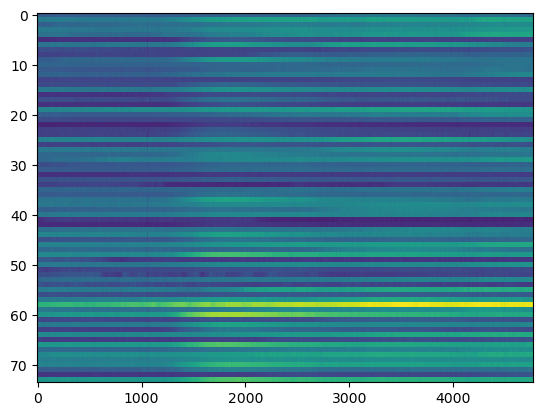

In [602]:
plt.imshow(CY_r_matched_raw, interpolation='nearest', aspect='auto')

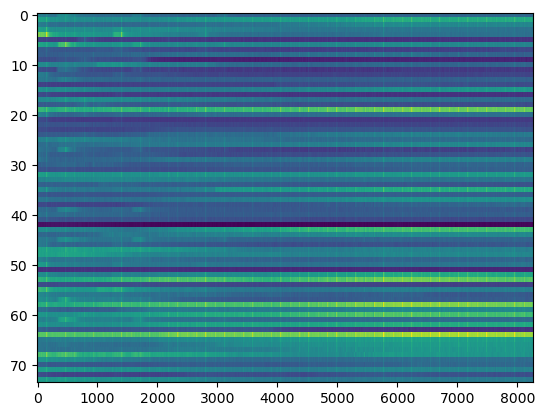

In [603]:
plt.imshow(CY_m_matched_raw, interpolation='nearest', aspect='auto')

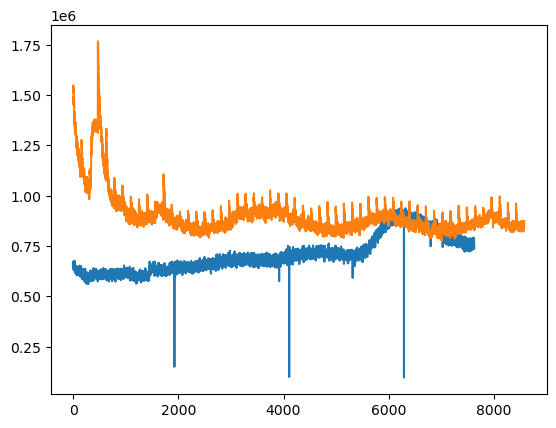

In [20]:
j=29
plt.plot(CY_r_matched_raw[np.argsort(rises),...][j,...].T)
plt.plot(CY_m_matched_raw[np.argsort(rises),...][j,...].T)

In [609]:
#r sort
rises = list()
for id in trange(CY_r_matched_raw.shape[0]):
    sig_r = CY_r_matched_raw[id,...].T
    sav_test_r = sg.savgol_filter(sig_r,30,1,deriv=1)
    #rises.append(np.min(np.where(sav_test_m[:30,] == np.max(sav_test_m[:30,]))))
    rises.append(np.min(np.where(sav_test_r == np.max(sav_test_r))))

  0%|          | 0/74 [00:00<?, ?it/s]

In [613]:
#m sort
rises = list()
for id in trange(CY_m_matched_raw.shape[0]):
    sig_m = CY_m_matched_raw[id,...].T
    sav_test_m = sg.savgol_filter(sig_m,30,1,deriv=1)
    #rises.append(np.min(np.where(sav_test_m[:30,] == np.max(sav_test_m[:30,]))))
    rises.append(np.min(np.where(sav_test_m == np.max(sav_test_m))))

  0%|          | 0/74 [00:00<?, ?it/s]

In [626]:
CY_m_matched_raw_sort = np.sort(CY_m_matched_raw,axis=1)
CY_m_matched_raw_b10 = np.mean(CY_m_matched_raw_sort[:,:int(np.ceil(CY_m_matched_raw_sort.shape[1]/10))],axis=1) # bottom 10% mean
CY_m_matched_raw_t10 = np.mean(CY_m_matched_raw_sort[:,-int(np.ceil(CY_m_matched_raw_sort.shape[1]/10)):],axis=1) # top 10% mean

CY_r_matched_raw_sort = np.sort(CY_r_matched_raw,axis=1)
CY_r_matched_raw_b10 = np.mean(CY_r_matched_raw_sort[:,:int(np.ceil(CY_r_matched_raw_sort.shape[1]/10))],axis=1) # bottom 10% mean
CY_r_matched_raw_t10 = np.mean(CY_r_matched_raw_sort[:,-int(np.ceil(CY_r_matched_raw_sort.shape[1]/10)):],axis=1) # top 10% mean

CY_r_matched_raw_norm1 = ((CY_r_matched_raw.T-CY_r_matched_raw_b10)/(CY_r_matched_raw_t10-CY_r_matched_raw_b10)).T
CY_m_matched_raw_norm1 = ((CY_m_matched_raw.T-CY_m_matched_raw_b10)/(CY_m_matched_raw_t10-CY_m_matched_raw_b10)).T

CY_r_matched_raw_dff = ((CY_r_matched_raw.T-CY_r_matched_raw_b10)/(CY_r_matched_raw_b10)).T
CY_m_matched_raw_dff = ((CY_m_matched_raw.T-CY_m_matched_raw_b10)/(CY_m_matched_raw_b10)).T

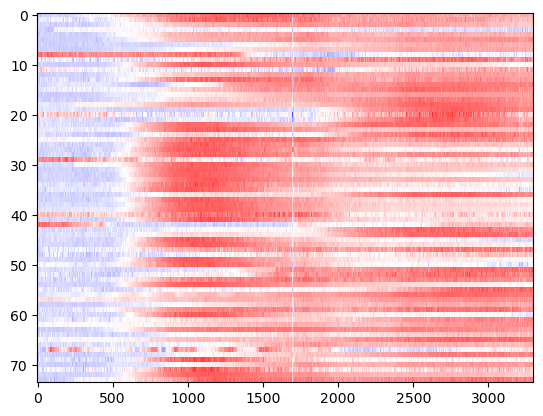

In [653]:
plt.imshow(CY_r_matched_raw_norm1[np.argsort(rises),750:4050], interpolation='nearest', aspect='auto',cmap='bwr',vmin=-1,vmax=1.5)#,vmax=vm)

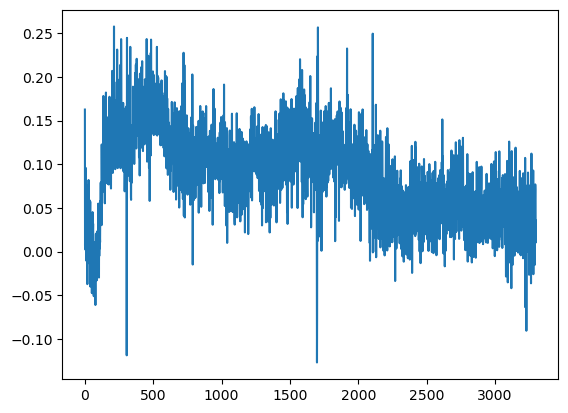

In [651]:
plt.plot(CY_r_matched_raw_dff[np.argsort(rises),750:4050][3,].T)

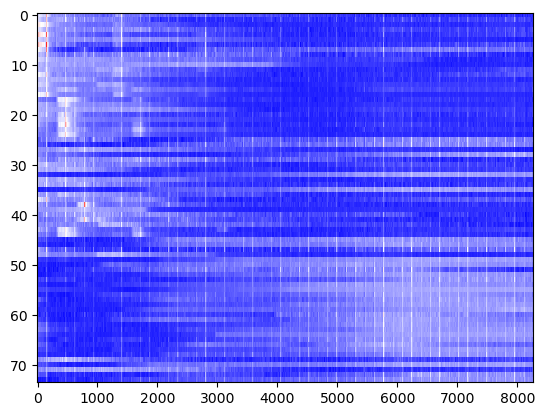

In [636]:
plt.imshow(CY_m_matched_raw_norm1[np.argsort(rises),...], interpolation='nearest', aspect='auto',cmap='bwr')#,vmax=vm)

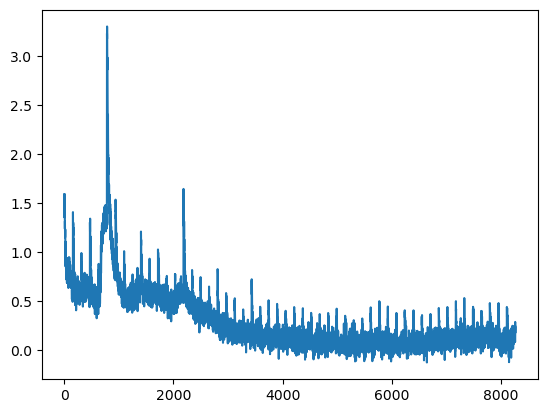

In [624]:
plt.plot(CY_m_matched_raw_norm1[np.argsort(rises),...][38,].T)

[[-1  0  1  2  3]
 [34 21  4  9  6]]


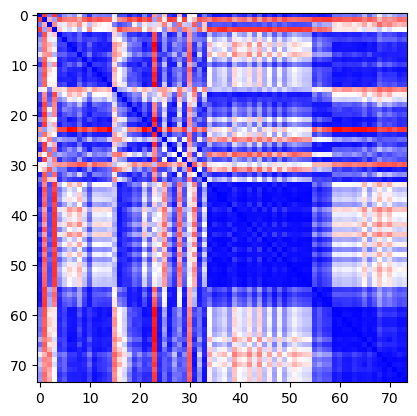

In [656]:
from sklearn.cluster import HDBSCAN
from scipy.spatial.distance import pdist,squareform
hdbs_invivo = HDBSCAN(min_cluster_size = 3,metric='precomputed')#,cluster_selection_method='leaf')
hdbs_invivo.fit(squareform(pdist(CY_r_matched_raw_norm1[np.argsort(rises),750:4050],'correlation')))
#hdbs.fit(savs_nc)
lcounts_invivo = np.array(np.unique(hdbs_invivo.labels_, return_counts=True))
print(lcounts_invivo)
plt.imshow(squareform(pdist(CY_r_matched_raw_norm1[np.argsort(rises),750:4050][np.argsort(hdbs_invivo.labels_),...],'correlation')), interpolation='nearest',cmap='bwr')

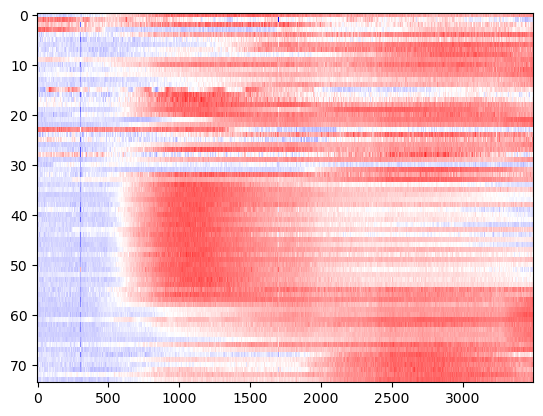

In [693]:
plt.imshow(CY_r_matched_raw_norm1[np.argsort(rises),750:4250][np.argsort(hdbs_invivo.labels_),...], interpolation='nearest', aspect='auto',cmap='bwr',vmin=-1,vmax=1.5)#,vmax=vm)

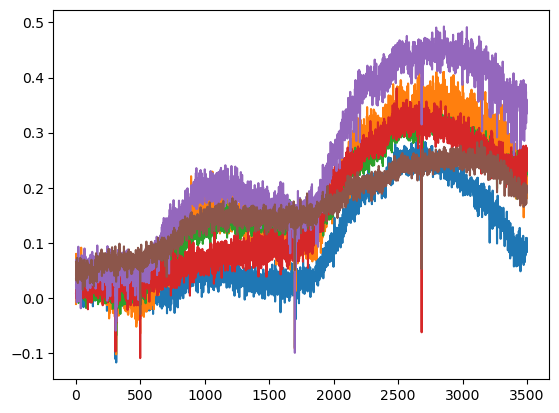

In [707]:
c = 3
plt.plot(CY_r_matched_raw_dff[np.argsort(rises),750:4250][hdbs_invivo.labels_==c,...].T)

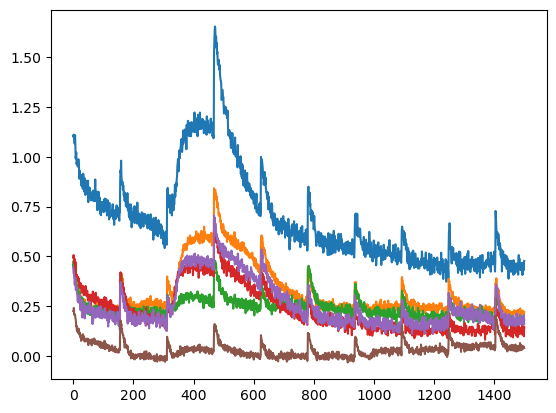

In [704]:
plt.plot(CY_m_matched_raw_dff[np.argsort(rises),:1500][hdbs_invivo.labels_==c,...].T)

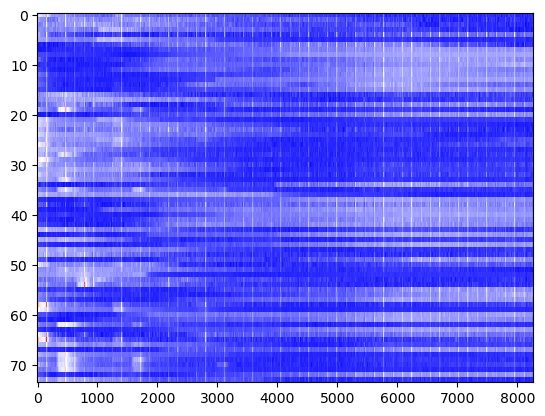

In [702]:
plt.imshow(CY_m_matched_raw_norm1[np.argsort(rises),...][np.argsort(hdbs_invivo.labels_),...], interpolation='nearest', aspect='auto',cmap='bwr')#,vmax=vm)

In [637]:
#r sort
savs_nc = list()
for id in trange(CY_r_matched_raw_norm1.shape[0]):
    sig_r = CY_r_matched_raw_norm1[id,...].T
    savs_nc.append(sg.savgol_filter(sig_r,30,1,deriv=1))
    #rises.append(np.min(np.where(sav_test_m[:30,] == np.max(sav_test_m[:30,]))))
   #np.min(np.where(sav_test_r == np.max(sav_test_r))))
savs_nc = np.array(savs_nc)

  0%|          | 0/74 [00:00<?, ?it/s]

In [640]:
#m sort
savs_nc = list()
for id in trange(CY_m_matched_raw_norm1.shape[0]):
    #sig_r = CY_m_matched_raw_corr_norm1[id,...].T
    sig_r = CY_m_matched_raw_norm1[id,:2500].T
    savs_nc.append(sg.savgol_filter(sig_r,30,1,deriv=1))
    #rises.append(np.min(np.where(sav_test_m[:30,] == np.max(sav_test_m[:30,]))))
   #np.min(np.where(sav_test_r == np.max(sav_test_r))))
savs_nc = np.array(savs_nc)

  0%|          | 0/74 [00:00<?, ?it/s]

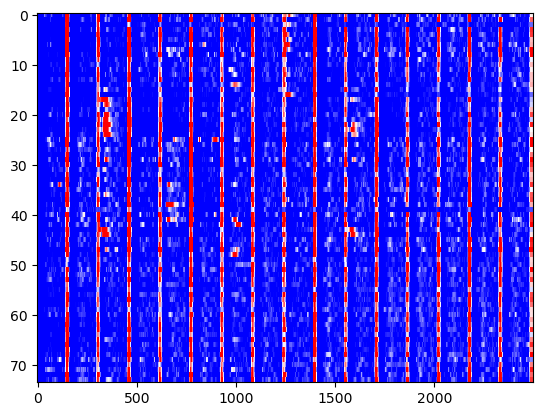

In [641]:
plt.imshow(savs_nc[np.argsort(rises),...], interpolation='nearest',aspect='auto',cmap='bwr',vmin=0,vmax=0.01)

In [2]:
# systematic pipeline for all in vivo movies, first IP AVP/OXT then multi-IP 10x
import numpy as np
movie_list_ref_invivo_ip = [r'H:\CNMFoutputs\peter\mask_matching\220311_PK24PL9_done\220311_PK24PL9_mouse_Tiara_done_qc_doneqc',
                         r'H:\CNMFoutputs\peter\mask_matching\220408_PK27PL20_done\220408_PK27PL20_mouse_maddy_done_qc_done',
                         r'H:\CNMFoutputs\peter\mask_matching\220427_PK27PL20_done\220427_PK27PL20_mouse_Tiara_done_qc_doneqc',
                         r'H:\CNMFoutputs\peter\mask_matching\220624_PK45PL13_done\220624_PK45PL13_mouse_Tiara_done_qc_doneqc',
                         r'H:\CNMFoutputs\peter\mask_matching\220701_PK49PL18_done\220701_PK49PL18_mouse_jordan_done_qc_doneqc',
                         r'H:\CNMFoutputs\peter\mask_matching\220903_PK63PL34_done\220903_PK63PL34_mouse_Done_qc_doneqc',
                         r'H:\CNMFoutputs\peter\mask_matching\230726_DG47PL54_done\230726_DG47PL54_mouse_jordan_done_qc_doneqc']
movie_list_mov_invivo_ip = [r'H:\CNMFoutputs\peter\mask_matching\220311_PK24PL9_done\220311_PK24PL9_wells101_Tiara_done_qc_doneqc',
                         r'H:\CNMFoutputs\peter\mask_matching\220408_PK27PL20_done\220408_PK27PL20_wells101_maddy_done_qc_done',
                         r'H:\CNMFoutputs\peter\mask_matching\220427_PK27PL20_done\220427_PK27PL20_wells101_Tiara_done_qc_doneqc',
                         r'H:\CNMFoutputs\peter\mask_matching\220624_PK45PL13_done\220624_PK45PL13_wells101_Tiara_done_qc_doneqc',
                         r'H:\CNMFoutputs\peter\mask_matching\220701_PK49PL18_done\220701_PK49PL18_wells101_jordan_done_qc_doneqc',
                         r'H:\CNMFoutputs\peter\mask_matching\220903_PK63PL34_done\220903_PK63PL34_wells101_Done_qc_doneqc',
                         r'H:\CNMFoutputs\peter\mask_matching\230726_DG47PL54_done\230726_DG47PL54_wells101_jordan_done_qc_doneqc']
n = 0 #pythonic ID
mean_factor = 52

In [3]:
# systematic pipeline for all in vivo movies, first IP AVP/OXT then multi-IP 10x
import numpy as np
movie_list_ref_invivo_10x = [r'H:\CNMFoutputs\charlotte\mask_matching\231018_DG52PL66_charlotte_done\231018_DG52PL66_mouse_Tiara_done_qc_doneqc',
                         r'H:\CNMFoutputs\peter\mask_matching\231025_DG56PL62_done\231025_DG56PL62_mouse_jordan_done_qc_doneqc',
                         r'H:\CNMFoutputs\charlotte\mask_matching\231030_DG60PL67_charlotte_done\231030_DG60PL67_mouse_Yael_Done_qc_doneqc',
                         r'H:\CNMFoutputs\peter\mask_matching\231105_DG39PL32_done\231105_DG39PL32_mouse_maddy_done_qc_done',
                         r'H:\CNMFoutputs\charlotte\mask_matching\231107_DG44PL58_charlotte_done\231107_DG44PL58_mouse_maddy_done_qc_done']
movie_list_mov_invivo_10x = [r'H:\CNMFoutputs\charlotte\mask_matching\231018_DG52PL66_charlotte_done\231018_DG52PL66_wells101_Tiara_done_qc_doneqc',
                         r'H:\CNMFoutputs\peter\mask_matching\231025_DG56PL62_done\231025_DG56PL62_wells_jordan_done_qc_done',
                         r'H:\CNMFoutputs\charlotte\mask_matching\231030_DG60PL67_charlotte_done\231030_DG60PL67_wells_maddy_done_qc_done',
                         r'H:\CNMFoutputs\peter\mask_matching\231105_DG39PL32_done\231105_DG39PL32_wells_maddy_done_qc_done',
                         r'H:\CNMFoutputs\charlotte\mask_matching\231107_DG44PL58_charlotte_done\231107_DG44PL58_wells_david_done_qc_doneqc']
n = 0 #pythonic ID
mean_factor = 52

In [4]:
%%time
# All set up for merged_refit files! Remember to adjust for raw
## LOADING EVERYTHING UP - TAKES ~20 sec

# load packages

import napari
from magicgui import magicgui, widgets
import time
from sklearn.cluster import HDBSCAN
from scipy.spatial.distance import pdist,squareform
from itertools import chain


from IPython import get_ipython
from IPython.display import clear_output
import os
import matplotlib.pyplot as plt
from scipy.sparse import csc_matrix
from scipy import signal as sg
from scipy.ndimage import center_of_mass
import scipy
import pickle

from tifffile.tifffile import imwrite,imread
from tqdm.auto import tqdm,trange

from copy import deepcopy
import h5py

import caiman as cm
from caiman.source_extraction.cnmf import cnmf,params
from caiman.paths import caiman_datadir
from caiman.utils.visualization import get_contours

try:
    if __IPYTHON__:
        get_ipython().run_line_magic('load_ext', 'autoreload')
        get_ipython().run_line_magic('autoreload', '2')
except NameError:
    pass

def load_pickle(file_path):
    """
    Load a dictionary from a pickle file.

    Args:
    - file_path (str): Path to the pickle file.

    Returns:
    - dict: Loaded dictionary.
    """
    with open(file_path, 'rb') as f:
        data = pickle.load(f)
    return data
    

from joblib import Parallel, delayed
from joblib.externals.loky import get_reusable_executor

import contextlib
import joblib
from tqdm import tqdm

n_cores = 35

@contextlib.contextmanager
def tqdm_joblib(tqdm_object):
    """Context manager to patch joblib to report into tqdm progress bar given as argument"""
    class TqdmBatchCompletionCallback(joblib.parallel.BatchCompletionCallBack):
        def __call__(self, *args, **kwargs):
            tqdm_object.update(n=self.batch_size)
            return super().__call__(*args, **kwargs)

    old_batch_callback = joblib.parallel.BatchCompletionCallBack
    joblib.parallel.BatchCompletionCallBack = TqdmBatchCompletionCallback
    try:
        yield tqdm_object
    finally:
        joblib.parallel.BatchCompletionCallBack = old_batch_callback
        tqdm_object.close()

CPU times: total: 14.8 s
Wall time: 16.6 s


In [5]:
cnmf_dicts_invivo_ip = []

for l in trange(len(movie_list_ref_invivo_ip)):
    base_dir = os.path.split(movie_list_ref_invivo_ip[l])[0]

    cnmf_dict = {
        'base_dir': base_dir,
        'cnmf_ref_path': os.path.join(movie_list_ref_invivo_ip[l], 'ch0_means_movie_nobg_cnmf_merged_refit.hdf5'),
        'cnmf_ref': list(),
        'spcomps_ref': list(),
        'CY_ref': list(),
        'cnmf_mov_path': os.path.join(movie_list_mov_invivo_ip[l], 'ch0_means_movie_nobg_cnmf_merged_refit.hdf5'),
        'cnmf_mov': list(),
        'spcomps_mov': list(),
        'CY_mov': list(),
        'cnmf_ref_matched_path': list(),
        'cnmf_ref_matched': list(),
        'spcomps_ref_matched': list(),
        'CY_ref_matched': list(),
        'cnmf_mov_matched_path': list(),
        'cnmf_movov_matched': list(),
        'spcomps_m_matched': list(),
        'CY_mov_matched': list(),
        'cnmf_ref_matched_path_raw': list(),
        'cnmf_ref_matched_raw': list(),
        'spcomps_ref_matched_raw': list(),
        'CY_ref_matched_raw': list(),
        'cnmf_mov_matched_path_raw': list(),
        'cnmf_mov_matched_raw': list(),
        'spcomps_mov_matched_raw': list(),
        'CY_mov_matched_raw': list()
    }
    
    cnmf_dict['cnmf_ref_matched_path'] = os.path.join(movie_list_ref_invivo_ip[l], f'ch0_means_movie_nobg_cnmf_merged_refit_matched.hdf5')
    cnmf_dict['cnmf_mov_matched_path'] = os.path.join(movie_list_mov_invivo_ip[l], f'ch0_means_movie_nobg_cnmf_merged_refit_matched.hdf5')
    cnmf_dict['cnmf_ref_matched_path_raw'] = os.path.join(movie_list_ref_invivo_ip[l], f'ch0_means_movie_nobg_cnmf_mr_raw_refit_matched.hdf5')
    cnmf_dict['cnmf_mov_matched_path_raw'] = os.path.join(movie_list_mov_invivo_ip[l], f'ch0_means_movie_nobg_cnmf_mr_raw_refit_matched.hdf5')
    
    # CNMFE model
    cnmf_dict['cnmf_ref'] = cnmf.load_CNMF(cnmf_dict['cnmf_ref_path'], 
                                n_processes=1,
                                dview=None)
    cnmf_dict['cnmf_mov'] = cnmf.load_CNMF(cnmf_dict['cnmf_mov_path'], 
                                n_processes=1,
                                dview=None)
    
    # Line up all static inputs
    cnmf_dict['spcomps_ref'] = np.reshape(cnmf_dict['cnmf_ref'].estimates.A.toarray(),cnmf_dict['cnmf_ref'].estimates.dims + (-1,),order='F')
    cnmf_dict['spcomps_ref'] = cnmf_dict['spcomps_ref'].transpose([3,2,0,1]).astype(np.float32)
    cnmf_dict['CY_ref'] = cnmf_dict['cnmf_ref'].estimates.C + cnmf_dict['cnmf_ref'].estimates.YrA # temporal loadings
    cnmf_dict['spcomps_mov'] = np.reshape(cnmf_dict['cnmf_mov'].estimates.A.toarray(),cnmf_dict['cnmf_mov'].estimates.dims + (-1,),order='F')
    cnmf_dict['spcomps_mov'] = cnmf_dict['spcomps_mov'].transpose([3,2,0,1]).astype(np.float32)
    cnmf_dict['CY_mov'] = cnmf_dict['cnmf_mov'].estimates.C + cnmf_dict['cnmf_mov'].estimates.YrA # temporal loadings
    print(f"Successfully loaded merged/refit CNMF model")
    
    # CNMFE model
    cnmf_dict['cnmf_ref_matched'] = cnmf.load_CNMF(cnmf_dict['cnmf_ref_matched_path'], 
                                n_processes=1,
                                dview=None)
    cnmf_dict['cnmf_mov_matched'] = cnmf.load_CNMF(cnmf_dict['cnmf_mov_matched_path'], 
                                n_processes=1,
                                dview=None)
    
    # Line up all static inputs
    cnmf_dict['spcomps_ref_matched'] = np.reshape(cnmf_dict['cnmf_ref_matched'].estimates.A.toarray(),cnmf_dict['cnmf_ref_matched'].estimates.dims + (-1,),order='F')
    cnmf_dict['spcomps_ref_matched'] = cnmf_dict['spcomps_ref_matched'].transpose([3,2,0,1]).astype(np.float32)
    cnmf_dict['CY_ref_matched'] = cnmf_dict['cnmf_ref_matched'].estimates.C + cnmf_dict['cnmf_ref_matched'].estimates.YrA # temporal loadings
    cnmf_dict['spcomps_mov_matched'] = np.reshape(cnmf_dict['cnmf_mov_matched'].estimates.A.toarray(),cnmf_dict['cnmf_mov_matched'].estimates.dims + (-1,),order='F')
    cnmf_dict['spcomps_mov_matched'] = cnmf_dict['spcomps_mov_matched'].transpose([3,2,0,1]).astype(np.float32)
    cnmf_dict['CY_mov_matched'] = cnmf_dict['cnmf_mov_matched'].estimates.C + cnmf_dict['cnmf_mov_matched'].estimates.YrA # temporal loadings
    print(f"Successfully loaded matched CNMF model")
    
    # CNMFE model
    cnmf_dict['cnmf_ref_matched_raw'] = cnmf.load_CNMF(cnmf_dict['cnmf_ref_matched_path_raw'], 
                                n_processes=1,
                                dview=None)
    cnmf_dict['cnmf_mov_matched_raw'] = cnmf.load_CNMF(cnmf_dict['cnmf_mov_matched_path_raw'], 
                                n_processes=1,
                                dview=None)
    
    # Line up all static inputs
    cnmf_dict['spcomps_ref_matched_raw'] = np.reshape(cnmf_dict['cnmf_ref_matched_raw'].estimates.A.toarray(),cnmf_dict['cnmf_ref_matched_raw'].estimates.dims + (-1,),order='F')
    cnmf_dict['spcomps_ref_matched_raw'] = cnmf_dict['spcomps_ref_matched_raw'].transpose([3,2,0,1]).astype(np.float32)
    cnmf_dict['CY_ref_matched_raw'] = cnmf_dict['cnmf_ref_matched_raw'].estimates.C + cnmf_dict['cnmf_ref_matched_raw'].estimates.YrA # temporal loadings
    cnmf_dict['spcomps_mov_matched_raw'] = np.reshape(cnmf_dict['cnmf_mov_matched_raw'].estimates.A.toarray(),cnmf_dict['cnmf_mov_matched_raw'].estimates.dims + (-1,),order='F')
    cnmf_dict['spcomps_mov_matched_raw'] = cnmf_dict['spcomps_mov_matched_raw'].transpose([3,2,0,1]).astype(np.float32)
    cnmf_dict['CY_mov_matched_raw'] = cnmf_dict['cnmf_mov_matched_raw'].estimates.C + cnmf_dict['cnmf_mov_matched_raw'].estimates.YrA # temporal loadings
    print(f"Successfully loaded matched raw CNMF model")

    cnmf_dicts_invivo_ip.append(cnmf_dict)

  0%|          | 0/7 [00:00<?, ?it/s]

Successfully loaded merged/refit CNMF model
Successfully loaded matched CNMF model
Successfully loaded matched raw CNMF model
Successfully loaded merged/refit CNMF model
Successfully loaded matched CNMF model
Successfully loaded matched raw CNMF model
Successfully loaded merged/refit CNMF model
Successfully loaded matched CNMF model
Successfully loaded matched raw CNMF model
Successfully loaded merged/refit CNMF model
Successfully loaded matched CNMF model
Successfully loaded matched raw CNMF model
Successfully loaded merged/refit CNMF model
Successfully loaded matched CNMF model
Successfully loaded matched raw CNMF model
Successfully loaded merged/refit CNMF model
Successfully loaded matched CNMF model
Successfully loaded matched raw CNMF model
Successfully loaded merged/refit CNMF model
Successfully loaded matched CNMF model
Successfully loaded matched raw CNMF model


In [6]:
cnmf_dicts_invivo_10x = []

for l in trange(len(movie_list_ref_invivo_10x)):
    base_dir = os.path.split(movie_list_ref_invivo_10x[l])[0]

    cnmf_dict = {
        'base_dir': base_dir,
        'cnmf_ref_path': os.path.join(movie_list_ref_invivo_10x[l], 'ch0_means_movie_nobg_cnmf_merged_refit.hdf5'),
        'cnmf_ref': list(),
        'spcomps_ref': list(),
        'CY_ref': list(),
        'cnmf_mov_path': os.path.join(movie_list_mov_invivo_10x[l], 'ch0_means_movie_nobg_cnmf_merged_refit.hdf5'),
        'cnmf_mov': list(),
        'spcomps_mov': list(),
        'CY_mov': list(),
        'cnmf_ref_matched_path': list(),
        'cnmf_ref_matched': list(),
        'spcomps_ref_matched': list(),
        'CY_ref_matched': list(),
        'cnmf_mov_matched_path': list(),
        'cnmf_movov_matched': list(),
        'spcomps_m_matched': list(),
        'CY_mov_matched': list(),
        'cnmf_ref_matched_path_raw': list(),
        'cnmf_ref_matched_raw': list(),
        'spcomps_ref_matched_raw': list(),
        'CY_ref_matched_raw': list(),
        'cnmf_mov_matched_path_raw': list(),
        'cnmf_mov_matched_raw': list(),
        'spcomps_mov_matched_raw': list(),
        'CY_mov_matched_raw': list()
    }
    
    cnmf_dict['cnmf_ref_matched_path'] = os.path.join(movie_list_ref_invivo_10x[l], f'ch0_means_movie_nobg_cnmf_merged_refit_matched.hdf5')
    cnmf_dict['cnmf_mov_matched_path'] = os.path.join(movie_list_mov_invivo_10x[l], f'ch0_means_movie_nobg_cnmf_merged_refit_matched.hdf5')
    cnmf_dict['cnmf_ref_matched_path_raw'] = os.path.join(movie_list_ref_invivo_10x[l], f'ch0_means_movie_nobg_cnmf_mr_raw_refit_matched.hdf5')
    cnmf_dict['cnmf_mov_matched_path_raw'] = os.path.join(movie_list_mov_invivo_10x[l], f'ch0_means_movie_nobg_cnmf_mr_raw_refit_matched.hdf5')
    
    # CNMFE model
    cnmf_dict['cnmf_ref'] = cnmf.load_CNMF(cnmf_dict['cnmf_ref_path'], 
                                n_processes=1,
                                dview=None)
    cnmf_dict['cnmf_mov'] = cnmf.load_CNMF(cnmf_dict['cnmf_mov_path'], 
                                n_processes=1,
                                dview=None)
    
    # Line up all static inputs
    cnmf_dict['spcomps_ref'] = np.reshape(cnmf_dict['cnmf_ref'].estimates.A.toarray(),cnmf_dict['cnmf_ref'].estimates.dims + (-1,),order='F')
    cnmf_dict['spcomps_ref'] = cnmf_dict['spcomps_ref'].transpose([3,2,0,1]).astype(np.float32)
    cnmf_dict['CY_ref'] = cnmf_dict['cnmf_ref'].estimates.C + cnmf_dict['cnmf_ref'].estimates.YrA # temporal loadings
    cnmf_dict['spcomps_mov'] = np.reshape(cnmf_dict['cnmf_mov'].estimates.A.toarray(),cnmf_dict['cnmf_mov'].estimates.dims + (-1,),order='F')
    cnmf_dict['spcomps_mov'] = cnmf_dict['spcomps_mov'].transpose([3,2,0,1]).astype(np.float32)
    cnmf_dict['CY_mov'] = cnmf_dict['cnmf_mov'].estimates.C + cnmf_dict['cnmf_mov'].estimates.YrA # temporal loadings
    print(f"Successfully loaded merged/refit CNMF model")
    
    # CNMFE model
    cnmf_dict['cnmf_ref_matched'] = cnmf.load_CNMF(cnmf_dict['cnmf_ref_matched_path'], 
                                n_processes=1,
                                dview=None)
    cnmf_dict['cnmf_mov_matched'] = cnmf.load_CNMF(cnmf_dict['cnmf_mov_matched_path'], 
                                n_processes=1,
                                dview=None)
    
    # Line up all static inputs
    cnmf_dict['spcomps_ref_matched'] = np.reshape(cnmf_dict['cnmf_ref_matched'].estimates.A.toarray(),cnmf_dict['cnmf_ref_matched'].estimates.dims + (-1,),order='F')
    cnmf_dict['spcomps_ref_matched'] = cnmf_dict['spcomps_ref_matched'].transpose([3,2,0,1]).astype(np.float32)
    cnmf_dict['CY_ref_matched'] = cnmf_dict['cnmf_ref_matched'].estimates.C + cnmf_dict['cnmf_ref_matched'].estimates.YrA # temporal loadings
    cnmf_dict['spcomps_mov_matched'] = np.reshape(cnmf_dict['cnmf_mov_matched'].estimates.A.toarray(),cnmf_dict['cnmf_mov_matched'].estimates.dims + (-1,),order='F')
    cnmf_dict['spcomps_mov_matched'] = cnmf_dict['spcomps_mov_matched'].transpose([3,2,0,1]).astype(np.float32)
    cnmf_dict['CY_mov_matched'] = cnmf_dict['cnmf_mov_matched'].estimates.C + cnmf_dict['cnmf_mov_matched'].estimates.YrA # temporal loadings
    print(f"Successfully loaded matched CNMF model")
    
    # CNMFE model
    cnmf_dict['cnmf_ref_matched_raw'] = cnmf.load_CNMF(cnmf_dict['cnmf_ref_matched_path_raw'], 
                                n_processes=1,
                                dview=None)
    cnmf_dict['cnmf_mov_matched_raw'] = cnmf.load_CNMF(cnmf_dict['cnmf_mov_matched_path_raw'], 
                                n_processes=1,
                                dview=None)
    
    # Line up all static inputs
    cnmf_dict['spcomps_ref_matched_raw'] = np.reshape(cnmf_dict['cnmf_ref_matched_raw'].estimates.A.toarray(),cnmf_dict['cnmf_ref_matched_raw'].estimates.dims + (-1,),order='F')
    cnmf_dict['spcomps_ref_matched_raw'] = cnmf_dict['spcomps_ref_matched_raw'].transpose([3,2,0,1]).astype(np.float32)
    cnmf_dict['CY_ref_matched_raw'] = cnmf_dict['cnmf_ref_matched_raw'].estimates.C + cnmf_dict['cnmf_ref_matched_raw'].estimates.YrA # temporal loadings
    cnmf_dict['spcomps_mov_matched_raw'] = np.reshape(cnmf_dict['cnmf_mov_matched_raw'].estimates.A.toarray(),cnmf_dict['cnmf_mov_matched_raw'].estimates.dims + (-1,),order='F')
    cnmf_dict['spcomps_mov_matched_raw'] = cnmf_dict['spcomps_mov_matched_raw'].transpose([3,2,0,1]).astype(np.float32)
    cnmf_dict['CY_mov_matched_raw'] = cnmf_dict['cnmf_mov_matched_raw'].estimates.C + cnmf_dict['cnmf_mov_matched_raw'].estimates.YrA # temporal loadings
    print(f"Successfully loaded matched raw CNMF model")

    cnmf_dicts_invivo_10x.append(cnmf_dict)

  0%|          | 0/5 [00:00<?, ?it/s]

Successfully loaded merged/refit CNMF model
Successfully loaded matched CNMF model
Successfully loaded matched raw CNMF model
Successfully loaded merged/refit CNMF model
Successfully loaded matched CNMF model
Successfully loaded matched raw CNMF model
Successfully loaded merged/refit CNMF model
Successfully loaded matched CNMF model
Successfully loaded matched raw CNMF model
Successfully loaded merged/refit CNMF model
Successfully loaded matched CNMF model
Successfully loaded matched raw CNMF model
Successfully loaded merged/refit CNMF model
Successfully loaded matched CNMF model
Successfully loaded matched raw CNMF model


In [7]:
# rises on dipping for now
for l in trange(len(movie_list_ref_invivo_ip)):
    rises = list()
    for id in range(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw'].shape[0]):
        sig_r = cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw'][id,...].T
        sav_test_r = sg.savgol_filter(sig_r,30,1,deriv=1)
        #rises.append(np.min(np.where(sav_test_m[:30,] == np.max(sav_test_m[:30,]))))
        rises.append(np.min(np.where(sav_test_r == np.max(sav_test_r))))
    cnmf_dicts_invivo_ip[l]['rises'] = rises

  0%|          | 0/7 [00:00<?, ?it/s]

In [8]:
# rises on dipping for now
for l in trange(len(movie_list_ref_invivo_10x)):
    rises = list()
    for id in range(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw'].shape[0]):
        sig_r = cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw'][id,...].T
        sav_test_r = sg.savgol_filter(sig_r,30,1,deriv=1)
        #rises.append(np.min(np.where(sav_test_m[:30,] == np.max(sav_test_m[:30,]))))
        rises.append(np.min(np.where(sav_test_r == np.max(sav_test_r))))
    cnmf_dicts_invivo_10x[l]['rises'] = rises

  0%|          | 0/5 [00:00<?, ?it/s]

In [9]:
for l in trange(len(movie_list_ref_invivo_ip)):
    cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_sort'] = np.sort(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw'],axis=1)
    cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_b10'] = np.mean(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_sort'][:,:int(np.ceil(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_sort'].shape[1]/10))],axis=1) # bottom 10% mean
    cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_t10'] = np.mean(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_sort'][:,-int(np.ceil(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_sort'].shape[1]/10)):],axis=1) # top 10% mean

    cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'] = ((cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw'].T-cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_b10'])/(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_b10'])).T
    cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_norm1'] = ((cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw'].T-cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_b10'])/(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_t10']-cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_b10'])).T
    
    cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_sort'] = np.sort(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw'],axis=1)
    cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_b10'] = np.mean(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_sort'][:,:int(np.ceil(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_sort'].shape[1]/10))],axis=1) # bottom 10% mean
    cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_t10'] = np.mean(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_sort'][:,-int(np.ceil(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_sort'].shape[1]/10)):],axis=1) # top 10% mean

    cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_dff'] = ((cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw'].T-cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_b10'])/(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_b10'])).T
    cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_norm1'] = ((cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw'].T-cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_b10'])/(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_t10']-cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_b10'])).T

  0%|          | 0/7 [00:00<?, ?it/s]

In [10]:
for l in trange(len(movie_list_ref_invivo_10x)):
    cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_sort'] = np.sort(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw'],axis=1)
    cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_b10'] = np.mean(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_sort'][:,:int(np.ceil(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_sort'].shape[1]/10))],axis=1) # bottom 10% mean
    cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_t10'] = np.mean(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_sort'][:,-int(np.ceil(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_sort'].shape[1]/10)):],axis=1) # top 10% mean

    cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'] = ((cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw'].T-cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_b10'])/(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_b10'])).T
    cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_norm1'] = ((cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw'].T-cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_b10'])/(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_t10']-cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_b10'])).T
    
    cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_sort'] = np.sort(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw'],axis=1)
    cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_b10'] = np.mean(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_sort'][:,:int(np.ceil(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_sort'].shape[1]/10))],axis=1) # bottom 10% mean
    cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_t10'] = np.mean(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_sort'][:,-int(np.ceil(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_sort'].shape[1]/10)):],axis=1) # top 10% mean

    cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_dff'] = ((cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw'].T-cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_b10'])/(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_b10'])).T
    cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_norm1'] = ((cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw'].T-cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_b10'])/(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_t10']-cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_b10'])).T

  0%|          | 0/5 [00:00<?, ?it/s]

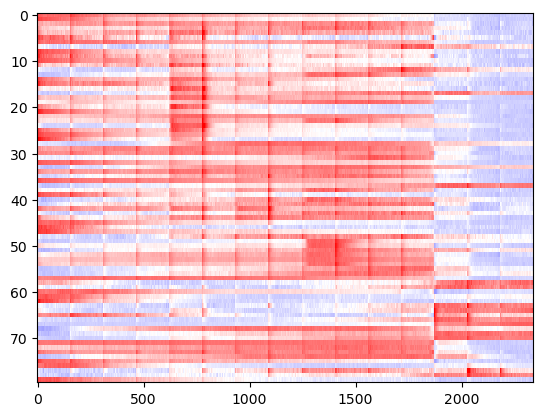

In [11]:
l = 6
plt.imshow(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_norm1'][np.argsort(cnmf_dicts_invivo_ip[l]['rises']),...], interpolation='nearest', aspect='auto',cmap='bwr',vmin=-1,vmax=1.5)

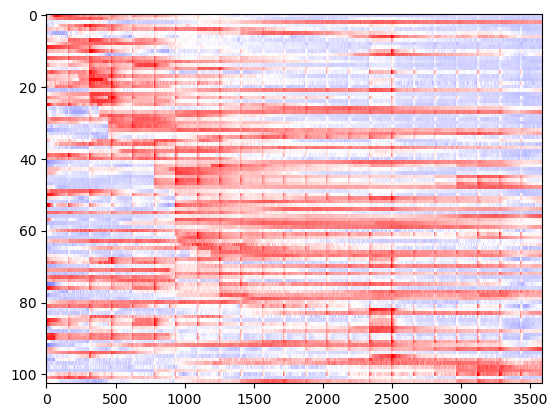

In [12]:
l = 4
plt.imshow(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_norm1'][np.argsort(cnmf_dicts_invivo_10x[l]['rises']),...], interpolation='nearest', aspect='auto',cmap='bwr',vmin=-1,vmax=1.5)

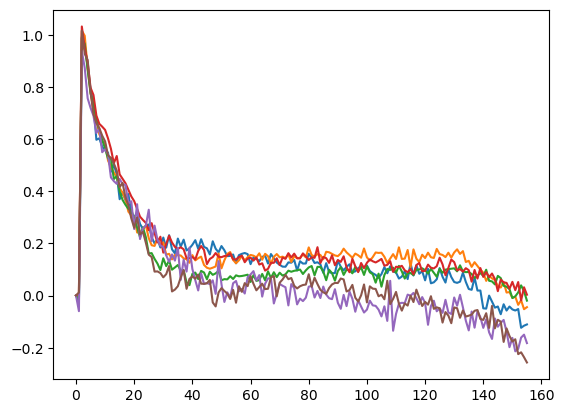

In [905]:
jump = 3*mean_factor
#for k in range(jump-2,jump*2,jump):
fit_range = np.array([0,2,6,8,9,10])
for k in list(jump-2+fit_range*jump):
    plt.plot(np.mean(((cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_norm1'][np.argsort(cnmf_dicts_invivo_ip[l]['rises']),...].T)[k:k+jump]-(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_norm1'][np.argsort(cnmf_dicts_invivo_ip[l]['rises']),...].T)[k])/((cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_norm1'][np.argsort(cnmf_dicts_invivo_ip[l]['rises']),...].T)[k+2]-np.mean((cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_norm1'][np.argsort(cnmf_dicts_invivo_ip[l]['rises']),...].T)[k-5:k],0)),1))

In [13]:
# shoot for 8 dips to average across (arbitrary value)
fit_ranges_ip = [np.array([0,3,4,9,11,13,15,17,18,19]),
              np.array([0,2,4,6,8,11,12,14,15,19,20]),
              np.array([0,2,3,4,5,6,8,9,10,11,12,13,14,15,16,17,18,19,20]),
              np.array([2]),
              np.array([0,2,3,4,5,6,8,12,15,16,17,18,19,20,21,22,26]),
              np.array([0,1,4,7,12,15,17,19,20,21,22,25,26,28,29,30]),
              np.array([0,2,6,8,9,10])]

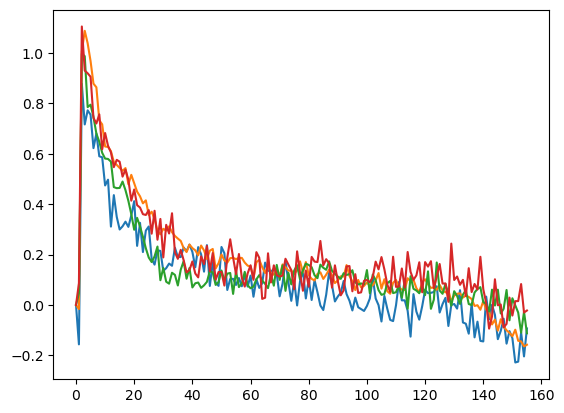

In [1523]:
jump = 3*mean_factor
#for k in range(jump-2,jump*2,jump):
fit_range = np.array([2,4,11,12])
for k in list(jump-2+fit_range*jump):
    plt.plot(np.mean(((cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_norm1'][np.argsort(cnmf_dicts_invivo_10x[l]['rises']),...].T)[k:k+jump]-(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_norm1'][np.argsort(cnmf_dicts_invivo_10x[l]['rises']),...].T)[k])/((cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_norm1'][np.argsort(cnmf_dicts_invivo_10x[l]['rises']),...].T)[k+2]-np.mean((cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_norm1'][np.argsort(cnmf_dicts_invivo_10x[l]['rises']),...].T)[k-5:k],0)),1))

In [14]:
# shoot for 8 dips to average across (arbitrary value)
fit_ranges_10x = [np.array([2,4,7,9,11,15,16,19]),
              np.array([2,3,6,7,9,10,11,12,16,17]),
              np.array([0,2,4,6,9,16,17,19]),
              np.array([0,2,4,5,6,13,19]),
              np.array([2,4,11,12])]

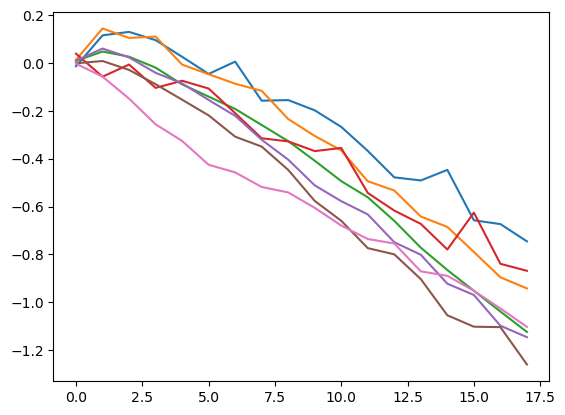

In [15]:
for l in range(len(movie_list_ref_invivo_ip)):
    a = []
    jump = 3*mean_factor
    fit_range = fit_ranges_ip[l]
    for k in list(jump-2+fit_range*jump):
        a.append(np.mean(((cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_norm1'][np.argsort(cnmf_dicts_invivo_ip[l]['rises']),...].T)[k:k+jump]-(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_norm1'][np.argsort(cnmf_dicts_invivo_ip[l]['rises']),...].T)[k])/((cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_norm1'][np.argsort(cnmf_dicts_invivo_ip[l]['rises']),...].T)[k+2]-np.mean((cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_norm1'][np.argsort(cnmf_dicts_invivo_ip[l]['rises']),...].T)[k-5:k],0)),1))
    plt.plot(np.log(np.mean(np.array(a)[:,2:20],0)))

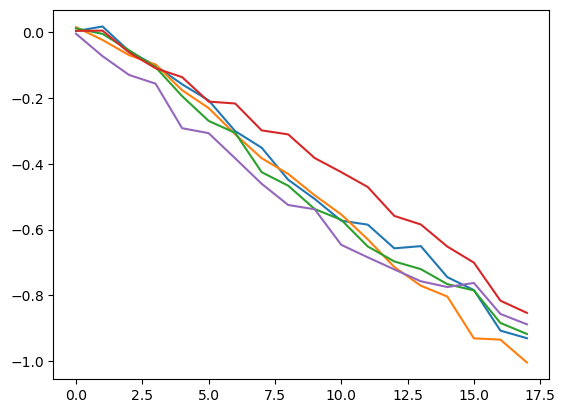

In [16]:
for l in range(len(movie_list_ref_invivo_10x)):
    a = []
    jump = 3*mean_factor
    fit_range = fit_ranges_10x[l]
    for k in list(jump-2+fit_range*jump):
        a.append(np.mean(((cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_norm1'][np.argsort(cnmf_dicts_invivo_10x[l]['rises']),...].T)[k:k+jump]-(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_norm1'][np.argsort(cnmf_dicts_invivo_10x[l]['rises']),...].T)[k])/((cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_norm1'][np.argsort(cnmf_dicts_invivo_10x[l]['rises']),...].T)[k+2]-np.mean((cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_norm1'][np.argsort(cnmf_dicts_invivo_10x[l]['rises']),...].T)[k-5:k],0)),1))
    plt.plot(np.log(np.mean(np.array(a)[:,2:20],0)))

  0%|          | 0/7 [00:00<?, ?it/s]

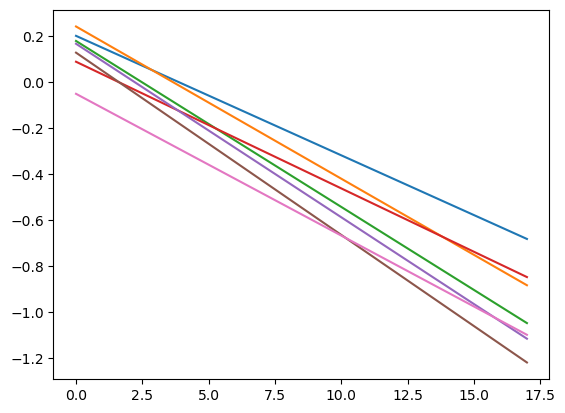

In [17]:
for l in trange(len(movie_list_ref_invivo_ip)):
    a = []
    jump = 3*mean_factor
    fit_range = fit_ranges_ip[l]
    for k in list(jump-2+fit_range*jump):
        a.append(np.mean(((cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_norm1'][np.argsort(cnmf_dicts_invivo_ip[l]['rises']),...].T)[k:k+jump]-(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_norm1'][np.argsort(cnmf_dicts_invivo_ip[l]['rises']),...].T)[k])/((cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_norm1'][np.argsort(cnmf_dicts_invivo_ip[l]['rises']),...].T)[k+2]-np.mean((cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_norm1'][np.argsort(cnmf_dicts_invivo_ip[l]['rises']),...].T)[k-5:k],0)),1))
    xa = np.arange(2,20)
    ya = np.mean(np.array(a)[:,2:20],0)
    cnmf_dicts_invivo_ip[l]['af'] = np.polyfit(xa, np.log(ya), 1)
    plt.plot(cnmf_dicts_invivo_ip[l]['af'][0]*xa+cnmf_dicts_invivo_ip[l]['af'][1])

  0%|          | 0/5 [00:00<?, ?it/s]

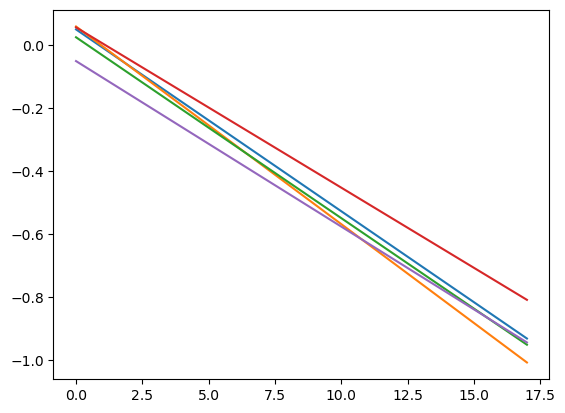

In [18]:
for l in trange(len(movie_list_ref_invivo_10x)):
    a = []
    jump = 3*mean_factor
    fit_range = fit_ranges_10x[l]
    for k in list(jump-2+fit_range*jump):
        a.append(np.mean(((cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_norm1'][np.argsort(cnmf_dicts_invivo_10x[l]['rises']),...].T)[k:k+jump]-(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_norm1'][np.argsort(cnmf_dicts_invivo_10x[l]['rises']),...].T)[k])/((cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_norm1'][np.argsort(cnmf_dicts_invivo_10x[l]['rises']),...].T)[k+2]-np.mean((cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_norm1'][np.argsort(cnmf_dicts_invivo_10x[l]['rises']),...].T)[k-5:k],0)),1))
    xa = np.arange(2,20)
    ya = np.mean(np.array(a)[:,2:20],0)
    cnmf_dicts_invivo_10x[l]['af'] = np.polyfit(xa, np.log(ya), 1)
    plt.plot(cnmf_dicts_invivo_10x[l]['af'][0]*xa+cnmf_dicts_invivo_10x[l]['af'][1])

In [19]:
for l in trange(len(movie_list_ref_invivo_ip)):
    cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_dfs'] = []
    jump = 3*mean_factor
    
    for k in range(jump-2,cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw'].shape[1]-3,jump):
        cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_dfs'].append(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw'][:,k+2]-np.mean(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw'][:,k-5:k],1))

    cnmf_dicts_invivo_ip[l]['corrbase'] = np.zeros(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw'].shape)
    for d in range(np.array(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_dfs']).shape[0]):
        cnmf_dicts_invivo_ip[l]['corrbase'][:,jump*(d+1):np.minimum(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw'].shape[1]-1,jump*(d+2)-1)] = cnmf_dicts_invivo_ip[l]['corrbase'][:,jump*(d+1):np.minimum(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw'].shape[1]-1,jump*(d+2)-1)]+np.broadcast_to(np.exp(cnmf_dicts_invivo_ip[l]['af'][0]*np.arange(0,np.minimum(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw'].shape[1]-1-jump*(d+1),jump-1))),(np.array(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_dfs']).shape[1],) + (np.minimum(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw'].shape[1]-1-jump*(d+1),jump-1),))*np.array(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_dfs'])[d,:][...,np.newaxis]

    cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr'] = cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw']-cnmf_dicts_invivo_ip[l]['corrbase']
    
    cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_sort'] = np.sort(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr'],axis=1)
    cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_b10'] = np.mean(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_sort'][:,:int(np.ceil(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_sort'].shape[1]/10))],axis=1) # bottom 10% mean
    cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_t10'] = np.mean(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_sort'][:,-int(np.ceil(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_sort'].shape[1]/10)):],axis=1) # top 10% mean
    
    cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_dff'] = ((cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr'].T-cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_b10'])/(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_b10'])).T
    cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_norm1'] = ((cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr'].T-cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_b10'])/(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_t10']-cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_b10'])).T

  0%|          | 0/7 [00:00<?, ?it/s]

In [20]:
for l in trange(len(movie_list_ref_invivo_10x)):
    cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_dfs'] = []
    jump = 3*mean_factor
    
    for k in range(jump-2,cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw'].shape[1]-3,jump):
        cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_dfs'].append(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw'][:,k+2]-np.mean(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw'][:,k-5:k],1))

    cnmf_dicts_invivo_10x[l]['corrbase'] = np.zeros(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw'].shape)
    for d in range(np.array(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_dfs']).shape[0]):
        cnmf_dicts_invivo_10x[l]['corrbase'][:,jump*(d+1):np.minimum(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw'].shape[1]-1,jump*(d+2)-1)] = cnmf_dicts_invivo_10x[l]['corrbase'][:,jump*(d+1):np.minimum(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw'].shape[1]-1,jump*(d+2)-1)]+np.broadcast_to(np.exp(cnmf_dicts_invivo_ip[l]['af'][0]*np.arange(0,np.minimum(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw'].shape[1]-1-jump*(d+1),jump-1))),(np.array(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_dfs']).shape[1],) + (np.minimum(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw'].shape[1]-1-jump*(d+1),jump-1),))*np.array(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_dfs'])[d,:][...,np.newaxis]

    cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_corr'] = cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw']-cnmf_dicts_invivo_10x[l]['corrbase']
    
    cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_corr_sort'] = np.sort(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_corr'],axis=1)
    cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_corr_b10'] = np.mean(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_corr_sort'][:,:int(np.ceil(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_corr_sort'].shape[1]/10))],axis=1) # bottom 10% mean
    cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_corr_t10'] = np.mean(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_corr_sort'][:,-int(np.ceil(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_corr_sort'].shape[1]/10)):],axis=1) # top 10% mean
    
    cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_corr_dff'] = ((cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_corr'].T-cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_corr_b10'])/(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_corr_b10'])).T
    cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_corr_norm1'] = ((cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_corr'].T-cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_corr_b10'])/(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_corr_t10']-cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_corr_b10'])).T

  0%|          | 0/5 [00:00<?, ?it/s]

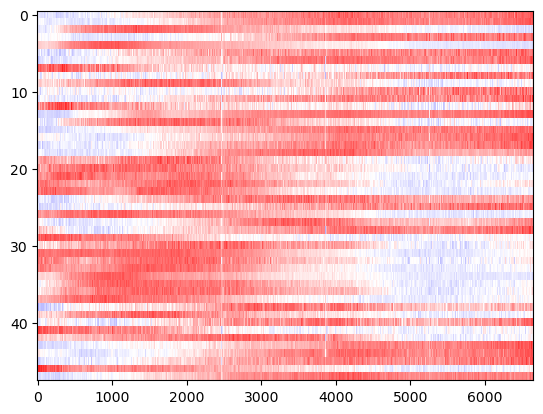

In [74]:
l = 5 #l=5, spont 5HT cells 2,4,7?
plt.imshow(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_norm1'][np.argsort(cnmf_dicts_invivo_ip[l]['rises']),...], interpolation='nearest', aspect='auto',cmap='bwr')#,vmin=-1,vmax=1.5)

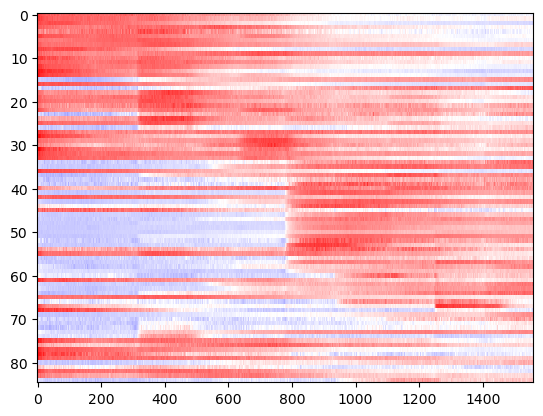

In [22]:
l = 3
plt.imshow(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_corr_norm1'][np.argsort(cnmf_dicts_invivo_10x[l]['rises']),:1560], interpolation='nearest', aspect='auto',cmap='bwr',vmin=-1,vmax=1.5)

[[-1  0  1  2  3  4]
 [11  3 39  4  3 25]]


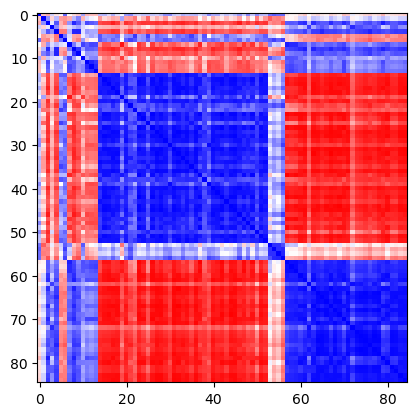

In [1548]:
from sklearn.cluster import HDBSCAN
from scipy.spatial.distance import pdist,squareform
hdbs_invivo_10x = HDBSCAN(min_cluster_size = 3,metric='precomputed')#,cluster_selection_method='leaf')
hdbs_invivo_10x.fit(squareform(pdist(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_corr_norm1'][...,:1560],'correlation'))) #[...,750:4050]
#hdbs.fit(savs_nc)
lcounts_invivo_10x = np.array(np.unique(hdbs_invivo_10x.labels_, return_counts=True))
print(lcounts_invivo_10x)
plt.imshow(squareform(pdist(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_corr_norm1'][np.argsort(hdbs_invivo_10x.labels_),:1560],'correlation')), interpolation='nearest',cmap='bwr')

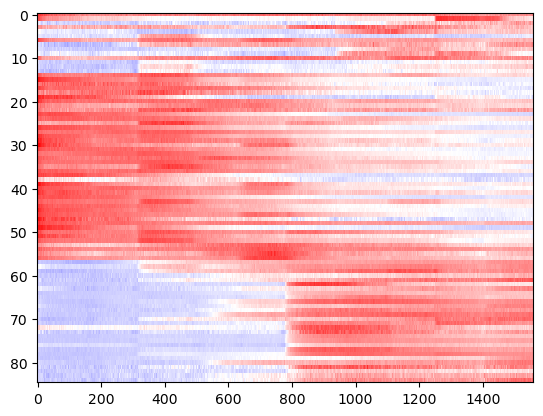

In [1549]:
plt.imshow(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_corr_norm1'][np.argsort(hdbs_invivo_10x.labels_),:1560], interpolation='nearest', aspect='auto',cmap='bwr',vmin=-1,vmax=1.5)

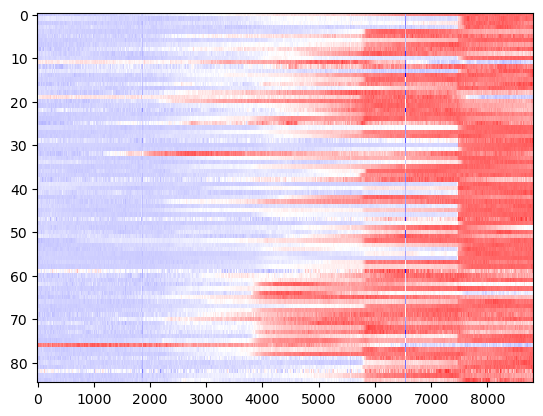

In [1550]:
plt.imshow(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_norm1'][np.argsort(hdbs_invivo_10x.labels_),...], interpolation='nearest', aspect='auto',cmap='bwr',vmin=-1,vmax=1.5)

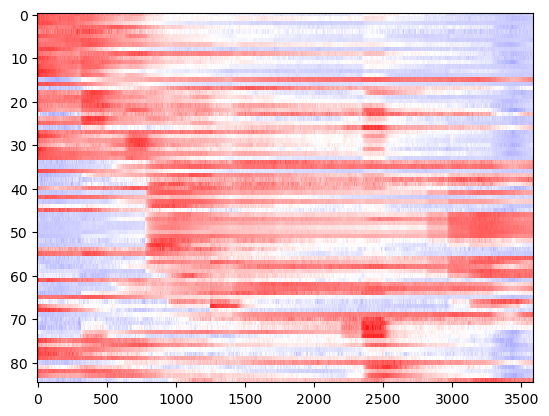

In [3188]:
l = 3
# CY_mov_matched_raw_corr_norm1
# CY_ref_matched_raw_norm1
plt.imshow(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_corr_norm1'][np.argsort(cnmf_dicts_invivo_10x[l]['rises']),...], interpolation='nearest', aspect='auto',cmap='bwr',vmin=-1,vmax=1.5)

[[-1  0  1  2  3  4]
 [11  3 39  4  3 25]]


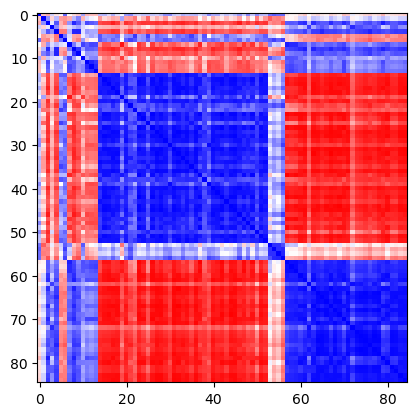

In [3189]:
from sklearn.cluster import HDBSCAN
from scipy.spatial.distance import pdist,squareform
hdbs_invivo = HDBSCAN(min_cluster_size = 3,metric='precomputed')#,cluster_selection_method='leaf')
hdbs_invivo.fit(squareform(pdist(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_corr_norm1'][...,:1560],'correlation'))) #[...,:936]
#hdbs.fit(savs_nc)
lcounts_invivo = np.array(np.unique(hdbs_invivo.labels_, return_counts=True))
print(lcounts_invivo)
plt.imshow(squareform(pdist(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_corr_norm1'][...,:1560][np.argsort(hdbs_invivo.labels_),...],'correlation')), interpolation='nearest',cmap='bwr')

[[ 0  1]
 [67  4]]


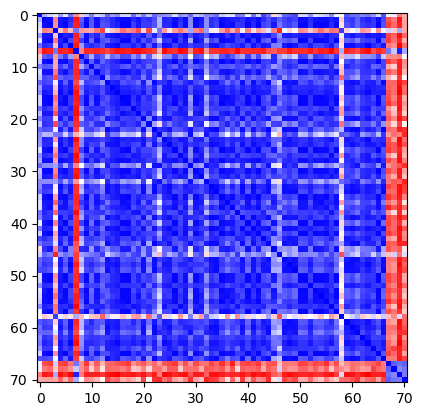

In [2596]:
from sklearn.cluster import HDBSCAN
from scipy.spatial.distance import pdist,squareform
hdbs_invivo = HDBSCAN(min_cluster_size = 3,metric='precomputed')#,cluster_selection_method='leaf')
hdbs_invivo.fit(squareform(pdist(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_norm1'],'correlation'))) #[...,750:4050]
#hdbs.fit(savs_nc)
lcounts_invivo = np.array(np.unique(hdbs_invivo.labels_, return_counts=True))
print(lcounts_invivo)
plt.imshow(squareform(pdist(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_norm1'][np.argsort(hdbs_invivo.labels_),...],'correlation')), interpolation='nearest',cmap='bwr')

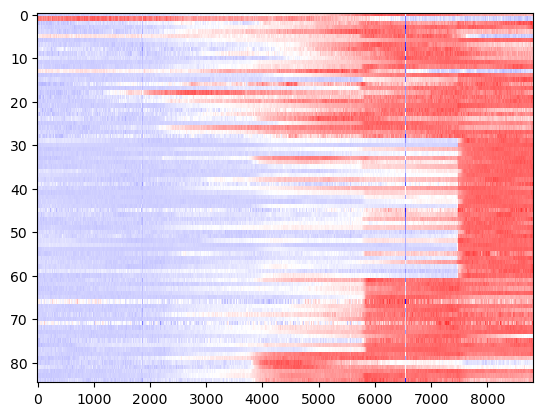

In [3195]:
plt.imshow(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_norm1'][np.argsort(hdbs_invivo_s.labels_),...], interpolation='nearest', aspect='auto',cmap='bwr',vmin=-1,vmax=1.5)#,vmax=vm) [...,750:4250]

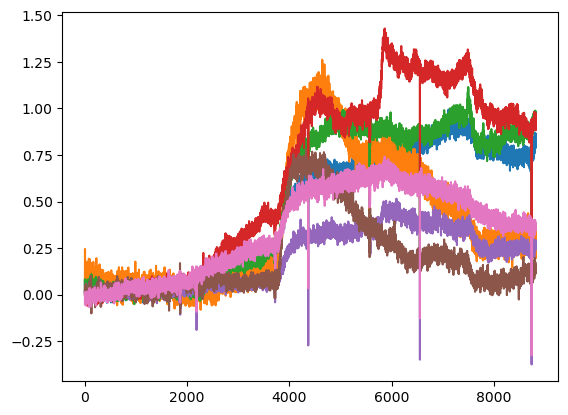

In [3197]:
c = 2
plt.plot(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][hdbs_invivo_s.labels_==c,...].T) #[...,750:4250]

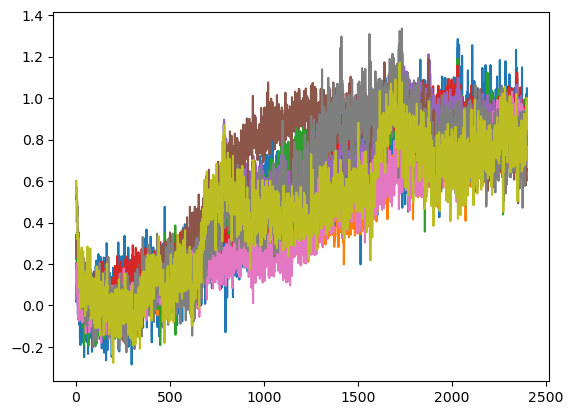

In [1332]:
plt.plot(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_norm1'][...,:2400][hdbs_invivo.labels_==c,...].T)

In [1557]:
# based on dipping, remove the following from OXT group:
oxt_rm = [6,11,12,13,16,17,18,20] 
avp_rm = None

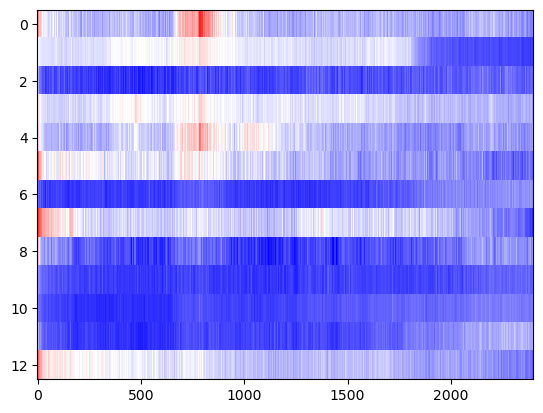

In [1582]:
plt.imshow(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_norm1'][...,:2400][hdbs_invivo.labels_==c,...][[x for x in np.arange(21).tolist() if x not in oxt_rm],...], interpolation='nearest', aspect='auto',cmap='bwr')#,vmax=vm)

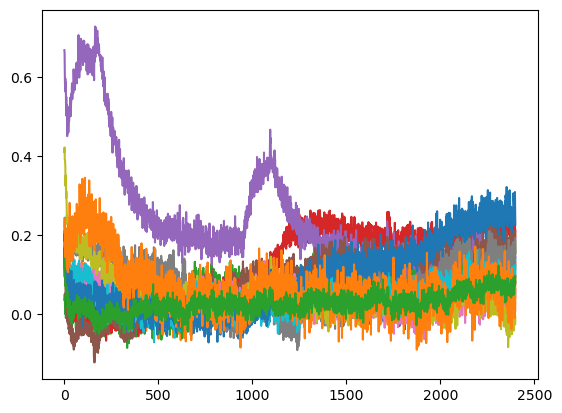

In [2034]:
plt.plot(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_dff'][...,:2400][hdbs_invivo.labels_==c,...][[x for x in np.arange(21).tolist() if x not in oxt_rm],...].T)

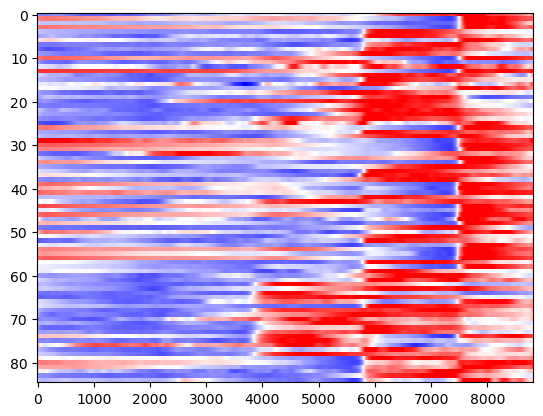

In [3191]:
sample_rate = 31/60
def lowpass(data: np.ndarray, cutoff: float, sample_rate: float, poles: int = 5):
    sos = sg.butter(poles, cutoff, 'lowpass', fs=sample_rate, output='sos')
    filtered_data = scipy.signal.sosfiltfilt(sos, data)
    return filtered_data
def highpass(data: np.ndarray, cutoff: float, sample_rate: float, poles: int = 5):
    sos = sg.butter(poles, cutoff, 'highpass', fs=sample_rate, output='sos')
    filtered_data = scipy.signal.sosfiltfilt(sos, data)
    return filtered_data
def bandpass(data: np.ndarray, cutoff, sample_rate: float, poles: int = 5):
    sos = sg.butter(poles, cutoff, 'bandpass', fs=sample_rate, output='sos')
    filtered_data = scipy.signal.sosfiltfilt(sos, data)
    return filtered_data

times = np.arange(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_norm1'].shape[1])/sample_rate #[...,:936]

#filtered = lowpass(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_norm1'][hdbs_invivo.labels_==c,...][...,:2400], 1/600, sample_rate)
#filtered = cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_norm1'][hdbs_invivo.labels_==c,...][...,:2400]-highpass(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_norm1'][hdbs_invivo.labels_==c,...][...,:2400], 1/600, sample_rate,1)
filtered = bandpass(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_norm1'], [1/40000,1/600], sample_rate,1) #[np.argsort(hdbs_invivo.labels_),...]

#from matplotlib import colors
#divnorm=colors.TwoSlopeNorm(vcenter=0)
filtered_sort = np.sort(filtered,axis=1)
filtered_b10 = np.mean(filtered_sort[:,:int(np.ceil(filtered_sort.shape[1]/10))],axis=1) #[[x for x in np.arange(21).tolist() if x not in oxt_rm],...]
filtered_t10 = np.mean(filtered_sort[:,-int(np.ceil(filtered_sort.shape[1]/10)):],axis=1)
filtered_norm1 = ((filtered.T-filtered_b10)/(filtered_t10-filtered_b10)).T
plt.imshow(filtered_norm1[np.argsort(hdbs_invivo.labels_),...],interpolation='nearest',aspect='auto',cmap='bwr',vmax=1)

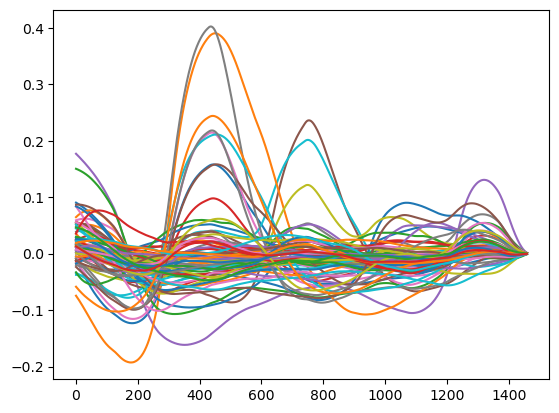

In [1585]:
plt.plot(filtered.T)

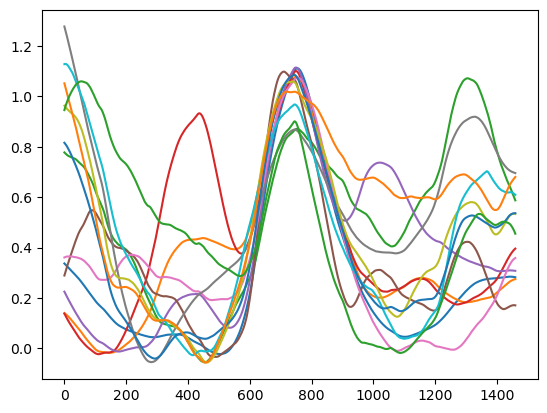

In [1586]:
psig = bandpass(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_dff'][hdbs_invivo.labels_==c,...][[x for x in np.arange(21).tolist() if x not in oxt_rm],40:1500], [1/4000,1/600], sample_rate,1)

psig_sort = np.sort(psig,axis=1)
psig_b10 = np.mean(psig_sort[:,:int(np.ceil(psig_sort.shape[1]/10))],axis=1)
psig_t10 = np.mean(psig_sort[:,-int(np.ceil(psig_sort.shape[1]/10)):],axis=1)
psig_norm1 = ((psig.T-psig_b10)/(psig_t10-psig_b10)).T

plt.plot(psig_norm1.T)

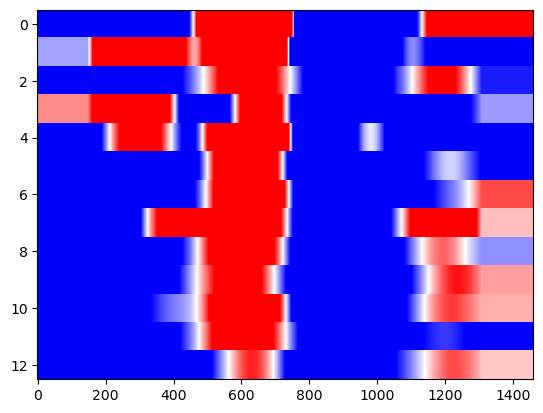

In [1565]:
f_savs = list()
for id in range(psig.shape[0]):
    sig_r = psig[id,...].T
    f_savs.append(sg.savgol_filter(sig_r,300,1,deriv=1))
    #rises.append(np.min(np.where(sav_test_m[:30,] == np.max(sav_test_m[:30,]))))
   #np.min(np.where(sav_test_r == np.max(sav_test_r))))
f_savs = np.array(f_savs)
plt.imshow(f_savs,interpolation='nearest',aspect='auto',cmap='bwr',vmin=0,vmax=0.0001)

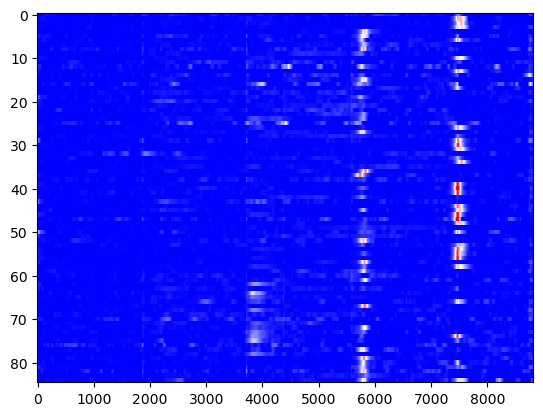

In [3192]:
f_savs = list()
for id in range(filtered_norm1.shape[0]):
    sig_r = filtered_norm1[id,...].T
    f_savs.append(sg.savgol_filter(sig_r,30,1,deriv=1))
    #rises.append(np.min(np.where(sav_test_m[:30,] == np.max(sav_test_m[:30,]))))
   #np.min(np.where(sav_test_r == np.max(sav_test_r))))
f_savs = np.array(f_savs)
plt.imshow(f_savs[np.argsort(hdbs_invivo.labels_),...],interpolation='nearest',aspect='auto',cmap='bwr',vmin=0,vmax=0.01)

[[-1  0  1  2]
 [29 32 17  7]]


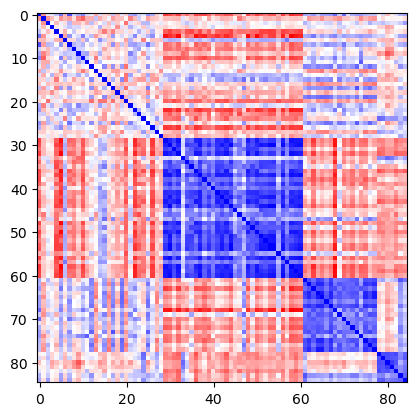

In [3193]:
from sklearn.cluster import HDBSCAN
from scipy.spatial.distance import pdist,squareform
hdbs_invivo_s = HDBSCAN(min_cluster_size = 3,metric='precomputed')#,cluster_selection_method='leaf')
hdbs_invivo_s.fit(squareform(pdist(f_savs,'correlation'))) #[...,750:4050]
#hdbs.fit(savs_nc)
lcounts_invivo_s = np.array(np.unique(hdbs_invivo_s.labels_, return_counts=True))
print(lcounts_invivo_s)
plt.imshow(squareform(pdist(f_savs[np.argsort(hdbs_invivo_s.labels_),...],'correlation')), interpolation='nearest',cmap='bwr')

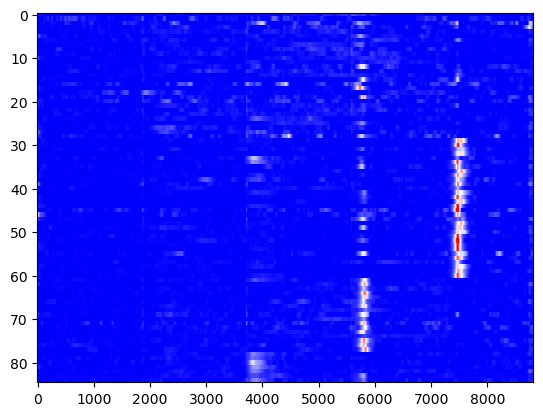

In [3194]:
plt.imshow(f_savs[np.argsort(hdbs_invivo_s.labels_),...],interpolation='nearest',aspect='auto',cmap='bwr',vmin=0,vmax=0.01)

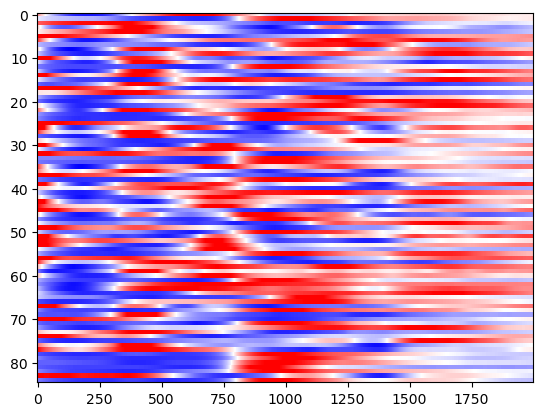

In [3200]:
sample_rate = 31/60
def lowpass(data: np.ndarray, cutoff: float, sample_rate: float, poles: int = 5):
    sos = sg.butter(poles, cutoff, 'lowpass', fs=sample_rate, output='sos')
    filtered_data = scipy.signal.sosfiltfilt(sos, data)
    return filtered_data
def highpass(data: np.ndarray, cutoff: float, sample_rate: float, poles: int = 5):
    sos = sg.butter(poles, cutoff, 'highpass', fs=sample_rate, output='sos')
    filtered_data = scipy.signal.sosfiltfilt(sos, data)
    return filtered_data
def bandpass(data: np.ndarray, cutoff, sample_rate: float, poles: int = 5):
    sos = sg.butter(poles, cutoff, 'bandpass', fs=sample_rate, output='sos')
    filtered_data = scipy.signal.sosfiltfilt(sos, data)
    return filtered_data

times = np.arange(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_corr_norm1'][...,:2000].shape[1])/sample_rate #[...,:936]

#filtered = lowpass(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_norm1'][hdbs_invivo.labels_==c,...][...,:2400], 1/600, sample_rate)
#filtered = cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_norm1'][hdbs_invivo.labels_==c,...][...,:2400]-highpass(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_norm1'][hdbs_invivo.labels_==c,...][...,:2400], 1/600, sample_rate,1)
filtered2 = bandpass(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_corr_norm1'][...,:2000], [1/8000,1/600], sample_rate,1) #[np.argsort(hdbs_invivo.labels_),...]

#from matplotlib import colors
#divnorm=colors.TwoSlopeNorm(vcenter=0)
filtered2_sort = np.sort(filtered2,axis=1)
filtered2_b10 = np.mean(filtered2_sort[:,:int(np.ceil(filtered2_sort.shape[1]/10))],axis=1) #[[x for x in np.arange(21).tolist() if x not in oxt_rm],...]
filtered2_t10 = np.mean(filtered2_sort[:,-int(np.ceil(filtered2_sort.shape[1]/10)):],axis=1)
filtered2_norm1 = ((filtered2.T-filtered2_b10)/(filtered2_t10-filtered2_b10)).T
plt.imshow(filtered2_norm1[np.argsort(hdbs_invivo_s.labels_),...],interpolation='nearest',aspect='auto',cmap='bwr',vmax=1)

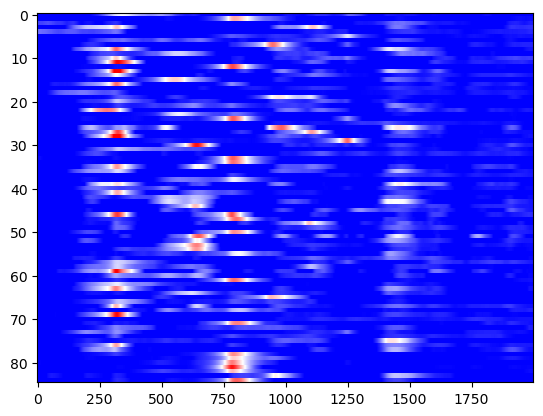

In [3201]:
f_savs2 = list()
for id in range(filtered2_norm1.shape[0]):
    sig_r = filtered2_norm1[id,...].T
    f_savs2.append(sg.savgol_filter(sig_r,30,1,deriv=1))
    #rises.append(np.min(np.where(sav_test_m[:30,] == np.max(sav_test_m[:30,]))))
   #np.min(np.where(sav_test_r == np.max(sav_test_r))))
f_savs2 = np.array(f_savs2)
plt.imshow(f_savs2[np.argsort(hdbs_invivo_s.labels_),...],interpolation='nearest',aspect='auto',cmap='bwr',vmin=0,vmax=0.01)

[[-1  0  1  2  3  4  5  6]
 [37  4 19  4  5  4  7  5]]


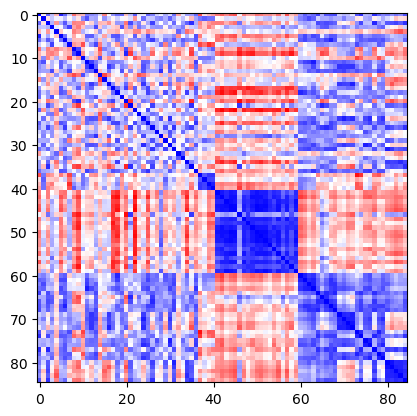

In [3202]:
from sklearn.cluster import HDBSCAN
from scipy.spatial.distance import pdist,squareform
hdbs_invivo_s2 = HDBSCAN(min_cluster_size = 3,metric='precomputed')#,cluster_selection_method='leaf')
hdbs_invivo_s2.fit(squareform(pdist(f_savs2,'correlation'))) #[...,750:4050]
#hdbs.fit(savs_nc)
lcounts_invivo_s2 = np.array(np.unique(hdbs_invivo_s2.labels_, return_counts=True))
print(lcounts_invivo_s2)
plt.imshow(squareform(pdist(f_savs2[np.argsort(hdbs_invivo_s2.labels_),...],'correlation')), interpolation='nearest',cmap='bwr')

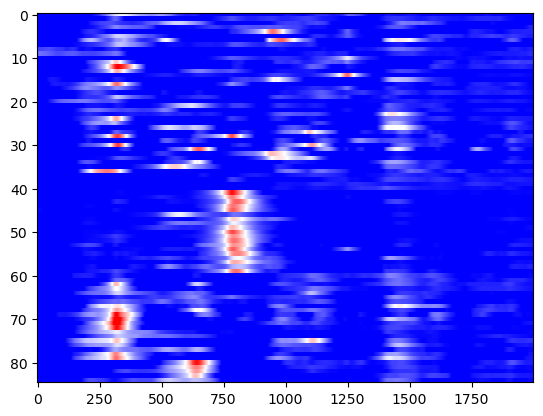

In [3203]:
plt.imshow(f_savs2[np.argsort(hdbs_invivo_s2.labels_),...],interpolation='nearest',aspect='auto',cmap='bwr',vmin=0,vmax=0.01)

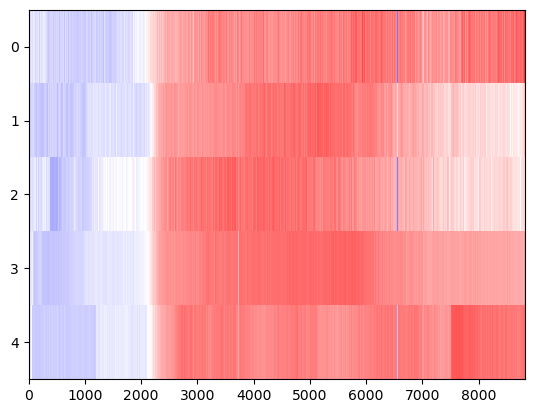

In [2867]:
#plt.imshow(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_norm1'][np.argsort(hdbs_invivo_s.labels_),...],interpolation='nearest',aspect='auto',cmap='bwr',vmin=-1,vmax=1.5)
#CY_mov_matched_raw_corr_norm1
plt.imshow(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_norm1'][hdbs_invivo_s.labels_==0,...],interpolation='nearest',aspect='auto',cmap='bwr',vmin=-1,vmax=1.5)

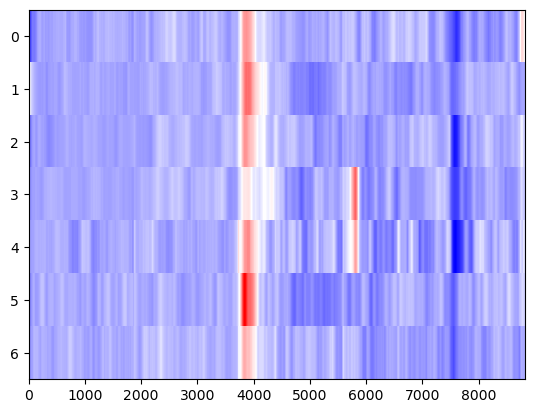

In [3393]:
c = 2
plt.imshow(f_savs[hdbs_invivo_s.labels_==c,...],interpolation='nearest',aspect='auto',cmap='bwr')#,vmin=0.002,vmax=0.01)

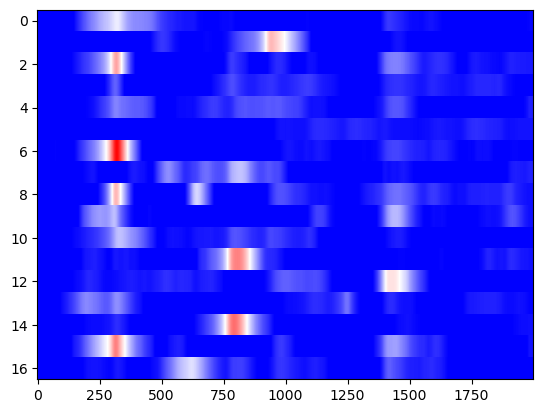

In [3370]:
plt.imshow(f_savs2[hdbs_invivo_s.labels_==c,...],interpolation='nearest',aspect='auto',cmap='bwr',vmin=0,vmax=0.01)#,vmin=0.002,vmax=0.01)

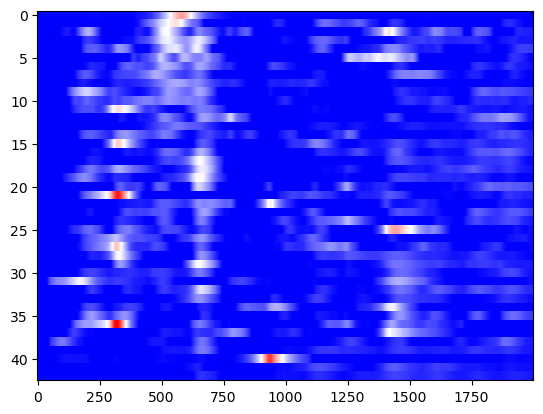

In [2219]:
plt.imshow(f_savs2[hdbs_invivo_s.labels_==c,...][np.argsort(-np.max(f_savs2[hdbs_invivo_s.labels_==c,...][...,400:600],axis=1)),...],interpolation='nearest',aspect='auto',cmap='bwr',vmin=0,vmax=0.01)

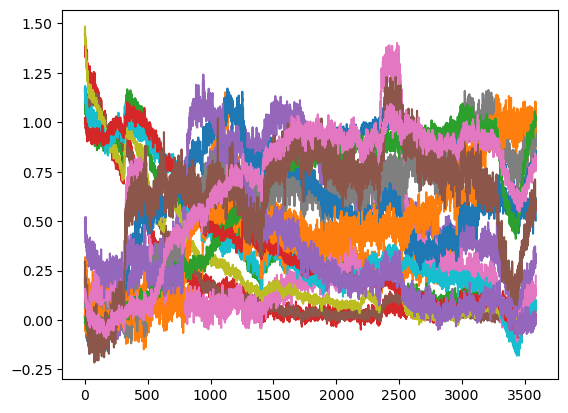

In [3371]:
plt.plot(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_corr_norm1'][hdbs_invivo_s.labels_==c,...].T)#,interpolation='nearest',aspect='auto',cmap='bwr',vmin=-1,vmax=2)

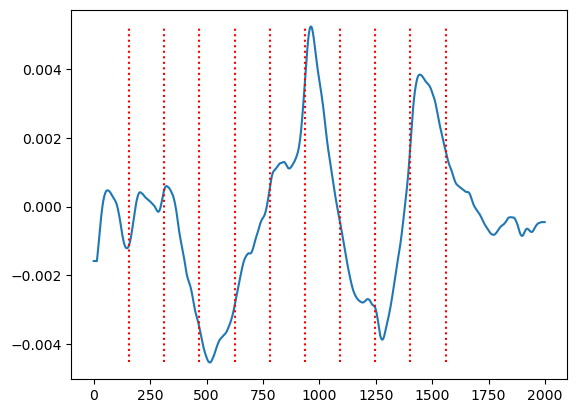

In [3394]:
j = 3
#[2, 6, 7, 10, 11, 12, 13, 14, 16, 17, 18, 20, 21, #22, 23, 24, 25, 26, 29, 30, 31]
#[1, 5, 7, 11, 12, 14, 16]
#[3]
#cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'] #non-ne:0,2,3
plt.plot(f_savs2[hdbs_invivo_s.labels_==c,...][j,...].T) #[...,750:4250]
plt.vlines(156*np.arange(1,11),ymin=np.min(f_savs2[hdbs_invivo_s.labels_==c,...][j,...].T),ymax=np.max(f_savs2[hdbs_invivo_s.labels_==c,...][j,...].T),color='red',linestyle='dotted')

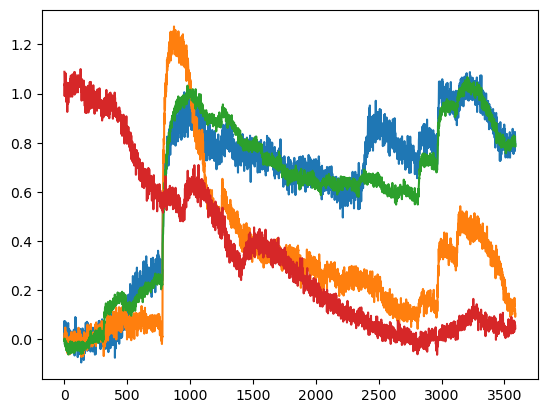

In [3395]:
plt.plot(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_corr_norm1'][hdbs_invivo_s.labels_==c,...][np.maximum(j-4,0):j+1,...].T)#,interpolation='nearest',aspect='auto',cmap='bwr',vmin=-1,vmax=2)

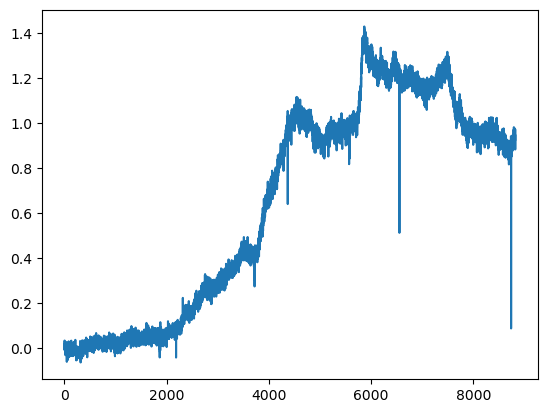

In [3396]:
plt.plot(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][hdbs_invivo_s.labels_==c,...][j,...].T)

[[-1  0  1  2  3  4  5  6  7]
 [52  5  3  7  8 14  5  4  5]]
None


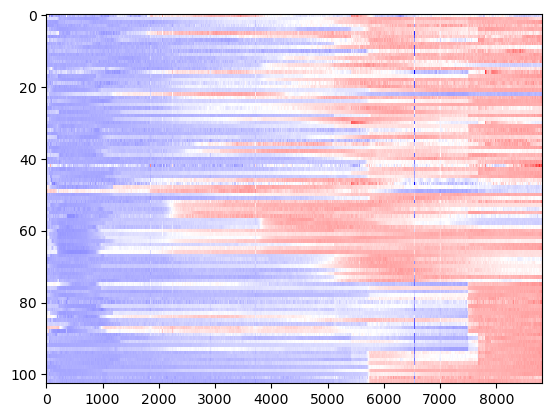

In [3087]:
plt.imshow(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_norm1'][np.argsort(hdbs_invivo_s.labels_),...], interpolation='nearest',aspect='auto',cmap='bwr',vmin=-1,vmax=2)
print(print(lcounts_invivo_s))

In [3088]:
cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_norm1'][np.argsort(hdbs_invivo_s.labels_),...].shape

(103, 8819)

In [3100]:
np.where(hdbs_invivo_s.labels_==0)[0][4]

85

In [3101]:
labs[np.where(hdbs_invivo_s.labels_==0)[0][4]]

-1.0

In [3126]:
labs = np.zeros((cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_norm1'][np.argsort(hdbs_invivo_s.labels_),...].shape[0]))-1
labs[np.where(hdbs_invivo_s.labels_==0)[0][4]] = 0
labs[np.where(hdbs_invivo_s.labels_==0)[0][1]] = 1
labs[np.where(hdbs_invivo_s.labels_==0)[0][2]] = 2
labs[np.where(hdbs_invivo_s.labels_==1)[0]] = 3
labs[np.where(hdbs_invivo_s.labels_==2)[0][6]] = 3
labs[np.where(hdbs_invivo_s.labels_==3)[0][0]] = 4
labs[np.where(hdbs_invivo_s.labels_==3)[0][6]] = 4
labs[np.where(hdbs_invivo_s.labels_==3)[0][7]] = 4
labs[np.where(hdbs_invivo_s.labels_==3)[0][3]] = 5
labs[np.where(hdbs_invivo_s.labels_==3)[0][4]] = 5
labs[np.where(hdbs_invivo_s.labels_==3)[0][5]] = 5
labs[np.where(hdbs_invivo_s.labels_==4)[0][[x for x in np.arange(np.where(hdbs_invivo_s.labels_==4)[0].shape[0]).tolist() if x not in [1,5,7,8,11,12]]]] = 6
labs[np.where(hdbs_invivo_s.labels_==7)[0][[x for x in np.arange(np.where(hdbs_invivo_s.labels_==7)[0].shape[0]).tolist() if x not in [0,2,3]]]] = 7
labs = labs.astype('int')
labs

array([-1, -1,  4, -1, -1, -1, -1, -1, -1,  6, -1, -1, -1,  6, -1, -1, -1,
       -1,  6, -1, -1, -1, -1, -1, -1, -1, -1,  6, -1, -1, -1, -1,  7, -1,
       -1, -1, -1, -1, -1,  1, -1, -1, -1,  5, -1,  2, -1,  6, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,  3,  6,  3, -1, -1,  3,  3,
       -1, -1, -1, -1, -1,  7,  5, -1, -1,  5, -1,  6, -1, -1, -1, -1, -1,
        0, -1, -1, -1, -1, -1, -1,  4,  6,  4, -1, -1, -1, -1, -1, -1, -1,
       -1])

In [3056]:
# l=4
# AVP: 0/4
# DA: 0/1
# ATP: 0/2
# HA: 1, 2/6
# OXT: 3/0-6-7
# ACh: 3/3-4-5
# 5HT: 4/not-1,5,7,8,11,12
# NE: 7/not-0,2,3

7

In [3127]:
cnmf_dicts_invivo_10x[l]['row_clusts'] = labs
cnmf_dicts_invivo_10x[l]['clust_ids'] = ['AVP','DA','ATP','HA','OXT','ACh','5HT','NE'] # no name for -1 cluster - just 0 onward
cnmf_dicts_invivo_10x[l]['savs_filt_norm1'] = f_savs
cnmf_dicts_invivo_10x[l]['savs2_filt_norm1'] = f_savs2
cnmf_dicts_invivo_10x[l]['5ht_rm'] = None
cnmf_dicts_invivo_10x[l]['oxt_rm'] = None
cnmf_dicts_invivo_10x[l]['avp_rm'] = None
cnmf_dicts_invivo_10x[l]['mt_rm'] = None
cnmf_dicts_invivo_10x[l]['ha_rm'] = None
cnmf_dicts_invivo_10x[l]['ne_rm'] = None

3

In [3209]:
# l=3
print(cnmf_dicts_invivo_10x[l]['5ht_rm'])
print(cnmf_dicts_invivo_10x[l]['ne_rm'])
print(cnmf_dicts_invivo_10x[l]['ha_rm'])
# c=-1:
# OXT - 2,9,13(w/DA?),19
# HA - 3
# DA - 5
# MT - 7?
# CCK - 8
# ACh - 11
# AVP - 17
# c=0 (5HT):
# HA - 22
# CCK - 16
# c=1 (NE):
# MT - 12
# c=2 (HA)

[2, 6, 7, 10, 11, 12, 13, 14, 16, 17, 18, 20, 21, 22, 23, 24, 25, 26, 29, 30, 31]
[1, 5, 7, 11, 12, 14, 16]
[3]


In [3404]:
labs = np.zeros((cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_norm1'][np.argsort(hdbs_invivo_s.labels_),...].shape[0]))-1
labs[np.where(hdbs_invivo_s.labels_==0)[0][[x for x in np.arange(np.where(hdbs_invivo_s.labels_==0)[0].shape[0]).tolist() if x not in cnmf_dicts_invivo_10x[l]['5ht_rm']]]] = 0
labs[np.where(hdbs_invivo_s.labels_==1)[0][[x for x in np.arange(np.where(hdbs_invivo_s.labels_==1)[0].shape[0]).tolist() if x not in cnmf_dicts_invivo_10x[l]['ne_rm']]]] = 1
labs[np.where(hdbs_invivo_s.labels_==2)[0][[x for x in np.arange(np.where(hdbs_invivo_s.labels_==2)[0].shape[0]).tolist() if x not in cnmf_dicts_invivo_10x[l]['ha_rm']]]] = 2

labs[np.where(hdbs_invivo_s.labels_==-1)[0][2]] = 4
labs[np.where(hdbs_invivo_s.labels_==-1)[0][9]] = 4
labs[np.where(hdbs_invivo_s.labels_==-1)[0][13]] = 4
labs[np.where(hdbs_invivo_s.labels_==-1)[0][19]] = 4
labs[np.where(hdbs_invivo_s.labels_==-1)[0][3]] = 2
labs[np.where(hdbs_invivo_s.labels_==-1)[0][5]] = 3
labs[np.where(hdbs_invivo_s.labels_==-1)[0][7]] = 5
labs[np.where(hdbs_invivo_s.labels_==-1)[0][8]] = 6
labs[np.where(hdbs_invivo_s.labels_==-1)[0][11]] = 7
labs[np.where(hdbs_invivo_s.labels_==-1)[0][17]] = 8
labs[np.where(hdbs_invivo_s.labels_==0)[0][16]] = 6
labs[np.where(hdbs_invivo_s.labels_==0)[0][22]] = 2
labs[np.where(hdbs_invivo_s.labels_==1)[0][12]] = 5
labs = labs.astype('int')
labs

array([-1,  0,  2,  0, -1,  1, -1,  4,  0,  0,  0,  2, -1,  3, -1,  5, -1,
        6, -1, -1,  0,  0, -1, -1, -1,  2, -1,  1,  4,  1, -1,  1,  7, -1,
        0, -1, -1,  6,  4,  1, -1,  1,  1, -1,  1, -1, -1,  8, -1, -1, -1,
       -1,  4,  0, -1,  5,  2, -1, -1, -1, -1,  2, -1,  2, -1, -1,  1, -1,
       -1, -1, -1,  2,  0,  0, -1, -1, -1,  2, -1,  1, -1, -1, -1, -1, -1])

In [3405]:
#cnmf_dicts_invivo_10x[l]['row_clusts_ori'] = cnmf_dicts_invivo_10x[l]['row_clusts']
cnmf_dicts_invivo_10x[l]['row_clusts'] = labs
#cnmf_dicts_invivo_10x[l]['clust_ids_ori'] = cnmf_dicts_invivo_10x[l]['clust_ids']
cnmf_dicts_invivo_10x[l]['clust_ids'] = ['5HT','NE','HA','DA','OXT','MT','CCK','ACh','AVP'] # no name for -1 cluster - just 0 onward


[[-1  0  1  2  3  4  5  6  7]
 [80  1  1  1  4  3  3  8  2]]
['AVP', 'DA', 'ATP', 'HA', 'OXT', 'ACh', '5HT', 'NE']


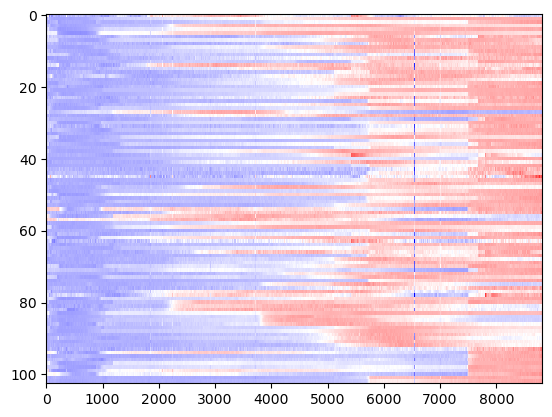

In [3444]:
l = 4
plt.imshow(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_norm1'][np.argsort(cnmf_dicts_invivo_10x[l]['row_clusts']),...], interpolation='nearest',aspect='auto',cmap='bwr',vmin=-1,vmax=2)
print(np.array(np.unique(cnmf_dicts_invivo_10x[l]['row_clusts'], return_counts=True)))
print(cnmf_dicts_invivo_10x[l]['clust_ids'])

In [ ]:
# c=-1: (finish it later maybe)
# ACh - 1
# MT - 4
# AVP - 5,6

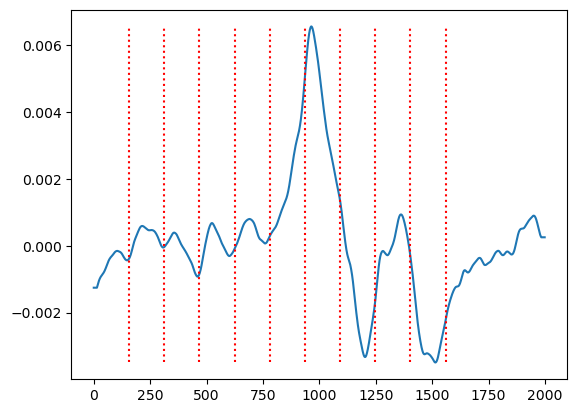

In [3440]:
c = -1
j = 9
#cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'] #
plt.plot(cnmf_dicts_invivo_10x[l]['savs2_filt_norm1'][cnmf_dicts_invivo_10x[l]['row_clusts']==c,...][j,...].T) #[...,750:4250]
plt.vlines(156*np.arange(1,11),ymin=np.min(cnmf_dicts_invivo_10x[l]['savs2_filt_norm1'][cnmf_dicts_invivo_10x[l]['row_clusts']==c,...][j,...].T),ymax=np.max(cnmf_dicts_invivo_10x[l]['savs2_filt_norm1'][cnmf_dicts_invivo_10x[l]['row_clusts']==c,...][j,...].T),color='red',linestyle='dotted')

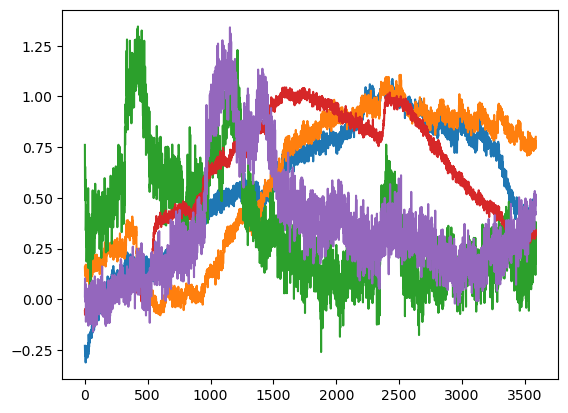

In [3441]:
plt.plot(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[l]['row_clusts']==c,...][np.maximum(j-4,0):j+1,...].T)#,interpolation='nearest',aspect='auto',cmap='bwr',vmin=-1,vmax=2)

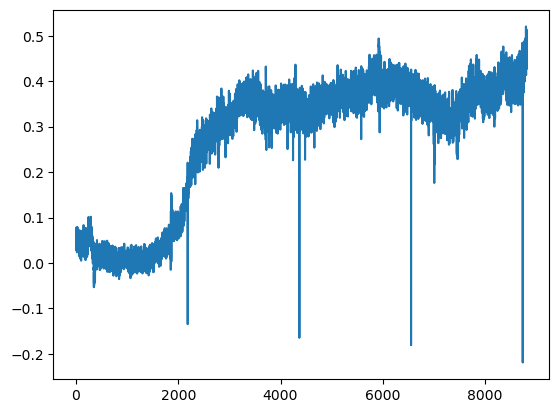

In [3442]:
plt.plot(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts']==c,...][j,...].T)

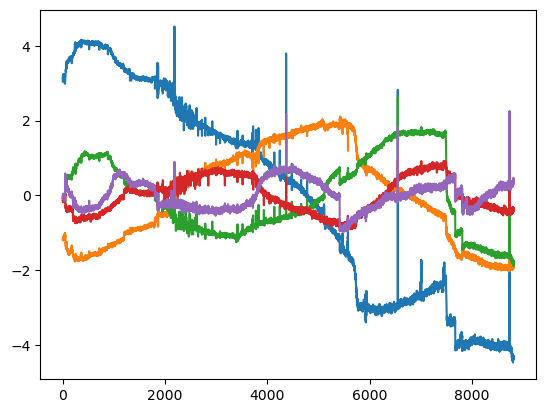

In [3186]:
from sklearn.decomposition import PCA
pca = PCA(n_components=5)
pca.fit(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_norm1'][np.argsort(cnmf_dicts_invivo_10x[l]['row_clusts']),...].T)
plt.plot(pca.transform(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_norm1'][np.argsort(cnmf_dicts_invivo_10x[l]['row_clusts']),...].T))#.T, interpolation='nearest',aspect='auto',cmap='bwr',vmin=-1,vmax=2)

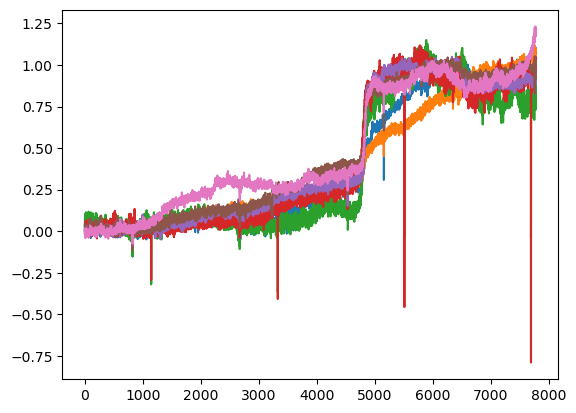

In [3173]:
c = 0
#plt.plot(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_norm1'][cnmf_dicts_invivo_10x[l]['row_clusts']==c,...][[x for x in np.arange(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_norm1'][cnmf_dicts_invivo_10x[l]['row_clusts']==c,...].shape[0]).tolist() if x not in cnmf_dicts_invivo_10x[l]['5ht_rm']],...].T)#, interpolation='nearest',aspect='auto',cmap='bwr',vmin=-1,vmax=2)
plt.plot(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_norm1'][cnmf_dicts_invivo_10x[l]['row_clusts']==c,...].T)#, interpolation='nearest',aspect='auto',cmap='bwr',vmin=-1,vmax=2)

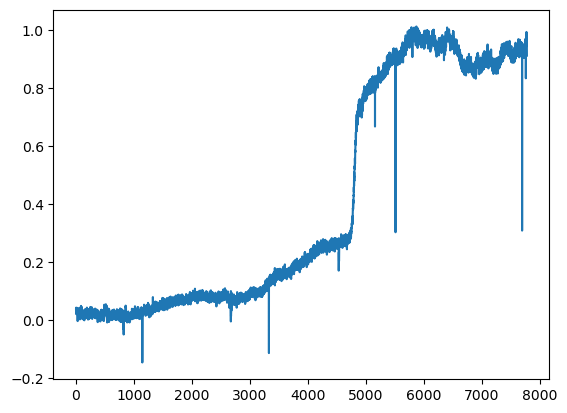

In [3175]:
#plt.plot(np.mean(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_norm1'][cnmf_dicts_invivo_10x[l]['row_clusts']==c,...],axis=0).T)#, interpolation='nearest',aspect='auto',cmap='bwr',vmin=-1,vmax=2)
plt.plot(np.mean(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_norm1'][cnmf_dicts_invivo_10x[l]['row_clusts']==c,...][[x for x in np.arange(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_norm1'][cnmf_dicts_invivo_10x[l]['row_clusts']==c,...].shape[0]).tolist() if x not in cnmf_dicts_invivo_10x[l]['mt_rm']],...],axis=0).T)#, interpolation='nearest',aspect='auto',cmap='bwr',vmin=-1,vmax=2)

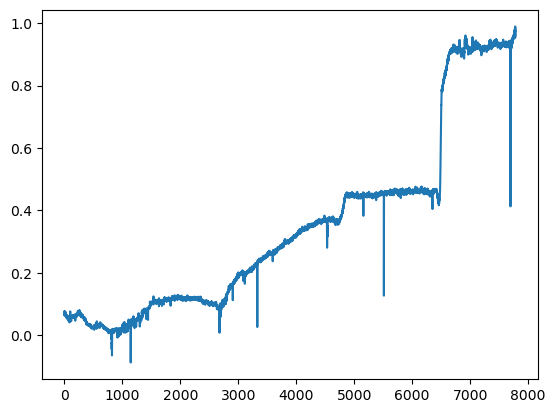

In [3172]:
plt.plot(np.mean(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_norm1'],axis=0).T)#, interpolation='nearest',aspect='auto',cmap='bwr',vmin=-1,vmax=2)


In [ ]:
# l/c IP
# AVP: 0/2, 1/1, 3/2, 4/2, 6/1
# OXT: 1/2, 2/2, 3/1, 4/1
# 5HT (spont): 1/0, 2/1

# l/c 10x (excluding l=4)
# AVP: 2/1-2-4
# OXT: 0/1
# 5HT: 0/0, 1/1, 3/0
# MT: 1/0
# HA: 2/3, 3/2
# NE: 3/1

# l=3:
#[[-1  0  1  2  3  4  5  6  7  8]
# [45 11 10  8  1  4  2  2  1  1]]
#['5HT', 'NE', 'HA', 'DA', 'OXT', 'MT', 'CCK', 'ACh', 'AVP']

# l=4:
#[[-1  0  1  2  3  4  5  6  7]
# [80  1  1  1  4  3  3  8  2]]
#['AVP', 'DA', 'ATP', 'HA', 'OXT', 'ACh', '5HT', 'NE']

# 10x l=4:
# AVP: 0/4
# DA: 0/1
# ATP: 0/2
# HA: 1, 2/6
# OXT: 3/0-6-7
# ACh: 3/3-4-5
# 5HT: 4/not-1,5,7,8,11,12
# NE: 7/not-0,2,3

In [4563]:
# for each in vivo movie need to save and be able to easily retrieve:
# 'row_clusts' and all keys beyond
for l in trange(len(cnmf_dicts_invivo_ip)):
    save_dir = os.path.split(os.path.split(cnmf_dicts_invivo_ip[l]['cnmf_ref_path'])[0])[0]
    if l!=5:
        save_dict = {k: cnmf_dicts_invivo_ip[l][k] for k in tuple(np.array(list(cnmf_dicts_invivo_ip[l].keys()))[list(cnmf_dicts_invivo_ip[l].keys()).index('row_clusts'):])}
    else:
        continue
    save_path = os.path.join(save_dir, 'invivo_movie_row_ids.pickle')
    with open(save_path, 'wb') as f:
        pickle.dump(save_dict, f)

  0%|          | 0/7 [00:00<?, ?it/s]

In [24]:
# RELOAD
for l in trange(len(cnmf_dicts_invivo_ip)):
    save_dir = os.path.split(os.path.split(cnmf_dicts_invivo_ip[l]['cnmf_ref_path'])[0])[0]
    save_path = os.path.join(save_dir, 'invivo_movie_row_ids.pickle')
    if l!=5:
        load_dict = load_pickle(save_path)
        cnmf_dicts_invivo_ip[l].update(load_dict)

  0%|          | 0/7 [00:00<?, ?it/s]

In [26]:
cnmf_dicts_invivo_ip[0].keys()

dict_keys(['base_dir', 'cnmf_ref_path', 'cnmf_ref', 'spcomps_ref', 'CY_ref', 'cnmf_mov_path', 'cnmf_mov', 'spcomps_mov', 'CY_mov', 'cnmf_ref_matched_path', 'cnmf_ref_matched', 'spcomps_ref_matched', 'CY_ref_matched', 'cnmf_mov_matched_path', 'cnmf_movov_matched', 'spcomps_m_matched', 'CY_mov_matched', 'cnmf_ref_matched_path_raw', 'cnmf_ref_matched_raw', 'spcomps_ref_matched_raw', 'CY_ref_matched_raw', 'cnmf_mov_matched_path_raw', 'cnmf_mov_matched_raw', 'spcomps_mov_matched_raw', 'CY_mov_matched_raw', 'cnmf_mov_matched', 'spcomps_mov_matched', 'rises', 'CY_ref_matched_raw_sort', 'CY_ref_matched_raw_b10', 'CY_ref_matched_raw_t10', 'CY_ref_matched_raw_dff', 'CY_ref_matched_raw_norm1', 'CY_mov_matched_raw_sort', 'CY_mov_matched_raw_b10', 'CY_mov_matched_raw_t10', 'CY_mov_matched_raw_dff', 'CY_mov_matched_raw_norm1', 'af', 'CY_mov_matched_raw_dfs', 'corrbase', 'CY_mov_matched_raw_corr', 'CY_mov_matched_raw_corr_sort', 'CY_mov_matched_raw_corr_b10', 'CY_mov_matched_raw_corr_t10', 'CY_mov_ma

In [4560]:
os.path.split(os.path.split(cnmf_dicts_invivo_ip[l]['cnmf_ref_path'])[0])[0]

'H:\\CNMFoutputs\\peter\\mask_matching\\230726_DG47PL54_done'

In [4564]:
# for each in vivo movie need to save and be able to easily retrieve:
# 'row_clusts' and all keys beyond
for l in trange(len(cnmf_dicts_invivo_10x)):
    save_dir = os.path.split(os.path.split(cnmf_dicts_invivo_10x[l]['cnmf_ref_path'])[0])[0]
    save_dict = {k: cnmf_dicts_invivo_10x[l][k] for k in tuple(np.array(list(cnmf_dicts_invivo_10x[l].keys()))[list(cnmf_dicts_invivo_10x[l].keys()).index('row_clusts'):])}
    save_path = os.path.join(save_dir, 'invivo_movie_row_ids.pickle')
    with open(save_path, 'wb') as f:
        pickle.dump(save_dict, f)

  0%|          | 0/5 [00:00<?, ?it/s]

In [27]:
# RELOAD
for l in trange(len(cnmf_dicts_invivo_10x)):
    save_dir = os.path.split(os.path.split(cnmf_dicts_invivo_10x[l]['cnmf_ref_path'])[0])[0]
    save_path = os.path.join(save_dir, 'invivo_movie_row_ids.pickle')
    load_dict = load_pickle(save_path)
    cnmf_dicts_invivo_10x[l].update(load_dict)

  0%|          | 0/5 [00:00<?, ?it/s]

In [28]:
cnmf_dicts_invivo_10x[0].keys()

dict_keys(['base_dir', 'cnmf_ref_path', 'cnmf_ref', 'spcomps_ref', 'CY_ref', 'cnmf_mov_path', 'cnmf_mov', 'spcomps_mov', 'CY_mov', 'cnmf_ref_matched_path', 'cnmf_ref_matched', 'spcomps_ref_matched', 'CY_ref_matched', 'cnmf_mov_matched_path', 'cnmf_movov_matched', 'spcomps_m_matched', 'CY_mov_matched', 'cnmf_ref_matched_path_raw', 'cnmf_ref_matched_raw', 'spcomps_ref_matched_raw', 'CY_ref_matched_raw', 'cnmf_mov_matched_path_raw', 'cnmf_mov_matched_raw', 'spcomps_mov_matched_raw', 'CY_mov_matched_raw', 'cnmf_mov_matched', 'spcomps_mov_matched', 'rises', 'CY_ref_matched_raw_sort', 'CY_ref_matched_raw_b10', 'CY_ref_matched_raw_t10', 'CY_ref_matched_raw_dff', 'CY_ref_matched_raw_norm1', 'CY_mov_matched_raw_sort', 'CY_mov_matched_raw_b10', 'CY_mov_matched_raw_t10', 'CY_mov_matched_raw_dff', 'CY_mov_matched_raw_norm1', 'af', 'CY_mov_matched_raw_dfs', 'corrbase', 'CY_mov_matched_raw_corr', 'CY_mov_matched_raw_corr_sort', 'CY_mov_matched_raw_corr_b10', 'CY_mov_matched_raw_corr_t10', 'CY_mov_ma

In [4562]:
os.path.split(os.path.split(cnmf_dicts_invivo_10x[0]['cnmf_ref_path'])[0])[0]

'H:\\CNMFoutputs\\charlotte\\mask_matching\\231018_DG52PL66_charlotte_done'

In [3712]:
save_dir = os.path.split(os.path.split(cnmf_dicts_invivo_10x[l]['cnmf_ref_path'])[0])[0]
fix = load_pickle(os.path.join(save_dir, 'invivo_movie_row_ids.pickle'))
print(np.array(np.unique(fix['row_clusts'], return_counts=True)))
#cnmf_dicts_invivo_ip[l]['row_clusts'] = fix['row_clusts']

[[-1  0  1]
 [ 9  7 43]]


In [3719]:
# just fix the row groups so they're not frustrating later
l=1
print(np.array(list(cnmf_dicts_invivo_10x[l].keys()))[list(cnmf_dicts_invivo_10x[l].keys()).index('row_clusts'):])
print(np.array(np.unique(cnmf_dicts_invivo_10x[l]['row_clusts'], return_counts=True)))
print(cnmf_dicts_invivo_10x[l]['clust_ids'])

['row_clusts' 'clust_ids' 'savs_filt_norm1' 'savs2_filt_norm1' '5ht_rm'
 'oxt_rm' 'avp_rm' 'mt_rm' 'vol_per_min' 'm1_vol_onset' 'm2_vol_onset'
 'm3_vol_onset' 'icv_vol_onset' 'row_clusts_f']
[[-1  0  1]
 [25  7 27]]
['MT', '5HT']


In [3714]:
labs = cnmf_dicts_invivo_10x[l]['row_clusts']

In [3715]:
cnmf_dicts_invivo_ip[l]['5ht_rm']

[3, 4]

In [3716]:
c = 1
#labs[np.where(cnmf_dicts_invivo_ip[l]['row_clusts']==c)[0][cnmf_dicts_invivo_ip[l]['avp_rm']]] = -1
labs[np.where(cnmf_dicts_invivo_10x[l]['row_clusts']==c)[0][cnmf_dicts_invivo_10x[l]['5ht_rm']]] = -1
#labs[np.where(cnmf_dicts_invivo_10x[l]['row_clusts']==c)[0][cnmf_dicts_invivo_10x[l]['oxt_rm']]] = -1
#labs[np.where(cnmf_dicts_invivo_10x[l]['row_clusts']==c)[0][cnmf_dicts_invivo_10x[l]['ha_rm']]] = -1

In [3631]:
np.array(np.unique(labs, return_counts=True))

array([[-1,  0,  1,  3],
       [64, 13, 15,  9]], dtype=int64)

In [3630]:
labs[np.where(labs==4)[0]] = 1

In [3717]:
cnmf_dicts_invivo_10x[l]['row_clusts_f'] = labs

In [3619]:
cnmf_dicts_invivo_ip[0]['row_clusts_f'] #fix!

array([-1,  2, -1, -1, -1, -1, -1, -1, -1,  2, -1, -1,  1,  2, -1, -1, -1,
       -1, -1,  2,  0,  1, -1,  0,  1, -1,  1,  0, -1,  2, -1,  1, -1,  0,
        2, -1, -1, -1, -1,  2, -1, -1,  1,  2, -1,  1, -1,  0,  1,  2,  2,
        1], dtype=int64)

In [3564]:
# time to make summary curves
# top goals: 
# IP AVP - IP 0,1,3,4,6; 10x 2 (IP 1,3,4 paired with OXT)
# IP OXT - IP 1,2,3,4; 10x 0 (IP 1,3,4 paired with AVP)
# spont 5HT - IP 1,2
# IP/ICV 5HT - 10x 0,1,3,4
# make sure to update all injection timings correctly
# onset timings in min are:
# drug mixtures: 5HT/AVP/DA/ATP, 5HT/OXT/HA/ACh, 5HT/CCK/NE/MT
# IP 0: AVP 150 - remove first 520 vols  (total run 210 min)
# IP 1: AVP 120, OXT 165 (ICV NE 210) - remove first 260 vols (total run 240 min)
# IP 2: (AVP 135), OXT 180 (ICV 5HT 225) - remove first 520 vols (total run 260 min)
# IP 3: OXT 135, AVP 180 (ICV 5HT 225) (total run 255 min)
# IP 4: OXT 135, AVP 180 (ICV 5HT 225) - remove first 3120 vols (total run 255 min)
# IP 6: AVP 60, (OXT 105) (IP 5HT 150, ICV NE 195) (total run 240 min)
# 10x 0: OXT 135, IP 5HT 180 (total run 240 min)
# 10x 1: m1 60, m2 120, m3 180 (ICV 5HT 240) - remove first 1040 vols (total run 285 min)
# 10x 2: m1 60, m2 120 (abort 165 min) - remove first 520 vols and 4160 onward
# 10x 3: m1 60, m2 120, m3 180 (ICV 5HT 240) (total run 285 min)
# 10x 4: m1 60, m2 120, m3 180 (ICV 5HT 240) (total run 285 min)

In [29]:
# avp, oxt
ons_ip = [[150,0],
         [120,165],
         [135,180],
         [180,135],
         [180,135],
         [0,0], # IP OXT 135 min, IP AVP 180 min, just no visible responses in l=5
         [60,105]]
cuts_ip = [520,
          260,
          520,
          0,
          3120,
          312,
          0]
total_ip = [210,240,260,255,255,225,240]

# separate case for l=0 (oxt,5ht)
# otherwise m1,m2,m3,icv
ons_10x = [[135,180],
         [60,120,180,240],
         [60,120],
         [60,120,180,240],
         [60,120,180,240]]
cuts_10x = [0,
           1040,
           [520,4160], #use 8819/285 for estimated vols/min here
           0,
           0]
total_10x = [240,285,165,285,285]

In [30]:
for l in range(len(cnmf_dicts_invivo_ip)):
    cnmf_dicts_invivo_ip[l]['vol_per_min'] = (cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_norm1'].shape[1]+cuts_ip[l])/total_ip[l]
    print(cnmf_dicts_invivo_ip[l]['vol_per_min'])
    if ons_ip[l][0] != 0:
        cnmf_dicts_invivo_ip[l]['avp_vol_onset'] = np.ceil(ons_ip[l][0]*cnmf_dicts_invivo_ip[l]['vol_per_min']).astype('int')-cuts_ip[l]
    else:
        cnmf_dicts_invivo_ip[l]['avp_vol_onset'] = None
    if ons_ip[l][1] != 0:
        cnmf_dicts_invivo_ip[l]['oxt_vol_onset'] = np.ceil(ons_ip[l][1]*cnmf_dicts_invivo_ip[l]['vol_per_min']).astype('int')-cuts_ip[l]
    else:
        cnmf_dicts_invivo_ip[l]['oxt_vol_onset'] = None
    print(cnmf_dicts_invivo_ip[l]['avp_vol_onset'])
    print(cnmf_dicts_invivo_ip[l]['oxt_vol_onset'])

30.942857142857143
4122
None
30.9375
3453
4845
30.942307692307693
3658
5050
30.937254901960785
5569
4177
30.941176470588236
2450
1058
30.942222222222224
None
None
30.941666666666666
1857
3249


In [31]:
for l in range(len(cnmf_dicts_invivo_10x)):
    if type(cuts_10x[l]) == list:
        cnmf_dicts_invivo_10x[l]['vol_per_min'] = 8819/285
    else:
        cnmf_dicts_invivo_10x[l]['vol_per_min'] = (cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_norm1'].shape[1]+cuts_10x[l])/total_10x[l]
    print(cnmf_dicts_invivo_10x[l]['vol_per_min'])
    if l==0:
        cnmf_dicts_invivo_10x[l]['oxt_vol_onset'] = np.ceil(ons_10x[l][0]*cnmf_dicts_invivo_10x[l]['vol_per_min']).astype('int')-cuts_10x[l]
        cnmf_dicts_invivo_10x[l]['5ht_vol_onset'] = np.ceil(ons_10x[l][1]*cnmf_dicts_invivo_10x[l]['vol_per_min']).astype('int')-cuts_10x[l]
        print(cnmf_dicts_invivo_10x[l]['oxt_vol_onset'])
        print(cnmf_dicts_invivo_10x[l]['5ht_vol_onset'])
    else:
        if type(cuts_10x[l]) == list:
            cnmf_dicts_invivo_10x[l]['m1_vol_onset'] = np.ceil(ons_10x[l][0]*cnmf_dicts_invivo_10x[l]['vol_per_min']).astype('int')-cuts_10x[l][0]
            cnmf_dicts_invivo_10x[l]['m2_vol_onset'] = np.ceil(ons_10x[l][1]*cnmf_dicts_invivo_10x[l]['vol_per_min']).astype('int')-cuts_10x[l][0]
            print(cnmf_dicts_invivo_10x[l]['m1_vol_onset'])
            print(cnmf_dicts_invivo_10x[l]['m2_vol_onset'])
        else:
            cnmf_dicts_invivo_10x[l]['m1_vol_onset'] = np.ceil(ons_10x[l][0]*cnmf_dicts_invivo_10x[l]['vol_per_min']).astype('int')-cuts_10x[l]
            cnmf_dicts_invivo_10x[l]['m2_vol_onset'] = np.ceil(ons_10x[l][1]*cnmf_dicts_invivo_10x[l]['vol_per_min']).astype('int')-cuts_10x[l]
            cnmf_dicts_invivo_10x[l]['m3_vol_onset'] = np.ceil(ons_10x[l][2]*cnmf_dicts_invivo_10x[l]['vol_per_min']).astype('int')-cuts_10x[l]
            cnmf_dicts_invivo_10x[l]['icv_vol_onset'] = np.ceil(ons_10x[l][3]*cnmf_dicts_invivo_10x[l]['vol_per_min']).astype('int')-cuts_10x[l]
            print(cnmf_dicts_invivo_10x[l]['m1_vol_onset'])
            print(cnmf_dicts_invivo_10x[l]['m2_vol_onset'])
            print(cnmf_dicts_invivo_10x[l]['m3_vol_onset'])
            print(cnmf_dicts_invivo_10x[l]['icv_vol_onset'])

30.945833333333333
4178
5571
30.94736842105263
817
2674
4531
6388
30.943859649122807
1337
3194
30.943859649122807
1857
3714
5570
7427
30.943859649122807
1857
3714
5570
7427


In [72]:
l = 7
plt.imshow(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_norm1'][np.argsort(cnmf_dicts_invivo_ip[l]['row_clusts_f']),...], interpolation='nearest',aspect='auto',cmap='bwr',vmin=-1,vmax=2)
print(np.array(np.unique(cnmf_dicts_invivo_ip[l]['row_clusts_f'], return_counts=True)))
print(cnmf_dicts_invivo_ip[l]['clust_ids'])
print(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_norm1'].shape[1])

IndexError: list index out of range

800


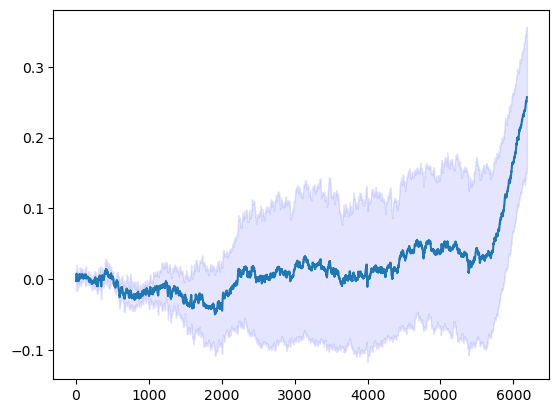

In [64]:
c = 2
#ons = cnmf_dicts_invivo_ip[l]['oxt_vol_onset']
ons = 800
print(ons)
minbase = 20
minpost = 180
f0_range = 10
data = sg.savgol_filter(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw'][cnmf_dicts_invivo_ip[l]['row_clusts_f']==c,...][...,np.ceil(ons-minbase*cnmf_dicts_invivo_ip[l]['vol_per_min']).astype('int'):np.ceil(ons+minpost*cnmf_dicts_invivo_ip[l]['vol_per_min']).astype('int')],10,1)
f0 = np.mean(data[...,:np.ceil(f0_range*cnmf_dicts_invivo_ip[l]['vol_per_min']).astype('int')],axis=1)
dff = (data.T-f0)/f0
ci = 1.96 * np.std(dff,axis=1)/np.sqrt(dff.shape[1])
fig, ax = plt.subplots()
ax.plot(np.mean(dff,axis=1))
ax.fill_between(np.arange(dff.shape[0]), (np.mean(dff,axis=1)-ci), (np.mean(dff,axis=1)+ci), color='b', alpha=.1)

[[-1  0  1  2  3  4  5  6  7  8]
 [45 11 10  8  1  4  2  2  1  1]]
['5HT', 'NE', 'HA', 'DA', 'OXT', 'MT', 'CCK', 'ACh', 'AVP']
8819


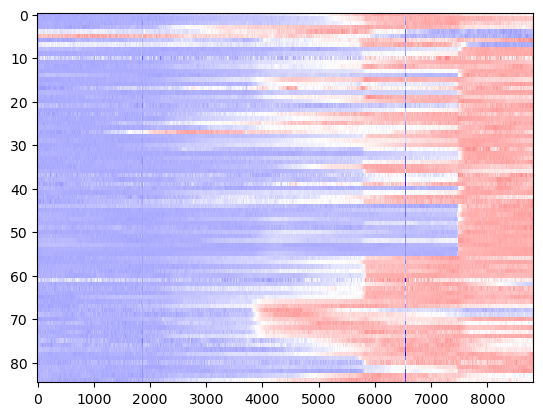

In [34]:
l = 3
plt.imshow(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_norm1'][np.argsort(cnmf_dicts_invivo_10x[l]['row_clusts_f']),...], interpolation='nearest',aspect='auto',cmap='bwr',vmin=-1,vmax=2)
print(np.array(np.unique(cnmf_dicts_invivo_10x[l]['row_clusts_f'], return_counts=True)))
print(cnmf_dicts_invivo_10x[l]['clust_ids'])
print(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_norm1'].shape[1])

1857


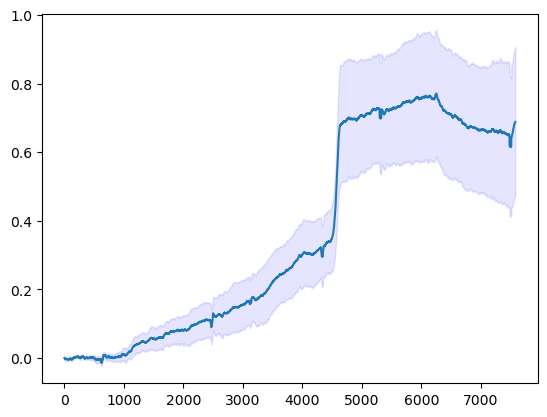

In [35]:
c = 1
ons = cnmf_dicts_invivo_10x[l]['m1_vol_onset']
#ons = 800
print(ons)
minbase = 20
minpost = 240
f0_range = 10
data = sg.savgol_filter(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw'][cnmf_dicts_invivo_10x[l]['row_clusts']==c,...][...,np.ceil(ons-minbase*cnmf_dicts_invivo_10x[l]['vol_per_min']).astype('int'):np.ceil(ons+minpost*cnmf_dicts_invivo_10x[l]['vol_per_min']).astype('int')],30,1)
f0 = np.mean(data[...,:np.ceil(f0_range*cnmf_dicts_invivo_10x[l]['vol_per_min']).astype('int')],axis=1)
dff = (data.T-f0)/f0
ci = 1.96 * np.std(dff,axis=1)/np.sqrt(dff.shape[1])
fig, ax = plt.subplots()
ax.plot(np.mean(dff,axis=1))
ax.fill_between(np.arange(dff.shape[0]), (np.mean(dff,axis=1)-ci), (np.mean(dff,axis=1)+ci), color='b', alpha=.1)

In [36]:
# clusters for each ligand
clus_avp_ip = [2,1,-1,2,2,-1,1]
clus_oxt_ip = [-1,2,2,1,1,-1,-1]
clus_5ht_ip = [-1,0,1,0,-1,-1,-1]

clus_avp_10x = [-1,-1,1,8,0]
clus_oxt_10x = [1,-1,-1,4,4]
clus_5ht_10x = [0,1,-1,0,6]
clus_mt_10x = [-1,0,-1,5,-1]
clus_ha_10x = [-1,-1,3,2,3]
clus_ne_10x = [-1,-1,-1,1,7]
clus_da_10x = [-1,-1,-1,3,1]
clus_cck_10x = [-1,-1,-1,6,-1]
clus_ach_10x = [-1,-1,-1,7,5]
clus_atp_10x = [-1,-1,-1,-1,2]

In [625]:
# IP AVP first/only n=4 (don't use 10x 3-4, too few cells) - and 4 have OXT sensor
data_ip_avp_avps = []
for l in [0,1,6]:
    c = clus_avp_ip[l]
    ons = cnmf_dicts_invivo_ip[l]['avp_vol_onset']
    #ons = 800
    #print(ons)
    minbase = 15
    minpost = 45
    f0_range = 15
    data = sg.medfilt(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw'][cnmf_dicts_invivo_ip[l]['row_clusts_f']==c,...][...,np.ceil(ons-minbase*cnmf_dicts_invivo_ip[l]['vol_per_min']-15).astype('int'):np.ceil(ons+minpost*cnmf_dicts_invivo_ip[l]['vol_per_min']+15).astype('int')],[1,31])[...,15:-15]
    f0 = np.mean(data[...,:np.ceil(f0_range*cnmf_dicts_invivo_ip[l]['vol_per_min']).astype('int')],axis=1)
    dff = (data.T-f0)/f0
    data_ip_avp_avps.append(dff)
for l in [2]:
    c = clus_avp_10x[l]
    ons = cnmf_dicts_invivo_10x[l]['m1_vol_onset']
    #ons = 800
    #print(ons)
    minbase = 15
    minpost = 45
    f0_range = 15
    data = sg.medfilt(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==c,...][...,np.ceil(ons-minbase*cnmf_dicts_invivo_10x[l]['vol_per_min']-15).astype('int'):np.ceil(ons+minpost*cnmf_dicts_invivo_10x[l]['vol_per_min']+15).astype('int')],[1,31])[...,15:-15]
    f0 = np.mean(data[...,:np.ceil(f0_range*cnmf_dicts_invivo_10x[l]['vol_per_min']).astype('int')],axis=1)
    dff = (data.T-f0)/f0
    data_ip_avp_avps.append(dff)
    
data_ip_avp_oxts = []
for l in [1,2]:
    c = clus_oxt_ip[l]
    ons = cnmf_dicts_invivo_ip[l]['avp_vol_onset']
    #ons = 800
    #print(ons)
    minbase = 15
    minpost = 45
    f0_range = 15
    data = sg.medfilt(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw'][cnmf_dicts_invivo_ip[l]['row_clusts_f']==c,...][...,np.ceil(ons-minbase*cnmf_dicts_invivo_ip[l]['vol_per_min']-15).astype('int'):np.ceil(ons+minpost*cnmf_dicts_invivo_ip[l]['vol_per_min']+15).astype('int')],[1,31])[...,15:-15]
    f0 = np.mean(data[...,:np.ceil(f0_range*cnmf_dicts_invivo_ip[l]['vol_per_min']).astype('int')],axis=1)
    dff = (data.T-f0)/f0
    data_ip_avp_oxts.append(dff)
for l in [3,4]:
    c = clus_oxt_10x[l]
    ons = cnmf_dicts_invivo_10x[l]['m1_vol_onset']
    #ons = 800
    #print(ons)
    minbase = 15
    minpost = 45
    f0_range = 15
    data = sg.medfilt(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==c,...][...,np.ceil(ons-minbase*cnmf_dicts_invivo_10x[l]['vol_per_min']-15).astype('int'):np.ceil(ons+minpost*cnmf_dicts_invivo_10x[l]['vol_per_min']+15).astype('int')],[1,31])[...,15:-15]
    f0 = np.mean(data[...,:np.ceil(f0_range*cnmf_dicts_invivo_10x[l]['vol_per_min']).astype('int')],axis=1)
    dff = (data.T-f0)/f0
    data_ip_avp_oxts.append(dff)

In [627]:
# IP OXT first/only n=3(+2 from 10x 3-4 usable) - of which 2 have AVP sensor
data_ip_oxt_avps = []
for l in [3,4]:
    c = clus_avp_ip[l]
    ons = cnmf_dicts_invivo_ip[l]['oxt_vol_onset']
    #ons = 800
    #print(ons)
    minbase = 15
    minpost = 45
    f0_range = 15
    data = sg.medfilt(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw'][cnmf_dicts_invivo_ip[l]['row_clusts_f']==c,...][...,np.ceil(ons-minbase*cnmf_dicts_invivo_ip[l]['vol_per_min']-15).astype('int'):np.ceil(ons+minpost*cnmf_dicts_invivo_ip[l]['vol_per_min']+15).astype('int')],[1,31])[...,15:-15]
    f0 = np.mean(data[...,:np.ceil(f0_range*cnmf_dicts_invivo_ip[l]['vol_per_min']).astype('int')],axis=1)
    dff = (data.T-f0)/f0
    data_ip_oxt_avps.append(dff)
    
data_ip_oxt_oxts = []
for l in [3,4]:
    c = clus_oxt_ip[l]
    ons = cnmf_dicts_invivo_ip[l]['oxt_vol_onset']
    #ons = 800
    #print(ons)
    minbase = 15
    minpost = 45
    f0_range = 15
    data = sg.medfilt(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw'][cnmf_dicts_invivo_ip[l]['row_clusts_f']==c,...][...,np.ceil(ons-minbase*cnmf_dicts_invivo_ip[l]['vol_per_min']-15).astype('int'):np.ceil(ons+minpost*cnmf_dicts_invivo_ip[l]['vol_per_min']+15).astype('int')],[1,31])[...,15:-15]
    f0 = np.mean(data[...,:np.ceil(f0_range*cnmf_dicts_invivo_ip[l]['vol_per_min']).astype('int')],axis=1)
    dff = (data.T-f0)/f0
    data_ip_oxt_oxts.append(dff)
for l in [0]:
    c = clus_oxt_10x[l]
    ons = cnmf_dicts_invivo_10x[l]['oxt_vol_onset']
    #ons = 800
    #print(ons)
    minbase = 15
    minpost = 45
    f0_range = 15
    data = sg.medfilt(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==c,...][...,np.ceil(ons-minbase*cnmf_dicts_invivo_10x[l]['vol_per_min']-15).astype('int'):np.ceil(ons+minpost*cnmf_dicts_invivo_10x[l]['vol_per_min']+15).astype('int')],[1,31])[...,15:-15]
    f0 = np.mean(data[...,:np.ceil(f0_range*cnmf_dicts_invivo_10x[l]['vol_per_min']).astype('int')],axis=1)
    dff = (data.T-f0)/f0
    data_ip_oxt_oxts.append(dff)
for l in [3,4]:
    c = clus_oxt_10x[l]
    ons = cnmf_dicts_invivo_10x[l]['m2_vol_onset']
    #ons = 800
    #print(ons)
    minbase = 15
    minpost = 45
    f0_range = 15
    data = sg.medfilt(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==c,...][...,np.ceil(ons-minbase*cnmf_dicts_invivo_10x[l]['vol_per_min']-15).astype('int'):np.ceil(ons+minpost*cnmf_dicts_invivo_10x[l]['vol_per_min']+15).astype('int')],[1,31])[...,15:-15]
    f0 = np.mean(data[...,:np.ceil(f0_range*cnmf_dicts_invivo_10x[l]['vol_per_min']).astype('int')],axis=1)
    dff = (data.T-f0)/f0
    data_ip_oxt_oxts.append(dff)

In [628]:
for i in range(len(data_ip_oxt_avps)):
    print(data_ip_oxt_avps[i].shape)
for i in range(len(data_ip_oxt_oxts)):
    print(data_ip_oxt_oxts[i].shape)

(1857, 5)
(1857, 6)
(1857, 30)
(1857, 13)
(1857, 8)
(1857, 4)
(1857, 3)


In [629]:
data_ip_avp_avps_sum = []
data_ip_avp_oxts_sum = []
data_ip_oxt_oxts_sum = []
data_ip_oxt_avps_sum = []
for i in range(len(data_ip_avp_avps)):
    data_ip_avp_avps_sum.append(np.mean(data_ip_avp_avps[i],axis=1))
for i in range(len(data_ip_avp_oxts)):
    data_ip_avp_oxts_sum.append(np.mean(data_ip_avp_oxts[i],axis=1))
for i in range(len(data_ip_oxt_oxts)):
    data_ip_oxt_oxts_sum.append(np.mean(data_ip_oxt_oxts[i],axis=1))
for i in range(len(data_ip_oxt_avps)):
    data_ip_oxt_avps_sum.append(np.mean(data_ip_oxt_avps[i],axis=1))

In [630]:
np.array(data_ip_avp_avps_sum).shape[1]

1857

4
4


Text(0, 0.5, '$\\Delta F/F _0$')

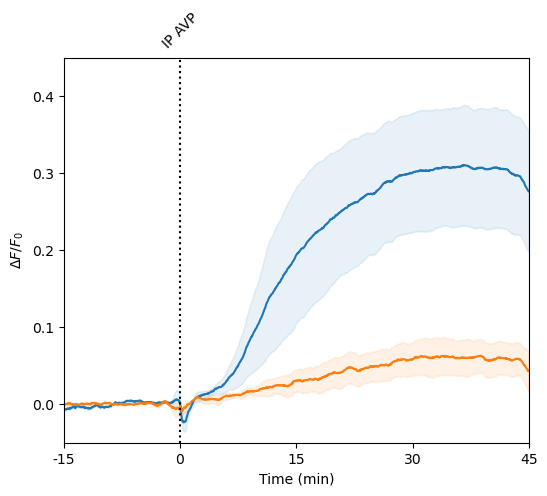

In [1949]:
%matplotlib inline
# IP AVP at AVPs vs OXTs
#plt.plot(np.array(data_ip_avp_avps_sum).T,color='green')
#plt.plot(np.array(data_ip_avp_oxts_sum).T,color='gray')
#'#1f77b4', '#ff7f0e'
tvals = (60/np.array(data_ip_avp_avps_sum).shape[1])*np.arange(np.array(data_ip_avp_avps_sum).shape[1])-15
print(len(data_ip_avp_avps_sum))
ci = np.std(np.array(data_ip_avp_avps_sum).T,axis=1)/np.sqrt(np.array(data_ip_avp_avps_sum).T.shape[1])
fig, ax = plt.subplots(figsize=(6,5))
ax.plot(tvals,np.mean(np.array(data_ip_avp_avps_sum).T,axis=1),color='#1f77b4')
ax.fill_between(tvals,(np.mean(np.array(data_ip_avp_avps_sum).T,axis=1)-ci), (np.mean(np.array(data_ip_avp_avps_sum).T,axis=1)+ci), color='#1f77b4', alpha=.1)

print(len(data_ip_avp_oxts_sum))
ci = np.std(np.array(data_ip_avp_oxts_sum).T,axis=1)/np.sqrt(np.array(data_ip_avp_oxts_sum).T.shape[1])
#fig, ax = plt.subplots()
ax.plot(tvals,np.mean(np.array(data_ip_avp_oxts_sum).T,axis=1),color='#ff7f0e')
ax.fill_between(tvals,(np.mean(np.array(data_ip_avp_oxts_sum).T,axis=1)-ci), (np.mean(np.array(data_ip_avp_oxts_sum).T,axis=1)+ci), color='#ff7f0e', alpha=.1)
ax.set_ylim(-0.05,0.45)
ax.vlines(x=0,ymin=-0.05, ymax=0.45,color='black',linestyle='dotted')
ax.set_xticks([0.1],  ['IP AVP'],rotation=45,minor=True)
ax.set_xticks(15*np.arange(5)-15,  15*np.arange(5)-15)
ax.tick_params(labeltop=True,bottom=False,labelbottom=False,which='minor')
ax.set_xlim(-15,45)
ax.set_xlabel('Time (min)')
ax.set_ylabel('$\Delta F/F _0$')

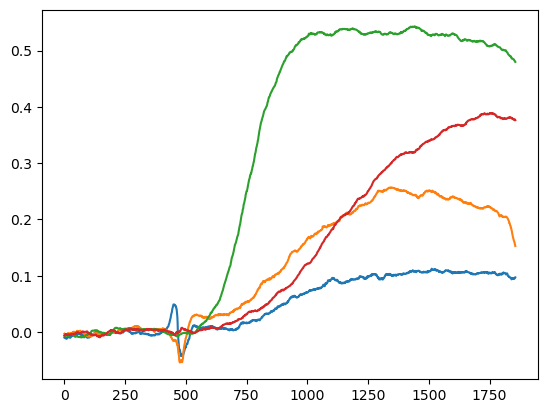

In [1957]:
plt.plot(np.array(data_ip_avp_avps_sum).T)

In [2183]:
avp_vals = np.max(np.array(data_ip_avp_avps_sum),axis=1)
avp_vals_oxt = np.max(np.array(data_ip_avp_oxts_sum),axis=1)
avp_vals

array([0.11246393, 0.25693663, 0.54272171, 0.38894062])

(0.0, 0.6)

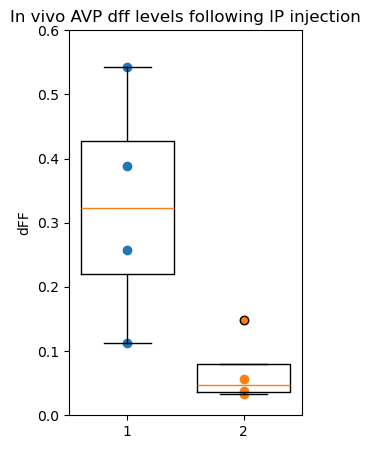

In [2219]:
%matplotlib inline
#'#2ca02c','#8c564b'
fig, ax = plt.subplots(figsize=(3,5))
ax.boxplot([avp_vals,avp_vals_oxt], widths=0.8)
ax.scatter(np.array([1]*(avp_vals).shape[0]),(avp_vals),color='#1f77b4')
ax.scatter(np.array([2]*(avp_vals_oxt).shape[0]),(avp_vals_oxt),color='#ff7f0e')
#ax.scatter(np.array([2]*(np.array(dt505d)/frf).shape[0]),(np.array(dt505d)/frf),color='#2ca02c')
ax.plot()
#ax.hlines(0,xmin=0.5,xmax=2.5,linestyle='dotted',color='black')
#plt.xticks([1,2],['5-HT','5-HT (deconvolved)'])#['5HT-NE $t _{1/2}$'])
ax.set_ylabel('dFF')
ax.set_title('In vivo AVP dff levels following IP injection')
ax.set_ylim(0,0.6)

#for i in range(len(np.vstack((np.array(dt505),np.array(dt505d))).T)):
#    ax.plot([1,2],np.vstack((np.array(dt505)/frf,np.array(dt505d)/frf)).T[i,],marker='none',linestyle='dotted',color='gray')

#print(np.array(dt505)/frf-np.array(dt505d)/frf)
#print(np.mean(np.array(dt505)/frf-np.array(dt505d)/frf)*60)

In [1964]:
avp_taus = []
for i in range(avp_vals.shape[0]):
    avp_taus.append(np.min(np.where(np.array(data_ip_avp_avps_sum)[i,:]>avp_vals[i]*(1-(1/np.e)))[0]))
avp_taus

[1004, 996, 798, 1245]

In [1967]:
np.array(avp_taus)*(60/np.array(data_ip_avp_avps_sum).shape[1])-15

array([17.43941842, 17.180937  , 10.78352181, 25.22617124])

(0.0, 40.0)

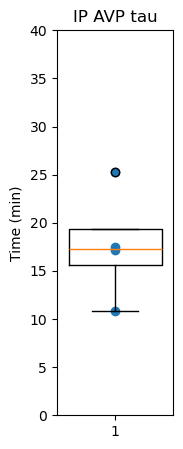

In [2221]:
%matplotlib inline
#'#2ca02c','#8c564b'
fig, ax = plt.subplots(figsize=(1.5,5))
ax.boxplot([np.array(avp_taus)*(60/np.array(data_ip_avp_avps_sum).shape[1])-15], widths=0.8)
ax.scatter(np.array([1]*(np.array(avp_taus)*(60/np.array(data_ip_avp_avps_sum).shape[1])-15).shape[0]),(np.array(avp_taus)*(60/np.array(data_ip_avp_avps_sum).shape[1])-15),color='#1f77b4')
#ax.scatter(np.array([2]*(np.array(dt505d)/frf).shape[0]),(np.array(dt505d)/frf),color='#2ca02c')
ax.plot()
#ax.hlines(0,xmin=0.5,xmax=2.5,linestyle='dotted',color='black')
#plt.xticks([1,2],['5-HT','5-HT (deconvolved)'])#['5HT-NE $t _{1/2}$'])
ax.set_ylabel('Time (min)')
ax.set_title('IP AVP tau')
ax.set_ylim(0,40)

#for i in range(len(np.vstack((np.array(dt505),np.array(dt505d))).T)):
#    ax.plot([1,2],np.vstack((np.array(dt505)/frf,np.array(dt505d)/frf)).T[i,],marker='none',linestyle='dotted',color='gray')

#print(np.array(dt505)/frf-np.array(dt505d)/frf)
#print(np.mean(np.array(dt505)/frf-np.array(dt505d)/frf)*60)

5
2


Text(0, 0.5, '$\\Delta F/F _0$')

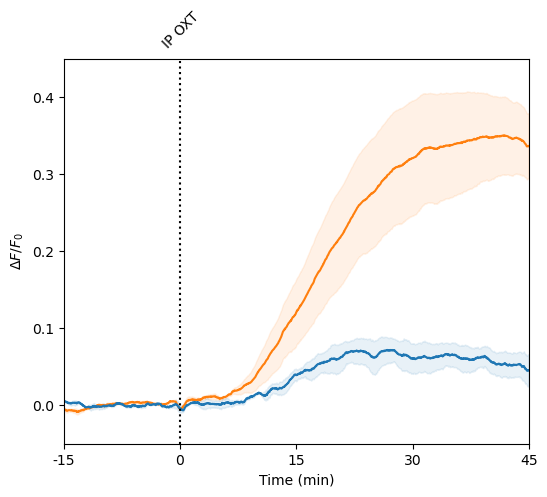

In [1950]:
%matplotlib inline
# IP OXT at OXTs vs AVPs
tvals = (60/np.array(data_ip_oxt_oxts_sum).shape[1])*np.arange(np.array(data_ip_oxt_oxts_sum).shape[1])-15

print(len(data_ip_oxt_oxts_sum))
ci = np.std(np.array(data_ip_oxt_oxts_sum).T,axis=1)/np.sqrt(np.array(data_ip_oxt_oxts_sum).T.shape[1])
fig, ax = plt.subplots(figsize=(6,5))
ax.plot(tvals,np.mean(np.array(data_ip_oxt_oxts_sum).T,axis=1),color='#ff7f0e')
ax.fill_between(tvals,(np.mean(np.array(data_ip_oxt_oxts_sum).T,axis=1)-ci), (np.mean(np.array(data_ip_oxt_oxts_sum).T,axis=1)+ci), color='#ff7f0e', alpha=.1)

print(len(data_ip_oxt_avps_sum))
ci = np.std(np.array(data_ip_oxt_avps_sum).T,axis=1)/np.sqrt(np.array(data_ip_oxt_avps_sum).T.shape[1])
#fig, ax = plt.subplots()
#ax.plot(np.array(data_ip_oxt_avps_sum).T, color='#ff7f0e')
ax.plot(tvals,np.mean(np.array(data_ip_oxt_avps_sum).T,axis=1),color='#1f77b4')
ax.fill_between(tvals,(np.mean(np.array(data_ip_oxt_avps_sum).T,axis=1)-ci), (np.mean(np.array(data_ip_oxt_avps_sum).T,axis=1)+ci), color='#1f77b4', alpha=.1)
ax.set_ylim(-0.05,0.45)
ax.vlines(x=0,ymin=-0.05, ymax=0.45,color='black',linestyle='dotted')
ax.set_xticks([0.1],  ['IP OXT'],rotation=45,minor=True)
ax.set_xticks(15*np.arange(5)-15,  15*np.arange(5)-15)
ax.tick_params(labeltop=True,bottom=False,labelbottom=False,which='minor')
ax.set_xlim(-15,45)
ax.set_xlabel('Time (min)')
ax.set_ylabel('$\Delta F/F _0$')

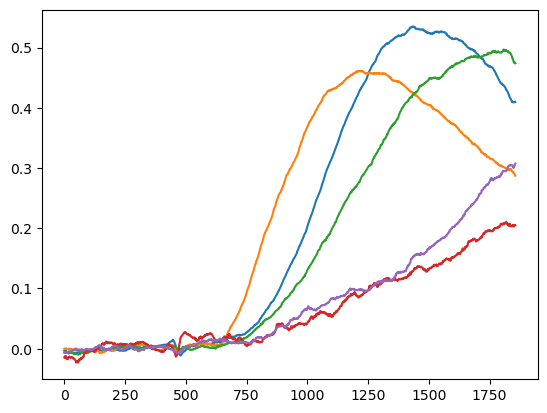

In [1968]:
plt.plot(np.array(data_ip_oxt_oxts_sum).T)

In [2186]:
oxt_vals = np.max(np.array(data_ip_oxt_oxts_sum),axis=1)
oxt_vals_avp = np.max(np.array(data_ip_oxt_avps_sum),axis=1)
oxt_vals

array([0.53497999, 0.46135989, 0.49681797, 0.21070185, 0.30739049])

(0.0, 0.6)

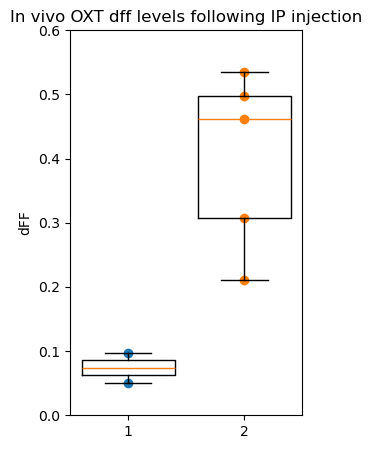

In [2225]:
%matplotlib inline
#'#2ca02c','#8c564b'
fig, ax = plt.subplots(figsize=(3,5))
ax.boxplot([oxt_vals_avp,oxt_vals], widths=0.8)
ax.scatter(np.array([2]*(oxt_vals).shape[0]),(oxt_vals),color='#ff7f0e')
ax.scatter(np.array([1]*(oxt_vals_avp).shape[0]),(oxt_vals_avp),color='#1f77b4')
#ax.scatter(np.array([2]*(np.array(dt505d)/frf).shape[0]),(np.array(dt505d)/frf),color='#2ca02c')
ax.plot()
#ax.hlines(0,xmin=0.5,xmax=2.5,linestyle='dotted',color='black')
#plt.xticks([1,2],['5-HT','5-HT (deconvolved)'])#['5HT-NE $t _{1/2}$'])
ax.set_ylabel('dFF')
ax.set_title('In vivo OXT dff levels following IP injection')
ax.set_ylim(0,0.6)

#for i in range(len(np.vstack((np.array(dt505),np.array(dt505d))).T)):
#    ax.plot([1,2],np.vstack((np.array(dt505)/frf,np.array(dt505d)/frf)).T[i,],marker='none',linestyle='dotted',color='gray')

#print(np.array(dt505)/frf-np.array(dt505d)/frf)
#print(np.mean(np.array(dt505)/frf-np.array(dt505d)/frf)*60)

In [1970]:
oxt_taus = []
for i in range(oxt_vals.shape[0]):
    oxt_taus.append(np.min(np.where(np.array(data_ip_oxt_oxts_sum)[i,:]>oxt_vals[i]*(1-(1/np.e)))[0]))
oxt_taus

[1122, 921, 1270, 1440, 1584]

In [1971]:
np.array(oxt_taus)*(60/np.array(data_ip_oxt_oxts_sum).shape[1])-15

array([21.25201939, 14.75767367, 26.03392569, 31.5266559 , 36.17932149])

(0.0, 40.0)

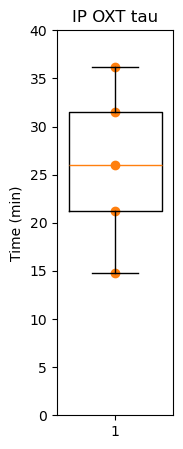

In [2227]:
%matplotlib inline
#'#2ca02c','#8c564b'
fig, ax = plt.subplots(figsize=(1.5,5))
ax.boxplot([np.array(oxt_taus)*(60/np.array(data_ip_oxt_oxts_sum).shape[1])-15], widths=0.8)
ax.scatter(np.array([1]*(np.array(oxt_taus)*(60/np.array(data_ip_oxt_oxts_sum).shape[1])-15).shape[0]),(np.array(oxt_taus)*(60/np.array(data_ip_oxt_oxts_sum).shape[1])-15),color='#ff7f0e')
#ax.scatter(np.array([2]*(np.array(dt505d)/frf).shape[0]),(np.array(dt505d)/frf),color='#2ca02c')
ax.plot()
#ax.hlines(0,xmin=0.5,xmax=2.5,linestyle='dotted',color='black')
#plt.xticks([1,2],['5-HT','5-HT (deconvolved)'])#['5HT-NE $t _{1/2}$'])
ax.set_ylabel('Time (min)')
ax.set_title('IP OXT tau')
ax.set_ylim(0,40)

#for i in range(len(np.vstack((np.array(dt505),np.array(dt505d))).T)):
#    ax.plot([1,2],np.vstack((np.array(dt505)/frf,np.array(dt505d)/frf)).T[i,],marker='none',linestyle='dotted',color='gray')

#print(np.array(dt505)/frf-np.array(dt505d)/frf)
#print(np.mean(np.array(dt505)/frf-np.array(dt505d)/frf)*60)

In [ ]:
# 10x 0: OXT 135, IP 5HT 180 (total run 240 min)
# 10x 1: m1 60, m2 120, m3 180 (ICV 5HT 240) - remove first 1040 vols (total run 285 min)
# 10x 2: m1 60, m2 120 (abort 165 min) - remove first 520 vols and 4160 onward
# 10x 3: m1 60, m2 120, m3 180 (ICV 5HT 240) (total run 285 min)
# 10x 4: m1 60, m2 120, m3 180 (ICV 5HT 240) (total run 285 min)

In [1877]:
# IP 5HT responses across all administrations
data_ip_5ht_5hts = []
for l in [0]:
    c = clus_5ht_10x[l]
    ons = cnmf_dicts_invivo_10x[l]['5ht_vol_onset']
    #ons = 800
    #print(ons)
    minbase = 15
    minpost = 45
    f0_range = 5
    data = sg.medfilt(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==c,...][...,np.ceil(ons-minbase*cnmf_dicts_invivo_10x[l]['vol_per_min']-15).astype('int'):np.ceil(ons+minpost*cnmf_dicts_invivo_10x[l]['vol_per_min']+15).astype('int')],[1,31])[...,15:-15]
    f0 = np.mean(data[...,np.ceil((minbase-f0_range)*cnmf_dicts_invivo_10x[l]['vol_per_min']).astype('int'):np.ceil(minbase*cnmf_dicts_invivo_10x[l]['vol_per_min']).astype('int')],axis=1)
    dff = (data.T-f0)/f0
    data_ip_5ht_5hts.append(dff)

for l in [2]:
    c = clus_5ht_10x[l]
    ons = cnmf_dicts_invivo_10x[l]['m1_vol_onset']
    #ons = 800
    #print(ons)
    minbase = 15
    minpost = 45
    f0_range = 5
    data = sg.medfilt(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==c,...][...,np.ceil(ons-minbase*cnmf_dicts_invivo_10x[l]['vol_per_min']-15).astype('int'):np.ceil(ons+minpost*cnmf_dicts_invivo_10x[l]['vol_per_min']+15).astype('int')],[1,31])[...,15:-15]
    f0 = np.mean(data[...,np.ceil((minbase-f0_range)*cnmf_dicts_invivo_10x[l]['vol_per_min']).astype('int'):np.ceil(minbase*cnmf_dicts_invivo_10x[l]['vol_per_min']).astype('int')],axis=1)
    dff = (data.T-f0)/f0
    data_ip_5ht_5hts.append(dff)

for l in [1,3,4]:
    c = clus_5ht_10x[l]
    ons = cnmf_dicts_invivo_10x[l]['m1_vol_onset']
    #ons = 800
    #print(ons)
    minbase = 15
    minpost = 45
    f0_range = 5
    data = sg.medfilt(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==c,...][...,np.ceil(ons-minbase*cnmf_dicts_invivo_10x[l]['vol_per_min']-15).astype('int'):np.ceil(ons+minpost*cnmf_dicts_invivo_10x[l]['vol_per_min']+15).astype('int')],[1,31])[...,15:-15]
    f0 = np.mean(data[...,np.ceil((minbase-f0_range)*cnmf_dicts_invivo_10x[l]['vol_per_min']).astype('int'):np.ceil(minbase*cnmf_dicts_invivo_10x[l]['vol_per_min']).astype('int')],axis=1)
    dff = (data.T-f0)/f0
    data_ip_5ht_5hts.append(dff)
    
    ons = cnmf_dicts_invivo_10x[l]['m2_vol_onset']
    #ons = 800
    #print(ons)
    minbase = 15
    minpost = 45
    f0_range = 5
    data = sg.medfilt(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==c,...][...,np.ceil(ons-minbase*cnmf_dicts_invivo_10x[l]['vol_per_min']-15).astype('int'):np.ceil(ons+minpost*cnmf_dicts_invivo_10x[l]['vol_per_min']+15).astype('int')],[1,31])[...,15:-15]
    f0 = np.mean(data[...,np.ceil((minbase-f0_range)*cnmf_dicts_invivo_10x[l]['vol_per_min']).astype('int'):np.ceil(minbase*cnmf_dicts_invivo_10x[l]['vol_per_min']).astype('int')],axis=1)
    dff = (data.T-f0)/f0
    data_ip_5ht_5hts.append(dff)
    
    ons = cnmf_dicts_invivo_10x[l]['m3_vol_onset']
    #ons = 800
    #print(ons)
    minbase = 15
    minpost = 45
    f0_range = 5
    data = sg.medfilt(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==c,...][...,np.ceil(ons-minbase*cnmf_dicts_invivo_10x[l]['vol_per_min']-15).astype('int'):np.ceil(ons+minpost*cnmf_dicts_invivo_10x[l]['vol_per_min']+15).astype('int')],[1,31])[...,15:-15]
    f0 = np.mean(data[...,np.ceil((minbase-f0_range)*cnmf_dicts_invivo_10x[l]['vol_per_min']).astype('int'):np.ceil(minbase*cnmf_dicts_invivo_10x[l]['vol_per_min']).astype('int')],axis=1)
    dff = (data.T-f0)/f0
    data_ip_5ht_5hts.append(dff)

In [1890]:
# ICV 5HT responses in 10x
data_icv_5ht_5hts = []
for l in [1,3,4]:
    c = clus_5ht_10x[l]
    ons = cnmf_dicts_invivo_10x[l]['icv_vol_onset']
    #ons = 800
    #print(ons)
    minbase = 15
    minpost = 45
    f0_range = 5
    data = sg.medfilt(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==c,...][...,np.ceil(ons-minbase*cnmf_dicts_invivo_10x[l]['vol_per_min']-15).astype('int'):np.ceil(ons+minpost*cnmf_dicts_invivo_10x[l]['vol_per_min']).astype('int')],[1,31])[...,15:]
    f0 = np.mean(data[...,np.ceil((minbase-f0_range)*cnmf_dicts_invivo_10x[l]['vol_per_min']).astype('int'):np.ceil(minbase*cnmf_dicts_invivo_10x[l]['vol_per_min']).astype('int')],axis=1)
    dff = (data.T-f0)/f0
    data_icv_5ht_5hts.append(dff)

In [635]:
# 3x full IP+ICV 5HT
data_ip_icv_5ht_5hts = []
for l in [1,3,4]:
    c = clus_5ht_10x[l]
    ons = cnmf_dicts_invivo_10x[l]['m1_vol_onset']
    #ons = 800
    #print(ons)
    minbase = 15
    minpost = 240
    f0_range = 5
    data = sg.medfilt(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==c,...][...,np.ceil(ons-minbase*cnmf_dicts_invivo_10x[l]['vol_per_min']-15).astype('int'):np.ceil(ons+minpost*cnmf_dicts_invivo_10x[l]['vol_per_min']+15).astype('int')],[1,31])[...,0:-15]
    f0 = np.mean(data[...,np.ceil((minbase-f0_range)*cnmf_dicts_invivo_10x[l]['vol_per_min']).astype('int'):np.ceil(minbase*cnmf_dicts_invivo_10x[l]['vol_per_min']).astype('int')],axis=1)
    dff = (data.T-f0)/f0
    data_ip_icv_5ht_5hts.append(dff[:7426,...])

In [636]:
# 3x full IP+ICV 5HT
data_ip_icv_5ht_5hts_raw = []
for l in [1,3,4]:
    c = clus_5ht_10x[l]
    ons = cnmf_dicts_invivo_10x[l]['m1_vol_onset']
    print(ons)
    print(cnmf_dicts_invivo_ip[l]['vol_per_min'])
    print(cnmf_dicts_invivo_10x[l]['vol_per_min'])
    #ons = 800
    #print(ons)
    minbase = 25
    minpost = 270
    f0_range = 5
    data = sg.medfilt(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==c,...][...,np.ceil(ons-minbase*cnmf_dicts_invivo_10x[l]['vol_per_min']-15).astype('int'):np.ceil(ons+minpost*cnmf_dicts_invivo_10x[l]['vol_per_min']+15).astype('int')],[1,31])[...,0:-15]
    #f0 = np.mean(data[...,np.ceil((minbase-f0_range)*cnmf_dicts_invivo_10x[l]['vol_per_min']).astype('int'):np.ceil(minbase*cnmf_dicts_invivo_10x[l]['vol_per_min']).astype('int')],axis=1)
    #dff = (data.T-f0)/f0
    data_ip_icv_5ht_5hts_raw.append(data[...,:7735])

817
30.9375
30.94736842105263
1857
30.937254901960785
30.943859649122807
1857
30.941176470588236
30.943859649122807


In [1879]:
for i in range(len(data_ip_5ht_5hts)):
    print(data_ip_5ht_5hts[i].shape)

(1857, 21)
(1857, 64)
(1857, 27)
(1857, 27)
(1857, 27)
(1857, 11)
(1857, 11)
(1857, 11)
(1857, 8)
(1857, 8)
(1857, 8)


In [1891]:
for i in range(len(data_icv_5ht_5hts)):
    print(data_icv_5ht_5hts[i].shape)

(1856, 27)
(1856, 11)
(1856, 8)


In [639]:
for i in range(len(data_ip_icv_5ht_5hts)):
    print(data_ip_icv_5ht_5hts[i].shape)

(7426, 27)
(7426, 11)
(7426, 8)


In [640]:
for i in range(len(data_ip_icv_5ht_5hts_raw)):
    print(data_ip_icv_5ht_5hts_raw[i].shape)

(27, 7735)
(11, 7735)
(8, 7735)


In [641]:
data_ip_5ht_5hts_sum = []
for i in range(len(data_ip_5ht_5hts)):
    data_ip_5ht_5hts_sum.append(np.mean(data_ip_5ht_5hts[i],axis=1))

In [1892]:
data_icv_5ht_5hts_sum = []
for i in range(len(data_icv_5ht_5hts)):
    data_icv_5ht_5hts_sum.append(np.mean(data_icv_5ht_5hts[i],axis=1))

In [643]:
data_ip_icv_5ht_5hts_sum = []
for i in range(len(data_ip_icv_5ht_5hts)):
    data_ip_icv_5ht_5hts_sum.append(np.mean(data_ip_icv_5ht_5hts[i],axis=1))

In [1873]:
np.array(data_icv_5ht_5hts_sum).shape

(3, 1841)

11
3


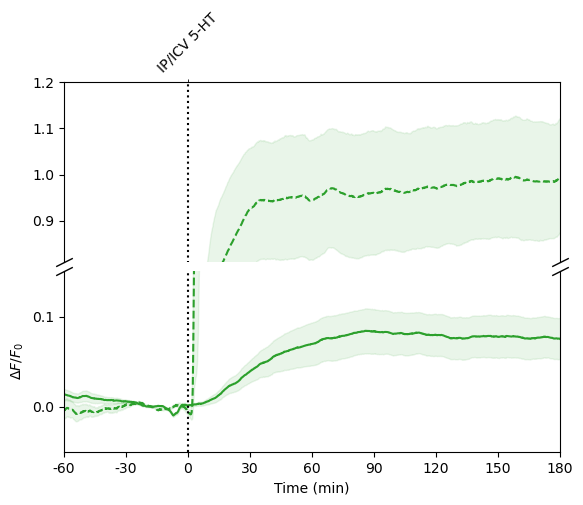

In [1717]:
%matplotlib inline
# IP 5HT at 5HTs - n=11 injections across n=5 animals - compared to ICV 5HT
tvals = (255/np.array(data_icv_5ht_5hts_sum).shape[1])*np.arange(np.array(data_icv_5ht_5hts_sum).shape[1])-70
fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True)
fig.subplots_adjust(hspace=0.05)

print(len(data_ip_5ht_5hts_sum))
ci = np.std(np.array(data_ip_5ht_5hts_sum).T,axis=1)/np.sqrt(np.array(data_ip_5ht_5hts_sum).T.shape[1])
#fig, ax = plt.subplots()
ax2.plot(tvals,np.mean(np.array(data_ip_5ht_5hts_sum)[...,:-1].T,axis=1),color='#2ca02c')
ax2.fill_between(tvals, (np.mean(np.array(data_ip_5ht_5hts_sum).T,axis=1)-ci)[...,:-1], (np.mean(np.array(data_ip_5ht_5hts_sum).T,axis=1)+ci)[...,:-1], color='#2ca02c', alpha=.1)

#ax2.plot(tvals,np.array(data_ip_5ht_5hts_sum)[...,:-1].T,linestyle='dotted',color='gray',alpha=0.8)

print(len(data_icv_5ht_5hts_sum))
ci = np.std(np.array(data_icv_5ht_5hts_sum).T,axis=1)/np.sqrt(np.array(data_icv_5ht_5hts_sum).T.shape[1])
#fig, ax = plt.subplots()

#ax1.plot(np.array(data_icv_5ht_5hts_sum).T,linestyle='dotted')
#ax2.plot(np.array(data_icv_5ht_5hts_sum).T,linestyle='dotted')

ax1.plot(tvals,np.mean(np.array(data_icv_5ht_5hts_sum).T,axis=1), color='#2ca02c',linestyle='dashed')
ax1.fill_between(tvals, (np.mean(np.array(data_icv_5ht_5hts_sum).T,axis=1)-ci), (np.mean(np.array(data_icv_5ht_5hts_sum).T,axis=1)+ci), color='#2ca02c', alpha=.1)
ax2.plot(tvals,np.mean(np.array(data_icv_5ht_5hts_sum).T,axis=1), color='#2ca02c',linestyle='dashed')
ax2.fill_between(tvals, (np.mean(np.array(data_icv_5ht_5hts_sum).T,axis=1)-ci), (np.mean(np.array(data_icv_5ht_5hts_sum).T,axis=1)+ci), color='#2ca02c', alpha=.1)

ax2.set_ylim(-0.05,0.15)  # outliers only
ax1.set_ylim(0.81,1.2)  # most of the data
ax1.spines.bottom.set_visible(False)
ax2.spines.top.set_visible(False)
ax1.xaxis.tick_top()
ax1.tick_params(labeltop=False)  # don't put tick labels at the top
ax2.xaxis.tick_bottom()

import matplotlib.ticker as ticker
ax2.yaxis.set_major_locator(ticker.MultipleLocator(0.1))

d = .5  # proportion of vertical to horizontal extent of the slanted line
kwargs = dict(marker=[(-1, -d), (1, d)], markersize=12,
              linestyle="none", color='k', mec='k', mew=1, clip_on=False)
ax1.plot([0, 1], [0, 0], transform=ax1.transAxes, **kwargs)
ax2.plot([0, 1], [1, 1], transform=ax2.transAxes, **kwargs)
ax1.vlines(x=0,ymin=-0.05,ymax=1.2,color='black',linestyle='dotted')
ax2.vlines(x=0,ymin=-0.05,ymax=1.2,color='black',linestyle='dotted')
ax1.set_xlim(-60,180)
ax2.set_xlim(-60,180)
ax2.set_xlabel('Time (min)')
ax2.set_ylabel('$\Delta F/F _0$')
ax1.set_xticks([0.1],  ['IP/ICV 5-HT'],rotation=45,minor=True)
ax2.set_xticks(30*np.arange(9)-60,  30*np.arange(9)-60)
ax1.tick_params(labeltop=True,bottom=False,labelbottom=False,which='minor')
ax1.tick_params(labeltop=False,top=False,bottom=False,labelbottom=False)
ax2.tick_params(labeltop=False,top=False,bottom=False,labelbottom=False,which='minor')
ax2.tick_params(labeltop=False,top=False,bottom=True,labelbottom=True)


11
3


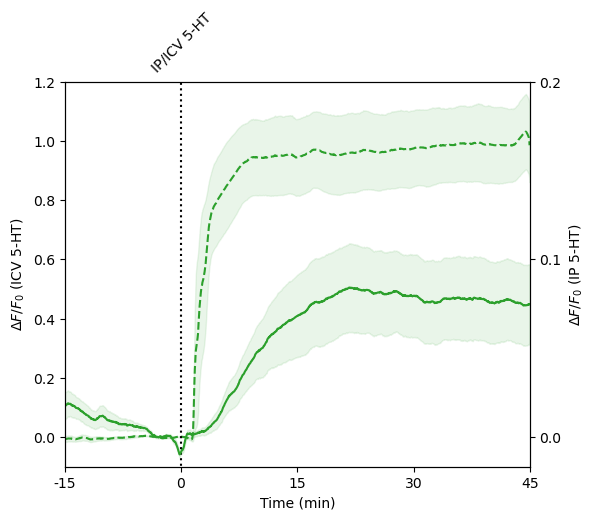

In [2229]:
%matplotlib inline
# IP 5HT at 5HTs - n=11 injections across n=5 animals - compared to ICV 5HT
tvals = (60/np.array(data_icv_5ht_5hts_sum).shape[1])*np.arange(np.array(data_icv_5ht_5hts_sum).shape[1])-15
fig, ax1 = plt.subplots(figsize=(6,5))
ax2 = ax1.twinx()
fig.subplots_adjust(hspace=0.05)

print(len(data_ip_5ht_5hts_sum))
ci = np.std(np.array(data_ip_5ht_5hts_sum).T,axis=1)/np.sqrt(np.array(data_ip_5ht_5hts_sum).T.shape[1])
#fig, ax = plt.subplots()
ax2.plot(tvals,np.mean(np.array(data_ip_5ht_5hts_sum)[...,:-1].T,axis=1),color='#2ca02c')
ax2.fill_between(tvals, (np.mean(np.array(data_ip_5ht_5hts_sum).T,axis=1)-ci)[...,:-1], (np.mean(np.array(data_ip_5ht_5hts_sum).T,axis=1)+ci)[...,:-1], color='#2ca02c', alpha=.1)

#ax2.plot(tvals,np.array(data_ip_5ht_5hts_sum)[...,:-1].T,linestyle='dotted',color='gray',alpha=0.8)

print(len(data_icv_5ht_5hts_sum))
ci = np.std(np.array(data_icv_5ht_5hts_sum).T,axis=1)/np.sqrt(np.array(data_icv_5ht_5hts_sum).T.shape[1])
#fig, ax = plt.subplots()

#ax1.plot(np.array(data_icv_5ht_5hts_sum).T,linestyle='dotted')
#ax2.plot(np.array(data_icv_5ht_5hts_sum).T,linestyle='dotted')

ax1.plot(tvals,np.mean(np.array(data_icv_5ht_5hts_sum).T,axis=1), color='#2ca02c',linestyle='dashed')
ax1.fill_between(tvals, (np.mean(np.array(data_icv_5ht_5hts_sum).T,axis=1)-ci), (np.mean(np.array(data_icv_5ht_5hts_sum).T,axis=1)+ci), color='#2ca02c', alpha=.1)
#ax2.plot(tvals,np.mean(np.array(data_icv_5ht_5hts_sum).T,axis=1), color='#2ca02c',linestyle='dashed')
#ax2.fill_between(tvals, (np.mean(np.array(data_icv_5ht_5hts_sum).T,axis=1)-ci), (np.mean(np.array(data_icv_5ht_5hts_sum).T,axis=1)+ci), color='#2ca02c', alpha=.1)



import matplotlib.ticker as ticker
ax1.yaxis.set_major_locator(ticker.MultipleLocator(0.2))
ax2.yaxis.set_major_locator(ticker.MultipleLocator(0.1))


ax1.vlines(x=0,ymin=-1,ymax=2,color='black',linestyle='dotted')
#ax2.vlines(x=0,ymin=-0.05,ymax=1.2,color='black',linestyle='dotted')
ax1.set_xlim(-15,45)
ax2.set_xlim(-15,45)
ax1.set_ylim(-0.1,1.2)
ax2.set_ylim(-0.1/6,1.2/6)
ax1.set_xlabel('Time (min)')
ax2.set_ylabel('$\Delta F/F _0$ (IP 5-HT)')
ax1.set_ylabel('$\Delta F/F _0$ (ICV 5-HT)')
ax1.set_xticks([0.1],  ['IP/ICV 5-HT'],rotation=45,minor=True)
ax1.set_xticks(15*np.arange(5)-15,  15*np.arange(5)-15)
ax1.tick_params(labeltop=True,bottom=False,labelbottom=False,which='minor')
ax2.tick_params(labeltop=False,top=False,bottom=False,labelbottom=False)
ax2.tick_params(labeltop=False,top=False,bottom=False,labelbottom=False,which='minor')
ax1.tick_params(labeltop=False,top=False,bottom=True,labelbottom=True)


#ax1.vlines(x=3,ymin=-1,ymax=2,color='red',linestyle='dotted')


11
3


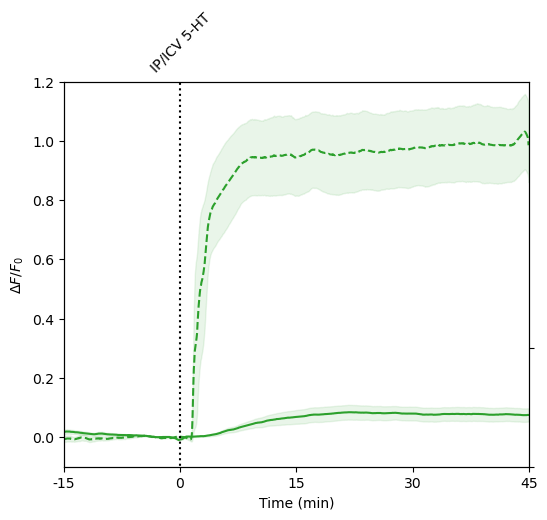

In [2242]:
%matplotlib inline
# IP 5HT at 5HTs - n=11 injections across n=5 animals - compared to ICV 5HT
tvals = (60/np.array(data_icv_5ht_5hts_sum).shape[1])*np.arange(np.array(data_icv_5ht_5hts_sum).shape[1])-15
fig, ax = plt.subplots(figsize=(6,5))
ax2 = ax.twinx()
fig.subplots_adjust(hspace=0.05)

print(len(data_ip_5ht_5hts_sum))
ci = np.std(np.array(data_ip_5ht_5hts_sum).T,axis=1)/np.sqrt(np.array(data_ip_5ht_5hts_sum).T.shape[1])
#fig, ax = plt.subplots()
ax.plot(tvals,np.mean(np.array(data_ip_5ht_5hts_sum)[...,:-1].T,axis=1),color='#2ca02c')
ax.fill_between(tvals, (np.mean(np.array(data_ip_5ht_5hts_sum).T,axis=1)-ci)[...,:-1], (np.mean(np.array(data_ip_5ht_5hts_sum).T,axis=1)+ci)[...,:-1], color='#2ca02c', alpha=.1)

#ax2.plot(tvals,np.array(data_ip_5ht_5hts_sum)[...,:-1].T,linestyle='dotted',color='gray',alpha=0.8)

print(len(data_icv_5ht_5hts_sum))
ci = np.std(np.array(data_icv_5ht_5hts_sum).T,axis=1)/np.sqrt(np.array(data_icv_5ht_5hts_sum).T.shape[1])
#fig, ax = plt.subplots()

#ax1.plot(np.array(data_icv_5ht_5hts_sum).T,linestyle='dotted')
#ax2.plot(np.array(data_icv_5ht_5hts_sum).T,linestyle='dotted')

ax.plot(tvals,np.mean(np.array(data_icv_5ht_5hts_sum).T,axis=1), color='#2ca02c',linestyle='dashed')
ax.fill_between(tvals, (np.mean(np.array(data_icv_5ht_5hts_sum).T,axis=1)-ci), (np.mean(np.array(data_icv_5ht_5hts_sum).T,axis=1)+ci), color='#2ca02c', alpha=.1)
#ax2.plot(tvals,np.mean(np.array(data_icv_5ht_5hts_sum).T,axis=1), color='#2ca02c',linestyle='dashed')
#ax2.fill_between(tvals, (np.mean(np.array(data_icv_5ht_5hts_sum).T,axis=1)-ci), (np.mean(np.array(data_icv_5ht_5hts_sum).T,axis=1)+ci), color='#2ca02c', alpha=.1)



import matplotlib.ticker as ticker
ax.yaxis.set_major_locator(ticker.MultipleLocator(0.2))
ax2.set_yticks([-0.1,0.3],[-0.1,0.3])
#ax2.yaxis.set_major_locator(ticker.MultipleLocator(0.1))


ax.vlines(x=0,ymin=-1,ymax=2,color='black',linestyle='dotted')
#ax2.vlines(x=0,ymin=-0.05,ymax=1.2,color='black',linestyle='dotted')
ax.set_xlim(-15,45)
#ax2.set_xlim(-15,45)
ax.set_ylim(-0.1,1.2)
ax2.set_ylim(-0.1,1.2)
#ax2.set_ylim(-0.1/6,1.2/6)
ax.set_xlabel('Time (min)')
#ax2.set_ylabel('$\Delta F/F _0$ (IP 5-HT)')
ax.set_ylabel('$\Delta F/F _0$')
ax.set_xticks([0.1],  ['IP/ICV 5-HT'],rotation=45,minor=True)
ax.set_xticks(15*np.arange(5)-15,  15*np.arange(5)-15)
ax.tick_params(labeltop=True,bottom=False,labelbottom=False,which='minor')
ax2.tick_params(labeltop=False,top=False,bottom=False,labelbottom=False,labelright=False)
#ax2.tick_params(labeltop=False,top=False,bottom=False,labelbottom=False,which='minor')
ax.tick_params(labeltop=False,top=False,bottom=True,labelbottom=True)


#ax1.vlines(x=3,ymin=-1,ymax=2,color='red',linestyle='dotted')


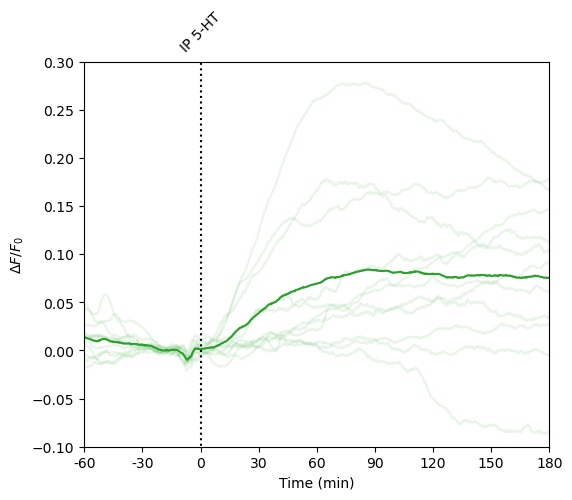

In [1016]:
%matplotlib inline
tvals = (255/np.array(data_icv_5ht_5hts_sum).shape[1])*np.arange(np.array(data_icv_5ht_5hts_sum).shape[1])-70
fig, ax = plt.subplots(figsize=(6,5))

ax.plot(tvals,np.array(data_ip_5ht_5hts_sum)[...,:-1].T,color='#2ca02c',alpha=0.1)
ax.plot(tvals,np.mean(np.array(data_ip_5ht_5hts_sum)[...,:-1].T,axis=1),color='#2ca02c')
ax.vlines(x=0,ymin=-0.5,ymax=1.2,color='black',linestyle='dotted')
ax.set_xlim(-60,180)
ax.set_ylim(-0.1,0.3)
ax.set_xlabel('Time (min)')
ax.set_ylabel('$\Delta F/F _0$')
ax.set_xticks(30*np.arange(9)-60,  30*np.arange(9)-60)
ax.set_xticks([0.1],  ['IP 5-HT'],rotation=45,minor=True)
ax.tick_params(labeltop=True,bottom=False,labelbottom=False,which='minor')
ax.tick_params(labeltop=False,top=False,bottom=True,labelbottom=True)

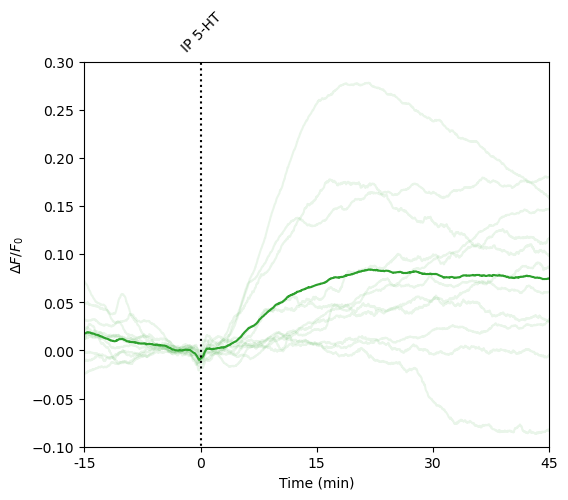

In [2244]:
%matplotlib inline
tvals = (60/np.array(data_icv_5ht_5hts_sum).shape[1])*np.arange(np.array(data_icv_5ht_5hts_sum).shape[1])-15
fig, ax = plt.subplots(figsize=(6,5))

ax.plot(tvals,np.array(data_ip_5ht_5hts_sum)[...,:-1].T,color='#2ca02c',alpha=0.1)
ax.plot(tvals,np.mean(np.array(data_ip_5ht_5hts_sum)[...,:-1].T,axis=1),color='#2ca02c')
ax.vlines(x=0,ymin=-0.5,ymax=1.2,color='black',linestyle='dotted')
ax.set_xlim(-15,45)
ax.set_ylim(-0.1,0.3)
ax.set_xlabel('Time (min)')
ax.set_ylabel('$\Delta F/F _0$')
ax.set_xticks(15*np.arange(5)-15,  15*np.arange(5)-15)
ax.set_xticks([0.1],  ['IP 5-HT'],rotation=45,minor=True)
ax.tick_params(labeltop=True,bottom=False,labelbottom=False,which='minor')
ax.tick_params(labeltop=False,top=False,bottom=True,labelbottom=True)

In [2251]:
np.array(data_ip_5ht_5hts_sum).shape

(11, 1857)

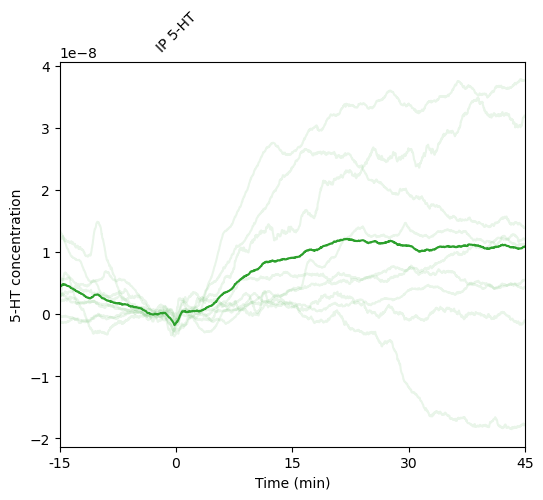

In [2254]:
%matplotlib inline
tvals = (60/np.array(traces_conc).shape[0])*np.arange(np.array(traces_conc).shape[0])-15
fig, ax = plt.subplots(figsize=(6,5))

ax.plot(tvals,np.array(traces_conc),color='#2ca02c',alpha=0.1)
ax.plot(tvals,np.mean(np.array(traces_conc),axis=1),color='#2ca02c')
#ax.vlines(x=0,ymin=-0.5,ymax=1.2,color='black',linestyle='dotted')
ax.set_xlim(-15,45)
#ax.set_ylim(-0.1,0.3)
ax.set_xlabel('Time (min)')
ax.set_ylabel('5-HT concentration')
ax.set_xticks(15*np.arange(5)-15,  15*np.arange(5)-15)
ax.set_xticks([0.1],  ['IP 5-HT'],rotation=45,minor=True)
ax.tick_params(labeltop=True,bottom=False,labelbottom=False,which='minor')
ax.tick_params(labeltop=False,top=False,bottom=True,labelbottom=True)

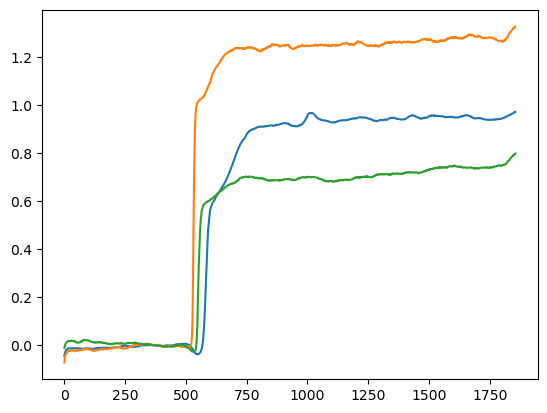

In [646]:
plt.plot(np.array(data_icv_5ht_5hts_sum).T)

In [647]:
divs = np.hstack((np.repeat(np.mean(np.array(data_icv_5ht_5hts_sum)[...,1000:1500],axis=1)[0],3),np.repeat(np.mean(np.array(data_icv_5ht_5hts_sum)[...,1000:1500],axis=1)[1],3),np.repeat(np.mean(np.array(data_icv_5ht_5hts_sum)[...,1000:1500],axis=1)[2],3)))

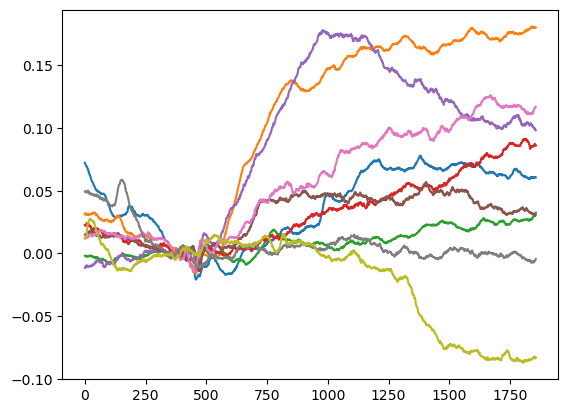

In [648]:
plt.plot(np.array(data_ip_5ht_5hts_sum)[2:,...].T)

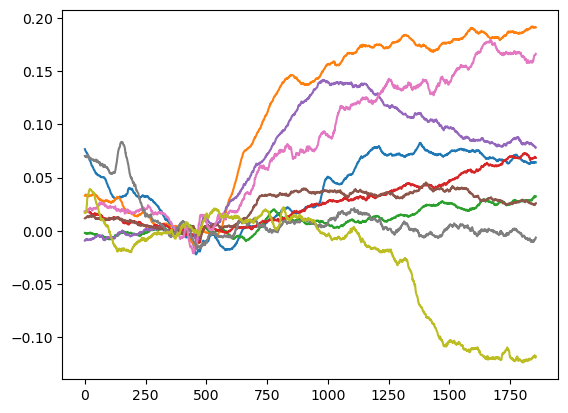

In [649]:
plt.plot(np.array(data_ip_5ht_5hts_sum)[2:,...].T/divs)

In [650]:
ip_vals = np.max((np.array(data_ip_5ht_5hts_sum)[2:,...].T/divs)[600:,...],axis=0)
ip_vals

array([0.08266582, 0.19185123, 0.03250854, 0.07286402, 0.14166894,
       0.04546874, 0.17924273, 0.02138557, 0.02211171])

In [572]:
# load consensus ks/Ls (Powell fit)
save_path_k = r'H:\CNMFoutputs\peter\mask_matching\kds_g.pickle'
save_path_l = r'H:\CNMFoutputs\peter\mask_matching\Ls_g.pickle'

kds_g = load_pickle(save_path_k)
Ls_g = load_pickle(save_path_l)

In [651]:
ip_vals_conc = (kds_g[3]*ip_vals/(Ls_g[3]-ip_vals))

In [2040]:
(kds_g[3]*0.0625/(Ls_g[3]-0.0625))

1.0919010814982031e-08

In [2034]:
(np.array(data_ip_5ht_5hts_sum)[2:,...].T/divs).shape

(1857, 9)

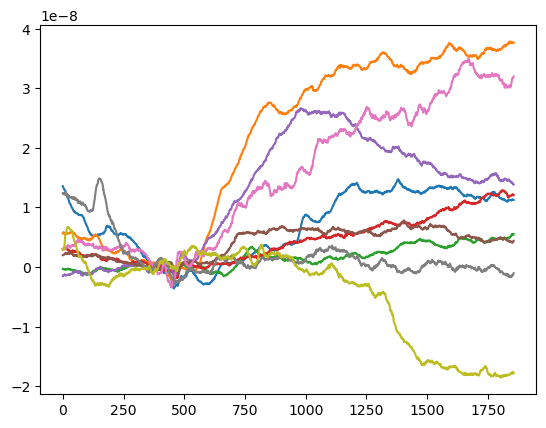

In [2038]:
plt.plot(kds_g[3]*(np.array(data_ip_5ht_5hts_sum)[2:,...].T/divs)/(Ls_g[3]-(np.array(data_ip_5ht_5hts_sum)[2:,...].T/divs)))

In [2367]:
np.mean(ip_vals_conc)

1.6399123528760595e-08

(0.0, 4e-08)

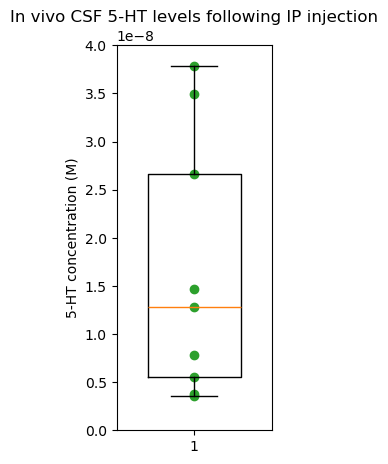

In [2246]:
%matplotlib inline
#'#2ca02c','#8c564b'
fig, ax = plt.subplots(figsize=(2,5))
ax.boxplot([ip_vals_conc], widths=0.6)
ax.scatter(np.array([1]*(ip_vals_conc).shape[0]),(ip_vals_conc),color='#2ca02c')
#ax.scatter(np.array([2]*(np.array(dt505d)/frf).shape[0]),(np.array(dt505d)/frf),color='#2ca02c')
ax.plot()
#ax.hlines(0,xmin=0.5,xmax=2.5,linestyle='dotted',color='black')
#plt.xticks([1,2],['5-HT','5-HT (deconvolved)'])#['5HT-NE $t _{1/2}$'])
ax.set_ylabel('5-HT concentration (M)')
ax.set_title('In vivo CSF 5-HT levels following IP injection')
ax.set_ylim(0,4E-8)

#for i in range(len(np.vstack((np.array(dt505),np.array(dt505d))).T)):
#    ax.plot([1,2],np.vstack((np.array(dt505)/frf,np.array(dt505d)/frf)).T[i,],marker='none',linestyle='dotted',color='gray')

#print(np.array(dt505)/frf-np.array(dt505d)/frf)
#print(np.mean(np.array(dt505)/frf-np.array(dt505d)/frf)*60)

In [1908]:
(np.array(data_ip_5ht_5hts_sum)[2:,...].T/divs).shape

(1857, 9)

In [1909]:
traces_conc = (kds_g[3]*(np.array(data_ip_5ht_5hts_sum)[2:,...].T/divs)/(Ls_g[3]-(np.array(data_ip_5ht_5hts_sum)[2:,...].T/divs)))
traces_conc.shape

(1857, 9)

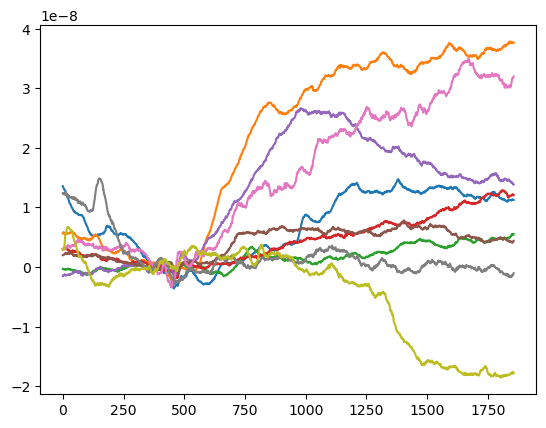

In [1910]:
plt.plot(traces_conc)

In [1911]:
ip_vals_conc.shape

(9,)

In [1932]:
ip_taus_conc = []
for i in range(ip_vals_conc.shape[0]):
    ip_taus_conc.append(np.min(np.where(traces_conc[:,i]>ip_vals_conc[i]*(1-(1/np.e)))[0][np.where(traces_conc[:,i]>ip_vals_conc[i]*(1-(1/np.e)))[0]>600]))

In [1933]:
ip_vals_conc[0]*(1-(1/np.e))

9.294380038803358e-09

In [1934]:
np.min(np.where(traces_conc[:,0]>ip_vals_conc[0]*(1-(1/np.e)))[0][np.where(traces_conc[:,0]>ip_vals_conc[0]*(1-(1/np.e)))[0]>600])

1102

In [1965]:
np.array(ip_taus_conc)*(60/np.array(data_icv_5ht_5hts_sum).shape[1])-15

array([20.625     , 10.50646552, 29.70905172, 33.49137931, 11.28232759,
        7.95258621, 21.07758621, 18.5237069 ,  4.88146552])

In [1936]:
1/(59/np.array(data_icv_5ht_5hts_sum).shape[1])

31.45762711864407

(0.0, 35.0)

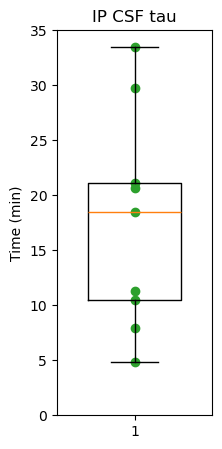

In [2248]:
%matplotlib inline
#'#2ca02c','#8c564b'
fig, ax = plt.subplots(figsize=(2,5))
ax.boxplot([np.array(ip_taus_conc)*(60/np.array(data_icv_5ht_5hts_sum).shape[1])-15], widths=0.6)
ax.scatter(np.array([1]*(np.array(ip_taus_conc)*(60/np.array(data_icv_5ht_5hts_sum).shape[1])-15).shape[0]),(np.array(ip_taus_conc)*(60/np.array(data_icv_5ht_5hts_sum).shape[1])-15),color='#2ca02c')
#ax.scatter(np.array([2]*(np.array(dt505d)/frf).shape[0]),(np.array(dt505d)/frf),color='#2ca02c')
ax.plot()
#ax.hlines(0,xmin=0.5,xmax=2.5,linestyle='dotted',color='black')
#plt.xticks([1,2],['5-HT','5-HT (deconvolved)'])#['5HT-NE $t _{1/2}$'])
ax.set_ylabel('Time (min)')
ax.set_title('IP CSF tau')
ax.set_ylim(0,35)

#for i in range(len(np.vstack((np.array(dt505),np.array(dt505d))).T)):
#    ax.plot([1,2],np.vstack((np.array(dt505)/frf,np.array(dt505d)/frf)).T[i,],marker='none',linestyle='dotted',color='gray')

#print(np.array(dt505)/frf-np.array(dt505d)/frf)
#print(np.mean(np.array(dt505)/frf-np.array(dt505d)/frf)*60)

In [505]:
cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'].shape[1]

8819

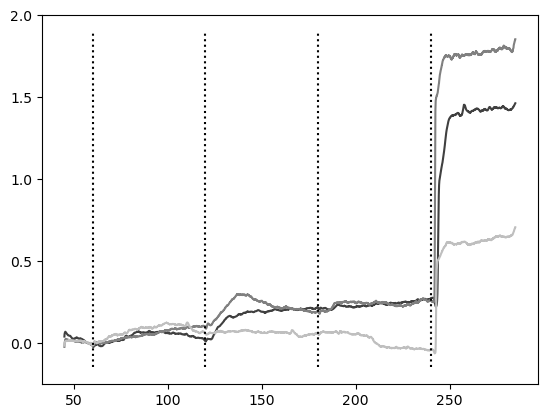

In [653]:
tvals = ((285/cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'].shape[1])*np.arange(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'].shape[1]))[8819-7426:]

cols = []
for p in range(len(data_ip_icv_5ht_5hts_sum)):
    cols.append(((p+1)/4,(p+1)/4,(p+1)/4))
ci = np.std(np.array(data_ip_icv_5ht_5hts_sum).T,axis=1)/np.sqrt(np.array(data_ip_icv_5ht_5hts_sum).T.shape[1])
fig, ax = plt.subplots()
for i in range(len(data_ip_icv_5ht_5hts_sum)):
    ax.plot(tvals,np.array(data_ip_icv_5ht_5hts_sum[i]).T,color=cols[i])#,linestyle='dotted')
#ax.plot(np.array(data_spont_5ht_5hts_sum).T,color='black')

ax.vlines(x=[60,120,180,240],ymin=-0.15,ymax=1.9,color='black',linestyle='dotted')

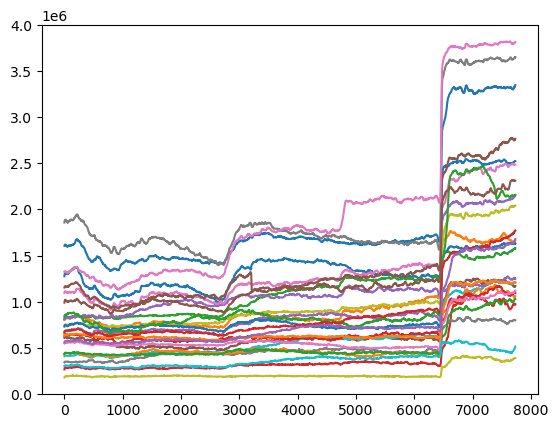

In [683]:
plt.plot(data_ip_icv_5ht_5hts_raw[0].T)

In [655]:
data_ip_icv_5ht_5hts_raw[0].shape

(27, 7735)

In [656]:
data_ip_icv_5ht_5hts_raw_clean = np.zeros((0,data_ip_icv_5ht_5hts_raw[0].shape[1]))
data_ip_icv_5ht_5hts_raw_bg_clean = np.zeros(data_ip_icv_5ht_5hts_raw_clean.shape)
data_ip_icv_5ht_5hts_raw_params_clean = np.zeros((data_ip_icv_5ht_5hts_raw_clean.shape[0],15)) # 5 fit parameters plus start/end and blstart/blend1-2-3 plus ligand id plus row

In [678]:
from scipy.optimize import curve_fit
def func(x, a, b, c, d, e):
    #a=0
    d=0
    return a * np.exp(-b * (x**c)) + d*x + e

In [952]:
c=2
r=8
plt.plot(data_ip_icv_5ht_5hts_raw[c][r,...].T)
plt.vlines(cnmf_dicts_invivo_10x[l]['vol_per_min']*np.array([25,85,145,205]),ymin=np.min(data_ip_icv_5ht_5hts_raw[c][r,...].T),ymax=np.max(data_ip_icv_5ht_5hts_raw[c][r,...].T),colors='r',linestyles='dashed')
print(cnmf_dicts_invivo_10x[l]['vol_per_min']*np.array([25,85,145,205]))

IndexError: index 8 is out of bounds for axis 0 with size 8

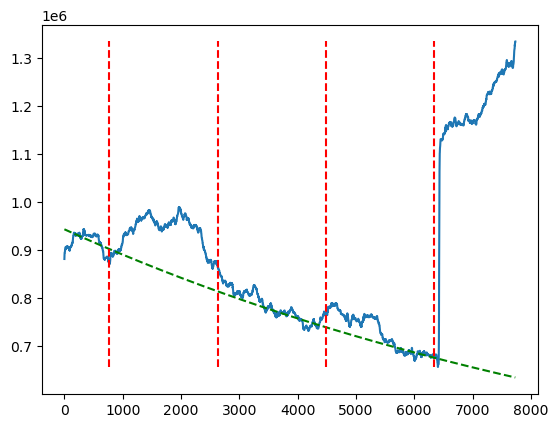

In [948]:
start = 100
end = 6340
blstart1 = 773
blend1 =5500#2620
blstart2 =end#2650
blend2 = end
blstart3 = end
blend3 = end
xdata = np.hstack((np.arange(start,blstart1),np.arange(blend1,blstart2),np.arange(blend2,blstart3),np.arange(blend3,end)))
popt, pcov = curve_fit(func, xdata, data_ip_icv_5ht_5hts_raw[c][r,xdata].T, bounds=([0,0,0,-np.inf,-np.inf], [np.inf,np.inf,1,0,np.inf]), max_nfev = data_ip_icv_5ht_5hts_raw[c].shape[1]*10000)
plt.plot(data_ip_icv_5ht_5hts_raw[c][r,...].T.T)
plt.plot(np.arange(data_ip_icv_5ht_5hts_raw[c].shape[1]), func(np.arange(data_ip_icv_5ht_5hts_raw[c].shape[1]), *popt), 'g--',
         label='fit: a=%5.3f, b=%5.3f, c=%5.3f, d=%5.3f, e=%5.3f' % tuple(popt))
plt.vlines(cnmf_dicts_invivo_10x[l]['vol_per_min']*np.array([25,85,145,205]),ymin=np.min(data_ip_icv_5ht_5hts_raw[c][r,...].T),ymax=np.max(data_ip_icv_5ht_5hts_raw[c][r,...].T),colors='r',linestyles='dashed')
ax = plt.gca()
#ax.set_ylim([np.min(doses_by_ligand[c-1][r,dosestart:doseend].T),np.max(doses_by_ligand[c-1][r,dosestart:doseend].T)])

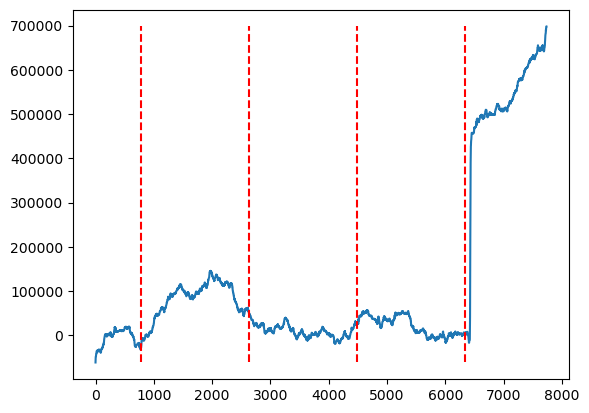

In [949]:
plt.plot(data_ip_icv_5ht_5hts_raw[c][r,...].T-func(np.arange(data_ip_icv_5ht_5hts_raw[c].shape[1]), *popt))
plt.vlines(cnmf_dicts_invivo_10x[l]['vol_per_min']*np.array([25,85,145,205]),ymin=np.min(data_ip_icv_5ht_5hts_raw[c][r,...].T-func(np.arange(data_ip_icv_5ht_5hts_raw[c].shape[1]), *popt)),ymax=np.max(data_ip_icv_5ht_5hts_raw[c][r,...].T-func(np.arange(data_ip_icv_5ht_5hts_raw[c].shape[1]), *popt)),colors='r',linestyles='dashed')
ax = plt.gca()
#ax.set_ylim([np.min((doses_by_ligand[c-1][r,...].T-func(np.arange(doses_by_ligand[c-1].shape[1]), *popt))[dosestart:doseend]),np.max((doses_by_ligand[c-1][r,...].T-func(np.arange(doses_by_ligand[c-1].shape[1]), *popt))[dosestart:doseend])])

In [950]:
data_ip_icv_5ht_5hts_raw_clean = np.vstack((data_ip_icv_5ht_5hts_raw_clean,data_ip_icv_5ht_5hts_raw[c][r,...].T-func(np.arange(data_ip_icv_5ht_5hts_raw[c].shape[1]), *popt)))
data_ip_icv_5ht_5hts_raw_bg_clean = np.vstack((data_ip_icv_5ht_5hts_raw_bg_clean,data_ip_icv_5ht_5hts_raw[c][r,...].T-func(np.arange(data_ip_icv_5ht_5hts_raw[c].shape[1]), *popt)))
data_ip_icv_5ht_5hts_raw_params_clean = np.vstack((data_ip_icv_5ht_5hts_raw_params_clean,np.hstack((popt,start,end,blstart1,blend1,blstart2,blend2,blstart3,blend3,c,r))))

In [995]:
data_ip_icv_5ht_5hts_raw_bg_clean = np.zeros((0,data_ip_icv_5ht_5hts_raw[0].shape[1]))
for j in trange(data_ip_icv_5ht_5hts_raw_clean.shape[0]):
    popt = data_ip_icv_5ht_5hts_raw_params_clean[j,:5]
    data_ip_icv_5ht_5hts_raw_bg_clean = np.vstack((data_ip_icv_5ht_5hts_raw_bg_clean,func(np.arange(data_ip_icv_5ht_5hts_raw[c].shape[1]), *popt)))

  0%|          | 0/46 [00:00<?, ?it/s]

In [994]:
data_ip_icv_5ht_5hts_raw_params_clean.shape

(46, 15)

In [982]:
data_ip_icv_5ht_5hts_raw_params_clean[...,-2]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 2., 2., 2., 2., 2., 2., 2., 2.])

In [996]:
np.save(r'H:\CNMFoutputs\peter\mask_matching\data_ip_icv_5ht_5hts_raw_clean.npy',data_ip_icv_5ht_5hts_raw_clean)
np.save(r'H:\CNMFoutputs\peter\mask_matching\data_ip_icv_5ht_5hts_raw_bg_clean.npy',data_ip_icv_5ht_5hts_raw_bg_clean)
np.save(r'H:\CNMFoutputs\peter\mask_matching\data_ip_icv_5ht_5hts_raw_params_clean.npy',data_ip_icv_5ht_5hts_raw_params_clean)

In [997]:
data_ip_icv_5ht_5hts_raw_bg_clean.shape

(46, 7735)

In [998]:
np.mean(data_ip_icv_5ht_5hts_raw_bg_clean[...,:773],axis=1).shape

(46,)

In [999]:
data_ip_icv_5ht_5hts_raw_clean_dff = (data_ip_icv_5ht_5hts_raw_clean.T/np.mean(data_ip_icv_5ht_5hts_raw_bg_clean[...,:773],axis=1)).T

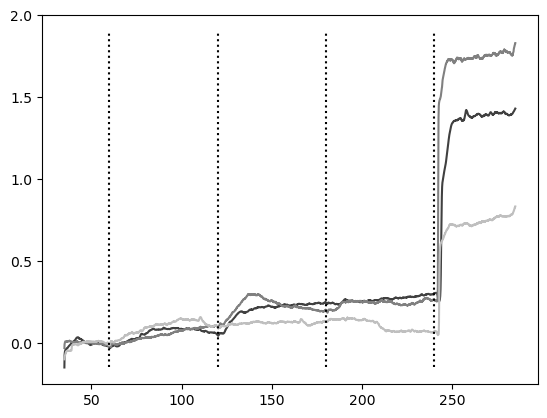

In [1001]:
tvals = ((285/cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'].shape[1])*np.arange(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'].shape[1]))[8819-7735:]

cols = []
for p in range(len(data_ip_icv_5ht_5hts_sum)):
    cols.append(((p+1)/4,(p+1)/4,(p+1)/4))
#ci = np.std(np.array(data_ip_icv_5ht_5hts_sum).T,axis=1)/np.sqrt(np.array(data_ip_icv_5ht_5hts_sum).T.shape[1])
fig, ax = plt.subplots()
for i in range(len(data_ip_icv_5ht_5hts_sum)):
    ax.plot(tvals,np.nanmean(data_ip_icv_5ht_5hts_raw_clean_dff[data_ip_icv_5ht_5hts_raw_params_clean[...,-2]==i,...],axis=0).T,color=cols[i])#,linestyle='dotted')
#ax.plot(np.array(data_spont_5ht_5hts_sum).T,color='black')

ax.vlines(x=[60,120,180,240],ymin=-0.15,ymax=1.9,color='black',linestyle='dotted')

array([ 5.64683004e+01,  5.99334567e+01, -1.63449216e+01, -4.52752299e+01,
        8.00960604e+00,  7.74673714e+01,  3.10449234e+01,  3.07563298e+00,
        9.77493229e+00,  4.30762954e+00,  3.01023056e+01,  2.55179647e+01,
       -1.22997155e+01,  7.54833517e+01, -3.64506151e+00,  6.72606109e+01,
        4.44859869e+01,  8.05511400e+01, -8.31503229e+01,  4.05227571e+01,
        2.19897669e+01,  8.42884292e+00,  1.00016364e+02,  9.59584066e+00,
        5.03712932e+00, -6.91410603e+01,  1.82285414e+01, -3.01974471e+00,
        3.59763146e+00, -9.36520602e+03,  7.96397802e+05, -3.53677973e+01,
        1.21415306e+01,  1.50366678e+01,  1.15682136e+01,  3.02461004e+00,
       -1.37855200e+00,  6.71830970e+00,  2.75272661e+00,  7.21198089e+00,
        3.58091707e+01,  6.11573814e+00, -2.61838500e+06, -4.06066690e+02,
        3.12675060e+01,  1.10628645e+01])

In [58]:
len(clus_5ht_ip)

7

In [75]:
# spontaneous 5HT - n=2
data_spont_5ht_5hts = []
for l in [1,2]:
    c = clus_5ht_ip[l]
    ons = 35*cnmf_dicts_invivo_ip[l]['vol_per_min']-cuts_ip[l]
    #ons = 800
    #print(ons)
    minbase = 15
    minpost = 180
    f0_range = 15
    data = sg.savgol_filter(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw'][cnmf_dicts_invivo_ip[l]['row_clusts_f']==c,...][...,np.ceil(ons-minbase*cnmf_dicts_invivo_ip[l]['vol_per_min']).astype('int'):np.ceil(ons+minpost*cnmf_dicts_invivo_ip[l]['vol_per_min']).astype('int')],10,1)
    f0 = np.mean(data[...,:np.ceil(f0_range*cnmf_dicts_invivo_ip[l]['vol_per_min']).astype('int')],axis=1)
    dff = (data.T-f0)/f0
    data_spont_5ht_5hts.append(dff[:6033,...])

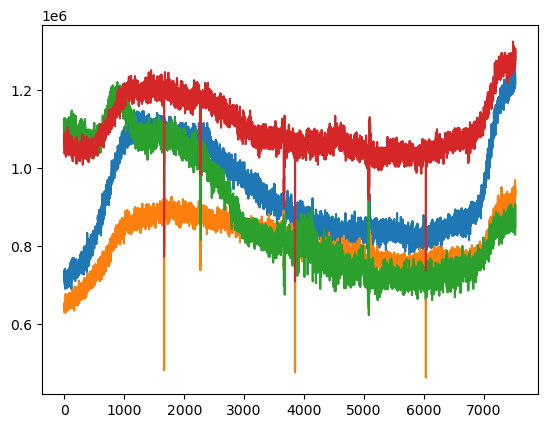

In [171]:
l = 2
c = 1
plt.plot(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw'][cnmf_dicts_invivo_ip[l]['row_clusts_f']==c,...].T)

In [160]:
clus_5ht_ip

[-1, 0, 1, 0, -1, -1, -1]

In [172]:
ons_ip # first IP on l=5 is at 135, no response visible

[[150, 0], [120, 165], [135, 180], [180, 135], [180, 135], [0, 0], [60, 105]]

In [159]:
cuts_ip

[520, 260, 520, 0, 3120, 312, 0]

In [169]:
l = 5
h5t_rows5 = [2,4,34,35,36,37,39]
cut5 = 312

In [76]:
for i in range(len(data_spont_5ht_5hts)):
    print(data_spont_5ht_5hts[i].shape)

(6033, 7)
(6033, 4)


In [153]:
cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_norm1'].shape

(48, 6650)

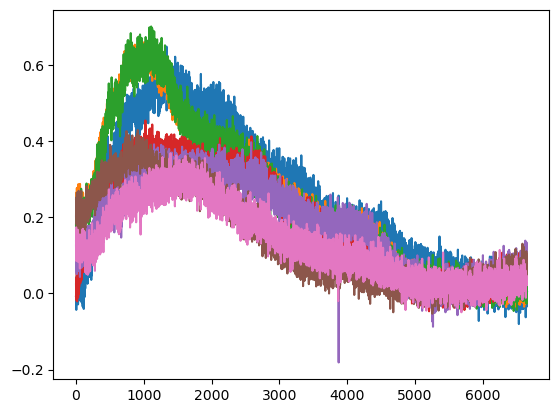

In [170]:
l = 5 #l=5, spont 5HT cells 2,4,34,35,36,37,39
plt.plot(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'][np.argsort(cnmf_dicts_invivo_ip[l]['rises']),...][h5t_rows5,...].T)#, interpolation='nearest', aspect='auto',cmap='bwr')#,vmin=-1,vmax=1.5)

In [ ]:
# what's reasonable here is to just plot each 5-HT wave as it was demonstrated first (one of them was caught late - must have started before imaging)
## perhaps plot all of them relative to the first IP injection, to demonstrate undisturbed period
# then find their peaks and align at the peaks to demonstrate/quantify width/timing (which is pretty consistent)
# maybe estimate tau-on and tau-off to further quantify timings?!

In [1033]:
l_vals = [1,2,5]
ip1_vals = [120,135,135]
row5ht_vals = [[np.where(cnmf_dicts_invivo_ip[1]['row_clusts_f']==0)[0]],[np.where(cnmf_dicts_invivo_ip[2]['row_clusts_f']==1)[0][[0,1,3]]],[np.argsort(cnmf_dicts_invivo_ip[5]['rises'])[h5t_rows5]]]

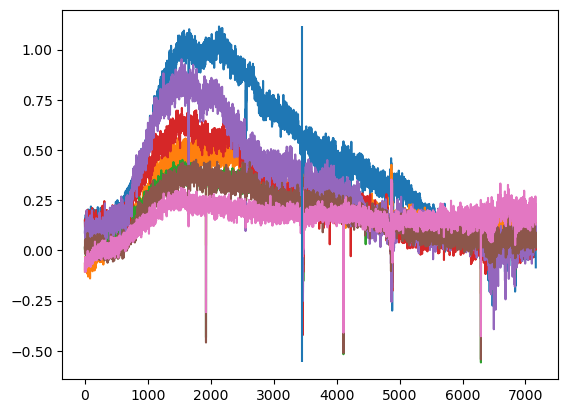

In [1043]:
i = 0
plt.plot(cnmf_dicts_invivo_ip[l_vals[i]]['CY_ref_matched_raw_dff'][row5ht_vals[i][0],...].T)
plt.vlines(x=ip1_vals[i]*cnmf_dicts_invivo_ip[l_vals[i]]['vol_per_min']-cuts_ip[l_vals[i]],ymin=np.min(cnmf_dicts_invivo_ip[l_vals[i]]['CY_ref_matched_raw_dff'][row5ht_vals[i][0],...]),ymax=np.max(cnmf_dicts_invivo_ip[l_vals[i]]['CY_ref_matched_raw_dff'][row5ht_vals[i][0],...]))

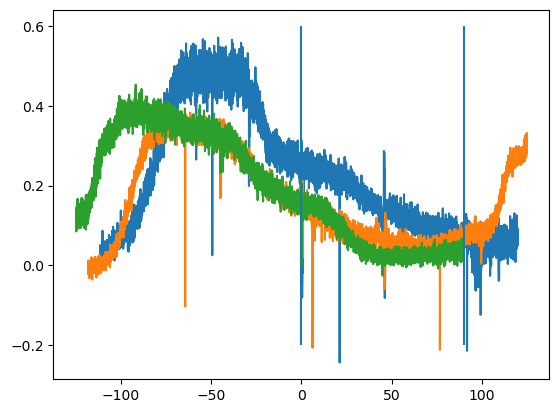

In [241]:
for i in range(3):
    tvals = (np.arange(cnmf_dicts_invivo_ip[l_vals[i]]['CY_ref_matched_raw_dff'].shape[1])-(ip1_vals[i]*cnmf_dicts_invivo_ip[l_vals[i]]['vol_per_min']-cuts_ip[l_vals[i]]))/cnmf_dicts_invivo_ip[l_vals[i]]['vol_per_min']
    plt.plot(tvals,np.median(cnmf_dicts_invivo_ip[l_vals[i]]['CY_ref_matched_raw_dff'][row5ht_vals[i][0],...].T,axis=1))
plt.vlines(x=0,ymin=-0.2,ymax=0.6)
plt.vlines(x=90,ymin=-0.2,ymax=0.6)

In [247]:
tvals[tvals<90].shape[0]

6650

In [1067]:
# plot from start to 90 min after first IP injection
# calculate dff relative to bottom 10% across this range (pre-filtered!)
# then plot median curves for each mouse
# spontaneous 5HT - n=3 finalized 11/16/24
data_spont_5ht_5hts_fin = []
tvals_spont_5ht_5hts_fin = []
for i in range(3):
    tvals = (np.arange(cnmf_dicts_invivo_ip[l_vals[i]]['CY_ref_matched_raw'].shape[1])-(ip1_vals[i]*cnmf_dicts_invivo_ip[l_vals[i]]['vol_per_min']-cuts_ip[l_vals[i]]))/cnmf_dicts_invivo_ip[l_vals[i]]['vol_per_min']
    data = sg.medfilt(cnmf_dicts_invivo_ip[l_vals[i]]['CY_ref_matched_raw'][row5ht_vals[i][0],:tvals[tvals<90].shape[0]],[1,51])
    data_sort = np.sort(data,axis=1)
    f0 = np.mean(data_sort[...,:int(np.ceil(data_sort.shape[1]/15))],axis=1)
    dff = (data.T-f0)/f0
    data_spont_5ht_5hts_fin.append(dff[15:-15])
    tvals_spont_5ht_5hts_fin.append(tvals[tvals<90][15:-15])

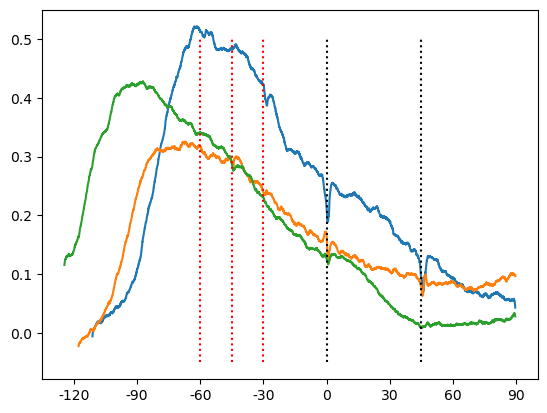

In [1068]:
fig, ax = plt.subplots()
for i in range(3):
    ax.plot(tvals_spont_5ht_5hts_fin[i],np.mean(data_spont_5ht_5hts_fin[i].T,axis=0))
ax.vlines(x=0,ymin=-0.05,ymax=0.5,color='black',linestyle='dotted')
ax.vlines(x=45,ymin=-0.05,ymax=0.5,color='black',linestyle='dotted')
ax.vlines(x=-60,ymin=-0.05,ymax=0.5,color='red',linestyle='dotted')
ax.vlines(x=-45,ymin=-0.05,ymax=0.5,color='red',linestyle='dotted')
ax.vlines(x=-30,ymin=-0.05,ymax=0.5,color='red',linestyle='dotted')
ax.set_xticks(30*np.arange(-4,4),30*np.arange(-4,4))

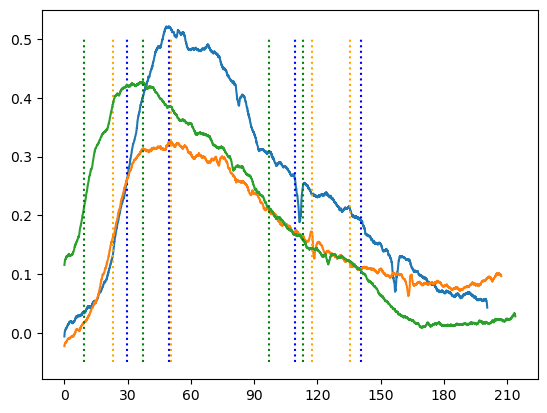

In [1076]:
colslist = ['blue','orange','green']
fwhms = []
tauoffs = []
fig, ax = plt.subplots()
for i in range(3):
    ax.plot(tvals_spont_5ht_5hts_fin[i]-tvals_spont_5ht_5hts_fin[i][0],np.mean(data_spont_5ht_5hts_fin[i].T,axis=0))
    ax.vlines(x=np.where(np.mean(data_spont_5ht_5hts_fin[i].T,axis=0)==np.max(np.mean(data_spont_5ht_5hts_fin[i].T,axis=0)))[0]/cnmf_dicts_invivo_ip[l_vals[i]]['vol_per_min'],ymin=-0.05,ymax=0.5,linestyle='dotted',color=colslist[i])
    ax.vlines(x=(np.where(np.mean(data_spont_5ht_5hts_fin[i].T,axis=0)>np.max(np.mean(data_spont_5ht_5hts_fin[i].T,axis=0))/2)[0]/cnmf_dicts_invivo_ip[l_vals[i]]['vol_per_min'])[-1],ymin=-0.05,ymax=0.5,linestyle='dotted',color=colslist[i])
    ax.vlines(x=(np.where(np.mean(data_spont_5ht_5hts_fin[i].T,axis=0)>np.max(np.mean(data_spont_5ht_5hts_fin[i].T,axis=0))/2)[0]/cnmf_dicts_invivo_ip[l_vals[i]]['vol_per_min'])[0],ymin=-0.05,ymax=0.5,linestyle='dotted',color=colslist[i])
    ax.vlines(x=(np.where(np.mean(data_spont_5ht_5hts_fin[i].T,axis=0)>np.max(np.mean(data_spont_5ht_5hts_fin[i].T,axis=0))/np.e)[0]/cnmf_dicts_invivo_ip[l_vals[i]]['vol_per_min'])[-1],ymin=-0.05,ymax=0.5,linestyle='dotted',color=colslist[i])
    tauoffs.append((np.where(np.mean(data_spont_5ht_5hts_fin[i].T,axis=0)>np.max(np.mean(data_spont_5ht_5hts_fin[i].T,axis=0))/np.e)[0]/cnmf_dicts_invivo_ip[l_vals[i]]['vol_per_min'])[-1]-(np.where(np.mean(data_spont_5ht_5hts_fin[i].T,axis=0)==np.max(np.mean(data_spont_5ht_5hts_fin[i].T,axis=0)))[0]/cnmf_dicts_invivo_ip[l_vals[i]]['vol_per_min'])[0])
    fwhms.append((np.where(np.mean(data_spont_5ht_5hts_fin[i].T,axis=0)>np.max(np.mean(data_spont_5ht_5hts_fin[i].T,axis=0))/2)[0]/cnmf_dicts_invivo_ip[l_vals[i]]['vol_per_min'])[-1]-(np.where(np.mean(data_spont_5ht_5hts_fin[i].T,axis=0)>np.max(np.mean(data_spont_5ht_5hts_fin[i].T,axis=0))/2)[0]/cnmf_dicts_invivo_ip[l_vals[i]]['vol_per_min'])[0])
#ax.vlines(x=45,ymin=-0.05,ymax=0.5,color='black',linestyle='dotted')
#ax.vlines(x=-60,ymin=-0.05,ymax=0.5,color='red',linestyle='dotted')
#ax.vlines(x=-45,ymin=-0.05,ymax=0.5,color='red',linestyle='dotted')
#ax.vlines(x=-30,ymin=-0.05,ymax=0.5,color='red',linestyle='dotted')
ax.set_xticks(30*np.arange(8),30*np.arange(8))

In [1077]:
fwhms

[79.77373737373738, 94.62771908017402, 87.61490950876184]

In [1078]:
tauoffs

[91.08686868686867, 84.77066500932257, 76.07727664464235]

In [1083]:
import seaborn as sns
def adjust_lightness(color, amount=0.5):
    import matplotlib.colors as mc
    import colorsys
    try:
        c = mc.cnames[color]
    except:
        c = color
    c = colorsys.rgb_to_hls(*mc.to_rgb(c))
    return colorsys.hls_to_rgb(c[0], max(0, min(1, amount * c[1])), c[2])

Text(0, 0.5, '$\\Delta F/F _0$')

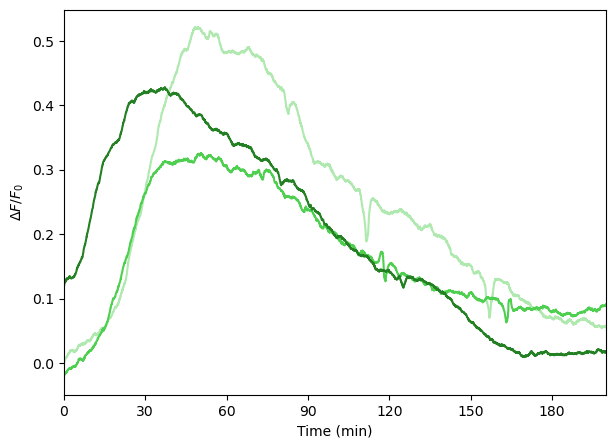

In [1101]:
%matplotlib inline
fig, ax = plt.subplots(figsize=(7,5))
for i in range(3):
    ax.plot(tvals_spont_5ht_5hts_fin[i]-tvals_spont_5ht_5hts_fin[i][0],np.mean(data_spont_5ht_5hts_fin[i].T,axis=0),color=adjust_lightness(sns.color_palette("tab10")[2],2-1.2*(i/2)))
ax.set_xticks(30*np.arange(8),30*np.arange(8))

ax.set_xlim(0,200)
#ax.set_ylim(-0.001,0.01)
ax.set_xlabel('Time (min)')
ax.set_ylabel('$\Delta F/F _0$')

(0.0, 100.0)

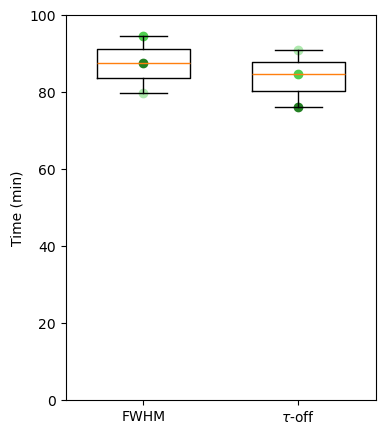

In [2344]:
%matplotlib inline
#'#2ca02c','#8c564b'
fig, ax = plt.subplots(figsize=(4,5))
ax.boxplot([fwhms,tauoffs], widths=0.6)
#ax.scatter(np.array([1]*(fwhms).shape[0]),(fwhms),color='#9467bd')
#ax.scatter(np.array([2]*(tauoffs).shape[0]),(tauoffs),color='#2ca02c')
ax.plot()
#ax.hlines(0,xmin=0.5,xmax=2.5,linestyle='dotted',color='black')
plt.xticks([1,2],['FWHM','$\\tau$-off'])#['5HT-NE $t _{1/2}$'])
ax.set_ylabel('Time (min)')

for i in range(3):
    ax.scatter([1,2],[fwhms[i],tauoffs[i]],color=adjust_lightness(sns.color_palette("tab10")[2],2-1.2*(i/2)))

ax.set_ylim(0,100)

#for i in range(len(np.vstack((np.array(dt50n)[h5t_resp_movs],np.array(dt505))).T)):
#    ax.plot([1,2],np.vstack((np.array(dt50n)[h5t_resp_movs]/frf,np.array(dt505)/frf)).T[i,],marker='none',linestyle='dotted',color='gray')
   
#for i in range(3):
#    if i==0:
#        ax.plot(0,(np.array(y))[i,0],marker='o',linestyle='none',color='black')
#        ax.plot(0,(np.array(y))[i,1],marker='o',linestyle='none',color='gray',alpha=0.6)
#        ax.plot(0,(np.array(y))[i,2],marker='o',linestyle='none',color='gray',alpha=0.6)
#    elif i==2:
#        ax.plot(1.2,(np.array(y))[i,0],marker='o',linestyle='none',color='gray',alpha=0.6)
#        ax.plot(1.2,(np.array(y))[i,1],marker='o',linestyle='none',color='gray',alpha=0.6)
#        ax.plot(1.2,(np.array(y))[i,2],marker='o',linestyle='none',color='gray',alpha=0.6)
#    else:
#        ax.plot(np.repeat(x[i],3),(np.array(y))[i,:],marker='o',linestyle='none',color='black')#,alpha=1-i/10)

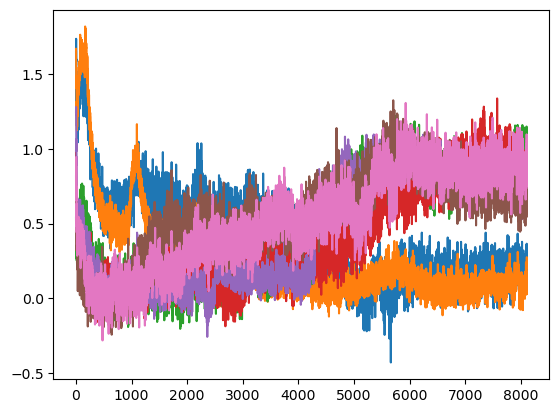

In [152]:
plt.plot(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_norm1'][np.argsort(cnmf_dicts_invivo_ip[l]['rises']),...][[2,4,34,35,36,37,39],...].T)

In [61]:
data_spont_5ht_5hts_sum = []
for i in range(len(data_spont_5ht_5hts)):
    data_spont_5ht_5hts_sum.append(np.mean(data_spont_5ht_5hts[i],axis=1))

3


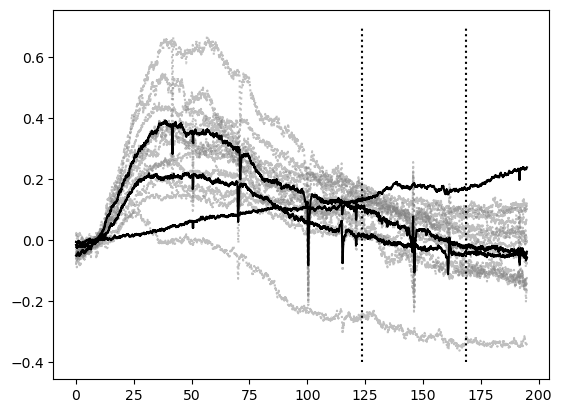

In [62]:
print(len(data_spont_5ht_5hts_sum))
tvals = ((195/np.array(data_spont_5ht_5hts_sum).shape[1])*np.arange(np.array(data_spont_5ht_5hts_sum).shape[1]))
ci = np.std(np.array(data_spont_5ht_5hts_sum).T,axis=1)/np.sqrt(np.array(data_spont_5ht_5hts_sum).T.shape[1])
fig, ax = plt.subplots()
ax.plot(tvals,np.hstack((data_spont_5ht_5hts[0],data_spont_5ht_5hts[1])),linestyle='dotted',color='gray',alpha=0.5)
ax.plot(tvals,np.array(data_spont_5ht_5hts_sum).T,color='black')
ax.vlines(x=[(cnmf_dicts_invivo_ip[l]['oxt_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min'])-11.5,(cnmf_dicts_invivo_ip[l]['avp_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min'])-11.5],ymin=-0.4,ymax=0.7,color='black',linestyle='dotted')

[[-1  0  1  2  3]
 [42  4 13  6  9]]
['unclear', 'OXT', 'AVP', '5HT?']
4770


('row_clusts',
 'clust_ids',
 'savs_filt_norm1',
 'oxt_rm',
 'avp_rm',
 'vol_per_min',
 'avp_vol_onset',
 'oxt_vol_onset',
 'row_clusts_f')

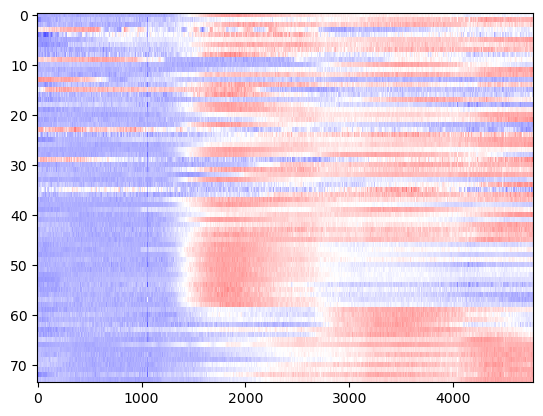

In [2395]:
# IP AVP/OXT heatmap - l=4 best but l=3 perhaps?
l = 4
plt.imshow(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_norm1'][np.argsort(cnmf_dicts_invivo_ip[l]['row_clusts_f']),...], interpolation='nearest',aspect='auto',cmap='bwr',vmin=-1,vmax=2)
print(np.array(np.unique(cnmf_dicts_invivo_ip[l]['row_clusts_f'], return_counts=True)))
print(cnmf_dicts_invivo_ip[l]['clust_ids'])
print(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_norm1'].shape[1])
tuple(np.array(list(cnmf_dicts_invivo_ip[l].keys()))[list(cnmf_dicts_invivo_ip[l].keys()).index('row_clusts'):])

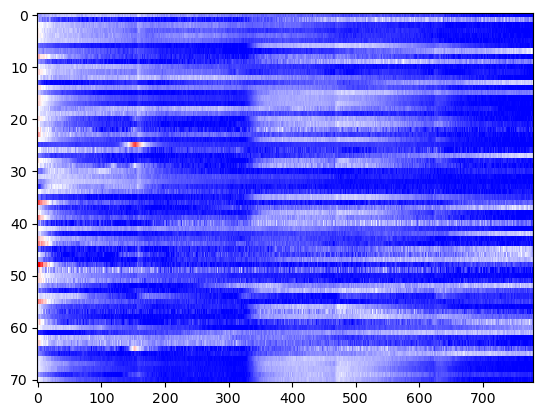

In [2386]:
plt.imshow(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_norm1'][np.argsort(cnmf_dicts_invivo_ip[l]['row_clusts_f']),...][...,:1560], interpolation='nearest',aspect='auto',cmap='bwr',vmin=0)

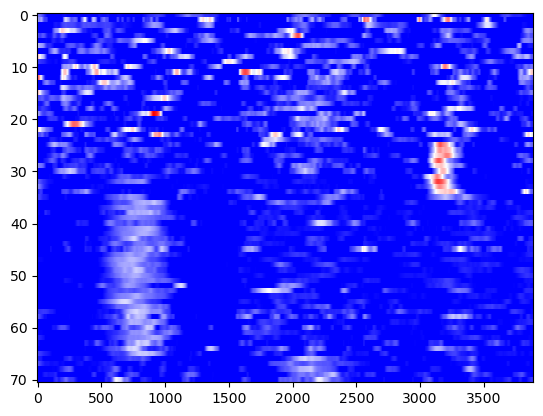

In [2373]:
plt.imshow(cnmf_dicts_invivo_ip[l]['savs_filt_norm1'][np.argsort(cnmf_dicts_invivo_ip[l]['row_clusts_f']),...], interpolation='nearest',aspect='auto',cmap='bwr',vmin=0)#,vmin=-1,vmax=2)

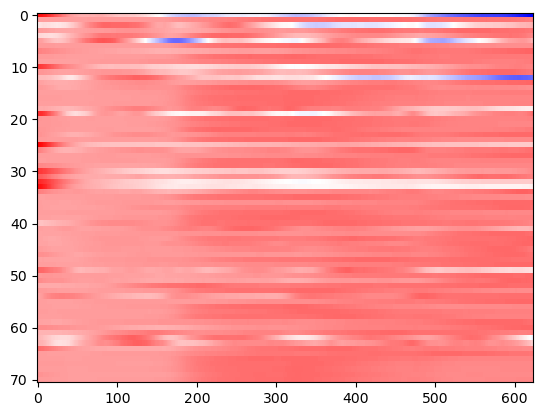

In [2374]:
# bandpass and cluster wells001 NE/DA responses - only use bandpass for clustering (want to show lack of slow-ish KCl signal later)
sample_rate = 31/60
def lowpass(data: np.ndarray, cutoff: float, sample_rate: float, poles: int = 5):
    sos = sg.butter(poles, cutoff, 'lowpass', fs=sample_rate, output='sos')
    filtered_data = scipy.signal.sosfiltfilt(sos, data)
    return filtered_data
def highpass(data: np.ndarray, cutoff: float, sample_rate: float, poles: int = 5):
    sos = sg.butter(poles, cutoff, 'highpass', fs=sample_rate, output='sos')
    filtered_data = scipy.signal.sosfiltfilt(sos, data)
    return filtered_data
def bandpass(data: np.ndarray, cutoff, sample_rate: float, poles: int = 5):
    sos = sg.butter(poles, cutoff, 'bandpass', fs=sample_rate, output='sos')
    filtered_data = scipy.signal.sosfiltfilt(sos, data)
    return filtered_data

times = np.arange(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_norm1'][np.argsort(cnmf_dicts_invivo_ip[l]['row_clusts_f']),...][...,:1560].shape[1])/sample_rate #[...,:936]

#filtered = lowpass(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_norm1'][hdbs_invivo.labels_==c,...][...,:2400], 1/600, sample_rate)
#filtered = cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_norm1'][hdbs_invivo.labels_==c,...][...,:2400]-highpass(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_norm1'][hdbs_invivo.labels_==c,...][...,:2400], 1/600, sample_rate,1)
#filtered =  bandpass(CY_m_matched_raw_corr_norm1[...,:3000], [1/8000,1/50], sample_rate,1)
filteredu = bandpass(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_norm1'][...,:1560], [1/6000,1/150], sample_rate,1) #[np.argsort(hdbs_invivo.labels_),...]
#filtered2 = bandpass(CY_m2_matched_raw_gr_corr_norm1[...,:2000], [1/4000,1/50], sample_rate,1) #[np.argsort(hdbs_invivo.labels_),...]

#from matplotlib import colors
#divnorm=colors.TwoSlopeNorm(vcenter=0)
filteredu_sort = np.sort(filteredu[...,156:936],axis=1)
#filteredu_b10 = np.mean(filteredu_sort[:,:int(np.ceil(filteredu_sort.shape[1]/10))],axis=1) #[[x for x in np.arange(21).tolist() if x not in oxt_rm],...]
filteredu_b10 = np.mean(filteredu[...,156:300],axis=1)
filteredu_t10 = np.mean(filteredu_sort[:,-int(np.ceil(filteredu_sort.shape[1]/10)):],axis=1)
filteredu_norm1 = ((filteredu[...,156:936].T-filteredu_b10)/(filteredu_t10-filteredu_b10)).T
plt.imshow(filteredu_norm1[np.argsort(cnmf_dicts_invivo_ip[l]['row_clusts_f']),...],interpolation='nearest',aspect='auto',cmap='bwr')#,vmax=1)

#filtered2_sort = np.sort(filtered2,axis=1)
#filtered2_b10 = np.mean(filtered2_sort[:,:int(np.ceil(filtered2_sort.shape[1]/10))],axis=1) #[[x for x in np.arange(21).tolist() if x not in oxt_rm],...]
#filtered2_t10 = np.mean(filtered2_sort[:,-int(np.ceil(filtered2_sort.shape[1]/10)):],axis=1)
#filtered2_norm1 = ((filtered2.T-filtered2_b10)/(filtered2_t10-filtered2_b10)).T
#plt.imshow(filtered2_norm1[np.argsort(hdbs_slice_w.labels_),...],interpolation='nearest',aspect='auto',cmap='bwr',vmax=1)

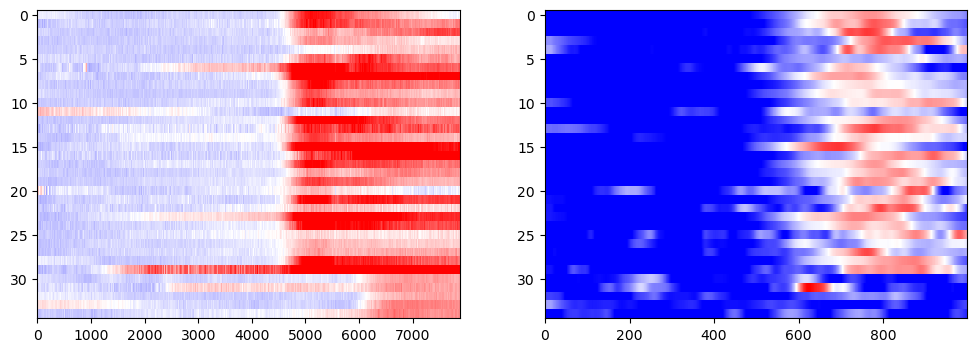

In [2375]:
plt.figure(figsize=(12,4))
plt.subplot(1, 2, 1)
plt.imshow(
    np.vstack((cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...])),
    interpolation='nearest',aspect='auto',cmap='bwr',vmin=-0.5,vmax=0.8)
plt.subplot(1, 2, 2)
plt.imshow(
    np.vstack((cnmf_dicts_invivo_ip[l]['savs_filt_norm1'][cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],cnmf_dicts_invivo_ip[l]['savs_filt_norm1'][cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...]))[...,:1000],
    interpolation='nearest',aspect='auto',cmap='bwr',vmin=0)#,vmax=2)

In [2163]:
from matplotlib import colors
#,norm=colors.CenteredNorm()

In [2164]:
plt.rcParams['svg.fonttype'] = 'none'

In [2376]:
new_dff = ((cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw'].T-(np.mean(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw'][...,:1000],axis=1)))/(np.mean(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw'][...,:1000],axis=1))).T

In [2167]:
new_dff.shape

(74, 4770)

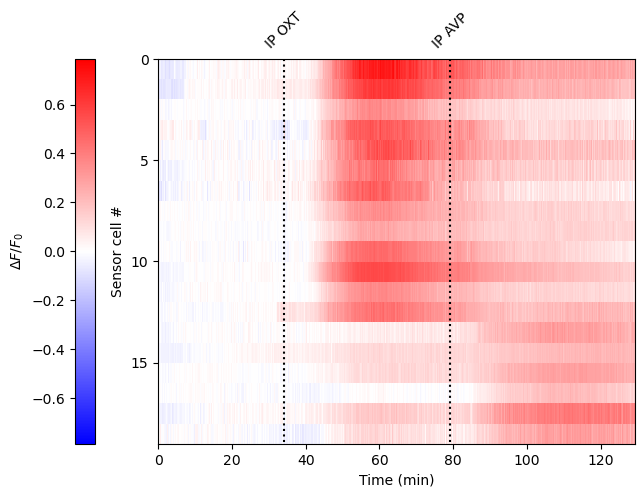

In [2181]:
%matplotlib inline

fig,ax= plt.subplots(figsize=(8.2,5))
f = ax.imshow(
    np.vstack((new_dff[cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],new_dff[cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...]))[...,:4000],
    extent=[0,cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'][...,:4000].shape[1]/cnmf_dicts_invivo_ip[l]['vol_per_min'],np.vstack((cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...])).shape[0],0],
    interpolation='nearest',aspect='auto',cmap='bwr',norm=colors.CenteredNorm())#,vmin=-0.8,vmax=0.8)
ax.vlines(x=[cnmf_dicts_invivo_ip[l]['oxt_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min'],cnmf_dicts_invivo_ip[l]['avp_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min']],
          ymin=0,ymax=np.vstack((cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...])).shape[0],
          color='black',linestyle='dotted')

ax.set_xlabel('Time (min)')
ax.set_ylabel('Sensor cell #')
ax.set_xticks([cnmf_dicts_invivo_ip[l]['oxt_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min'],cnmf_dicts_invivo_ip[l]['avp_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min']],  ['IP OXT','IP AVP'],rotation=45,minor=True)
ax.tick_params(labeltop=True,bottom=False,labelbottom=False,which='minor')
ax.set_yticks(5*np.arange(4),5*np.arange(4))
#ax.set_xticks(25*np.arange(6),25*np.arange(6))

fig.colorbar(f,ax=ax,location='left',label='$\Delta F/F _0$')
#plt.subplot(1, 2, 2)
#plt.imshow(
#    np.vstack((filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...])),
#    extent=[200,1050,np.vstack((filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...])).shape[0],0],
#    interpolation='nearest',aspect='auto',cmap='bwr',vmin=-0.5,vmax=1.5)#,vmin=0)#,vmax=2)
#plt.vlines(x=[312,468,624,780,936],ymin=0,ymax=np.vstack((filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...])).shape[0],color='black',linestyle='dotted')

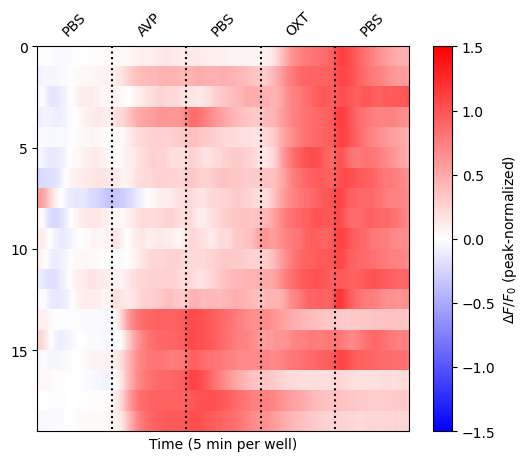

In [1823]:
%matplotlib inline

fig,ax= plt.subplots(figsize=(6,5))
f = ax.imshow(
    np.vstack((filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...])),
    extent=[156,936,np.vstack((filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...])).shape[0],0],
    interpolation='nearest',aspect='auto',cmap='bwr',vmin=-1.5,vmax=1.5)#,vmin=0)#,vmax=2)
ax.vlines(x=[312,468,624,780],ymin=0,ymax=np.vstack((filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...])).shape[0],color='black',linestyle='dotted')
ax.set_xticks([390-156,390,390+156,702,702+156],  ['PBS','AVP','PBS','OXT','PBS'],rotation=45,minor=True)
ax.tick_params(labeltop=True,bottom=False,labelbottom=False,which='minor')
ax.tick_params(bottom=False,labelbottom=False)
ax.set_yticks(5*np.arange(4),5*np.arange(4))
ax.set_xlabel('Time (5 min per well)')
fig.colorbar(f,ax=ax,location='right',label='$\Delta F/F _0$ (peak-normalized)')


In [322]:
keeprows_ip = [1]*np.sum(cnmf_dicts_invivo_ip[l]['row_clusts_f']==1) + [0]*np.sum(cnmf_dicts_invivo_ip[l]['row_clusts_f']==2)

In [323]:
from matplotlib.colors import BoundaryNorm
norm = BoundaryNorm(np.arange(11),11)
color_map = colors.ListedColormap(['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf'])

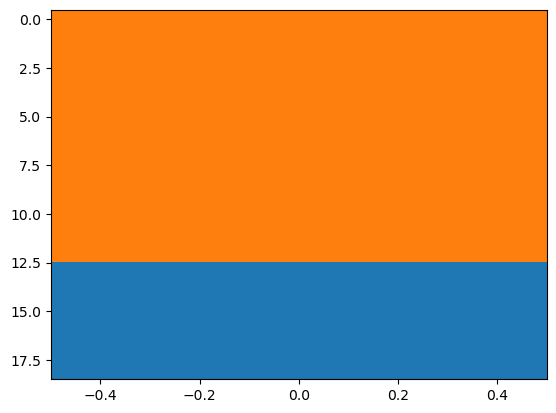

In [326]:
%matplotlib inline
plt.imshow(np.array(keeprows_ip)[...,np.newaxis],cmap=color_map,norm=norm,interpolation='nearest',aspect='auto')

Text(0, 0.5, '$\\Delta F/F _0$')

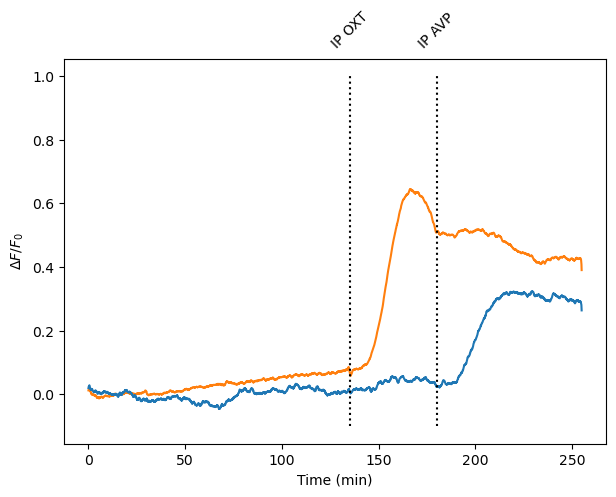

In [2381]:
%matplotlib inline
tvals = (np.arange(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'].shape[1])/cnmf_dicts_invivo_ip[l]['vol_per_min'])[:4000]

fig, ax = plt.subplots(figsize=(7,5))
ax.plot(tvals,np.mean(sg.medfilt(new_dff[cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],[1,31]),axis=0)[:4000],color='#ff7f0e')
ax.plot(tvals,np.mean(sg.medfilt(new_dff[cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...],[1,31]),axis=0)[:4000],color='#1f77b4')
ax.vlines(x=[cnmf_dicts_invivo_ip[l]['oxt_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min'],cnmf_dicts_invivo_ip[l]['avp_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min']],
          ymin=-0.1,ymax=1,
          color='black',linestyle='dotted')

#print(len(data_ip_avp_oxts_sum))
#ci = np.std(np.array(data_ip_avp_oxts_sum).T,axis=1)/np.sqrt(np.array(data_ip_avp_oxts_sum).T.shape[1])
##fig, ax = plt.subplots()
#ax.plot(tvals,np.mean(np.array(data_ip_avp_oxts_sum).T,axis=1),color='#ff7f0e')
#ax.fill_between(tvals,(np.mean(np.array(data_ip_avp_oxts_sum).T,axis=1)-ci), (np.mean(np.array(data_ip_avp_oxts_sum).T,axis=1)+ci), color='#ff7f0e', alpha=.1)
#ax.set_ylim(-0.05,0.45)
#ax.vlines(x=15,ymin=-0.05, ymax=0.45,color='black',linestyle='dotted')
#ax.vlines(x=15,ymin=-1, ymax=1,color='black',linestyle='dotted')
#ax.set_yticks([0,0.05,0.1,0.15],[0,0.05,0.1,0.15])
ax.set_xticks([cnmf_dicts_invivo_ip[l]['oxt_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min'],cnmf_dicts_invivo_ip[l]['avp_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min']],  ['IP OXT','IP AVP'],rotation=45,minor=True)
ax.tick_params(labeltop=True,bottom=False,labelbottom=False,which='minor')
ax.set_xlim(0,129)
ax.set_ylim(-0.05,0.5)
ax.set_xlabel('Time (min)')
ax.set_ylabel('$\Delta F/F _0$')

In [332]:
tvals = (np.arange(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'].shape[1])/cnmf_dicts_invivo_ip[l]['vol_per_min'])[:4000]

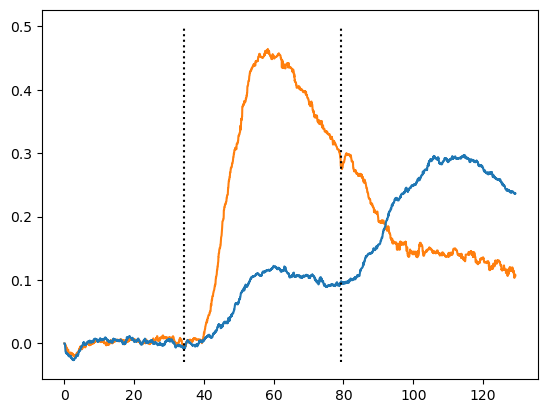

In [353]:
plt.plot(tvals,np.median(sg.medfilt(new_dff[cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],[1,31]),axis=0)[:4000],color='#ff7f0e')
plt.plot(tvals,np.median(sg.medfilt(new_dff[cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...],[1,31]),axis=0)[:4000],color='#1f77b4')
plt.vlines(x=[cnmf_dicts_invivo_ip[l]['oxt_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min'],cnmf_dicts_invivo_ip[l]['avp_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min']],ymin=-0.03,ymax=0.5,
          color='black',linestyle='dotted')

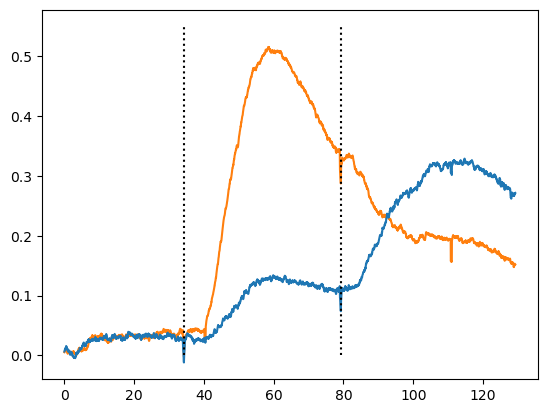

In [333]:
plt.plot(tvals,sg.savgol_filter(np.mean(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],axis=0)[:4000],10,1),color='#ff7f0e')
plt.plot(tvals,sg.savgol_filter(np.mean(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...],axis=0)[:4000],10,1),color='#1f77b4')
plt.vlines(x=[cnmf_dicts_invivo_ip[l]['oxt_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min'],cnmf_dicts_invivo_ip[l]['avp_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min']],ymin=0,ymax=0.55,
          color='black',linestyle='dotted')

In [4028]:
print(cnmf_dicts_invivo_ip[l]['oxt_vol_onset'])
print(cnmf_dicts_invivo_ip[l]['avp_vol_onset'])

1058
2450


[[-1  0  1]
 [25  7 27]]
['MT', '5HT']
7780


('row_clusts',
 'clust_ids',
 'savs_filt_norm1',
 'savs2_filt_norm1',
 '5ht_rm',
 'oxt_rm',
 'avp_rm',
 'mt_rm',
 'vol_per_min',
 'm1_vol_onset',
 'm2_vol_onset',
 'm3_vol_onset',
 'icv_vol_onset',
 'row_clusts_f')

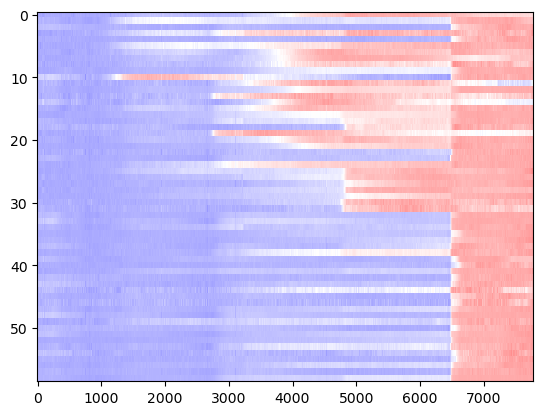

In [2053]:
# 10x heatmap
l = 1 # 1,3,4 are full
plt.imshow(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_norm1'][np.argsort(cnmf_dicts_invivo_10x[l]['row_clusts_f']),...], interpolation='nearest',aspect='auto',cmap='bwr',vmin=-1,vmax=2)
print(np.array(np.unique(cnmf_dicts_invivo_10x[l]['row_clusts_f'], return_counts=True)))
print(cnmf_dicts_invivo_10x[l]['clust_ids'])
print(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_norm1'].shape[1])
tuple(np.array(list(cnmf_dicts_invivo_10x[l].keys()))[list(cnmf_dicts_invivo_10x[l].keys()).index('row_clusts'):])

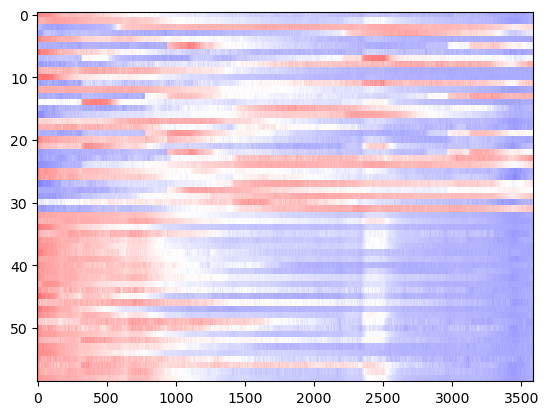

In [2028]:
plt.imshow(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_corr_norm1'][np.argsort(cnmf_dicts_invivo_10x[l]['row_clusts_f']),...], interpolation='nearest',aspect='auto',cmap='bwr',vmin=-1,vmax=2)

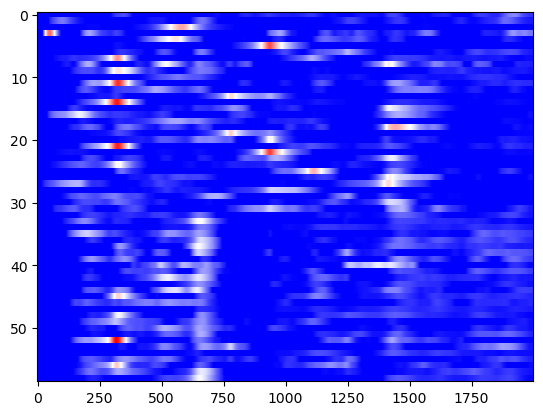

In [2029]:
plt.imshow(cnmf_dicts_invivo_10x[l]['savs2_filt_norm1'][np.argsort(cnmf_dicts_invivo_10x[l]['row_clusts_f']),...], interpolation='nearest',aspect='auto',cmap='bwr',vmin=0)#,vmin=-1,vmax=2)

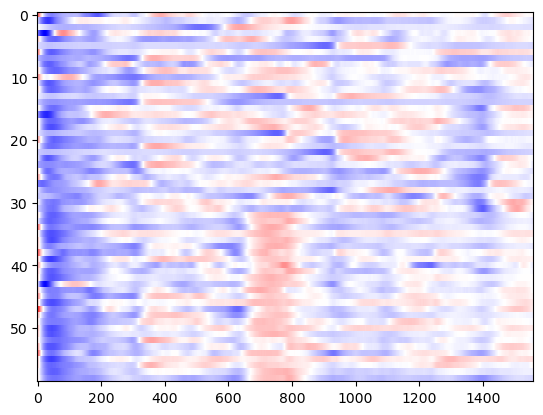

In [2030]:
# bandpass and cluster wells001 NE/DA responses - only use bandpass for clustering (want to show lack of slow-ish KCl signal later)
sample_rate = 31/60
def lowpass(data: np.ndarray, cutoff: float, sample_rate: float, poles: int = 5):
    sos = sg.butter(poles, cutoff, 'lowpass', fs=sample_rate, output='sos')
    filtered_data = scipy.signal.sosfiltfilt(sos, data)
    return filtered_data
def highpass(data: np.ndarray, cutoff: float, sample_rate: float, poles: int = 5):
    sos = sg.butter(poles, cutoff, 'highpass', fs=sample_rate, output='sos')
    filtered_data = scipy.signal.sosfiltfilt(sos, data)
    return filtered_data
def bandpass(data: np.ndarray, cutoff, sample_rate: float, poles: int = 5):
    sos = sg.butter(poles, cutoff, 'bandpass', fs=sample_rate, output='sos')
    filtered_data = scipy.signal.sosfiltfilt(sos, data)
    return filtered_data

times = np.arange(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_corr_norm1'][np.argsort(cnmf_dicts_invivo_10x[l]['row_clusts_f']),...][...,:1560].shape[1])/sample_rate #[...,:936]

#filtered = lowpass(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_norm1'][hdbs_invivo.labels_==c,...][...,:2400], 1/600, sample_rate)
#filtered = cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_norm1'][hdbs_invivo.labels_==c,...][...,:2400]-highpass(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_norm1'][hdbs_invivo.labels_==c,...][...,:2400], 1/600, sample_rate,1)
#filtered =  bandpass(CY_m_matched_raw_corr_norm1[...,:3000], [1/8000,1/50], sample_rate,1)
filteredu = bandpass(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_corr_norm1'][...,:1560], [1/1500,1/150], sample_rate,1) #[np.argsort(hdbs_invivo.labels_),...]
#filtered2 = bandpass(CY_m2_matched_raw_gr_corr_norm1[...,:2000], [1/4000,1/50], sample_rate,1) #[np.argsort(hdbs_invivo.labels_),...]

#from matplotlib import colors
#divnorm=colors.TwoSlopeNorm(vcenter=0)
filteredu_sort = np.sort(filteredu,axis=1)
filteredu_b10 = np.mean(filteredu_sort[:,:int(np.ceil(filteredu_sort.shape[1]/10))],axis=1) #[[x for x in np.arange(21).tolist() if x not in oxt_rm],...]
filteredu_t10 = np.mean(filteredu_sort[:,-int(np.ceil(filteredu_sort.shape[1]/10)):],axis=1)
filteredu_norm1 = ((filteredu.T-filteredu_b10)/(filteredu_t10-filteredu_b10)).T
plt.imshow(filteredu_norm1[np.argsort(cnmf_dicts_invivo_10x[l]['row_clusts_f']),...],interpolation='nearest',aspect='auto',cmap='bwr')#,vmax=1)

#filtered2_sort = np.sort(filtered2,axis=1)
#filtered2_b10 = np.mean(filtered2_sort[:,:int(np.ceil(filtered2_sort.shape[1]/10))],axis=1) #[[x for x in np.arange(21).tolist() if x not in oxt_rm],...]
#filtered2_t10 = np.mean(filtered2_sort[:,-int(np.ceil(filtered2_sort.shape[1]/10)):],axis=1)
#filtered2_norm1 = ((filtered2.T-filtered2_b10)/(filtered2_t10-filtered2_b10)).T
#plt.imshow(filtered2_norm1[np.argsort(hdbs_slice_w.labels_),...],interpolation='nearest',aspect='auto',cmap='bwr',vmax=1)

In [ ]:
[[-1  0  1  2  3  4  5  6  7  8]
 [45 11 10  8  1  4  2  2  1  1]]
['5HT', 'NE', 'HA', 'DA', 'OXT', 'MT', 'CCK', 'ACh', 'AVP']

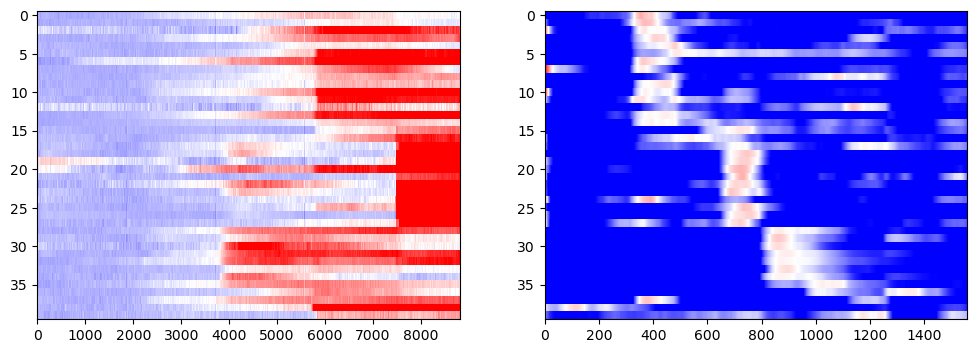

In [4386]:
# dip order
plt.figure(figsize=(12,4))
plt.subplot(1, 2, 1)
plt.imshow(
    np.vstack((cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==8,...],#AVP
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==4,...],#OXT
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==1,...],#NE
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==6,...],#CCK
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==0,...],#5HT
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==2,...],#HA
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==7,...],#ACh
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==3,...],#DA
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==5,...])),#MT
    interpolation='nearest',aspect='auto',cmap='bwr',vmin=-0.5,vmax=1)
plt.subplot(1, 2, 2)
plt.imshow(
    np.vstack((filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==8,...][...,:1560],
               filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==4,...][...,:1560],
               filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==1,...][...,:1560],
               filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==6,...][...,:1560],
               filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==0,...][...,:1560],
               filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==2,...][...,:1560],
               filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==7,...][...,:1560],
               filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==3,...][...,:1560],
               filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==5,...][...,:1560])),
    interpolation='nearest',aspect='auto',cmap='bwr',vmin=0.5,vmax=1.5)

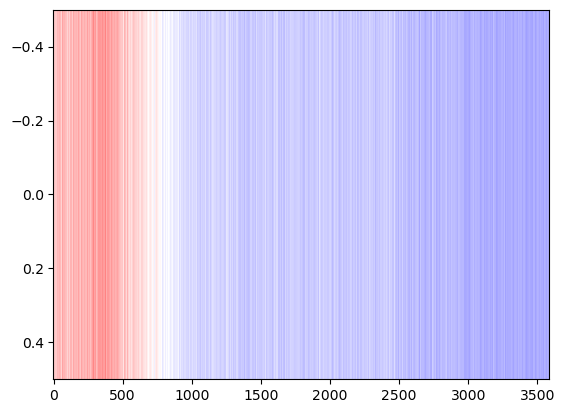

In [4410]:
plt.imshow(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==8,...], interpolation='nearest',aspect='auto',cmap='bwr',vmin=-1,vmax=2)

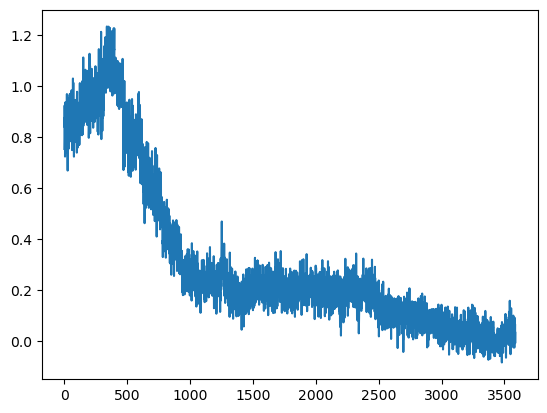

In [4412]:
plt.plot(cnmf_dicts_invivo_10x[l]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==8,...].T)#, interpolation='nearest',aspect='auto',cmap='bwr',vmin=-1,vmax=2)

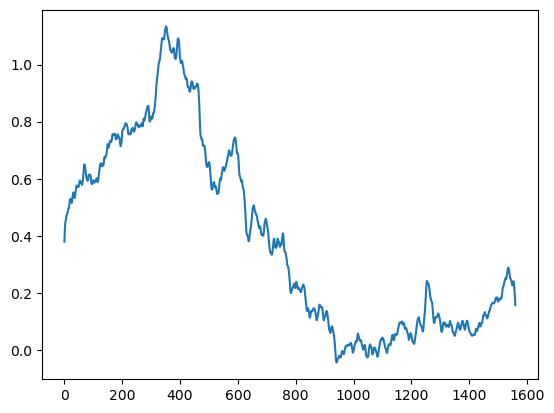

In [4418]:
plt.plot(filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==8,...].T)#, interpolation='nearest',aspect='auto',cmap='bwr',vmin=-1,vmax=2)

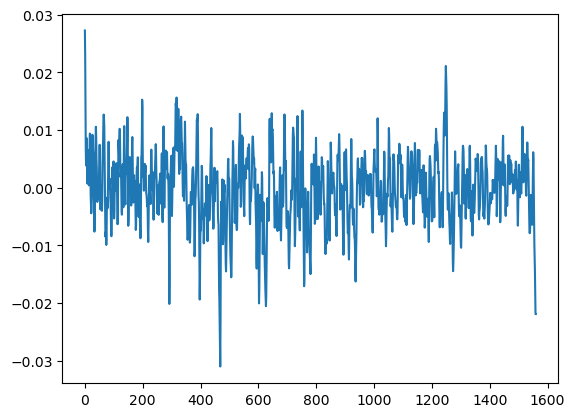

In [4426]:
plt.plot(filteredu_norm1_s[cnmf_dicts_invivo_10x[l]['row_clusts_f']==8,...].T)#, interpolation='nearest',aspect='auto',cmap='bwr',vmin=-1,vmax=2)

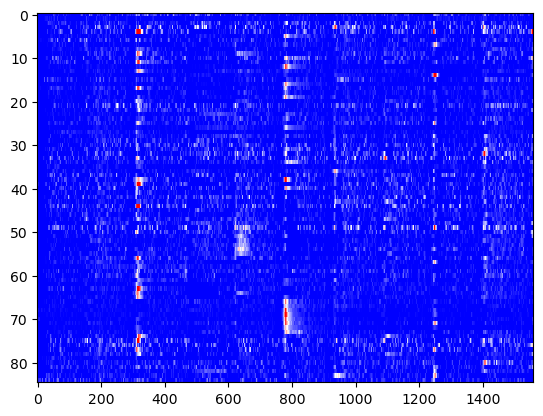

In [4428]:
filteredu_norm1_s = list()
for id in range(filteredu_norm1.shape[0]):
    sig_r = filteredu_norm1[id,...].T
    filteredu_norm1_s.append(sg.savgol_filter(sig_r,2,1,deriv=1))
    #rises.append(np.min(np.where(sav_test_m[:30,] == np.max(sav_test_m[:30,]))))
   #np.min(np.where(sav_test_r == np.max(sav_test_r))))
filteredu_norm1_s = np.array(filteredu_norm1_s)
plt.imshow(filteredu_norm1_s[np.argsort(cnmf_dicts_invivo_10x[l]['row_clusts_f']),...],interpolation='nearest',aspect='auto',cmap='bwr',vmin=0,vmax=0.05)

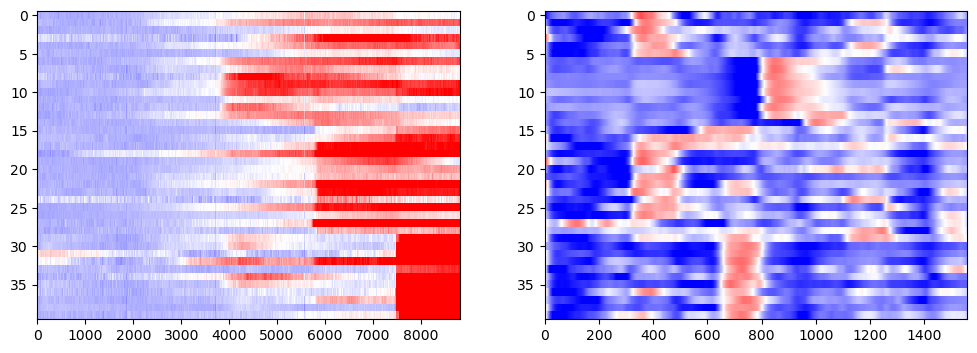

In [4455]:
# IP order, 5HT last
plt.figure(figsize=(12,4))
plt.subplot(1, 2, 1)
plt.imshow(
    np.vstack((cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==8,...],#AVP
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==3,...],#DA
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==4,...],#OXT
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==2,...],#HA
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==7,...],#ACh
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==6,...],#CCK
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==1,...],#NE
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==5,...],#MT
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==0,...])),#5HT
    interpolation='nearest',aspect='auto',cmap='bwr',vmin=-0.5,vmax=1)
plt.subplot(1, 2, 2)
plt.imshow(
    np.vstack((filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==8,...][...,:1560], #cnmf_dicts_invivo_10x[l]['savs2_filt_norm1']
               filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==3,...][...,:1560],
               filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==4,...][...,:1560],
               filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==2,...][...,:1560],
               filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==7,...][...,:1560],
               filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==6,...][...,:1560],
               filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==1,...][...,:1560],
               filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==5,...][...,:1560],
               filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==0,...][...,:1560])),
    interpolation='nearest',aspect='auto',cmap='bwr',vmin=0,vmax=1.5)

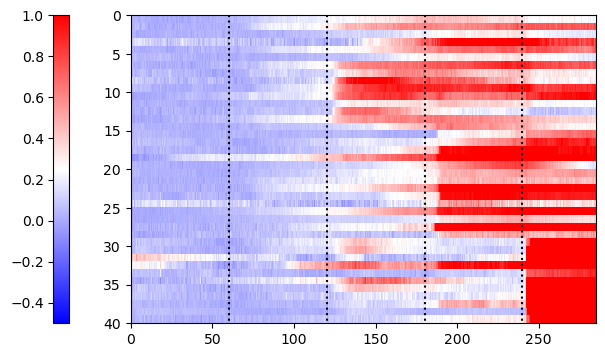

In [4464]:
fig,ax= plt.subplots(figsize=(8,4))
f = ax.imshow(
    np.vstack((cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==8,...],#AVP
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==3,...],#DA
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==4,...],#OXT
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==2,...],#HA
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==7,...],#ACh
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==6,...],#CCK
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==1,...],#NE
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==5,...],#MT
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==0,...])),#5HT
    extent=[0,285,np.vstack((cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==8,...],#AVP
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==3,...],#DA
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==4,...],#OXT
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==2,...],#HA
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==7,...],#ACh
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==6,...],#CCK
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==1,...],#NE
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==5,...],#MT
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==0,...])).shape[0],0],
    interpolation='nearest',aspect='auto',cmap='bwr',vmin=-0.5,vmax=1)
ax.vlines(x=[],ymin=0,ymax=np.vstack((cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==8,...],#AVP
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==3,...],#DA
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==4,...],#OXT
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==2,...],#HA
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==7,...],#ACh
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==6,...],#CCK
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==1,...],#NE
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==5,...],#MT
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==0,...])).shape[0],
          color='black',linestyle='dotted')
fig.colorbar(f,ax=ax,location='left')
ax.vlines(x=[60,120,180,240],ymin=0,ymax=np.vstack((cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==8,...],#AVP
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==3,...],#DA
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==4,...],#OXT
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==2,...],#HA
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==7,...],#ACh
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==6,...],#CCK
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==1,...],#NE
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==5,...],#MT
               cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==0,...])).shape[0],color='black',linestyle='dotted')

#plt.subplot(1, 2, 2)
#plt.imshow(
#    np.vstack((filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...])),
#    extent=[200,1050,np.vstack((filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...])).shape[0],0],
#    interpolation='nearest',aspect='auto',cmap='bwr',vmin=-0.5,vmax=1.5)#,vmin=0)#,vmax=2)
#plt.vlines(x=[312,468,624,780,936],ymin=0,ymax=np.vstack((filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...])).shape[0],color='black',linestyle='dotted')

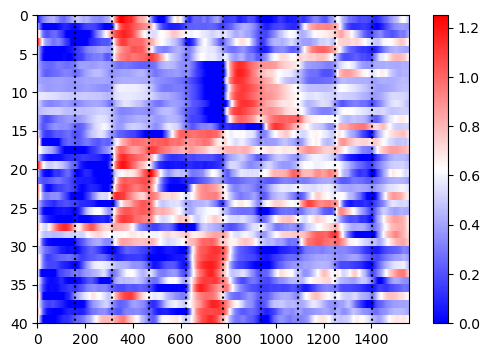

In [4462]:
fig,ax= plt.subplots(figsize=(6,4))
f = ax.imshow(
    np.vstack((filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==8,...][...,:1560], #cnmf_dicts_invivo_10x[l]['savs2_filt_norm1']
               filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==3,...][...,:1560],
               filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==4,...][...,:1560],
               filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==2,...][...,:1560],
               filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==7,...][...,:1560],
               filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==6,...][...,:1560],
               filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==1,...][...,:1560],
               filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==5,...][...,:1560],
               filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==0,...][...,:1560])),
    extent=[0,1560, np.vstack((filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==8,...][...,:1560], #cnmf_dicts_invivo_10x[l]['savs2_filt_norm1']
               filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==3,...][...,:1560],
               filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==4,...][...,:1560],
               filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==2,...][...,:1560],
               filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==7,...][...,:1560],
               filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==6,...][...,:1560],
               filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==1,...][...,:1560],
               filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==5,...][...,:1560],
               filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==0,...][...,:1560])).shape[0],0],
    interpolation='nearest',aspect='auto',cmap='bwr',vmin=0,vmax=1.25)#,vmin=0)#,vmax=2)
ax.vlines(x=[156,312,468,624,780,936,1092,1248,1404],ymin=0,ymax= np.vstack((filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==8,...][...,:1560], #cnmf_dicts_invivo_10x[l]['savs2_filt_norm1']
               filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==3,...][...,:1560],
               filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==4,...][...,:1560],
               filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==2,...][...,:1560],
               filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==7,...][...,:1560],
               filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==6,...][...,:1560],
               filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==1,...][...,:1560],
               filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==5,...][...,:1560],
               filteredu_norm1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==0,...][...,:1560])).shape[0],color='black',linestyle='dotted')
fig.colorbar(f,ax=ax,location='right')


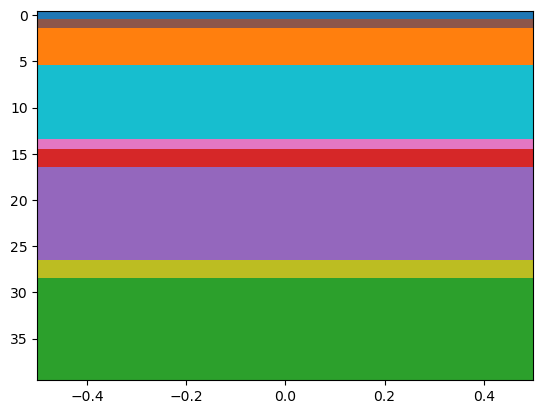

In [4459]:
keeprows_10x = [0]*np.sum(cnmf_dicts_invivo_10x[l]['row_clusts_f']==8)+[5]*np.sum(cnmf_dicts_invivo_10x[l]['row_clusts_f']==3)+[1]*np.sum(cnmf_dicts_invivo_10x[l]['row_clusts_f']==4)+[9]*np.sum(cnmf_dicts_invivo_10x[l]['row_clusts_f']==2)+[6]*np.sum(cnmf_dicts_invivo_10x[l]['row_clusts_f']==7)+[3]*np.sum(cnmf_dicts_invivo_10x[l]['row_clusts_f']==6)+[4]*np.sum(cnmf_dicts_invivo_10x[l]['row_clusts_f']==1)+[8]*np.sum(cnmf_dicts_invivo_10x[l]['row_clusts_f']==5)+[2]*np.sum(cnmf_dicts_invivo_10x[l]['row_clusts_f']==0)
plt.imshow(np.array(keeprows_10x)[...,np.newaxis],cmap=color_map,norm=norm,interpolation='nearest',aspect='auto')

In [426]:
new_dff1 = ((cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw'].T-(np.mean(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw'][...,:1800],axis=1)))/(np.mean(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw'][...,:1800],axis=1))).T

Text(0, 0.5, '$\\Delta F/F _0$')

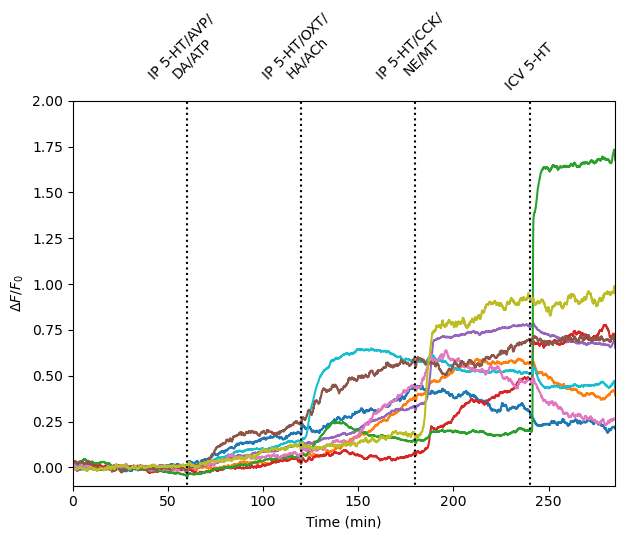

In [1841]:
%matplotlib inline
colsv = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
tvals = (285/cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'].shape[1])*np.arange(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'].shape[1])
fig, ax = plt.subplots(figsize=(7,5))
ax.plot(tvals,np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==4,...],[1,31]),axis=0),color=colsv[1])
ax.plot(tvals,np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==8,...],[1,31]),axis=0),color=colsv[0])
ax.plot(tvals,np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==1,...],[1,31]),axis=0),color=colsv[4])
ax.plot(tvals,np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==6,...],[1,31]),axis=0),color=colsv[3])
ax.plot(tvals,np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==0,...],[1,31]),axis=0),color=colsv[2])
ax.plot(tvals,np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==2,...],[1,31]),axis=0),color=colsv[9])
ax.plot(tvals,np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==7,...],[1,31]),axis=0),color=colsv[6])
ax.plot(tvals,np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==3,...],[1,31]),axis=0),color=colsv[5])
ax.plot(tvals,np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==5,...],[1,31]),axis=0),color=colsv[8])
ax.vlines(x=[60,120,180,240],ymin=-1,ymax=3,color='black',linestyle='dotted')
ax.set_xticks([60,120,180,240],  ['IP 5-HT/AVP/\nDA/ATP','IP 5-HT/OXT/\nHA/ACh','IP 5-HT/CCK/\nNE/MT','ICV 5-HT'],rotation=45,minor=True)
ax.tick_params(labeltop=True,bottom=False,labelbottom=False,which='minor')
ax.set_xlim(0,285)
ax.set_ylim(-0.1,2)
ax.set_xlabel('Time (min)')
ax.set_ylabel('$\Delta F/F _0$')

Text(0, 0.5, '$\\Delta F/F _0$')

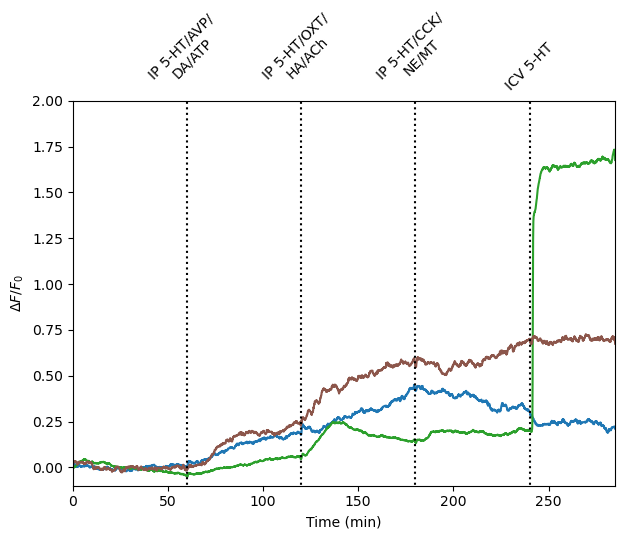

In [1842]:
%matplotlib inline
colsv = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
tvals = (285/cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'].shape[1])*np.arange(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'].shape[1])
fig, ax = plt.subplots(figsize=(7,5))
#ax.plot(tvals,np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==4,...],[1,31]),axis=0),color=colsv[1])
ax.plot(tvals,np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==8,...],[1,31]),axis=0),color=colsv[0])
#ax.plot(tvals,np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==1,...],[1,31]),axis=0),color=colsv[4])
#ax.plot(tvals,np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==6,...],[1,31]),axis=0),color=colsv[3])
ax.plot(tvals,np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==0,...],[1,31]),axis=0),color=colsv[2])
#ax.plot(tvals,np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==2,...],[1,31]),axis=0),color=colsv[9])
#ax.plot(tvals,np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==7,...],[1,31]),axis=0),color=colsv[6])
ax.plot(tvals,np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==3,...],[1,31]),axis=0),color=colsv[5])
#ax.plot(tvals,np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==5,...],[1,31]),axis=0),color=colsv[8])
ax.vlines(x=[60,120,180,240],ymin=-1,ymax=3,color='black',linestyle='dotted')
ax.set_xticks([60,120,180,240],  ['IP 5-HT/AVP/\nDA/ATP','IP 5-HT/OXT/\nHA/ACh','IP 5-HT/CCK/\nNE/MT','ICV 5-HT'],rotation=45,minor=True)
ax.tick_params(labeltop=True,bottom=False,labelbottom=False,which='minor')
ax.set_xlim(0,285)
ax.set_ylim(-0.1,2)
ax.set_xlabel('Time (min)')
ax.set_ylabel('$\Delta F/F _0$')

Text(0, 0.5, '$\\Delta F/F _0$')

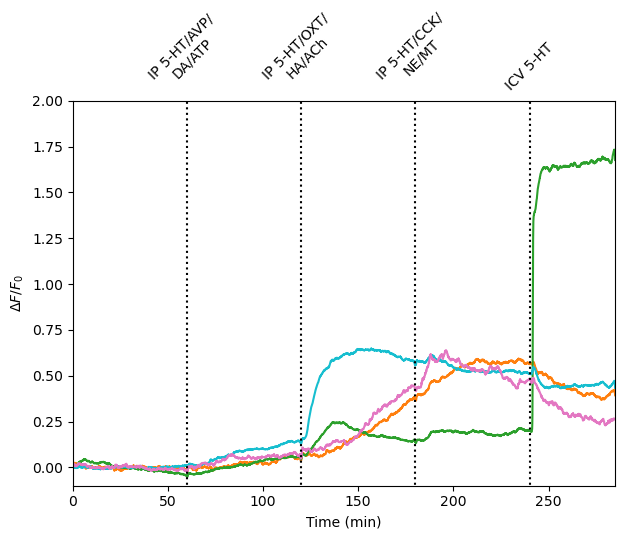

In [1849]:
%matplotlib inline
colsv = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
tvals = (285/cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'].shape[1])*np.arange(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'].shape[1])
fig, ax = plt.subplots(figsize=(7,5))
ax.plot(tvals,np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==4,...],[1,31]),axis=0),color=colsv[1])
#ax.plot(tvals,np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==8,...],[1,31]),axis=0),color=colsv[0])
#ax.plot(tvals,np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==1,...],[1,31]),axis=0),color=colsv[4])
#ax.plot(tvals,np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==6,...],[1,31]),axis=0),color=colsv[3])
ax.plot(tvals,np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==0,...],[1,31]),axis=0),color=colsv[2])
ax.plot(tvals,np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==2,...],[1,31]),axis=0),color=colsv[9])
ax.plot(tvals,np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==7,...],[1,31]),axis=0),color=colsv[6])
#ax.plot(tvals,np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==3,...],[1,31]),axis=0),color=colsv[5])
#ax.plot(tvals,np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==5,...],[1,31]),axis=0),color=colsv[8])
ax.vlines(x=[60,120,180,240],ymin=-1,ymax=3,color='black',linestyle='dotted')
ax.set_xticks([60,120,180,240],  ['IP 5-HT/AVP/\nDA/ATP','IP 5-HT/OXT/\nHA/ACh','IP 5-HT/CCK/\nNE/MT','ICV 5-HT'],rotation=45,minor=True)
ax.tick_params(labeltop=True,bottom=False,labelbottom=False,which='minor')
ax.set_xlim(0,285)
ax.set_ylim(-0.1,2)
ax.set_xlabel('Time (min)')
ax.set_ylabel('$\Delta F/F _0$')

Text(0, 0.5, '$\\Delta F/F _0$')

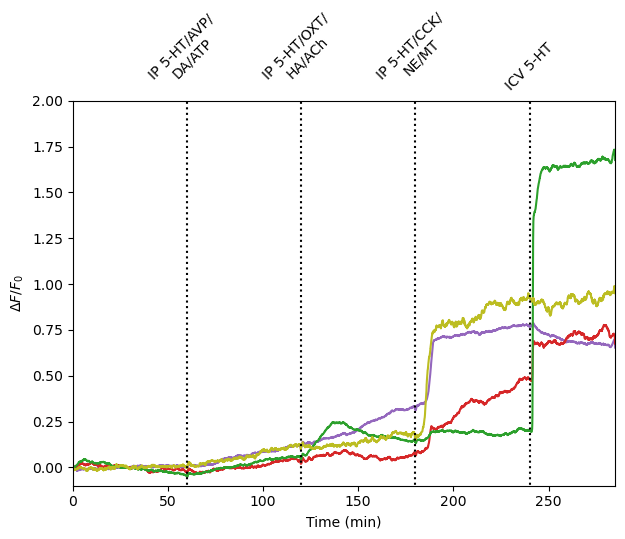

In [1850]:
%matplotlib inline
colsv = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
tvals = (285/cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'].shape[1])*np.arange(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'].shape[1])
fig, ax = plt.subplots(figsize=(7,5))
#ax.plot(tvals,np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==4,...],[1,31]),axis=0),color=colsv[1])
#ax.plot(tvals,np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==8,...],[1,31]),axis=0),color=colsv[0])
ax.plot(tvals,np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==1,...],[1,31]),axis=0),color=colsv[4])
ax.plot(tvals,np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==6,...],[1,31]),axis=0),color=colsv[3])
ax.plot(tvals,np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==0,...],[1,31]),axis=0),color=colsv[2])
#ax.plot(tvals,np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==2,...],[1,31]),axis=0),color=colsv[9])
#ax.plot(tvals,np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==7,...],[1,31]),axis=0),color=colsv[6])
#ax.plot(tvals,np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==3,...],[1,31]),axis=0),color=colsv[5])
ax.plot(tvals,np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==5,...],[1,31]),axis=0),color=colsv[8])
ax.vlines(x=[60,120,180,240],ymin=-1,ymax=3,color='black',linestyle='dotted')
ax.set_xticks([60,120,180,240],  ['IP 5-HT/AVP/\nDA/ATP','IP 5-HT/OXT/\nHA/ACh','IP 5-HT/CCK/\nNE/MT','ICV 5-HT'],rotation=45,minor=True)
ax.tick_params(labeltop=True,bottom=False,labelbottom=False,which='minor')
ax.set_xlim(0,285)
ax.set_ylim(-0.1,2)
ax.set_xlabel('Time (min)')
ax.set_ylabel('$\Delta F/F _0$')

Text(0, 0.5, '$\\dot{\\Delta F/F _0}$ (peak-normalized)')

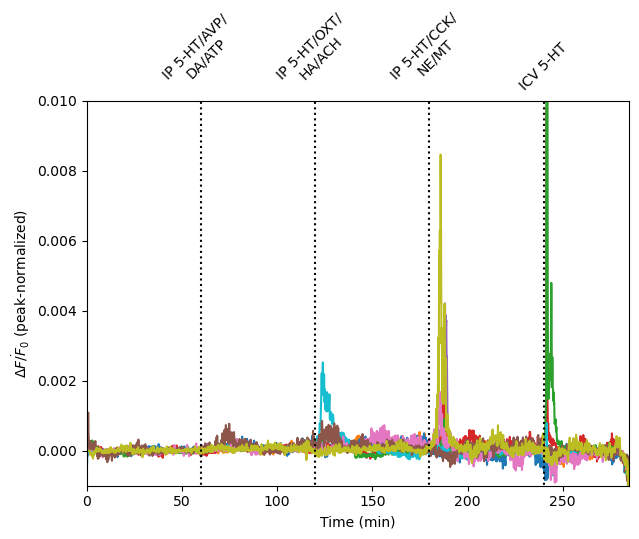

In [445]:
%matplotlib inline
colsv = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
tvals = (285/cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'].shape[1])*np.arange(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'].shape[1])
fig, ax = plt.subplots(figsize=(7,5))
ax.plot(tvals,sg.savgol_filter(np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==4,...],[1,301]),axis=0),10,1,deriv=1),color=colsv[1])
ax.plot(tvals,sg.savgol_filter(np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==8,...],[1,301]),axis=0),10,1,deriv=1),color=colsv[0])
ax.plot(tvals,sg.savgol_filter(np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==1,...],[1,301]),axis=0),10,1,deriv=1),color=colsv[4])
ax.plot(tvals,sg.savgol_filter(np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==6,...],[1,301]),axis=0),10,1,deriv=1),color=colsv[3])
ax.plot(tvals,sg.savgol_filter(np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==0,...],[1,301]),axis=0),10,1,deriv=1),color=colsv[2])
ax.plot(tvals,sg.savgol_filter(np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==2,...],[1,301]),axis=0),10,1,deriv=1),color=colsv[9])
ax.plot(tvals,sg.savgol_filter(np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==7,...],[1,301]),axis=0),10,1,deriv=1),color=colsv[6])
ax.plot(tvals,sg.savgol_filter(np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==3,...],[1,301]),axis=0),10,1,deriv=1),color=colsv[5])
ax.plot(tvals,sg.savgol_filter(np.mean(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==5,...],[1,301]),axis=0),10,1,deriv=1),color=colsv[8])
ax.vlines(x=[60,120,180,240],ymin=-1,ymax=3,color='black',linestyle='dotted')
ax.set_xticks([60,120,180,240],  ['IP 5-HT/AVP/\nDA/ATP','IP 5-HT/OXT/\nHA/ACH','IP 5-HT/CCK/\nNE/MT','ICV 5-HT'],rotation=45,minor=True)
ax.tick_params(labeltop=True,bottom=False,labelbottom=False,which='minor')
ax.set_xlim(0,285)
ax.set_ylim(-0.001,0.01)
ax.set_xlabel('Time (min)')
ax.set_ylabel('$\dot{\Delta F/F _0}$ (peak-normalized)')

In [ ]:
%matplotlib inline
tvals = (np.arange(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'].shape[1])/cnmf_dicts_invivo_ip[l]['vol_per_min'])[:4000]

fig, ax = plt.subplots(figsize=(7,5))
ax.plot(tvals,np.median(sg.medfilt(new_dff[cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],[1,31]),axis=0)[:4000],color='#ff7f0e')
ax.plot(tvals,np.median(sg.medfilt(new_dff[cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...],[1,31]),axis=0)[:4000],color='#1f77b4')
ax.vlines(x=[cnmf_dicts_invivo_ip[l]['oxt_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min'],cnmf_dicts_invivo_ip[l]['avp_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min']],
          ymin=-0.1,ymax=1,
          color='black',linestyle='dotted')

#print(len(data_ip_avp_oxts_sum))
#ci = np.std(np.array(data_ip_avp_oxts_sum).T,axis=1)/np.sqrt(np.array(data_ip_avp_oxts_sum).T.shape[1])
##fig, ax = plt.subplots()
#ax.plot(tvals,np.mean(np.array(data_ip_avp_oxts_sum).T,axis=1),color='#ff7f0e')
#ax.fill_between(tvals,(np.mean(np.array(data_ip_avp_oxts_sum).T,axis=1)-ci), (np.mean(np.array(data_ip_avp_oxts_sum).T,axis=1)+ci), color='#ff7f0e', alpha=.1)
#ax.set_ylim(-0.05,0.45)
#ax.vlines(x=15,ymin=-0.05, ymax=0.45,color='black',linestyle='dotted')
#ax.vlines(x=15,ymin=-1, ymax=1,color='black',linestyle='dotted')
#ax.set_yticks([0,0.05,0.1,0.15],[0,0.05,0.1,0.15])
ax.set_xticks([cnmf_dicts_invivo_ip[l]['oxt_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min'],cnmf_dicts_invivo_ip[l]['avp_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min']],  ['IP OXT','IP AVP'],rotation=45,minor=True)
ax.tick_params(labeltop=True,bottom=False,labelbottom=False,which='minor')
ax.set_xlim(0,129)
ax.set_ylim(-0.05,0.5)
ax.set_xlabel('Time (min)')
ax.set_ylabel('$\Delta F/F _0$')

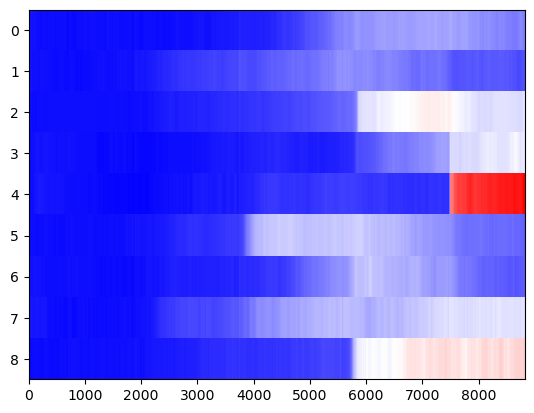

In [432]:
plt.imshow(np.vstack((
np.median(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==4,...],[1,31]),axis=0),
np.median(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==8,...],[1,31]),axis=0),
np.median(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==1,...],[1,31]),axis=0),
np.median(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==6,...],[1,31]),axis=0),
np.median(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==0,...],[1,31]),axis=0),
np.median(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==2,...],[1,31]),axis=0),
np.median(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==7,...],[1,31]),axis=0),
np.median(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==3,...],[1,31]),axis=0),
np.median(sg.medfilt(new_dff1[cnmf_dicts_invivo_10x[l]['row_clusts_f']==5,...],[1,31]),axis=0),
)),interpolation='nearest',aspect='auto',cmap='bwr')

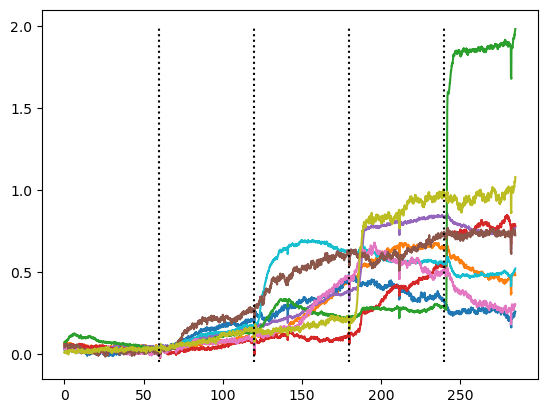

In [421]:
colsv = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
tvals = (285/cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'].shape[1])*np.arange(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'].shape[1])

plt.plot(tvals,sg.savgol_filter(np.mean(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==4,...],axis=0),10,1),color=colsv[1])
plt.plot(tvals,sg.savgol_filter(np.mean(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==8,...],axis=0),10,1),color=colsv[0])
plt.plot(tvals,sg.savgol_filter(np.mean(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==1,...],axis=0),10,1),color=colsv[4])
plt.plot(tvals,sg.savgol_filter(np.mean(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==6,...],axis=0),10,1),color=colsv[3])
plt.plot(tvals,sg.savgol_filter(np.mean(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==0,...],axis=0),10,1),color=colsv[2])
plt.plot(tvals,sg.savgol_filter(np.mean(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==2,...],axis=0),10,1),color=colsv[9])
plt.plot(tvals,sg.savgol_filter(np.mean(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==7,...],axis=0),10,1),color=colsv[6])
plt.plot(tvals,sg.savgol_filter(np.mean(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==3,...],axis=0),10,1),color=colsv[5])
plt.plot(tvals,sg.savgol_filter(np.mean(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==5,...],axis=0),10,1),color=colsv[8])
plt.vlines(x=[60,120,180,240],ymin=-0.05,ymax=2,color='black',linestyle='dotted')

In [424]:
cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'].shape[1]*60/285

1856.6315789473683

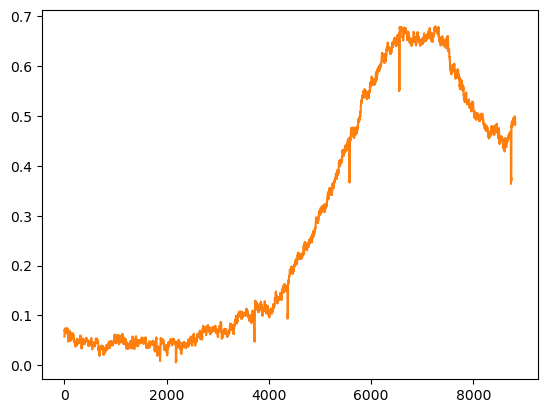

In [422]:
plt.plot(sg.savgol_filter(np.mean(cnmf_dicts_invivo_10x[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_10x[l]['row_clusts_f']==4,...],axis=0),10,1),color=colsv[1])


In [2091]:
# 1
#[[-1  0  1]
# [25  7 27]]
#['MT', '5HT']

# 3
#[[-1  0  1  2  3  4  5  6  7  8]
# [45 11 10  8  1  4  2  2  1  1]]
#['5HT', 'NE', 'HA', 'DA', 'OXT', 'MT', 'CCK', 'ACh', 'AVP']

# 4
#[[-1  0  1  2  3  4  5  6  7]
# [80  1  1  1  4  3  3  8  2]]
#['AVP', 'DA', 'ATP', 'HA', 'OXT', 'ACh', '5HT', 'NE']

#['IP 5-HT/AVP/\nDA/ATP','IP 5-HT/OXT/\nHA/ACH','IP 5-HT/CCK/\nNE/MT','ICV 5-HT']


mice_ip_all = np.vstack((cnmf_dicts_invivo_10x[3]['CY_ref_matched_raw'][cnmf_dicts_invivo_10x[3]['row_clusts_f']==8,...][...,cnmf_dicts_invivo_10x[3]['m1_vol_onset']-817:],#AVP 3
                         cnmf_dicts_invivo_10x[4]['CY_ref_matched_raw'][cnmf_dicts_invivo_10x[4]['row_clusts_f']==0,...][...,cnmf_dicts_invivo_10x[4]['m1_vol_onset']-817:],#AVP 4
                         cnmf_dicts_invivo_10x[3]['CY_ref_matched_raw'][cnmf_dicts_invivo_10x[3]['row_clusts_f']==3,...][...,cnmf_dicts_invivo_10x[3]['m1_vol_onset']-817:],#DA 3
                         cnmf_dicts_invivo_10x[4]['CY_ref_matched_raw'][cnmf_dicts_invivo_10x[4]['row_clusts_f']==1,...][...,cnmf_dicts_invivo_10x[4]['m1_vol_onset']-817:],#DA 4
                         cnmf_dicts_invivo_10x[4]['CY_ref_matched_raw'][cnmf_dicts_invivo_10x[4]['row_clusts_f']==2,...][...,cnmf_dicts_invivo_10x[4]['m1_vol_onset']-817:],#ATP 4
                         cnmf_dicts_invivo_10x[3]['CY_ref_matched_raw'][cnmf_dicts_invivo_10x[3]['row_clusts_f']==4,...][...,cnmf_dicts_invivo_10x[3]['m1_vol_onset']-817:],#OXT 3
                         cnmf_dicts_invivo_10x[4]['CY_ref_matched_raw'][cnmf_dicts_invivo_10x[4]['row_clusts_f']==4,...][...,cnmf_dicts_invivo_10x[4]['m1_vol_onset']-817:],#OXT 4
                         cnmf_dicts_invivo_10x[3]['CY_ref_matched_raw'][cnmf_dicts_invivo_10x[3]['row_clusts_f']==2,...][...,cnmf_dicts_invivo_10x[3]['m1_vol_onset']-817:],#HA 3
                         cnmf_dicts_invivo_10x[4]['CY_ref_matched_raw'][cnmf_dicts_invivo_10x[4]['row_clusts_f']==3,...][...,cnmf_dicts_invivo_10x[4]['m1_vol_onset']-817:],#HA 4
                         cnmf_dicts_invivo_10x[3]['CY_ref_matched_raw'][cnmf_dicts_invivo_10x[3]['row_clusts_f']==7,...][...,cnmf_dicts_invivo_10x[3]['m1_vol_onset']-817:],#ACh 3
                         cnmf_dicts_invivo_10x[4]['CY_ref_matched_raw'][cnmf_dicts_invivo_10x[4]['row_clusts_f']==5,...][...,cnmf_dicts_invivo_10x[4]['m1_vol_onset']-817:],#ACh 4
                         cnmf_dicts_invivo_10x[3]['CY_ref_matched_raw'][cnmf_dicts_invivo_10x[3]['row_clusts_f']==6,...][...,cnmf_dicts_invivo_10x[3]['m1_vol_onset']-817:],#CCK 3
                         cnmf_dicts_invivo_10x[3]['CY_ref_matched_raw'][cnmf_dicts_invivo_10x[3]['row_clusts_f']==1,...][...,cnmf_dicts_invivo_10x[3]['m1_vol_onset']-817:],#NE 3
                         cnmf_dicts_invivo_10x[4]['CY_ref_matched_raw'][cnmf_dicts_invivo_10x[4]['row_clusts_f']==7,...][...,cnmf_dicts_invivo_10x[4]['m1_vol_onset']-817:],#NE 4
                         cnmf_dicts_invivo_10x[3]['CY_ref_matched_raw'][cnmf_dicts_invivo_10x[3]['row_clusts_f']==5,...][...,cnmf_dicts_invivo_10x[3]['m1_vol_onset']-817:],#MT 3
                         cnmf_dicts_invivo_10x[1]['CY_ref_matched_raw'][cnmf_dicts_invivo_10x[1]['row_clusts_f']==0,...][...,cnmf_dicts_invivo_10x[1]['m1_vol_onset']-817:-1],#MT 1
                         cnmf_dicts_invivo_10x[3]['CY_ref_matched_raw'][cnmf_dicts_invivo_10x[3]['row_clusts_f']==0,...][...,cnmf_dicts_invivo_10x[3]['m1_vol_onset']-817:],#5HT 3
                         cnmf_dicts_invivo_10x[4]['CY_ref_matched_raw'][cnmf_dicts_invivo_10x[4]['row_clusts_f']==6,...][...,cnmf_dicts_invivo_10x[4]['m1_vol_onset']-817:],#5HT 4
                         cnmf_dicts_invivo_10x[1]['CY_ref_matched_raw'][cnmf_dicts_invivo_10x[1]['row_clusts_f']==1,...][...,cnmf_dicts_invivo_10x[1]['m1_vol_onset']-817:-1]))#5HT 1

mice_dip_all = np.vstack((cnmf_dicts_invivo_10x[3]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[3]['row_clusts_f']==8,...][...,:1560],#AVP 3
                         cnmf_dicts_invivo_10x[4]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[4]['row_clusts_f']==0,...][...,:1560],#AVP 4
                         cnmf_dicts_invivo_10x[3]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[3]['row_clusts_f']==3,...][...,:1560],#DA 3
                         cnmf_dicts_invivo_10x[4]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[4]['row_clusts_f']==1,...][...,:1560],#DA 4
                         cnmf_dicts_invivo_10x[4]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[4]['row_clusts_f']==2,...][...,:1560],#ATP 4
                         cnmf_dicts_invivo_10x[3]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[3]['row_clusts_f']==4,...][...,:1560],#OXT 3
                         cnmf_dicts_invivo_10x[4]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[4]['row_clusts_f']==4,...][...,:1560],#OXT 4
                         cnmf_dicts_invivo_10x[3]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[3]['row_clusts_f']==2,...][...,:1560],#HA 3
                         cnmf_dicts_invivo_10x[4]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[4]['row_clusts_f']==3,...][...,:1560],#HA 4
                         cnmf_dicts_invivo_10x[3]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[3]['row_clusts_f']==7,...][...,:1560],#ACh 3
                         cnmf_dicts_invivo_10x[4]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[4]['row_clusts_f']==5,...][...,:1560],#ACh 4
                         cnmf_dicts_invivo_10x[3]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[3]['row_clusts_f']==6,...][...,:1560],#CCK 3
                         cnmf_dicts_invivo_10x[3]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[3]['row_clusts_f']==1,...][...,:1560],#NE 3
                         cnmf_dicts_invivo_10x[4]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[4]['row_clusts_f']==7,...][...,:1560],#NE 4
                         cnmf_dicts_invivo_10x[3]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[3]['row_clusts_f']==5,...][...,:1560],#MT 3
                         cnmf_dicts_invivo_10x[1]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[1]['row_clusts_f']==0,...][...,:1560],#MT 1
                         cnmf_dicts_invivo_10x[3]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[3]['row_clusts_f']==0,...][...,:1560],#5HT 3
                         cnmf_dicts_invivo_10x[4]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[4]['row_clusts_f']==6,...][...,:1560],#5HT 4
                         cnmf_dicts_invivo_10x[1]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[1]['row_clusts_f']==1,...][...,:1560]))#5HT 1

mice_ids_all = [0]*cnmf_dicts_invivo_10x[3]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[3]['row_clusts_f']==8,...].shape[0] + [0]*cnmf_dicts_invivo_10x[4]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[4]['row_clusts_f']==0,...].shape[0] + [5]*cnmf_dicts_invivo_10x[3]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[3]['row_clusts_f']==3,...].shape[0] + [5]*cnmf_dicts_invivo_10x[4]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[4]['row_clusts_f']==1,...].shape[0] + [7]*cnmf_dicts_invivo_10x[4]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[4]['row_clusts_f']==2,...].shape[0] + [1]*cnmf_dicts_invivo_10x[3]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[3]['row_clusts_f']==4,...].shape[0] + [1]*cnmf_dicts_invivo_10x[4]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[4]['row_clusts_f']==4,...].shape[0] + [9]*cnmf_dicts_invivo_10x[3]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[3]['row_clusts_f']==2,...].shape[0] + [9]*cnmf_dicts_invivo_10x[4]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[4]['row_clusts_f']==3,...].shape[0] + [6]*cnmf_dicts_invivo_10x[3]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[3]['row_clusts_f']==7,...].shape[0] + [6]*cnmf_dicts_invivo_10x[4]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[4]['row_clusts_f']==5,...].shape[0] + [3]*cnmf_dicts_invivo_10x[3]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[3]['row_clusts_f']==6,...].shape[0] + [4]*cnmf_dicts_invivo_10x[3]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[3]['row_clusts_f']==1,...].shape[0] + [4]*cnmf_dicts_invivo_10x[4]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[4]['row_clusts_f']==7,...].shape[0] + [8]*cnmf_dicts_invivo_10x[3]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[3]['row_clusts_f']==5,...].shape[0] + [8]*cnmf_dicts_invivo_10x[1]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[1]['row_clusts_f']==0,...].shape[0] + [2]*cnmf_dicts_invivo_10x[3]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[3]['row_clusts_f']==0,...].shape[0] + [2]*cnmf_dicts_invivo_10x[4]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[4]['row_clusts_f']==6,...].shape[0] + [2]*cnmf_dicts_invivo_10x[1]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[1]['row_clusts_f']==1,...].shape[0]

mice_probs_all = [3]*cnmf_dicts_invivo_10x[3]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[3]['row_clusts_f']==8,...].shape[0] + [4]*cnmf_dicts_invivo_10x[4]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[4]['row_clusts_f']==0,...].shape[0] + [3]*cnmf_dicts_invivo_10x[3]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[3]['row_clusts_f']==3,...].shape[0] + [4]*cnmf_dicts_invivo_10x[4]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[4]['row_clusts_f']==1,...].shape[0] + [4]*cnmf_dicts_invivo_10x[4]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[4]['row_clusts_f']==2,...].shape[0] + [3]*cnmf_dicts_invivo_10x[3]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[3]['row_clusts_f']==4,...].shape[0] + [4]*cnmf_dicts_invivo_10x[4]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[4]['row_clusts_f']==4,...].shape[0] + [3]*cnmf_dicts_invivo_10x[3]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[3]['row_clusts_f']==2,...].shape[0] + [4]*cnmf_dicts_invivo_10x[4]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[4]['row_clusts_f']==3,...].shape[0] + [3]*cnmf_dicts_invivo_10x[3]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[3]['row_clusts_f']==7,...].shape[0] + [4]*cnmf_dicts_invivo_10x[4]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[4]['row_clusts_f']==5,...].shape[0] + [3]*cnmf_dicts_invivo_10x[3]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[3]['row_clusts_f']==6,...].shape[0] + [3]*cnmf_dicts_invivo_10x[3]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[3]['row_clusts_f']==1,...].shape[0] + [4]*cnmf_dicts_invivo_10x[4]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[4]['row_clusts_f']==7,...].shape[0] + [3]*cnmf_dicts_invivo_10x[3]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[3]['row_clusts_f']==5,...].shape[0] + [1]*cnmf_dicts_invivo_10x[1]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[1]['row_clusts_f']==0,...].shape[0] + [3]*cnmf_dicts_invivo_10x[3]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[3]['row_clusts_f']==0,...].shape[0] + [4]*cnmf_dicts_invivo_10x[4]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[4]['row_clusts_f']==6,...].shape[0] + [1]*cnmf_dicts_invivo_10x[1]['CY_mov_matched_raw_corr_norm1'][cnmf_dicts_invivo_10x[1]['row_clusts_f']==1,...].shape[0]

In [2092]:
mice_ip_all.shape

(97, 7779)

In [2093]:
mice_dip_all.shape

(97, 1560)

In [2094]:
mice_ids_all

[0,
 0,
 5,
 5,
 7,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 6,
 6,
 6,
 6,
 3,
 3,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2]

In [2073]:
new_dff11 = ((mice_ip_all.T-(np.mean(mice_ip_all[...,:800],axis=1)))/(np.mean(mice_ip_all[...,:800],axis=1))).T

In [2149]:
# bandpass and cluster wells001 NE/DA responses - only use bandpass for clustering (want to show lack of slow-ish KCl signal later)
sample_rate = 31/60
def lowpass(data: np.ndarray, cutoff: float, sample_rate: float, poles: int = 5):
    sos = sg.butter(poles, cutoff, 'lowpass', fs=sample_rate, output='sos')
    filtered_data = scipy.signal.sosfiltfilt(sos, data)
    return filtered_data
def highpass(data: np.ndarray, cutoff: float, sample_rate: float, poles: int = 5):
    sos = sg.butter(poles, cutoff, 'highpass', fs=sample_rate, output='sos')
    filtered_data = scipy.signal.sosfiltfilt(sos, data)
    return filtered_data
def bandpass(data: np.ndarray, cutoff, sample_rate: float, poles: int = 5):
    sos = sg.butter(poles, cutoff, 'bandpass', fs=sample_rate, output='sos')
    filtered_data = scipy.signal.sosfiltfilt(sos, data)
    return filtered_data

times = np.arange(mice_ip_all.shape[1])/sample_rate #[...,:936]

#filtered = lowpass(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_norm1'][hdbs_invivo.labels_==c,...][...,:2400], 1/600, sample_rate)
#filtered = cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_norm1'][hdbs_invivo.labels_==c,...][...,:2400]-highpass(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_norm1'][hdbs_invivo.labels_==c,...][...,:2400], 1/600, sample_rate,1)
#filtered =  bandpass(CY_m_matched_raw_corr_norm1[...,:3000], [1/8000,1/50], sample_rate,1)
filteredu11 = lowpass(mice_ip_all, 1/50000, sample_rate,1) #[np.argsort(hdbs_invivo.labels_),...]
#filtered2 = bandpass(CY_m2_matched_raw_gr_corr_norm1[...,:2000], [1/4000,1/50], sample_rate,1) #[np.argsort(hdbs_invivo.labels_),...]

#from matplotlib import colors
#divnorm=colors.TwoSlopeNorm(vcenter=0)
#filteredu_sort = np.sort(filteredu,axis=1)
#filteredu_b10 = np.mean(filteredu_sort[:,:int(np.ceil(filteredu_sort.shape[1]/10))],axis=1) #[[x for x in np.arange(21).tolist() if x not in oxt_rm],...]
#filteredu_t10 = np.mean(filteredu_sort[:,-int(np.ceil(filteredu_sort.shape[1]/10)):],axis=1)
#filteredu_norm1 = ((filteredu.T-filteredu_b10)/(filteredu_t10-filteredu_b10)).T
#plt.imshow(filteredu_norm1[np.argsort(cnmf_dicts_invivo_10x[l]['row_clusts_f']),...],interpolation='nearest',aspect='auto',cmap='bwr')#,vmax=1)

#filtered2_sort = np.sort(filtered2,axis=1)
#filtered2_b10 = np.mean(filtered2_sort[:,:int(np.ceil(filtered2_sort.shape[1]/10))],axis=1) #[[x for x in np.arange(21).tolist() if x not in oxt_rm],...]
#filtered2_t10 = np.mean(filtered2_sort[:,-int(np.ceil(filtered2_sort.shape[1]/10)):],axis=1)
#filtered2_norm1 = ((filtered2.T-filtered2_b10)/(filtered2_t10-filtered2_b10)).T
#plt.imshow(filtered2_norm1[np.argsort(hdbs_slice_w.labels_),...],interpolation='nearest',aspect='auto',cmap='bwr',vmax=1)

In [2150]:
new_dff12 = (((mice_ip_all-filteredu11).T-(np.mean((mice_ip_all-filteredu11)[...,:1000],axis=1)))/(np.mean((mice_ip_all)[...,:1000],axis=1))).T

In [2255]:
new_dff12.shape

(97, 7779)

In [2262]:
cnmf_dicts_invivo_10x[3]['CY_ref_matched_raw'].shape[1]-cnmf_dicts_invivo_10x[1]['CY_ref_matched_raw'].shape[1]

1039

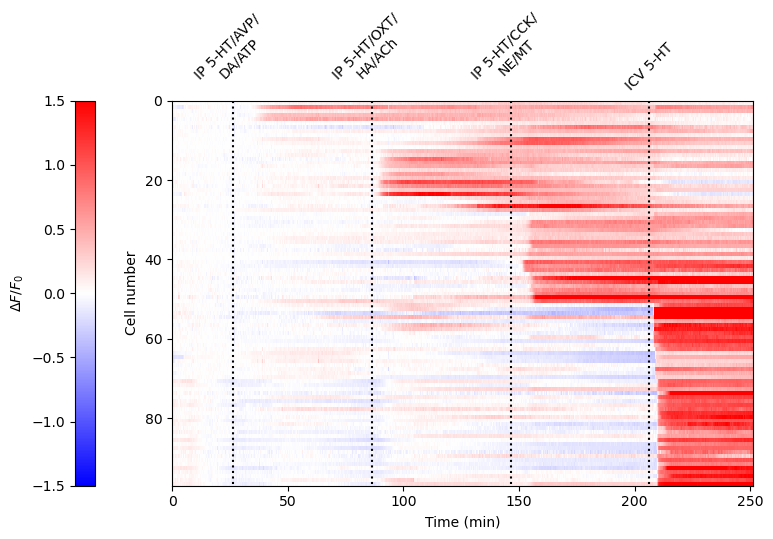

In [2285]:
%matplotlib inline

fig,ax= plt.subplots(figsize=(10,5))
f = ax.imshow(
    new_dff12,
    extent=[0,new_dff12.shape[1]/cnmf_dicts_invivo_ip[1]['vol_per_min'],new_dff12.shape[0],0],
    interpolation='nearest',aspect='auto',cmap='bwr',vmin=-1.5,vmax=1.5)
ax.vlines(x=60*np.arange(1,5)-(cnmf_dicts_invivo_10x[3]['CY_ref_matched_raw'].shape[1]-cnmf_dicts_invivo_10x[1]['CY_ref_matched_raw'].shape[1])/cnmf_dicts_invivo_ip[1]['vol_per_min'],
          ymin=0,ymax=new_dff12.shape[0],
          color='black',linestyle='dotted')

ax.set_xlabel('Time (min)')
ax.set_ylabel('Cell number')
ax.set_xticks(60*np.arange(1,5)-(cnmf_dicts_invivo_10x[3]['CY_ref_matched_raw'].shape[1]-cnmf_dicts_invivo_10x[1]['CY_ref_matched_raw'].shape[1])/cnmf_dicts_invivo_ip[1]['vol_per_min'],  ['IP 5-HT/AVP/\nDA/ATP','IP 5-HT/OXT/\nHA/ACh','IP 5-HT/CCK/\nNE/MT','ICV 5-HT'],rotation=45,minor=True)

#ax.set_xticks([cnmf_dicts_invivo_ip[l]['oxt_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min'],cnmf_dicts_invivo_ip[l]['avp_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min']],  ['IP OXT','IP AVP'],rotation=45,minor=True)
ax.tick_params(labeltop=True,bottom=False,labelbottom=False,which='minor')
#ax.set_yticks(5*np.arange(4),5*np.arange(4))

fig.colorbar(f,ax=ax,location='left',label='$\Delta F/F _0$')
#plt.subplot(1, 2, 2)
#plt.imshow(
#    np.vstack((filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...])),
#    extent=[200,1050,np.vstack((filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...])).shape[0],0],
#    interpolation='nearest',aspect='auto',cmap='bwr',vmin=-0.5,vmax=1.5)#,vmin=0)#,vmax=2)
#plt.vlines(x=[312,468,624,780,936],ymin=0,ymax=np.vstack((filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...])).shape[0],color='black',linestyle='dotted')

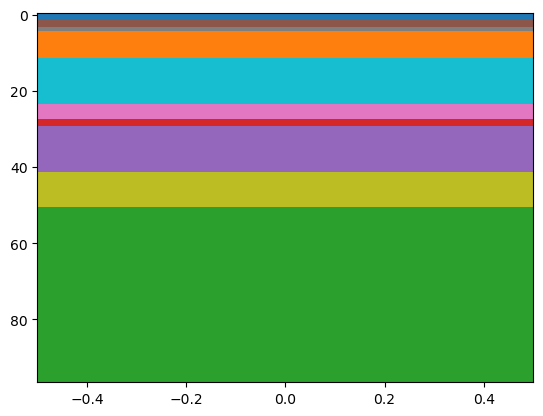

In [2287]:
%matplotlib inline
#plt.imshow(mice_ids_all[...,np.newaxis].astype('int'),cmap=cmap,interpolation='nearest',aspect='auto')
plt.imshow(np.array(mice_ids_all)[...,np.newaxis],cmap=color_map,norm=norm,interpolation='nearest',aspect='auto')

In [2098]:
prob_id_map = np.zeros((np.array(mice_probs_all).shape[0],3))
for i in range(np.array(mice_probs_all).shape[0]):
    if np.array(mice_probs_all).astype('int').tolist()[i] == 3:
        c = 0
    elif np.array(mice_probs_all).astype('int').tolist()[i] == 4:
        c = 1
    else:
        c=2
    prob_id_map[i,c] = 1

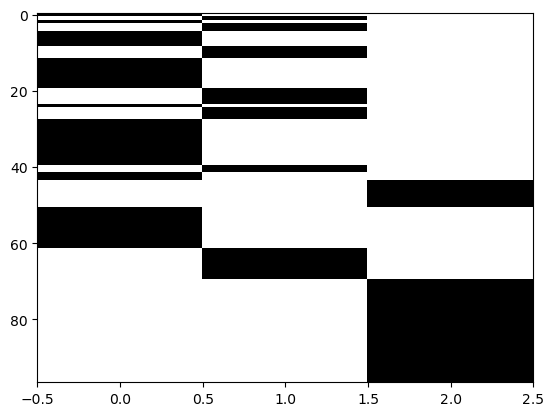

In [2290]:
%matplotlib inline
plt.imshow(prob_id_map,interpolation='nearest',aspect='auto',cmap='gray_r')

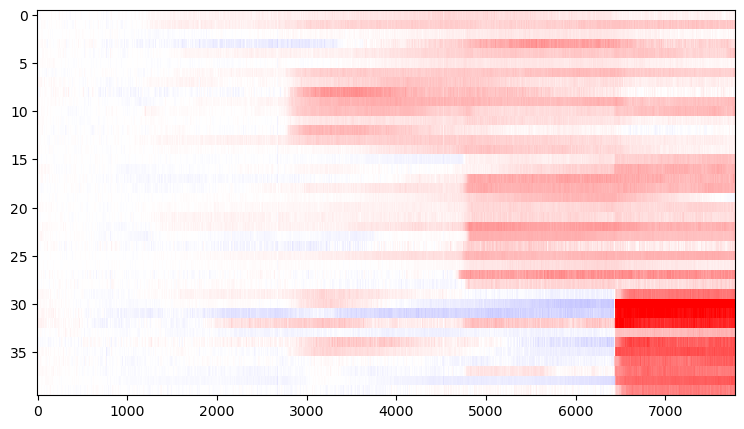

In [2119]:
%matplotlib inline

fig,ax= plt.subplots(figsize=(9,5))
f = ax.imshow(
    new_dff12[np.array(mice_probs_all).astype('int') == 3,...],
    #extent=[0,cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'].shape[1]/cnmf_dicts_invivo_ip[l]['vol_per_min'],np.vstack((cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...])).shape[0],0],
    interpolation='nearest',aspect='auto',cmap='bwr',vmin=-2,vmax=2)
#ax.vlines(x=[cnmf_dicts_invivo_ip[l]['oxt_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min'],cnmf_dicts_invivo_ip[l]['avp_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min']],
#          ymin=0,ymax=np.vstack((cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...])).shape[0],
#          color='black',linestyle='dotted')

#ax.set_xlabel('Time (min)')
#ax.set_ylabel('Sensor cell #')
#ax.set_xticks([cnmf_dicts_invivo_ip[l]['oxt_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min'],cnmf_dicts_invivo_ip[l]['avp_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min']],  ['IP OXT','IP AVP'],rotation=45,minor=True)
#ax.tick_params(labeltop=True,bottom=False,labelbottom=False,which='minor')
#ax.set_yticks(5*np.arange(4),5*np.arange(4))

#fig.colorbar(f,ax=ax,location='left',label='$\Delta F/F _0$')
#plt.subplot(1, 2, 2)
#plt.imshow(
#    np.vstack((filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...])),
#    extent=[200,1050,np.vstack((filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...])).shape[0],0],
#    interpolation='nearest',aspect='auto',cmap='bwr',vmin=-0.5,vmax=1.5)#,vmin=0)#,vmax=2)
#plt.vlines(x=[312,468,624,780,936],ymin=0,ymax=np.vstack((filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...])).shape[0],color='black',linestyle='dotted')

In [2081]:
# bandpass and cluster wells001 NE/DA responses - only use bandpass for clustering (want to show lack of slow-ish KCl signal later)
sample_rate = 31/60
def lowpass(data: np.ndarray, cutoff: float, sample_rate: float, poles: int = 5):
    sos = sg.butter(poles, cutoff, 'lowpass', fs=sample_rate, output='sos')
    filtered_data = scipy.signal.sosfiltfilt(sos, data)
    return filtered_data
def highpass(data: np.ndarray, cutoff: float, sample_rate: float, poles: int = 5):
    sos = sg.butter(poles, cutoff, 'highpass', fs=sample_rate, output='sos')
    filtered_data = scipy.signal.sosfiltfilt(sos, data)
    return filtered_data
def bandpass(data: np.ndarray, cutoff, sample_rate: float, poles: int = 5):
    sos = sg.butter(poles, cutoff, 'bandpass', fs=sample_rate, output='sos')
    filtered_data = scipy.signal.sosfiltfilt(sos, data)
    return filtered_data

times = np.arange(mice_dip_all.shape[1])/sample_rate #[...,:936]

#filtered = lowpass(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_norm1'][hdbs_invivo.labels_==c,...][...,:2400], 1/600, sample_rate)
#filtered = cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_norm1'][hdbs_invivo.labels_==c,...][...,:2400]-highpass(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_norm1'][hdbs_invivo.labels_==c,...][...,:2400], 1/600, sample_rate,1)
#filtered =  bandpass(CY_m_matched_raw_corr_norm1[...,:3000], [1/8000,1/50], sample_rate,1)
filteredu = bandpass(mice_dip_all, [1/1500,1/150], sample_rate,1) #[np.argsort(hdbs_invivo.labels_),...]
#filtered2 = bandpass(CY_m2_matched_raw_gr_corr_norm1[...,:2000], [1/4000,1/50], sample_rate,1) #[np.argsort(hdbs_invivo.labels_),...]

#from matplotlib import colors
#divnorm=colors.TwoSlopeNorm(vcenter=0)
filteredu_sort = np.sort(filteredu,axis=1)
filteredu_b10 = np.mean(filteredu_sort[:,:int(np.ceil(filteredu_sort.shape[1]/10))],axis=1) #[[x for x in np.arange(21).tolist() if x not in oxt_rm],...]
filteredu_t10 = np.mean(filteredu_sort[:,-int(np.ceil(filteredu_sort.shape[1]/10)):],axis=1)
filteredu_norm1 = ((filteredu.T-filteredu_b10)/(filteredu_t10-filteredu_b10)).T
#plt.imshow(filteredu_norm1[np.argsort(cnmf_dicts_invivo_10x[l]['row_clusts_f']),...],interpolation='nearest',aspect='auto',cmap='bwr')#,vmax=1)

#filtered2_sort = np.sort(filtered2,axis=1)
#filtered2_b10 = np.mean(filtered2_sort[:,:int(np.ceil(filtered2_sort.shape[1]/10))],axis=1) #[[x for x in np.arange(21).tolist() if x not in oxt_rm],...]
#filtered2_t10 = np.mean(filtered2_sort[:,-int(np.ceil(filtered2_sort.shape[1]/10)):],axis=1)
#filtered2_norm1 = ((filtered2.T-filtered2_b10)/(filtered2_t10-filtered2_b10)).T
#plt.imshow(filtered2_norm1[np.argsort(hdbs_slice_w.labels_),...],interpolation='nearest',aspect='auto',cmap='bwr',vmax=1)

In [2085]:
mice_dip_savs = list()
for id in range(mice_dip_all.shape[0]):
    sig_r = mice_dip_all[id,...].T
    mice_dip_savs.append(sg.savgol_filter(sig_r,10,1,deriv=1))
    #rises.append(np.min(np.where(sav_test_m[:30,] == np.max(sav_test_m[:30,]))))
   #np.min(np.where(sav_test_r == np.max(sav_test_r))))
mice_dip_savs = np.array(mice_dip_savs)

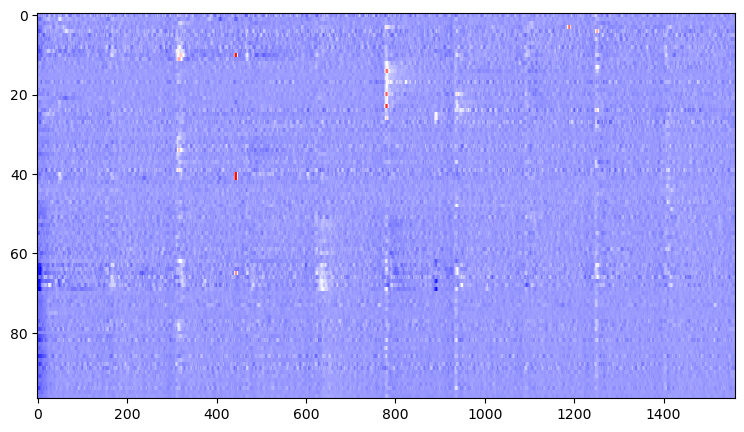

In [2086]:
%matplotlib inline

fig,ax= plt.subplots(figsize=(9,5))
f = ax.imshow(
    mice_dip_savs,
    #extent=[0,cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'].shape[1]/cnmf_dicts_invivo_ip[l]['vol_per_min'],np.vstack((cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...])).shape[0],0],
    interpolation='nearest',aspect='auto',cmap='bwr')#,vmin=-2,vmax=2)
#ax.vlines(x=[cnmf_dicts_invivo_ip[l]['oxt_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min'],cnmf_dicts_invivo_ip[l]['avp_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min']],
#          ymin=0,ymax=np.vstack((cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...])).shape[0],
#          color='black',linestyle='dotted')

#ax.set_xlabel('Time (min)')
#ax.set_ylabel('Sensor cell #')
#ax.set_xticks([cnmf_dicts_invivo_ip[l]['oxt_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min'],cnmf_dicts_invivo_ip[l]['avp_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min']],  ['IP OXT','IP AVP'],rotation=45,minor=True)
#ax.tick_params(labeltop=True,bottom=False,labelbottom=False,which='minor')
#ax.set_yticks(5*np.arange(4),5*np.arange(4))

#fig.colorbar(f,ax=ax,location='left',label='$\Delta F/F _0$')
#plt.subplot(1, 2, 2)
#plt.imshow(
#    np.vstack((filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...])),
#    extent=[200,1050,np.vstack((filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...])).shape[0],0],
#    interpolation='nearest',aspect='auto',cmap='bwr',vmin=-0.5,vmax=1.5)#,vmin=0)#,vmax=2)
#plt.vlines(x=[312,468,624,780,936],ymin=0,ymax=np.vstack((filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...])).shape[0],color='black',linestyle='dotted')

[[-1  0  1  2  3]
 [30  7 16 13  4]]
['5HT', 'AVP', 'OXT', 'unclear']
7165


('row_clusts',
 'clust_ids',
 'savs_filt_norm1',
 '5ht_rm',
 'oxt_rm',
 'avp_rm',
 'vol_per_min',
 'avp_vol_onset',
 'oxt_vol_onset',
 'row_clusts_f')

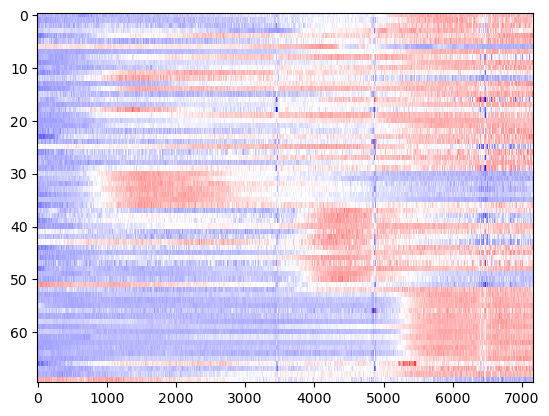

In [2323]:
# spont 5HT heatmap
l = 1
plt.imshow(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_norm1'][np.argsort(cnmf_dicts_invivo_ip[l]['row_clusts_f']),...], interpolation='nearest',aspect='auto',cmap='bwr',vmin=-1,vmax=2)
print(np.array(np.unique(cnmf_dicts_invivo_ip[l]['row_clusts_f'], return_counts=True)))
print(cnmf_dicts_invivo_ip[l]['clust_ids'])
print(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_norm1'].shape[1])
tuple(np.array(list(cnmf_dicts_invivo_ip[l].keys()))[list(cnmf_dicts_invivo_ip[l].keys()).index('row_clusts'):])

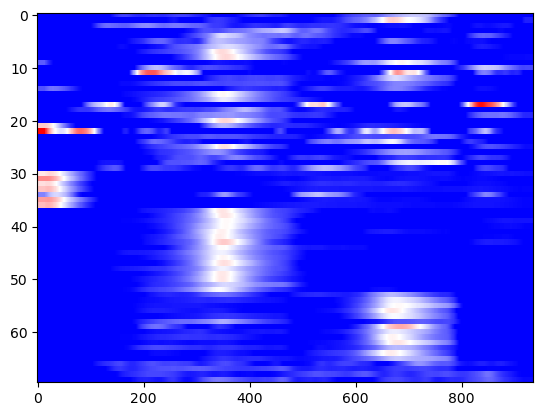

In [2324]:
plt.imshow(cnmf_dicts_invivo_ip[l]['savs_filt_norm1'][np.argsort(cnmf_dicts_invivo_ip[l]['row_clusts_f']),...], interpolation='nearest',aspect='auto',cmap='bwr',vmin=0)#,vmin=-1,vmax=2)

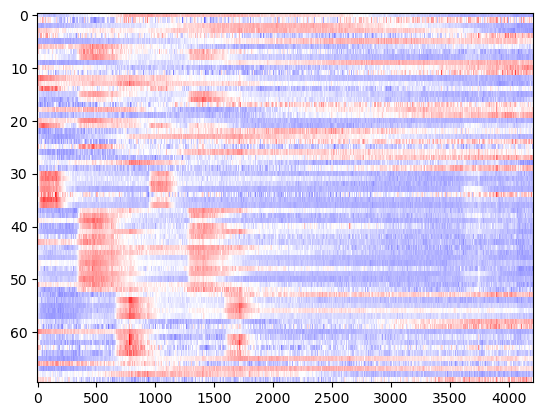

In [2325]:
plt.imshow(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_norm1'][np.argsort(cnmf_dicts_invivo_ip[l]['row_clusts_f']),...], interpolation='nearest',aspect='auto',cmap='bwr',vmin=-1,vmax=2)

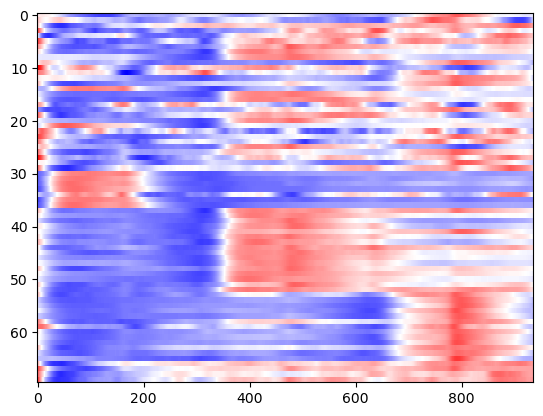

In [2326]:
# bandpass and cluster wells001 NE/DA responses - only use bandpass for clustering (want to show lack of slow-ish KCl signal later)
sample_rate = 31/60
def lowpass(data: np.ndarray, cutoff: float, sample_rate: float, poles: int = 5):
    sos = sg.butter(poles, cutoff, 'lowpass', fs=sample_rate, output='sos')
    filtered_data = scipy.signal.sosfiltfilt(sos, data)
    return filtered_data
def highpass(data: np.ndarray, cutoff: float, sample_rate: float, poles: int = 5):
    sos = sg.butter(poles, cutoff, 'highpass', fs=sample_rate, output='sos')
    filtered_data = scipy.signal.sosfiltfilt(sos, data)
    return filtered_data
def bandpass(data: np.ndarray, cutoff, sample_rate: float, poles: int = 5):
    sos = sg.butter(poles, cutoff, 'bandpass', fs=sample_rate, output='sos')
    filtered_data = scipy.signal.sosfiltfilt(sos, data)
    return filtered_data

times = np.arange(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_norm1'][...,:936].shape[1])/sample_rate #[...,:936]

#filtered = lowpass(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_norm1'][hdbs_invivo.labels_==c,...][...,:2400], 1/600, sample_rate)
#filtered = cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_norm1'][hdbs_invivo.labels_==c,...][...,:2400]-highpass(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_norm1'][hdbs_invivo.labels_==c,...][...,:2400], 1/600, sample_rate,1)
#filtered =  bandpass(CY_m_matched_raw_corr_norm1[...,:3000], [1/8000,1/50], sample_rate,1)
filteredu = bandpass(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_norm1'][...,:936], [1/2000,1/150], sample_rate,1) #[np.argsort(hdbs_invivo.labels_),...]
#filtered2 = bandpass(CY_m2_matched_raw_gr_corr_norm1[...,:2000], [1/4000,1/50], sample_rate,1) #[np.argsort(hdbs_invivo.labels_),...]

#from matplotlib import colors
#divnorm=colors.TwoSlopeNorm(vcenter=0)
filteredu_sort = np.sort(filteredu,axis=1)
filteredu_b10 = np.mean(filteredu_sort[:,:int(np.ceil(filteredu_sort.shape[1]/10))],axis=1) #[[x for x in np.arange(21).tolist() if x not in oxt_rm],...]
filteredu_t10 = np.mean(filteredu_sort[:,-int(np.ceil(filteredu_sort.shape[1]/10)):],axis=1)
filteredu_norm1 = ((filteredu.T-filteredu_b10)/(filteredu_t10-filteredu_b10)).T
plt.imshow(filteredu_norm1[np.argsort(cnmf_dicts_invivo_ip[l]['row_clusts_f']),...],interpolation='nearest',aspect='auto',cmap='bwr')#,vmax=1)

#filtered2_sort = np.sort(filtered2,axis=1)
#filtered2_b10 = np.mean(filtered2_sort[:,:int(np.ceil(filtered2_sort.shape[1]/10))],axis=1) #[[x for x in np.arange(21).tolist() if x not in oxt_rm],...]
#filtered2_t10 = np.mean(filtered2_sort[:,-int(np.ceil(filtered2_sort.shape[1]/10)):],axis=1)
#filtered2_norm1 = ((filtered2.T-filtered2_b10)/(filtered2_t10-filtered2_b10)).T
#plt.imshow(filtered2_norm1[np.argsort(hdbs_slice_w.labels_),...],interpolation='nearest',aspect='auto',cmap='bwr',vmax=1)

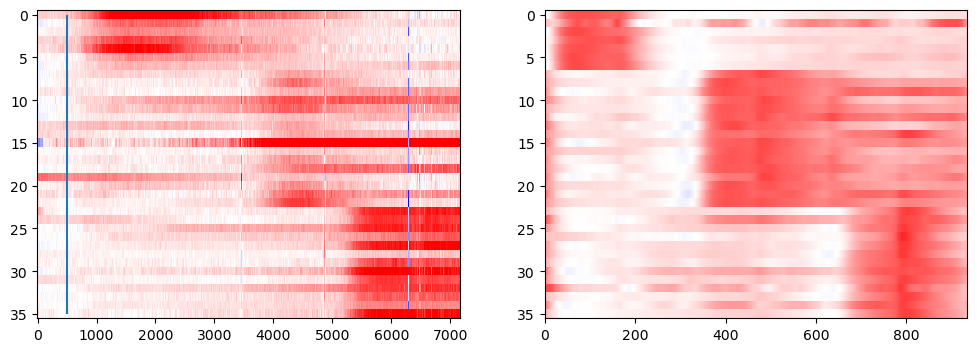

In [2327]:
plt.figure(figsize=(12,4))
plt.subplot(1, 2, 1)
plt.imshow(
    np.vstack((cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_ip[l]['row_clusts_f']==0,...],
               cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],
               cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...])),
    interpolation='nearest',aspect='auto',cmap='bwr',vmin=-0.8,vmax=0.8)
plt.vlines(x=500,ymin=0,ymax=35)
plt.subplot(1, 2, 2)
plt.imshow(
    np.vstack((filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==0,...],
               filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],
               filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...])),
    interpolation='nearest',aspect='auto',cmap='bwr',vmin=-1.5,vmax=1.5)#,vmax=2)


In [2328]:
new_dff2 = ((cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw'].T-(np.mean(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw'][...,:600],axis=1)))/(np.mean(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw'][...,:600],axis=1))).T

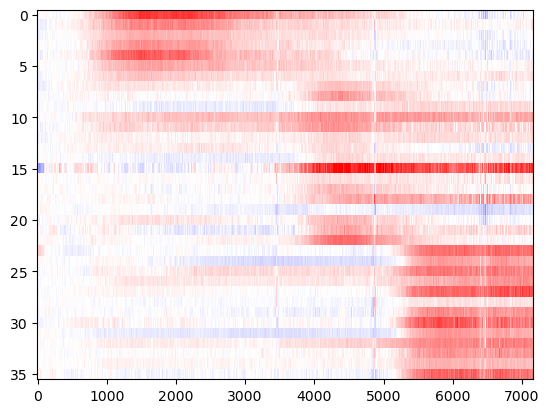

In [2329]:
# bandpass and cluster wells001 NE/DA responses - only use bandpass for clustering (want to show lack of slow-ish KCl signal later)
sample_rate = 31/60
def lowpass(data: np.ndarray, cutoff: float, sample_rate: float, poles: int = 5):
    sos = sg.butter(poles, cutoff, 'lowpass', fs=sample_rate, output='sos')
    filtered_data = scipy.signal.sosfiltfilt(sos, data)
    return filtered_data
def highpass(data: np.ndarray, cutoff: float, sample_rate: float, poles: int = 5):
    sos = sg.butter(poles, cutoff, 'highpass', fs=sample_rate, output='sos')
    filtered_data = scipy.signal.sosfiltfilt(sos, data)
    return filtered_data
def bandpass(data: np.ndarray, cutoff, sample_rate: float, poles: int = 5):
    sos = sg.butter(poles, cutoff, 'bandpass', fs=sample_rate, output='sos')
    filtered_data = scipy.signal.sosfiltfilt(sos, data)
    return filtered_data

times = np.arange(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw'].shape[1])/sample_rate #[...,:936]

#filtered = lowpass(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_norm1'][hdbs_invivo.labels_==c,...][...,:2400], 1/600, sample_rate)
#filtered = cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_norm1'][hdbs_invivo.labels_==c,...][...,:2400]-highpass(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_norm1'][hdbs_invivo.labels_==c,...][...,:2400], 1/600, sample_rate,1)
#filtered =  bandpass(CY_m_matched_raw_corr_norm1[...,:3000], [1/8000,1/50], sample_rate,1)
filtereddff = lowpass(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw'], 1/50000, sample_rate,1) #[np.argsort(hdbs_invivo.labels_),...]
#filtered2 = bandpass(CY_m2_matched_raw_gr_corr_norm1[...,:2000], [1/4000,1/50], sample_rate,1) #[np.argsort(hdbs_invivo.labels_),...]
new_dff2 = (((cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw']-filtereddff).T-(np.mean((cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw']-filtereddff)[...,:600],axis=1)))/(np.mean((cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw'])[...,:600],axis=1))).T
plt.imshow(
    np.vstack((new_dff2[cnmf_dicts_invivo_ip[l]['row_clusts_f']==0,...],
               new_dff2[cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],
               new_dff2[cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...])),
    interpolation='nearest',aspect='auto',cmap='bwr',vmin=-0.9,vmax=0.9)

#from matplotlib import colors
#divnorm=colors.TwoSlopeNorm(vcenter=0)
#filteredu_sort = np.sort(filteredu,axis=1)
#filteredu_b10 = np.mean(filteredu_sort[:,:int(np.ceil(filteredu_sort.shape[1]/10))],axis=1) #[[x for x in np.arange(21).tolist() if x not in oxt_rm],...]
#filteredu_t10 = np.mean(filteredu_sort[:,-int(np.ceil(filteredu_sort.shape[1]/10)):],axis=1)
#filteredu_norm1 = ((filteredu.T-filteredu_b10)/(filteredu_t10-filteredu_b10)).T
#plt.imshow(filteredu_norm1[np.argsort(cnmf_dicts_invivo_ip[l]['row_clusts_f']),...],interpolation='nearest',aspect='auto',cmap='bwr')#,vmax=1)

#filtered2_sort = np.sort(filtered2,axis=1)
#filtered2_b10 = np.mean(filtered2_sort[:,:int(np.ceil(filtered2_sort.shape[1]/10))],axis=1) #[[x for x in np.arange(21).tolist() if x not in oxt_rm],...]
#filtered2_t10 = np.mean(filtered2_sort[:,-int(np.ceil(filtered2_sort.shape[1]/10)):],axis=1)
#filtered2_norm1 = ((filtered2.T-filtered2_b10)/(filtered2_t10-filtered2_b10)).T
#plt.imshow(filtered2_norm1[np.argsort(hdbs_slice_w.labels_),...],interpolation='nearest',aspect='auto',cmap='bwr',vmax=1)

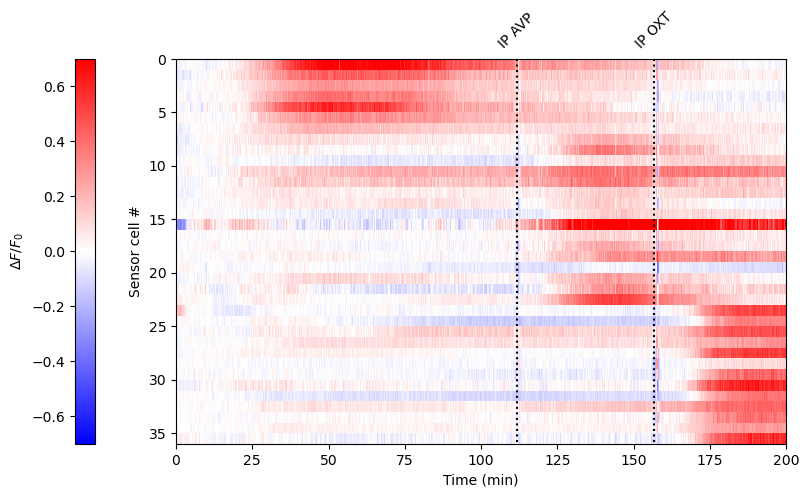

In [2363]:
%matplotlib inline
fig,ax= plt.subplots(figsize=(10.5,5))
f = ax.imshow(
    np.vstack((new_dff2[cnmf_dicts_invivo_ip[l]['row_clusts_f']==0,...],
               new_dff2[cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],
               new_dff2[cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...])),
    extent=[0,cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'].shape[1]/cnmf_dicts_invivo_ip[l]['vol_per_min'],np.vstack((cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_ip[l]['row_clusts_f']==0,...],
               cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],
               cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...])).shape[0],0],
    interpolation='nearest',aspect='auto',cmap='bwr',vmin=-0.7,vmax=0.7)
ax.vlines(x=[cnmf_dicts_invivo_ip[l]['oxt_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min'],cnmf_dicts_invivo_ip[l]['avp_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min']],ymin=0,ymax=np.vstack((cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_ip[l]['row_clusts_f']==0,...],
               cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],
               cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...])).shape[0],
          color='black',linestyle='dotted')
ax.set_xlabel('Time (min)')
ax.set_ylabel('Sensor cell #')
ax.set_xticks([cnmf_dicts_invivo_ip[l]['oxt_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min'],cnmf_dicts_invivo_ip[l]['avp_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min']],  ['IP OXT','IP AVP'],rotation=45,minor=True)
ax.tick_params(labeltop=True,bottom=False,labelbottom=False,which='minor')
ax.set_xticks(25*np.arange(9),25*np.arange(9))
ax.set_xlim(0,200)

fig.colorbar(f,ax=ax,location='left',label='$\Delta F/F _0$')
#plt.subplot(1, 2, 2)
#plt.imshow(
#    np.vstack((filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...])),
#    extent=[200,1050,np.vstack((filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...])).shape[0],0],
#    interpolation='nearest',aspect='auto',cmap='bwr',vmin=-0.5,vmax=1.5)#,vmin=0)#,vmax=2)
#plt.vlines(x=[312,468,624,780,936],ymin=0,ymax=np.vstack((filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...])).shape[0],color='black',linestyle='dotted')

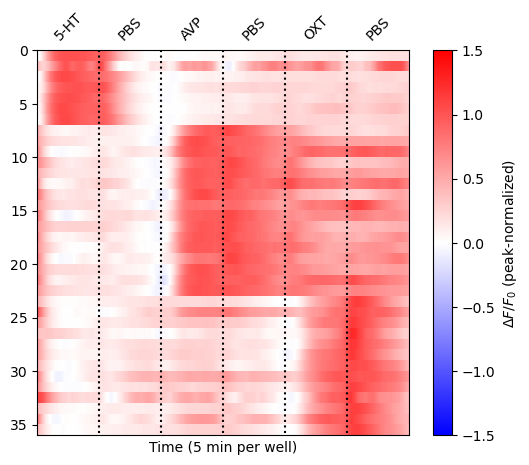

In [1792]:
%matplotlib inline
fig,ax= plt.subplots(figsize=(6,5))
f = ax.imshow(
    np.vstack((filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==0,...],
               filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],
               filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...])),
    extent=[0,936,np.vstack((filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==0,...],
               filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],
               filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...])).shape[0],0],
    interpolation='nearest',aspect='auto',cmap='bwr',vmin=-1.5,vmax=1.5)#,vmin=0)#,vmax=2)
ax.vlines(x=[156,312,468,624,780],ymin=0,ymax=np.vstack((filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==0,...],
               filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],
               filteredu_norm1[cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...])).shape[0],color='black',linestyle='dotted')
ax.set_xticks([78,78+156,390,390+156,702,702+156],  ['5-HT','PBS','AVP','PBS','OXT','PBS'],rotation=45,minor=True)
ax.tick_params(labeltop=True,bottom=False,labelbottom=False,which='minor')
ax.tick_params(bottom=False,labelbottom=False)
ax.set_xlabel('Time (5 min per well)')
fig.colorbar(f,ax=ax,location='right',label='$\Delta F/F _0$ (peak-normalized)')

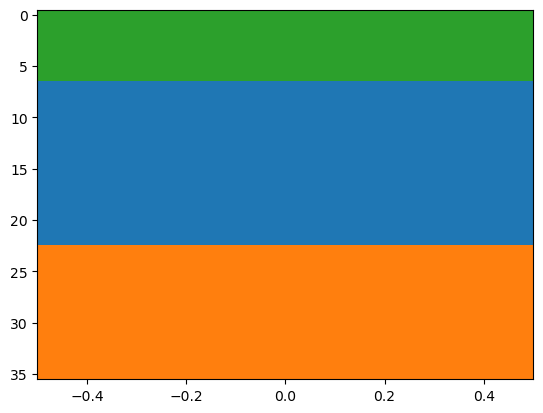

In [1174]:
%matplotlib inline
keeprows_5ht = [2]*np.sum(cnmf_dicts_invivo_ip[l]['row_clusts_f']==0)+[0]*np.sum(cnmf_dicts_invivo_ip[l]['row_clusts_f']==1)+[1]*np.sum(cnmf_dicts_invivo_ip[l]['row_clusts_f']==2)
plt.imshow(np.array(keeprows_5ht)[...,np.newaxis],cmap=color_map,norm=norm,interpolation='nearest',aspect='auto')

In [1182]:
print(cnmf_dicts_invivo_ip[l]['oxt_vol_onset'])
print(cnmf_dicts_invivo_ip[l]['avp_vol_onset'])
'#1f77b4', '#ff7f0e', '#2ca02c'

4845
3453


('#1f77b4', '#ff7f0e', '#2ca02c')

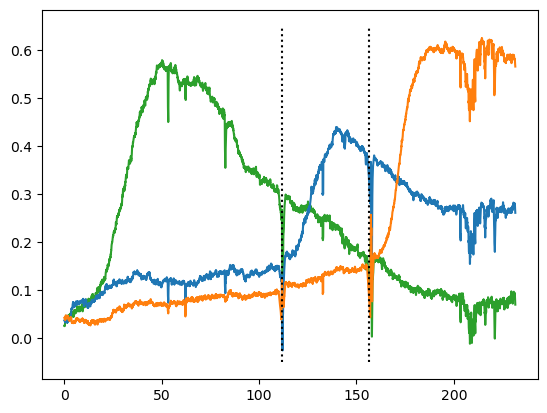

In [1183]:
tvals = np.arange(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'].shape[1])/cnmf_dicts_invivo_ip[l]['vol_per_min']
plt.plot(tvals,sg.savgol_filter(np.mean(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_ip[l]['row_clusts_f']==0,...],axis=0),10,1),color='#2ca02c')
plt.plot(tvals,sg.savgol_filter(np.mean(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],axis=0),10,1),color='#1f77b4')
plt.plot(tvals,sg.savgol_filter(np.mean(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...],axis=0),10,1),color='#ff7f0e')
plt.vlines(x=[cnmf_dicts_invivo_ip[l]['oxt_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min'],cnmf_dicts_invivo_ip[l]['avp_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min']],ymin=-0.05,ymax=0.65,color='black',linestyle='dotted')

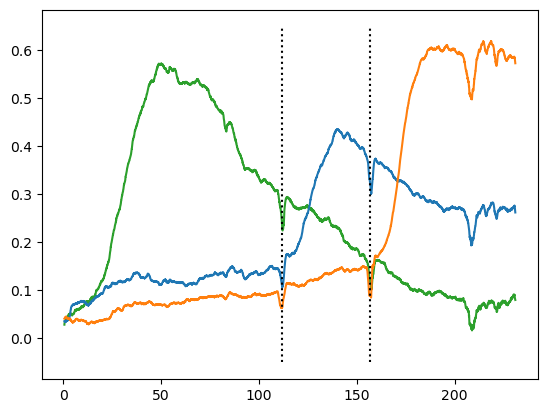

In [1194]:
tvals = (np.arange(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'].shape[1])/cnmf_dicts_invivo_ip[l]['vol_per_min'])[15:-15]
plt.plot(tvals,np.mean(sg.medfilt(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_ip[l]['row_clusts_f']==0,...],[1,51]),axis=0)[15:-15],color='#2ca02c')
plt.plot(tvals,np.mean(sg.medfilt(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],[1,51]),axis=0)[15:-15],color='#1f77b4')
plt.plot(tvals,np.mean(sg.medfilt(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'][cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...],[1,51]),axis=0)[15:-15],color='#ff7f0e')
plt.vlines(x=[cnmf_dicts_invivo_ip[l]['oxt_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min'],cnmf_dicts_invivo_ip[l]['avp_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min']],ymin=-0.05,ymax=0.65,color='black',linestyle='dotted')

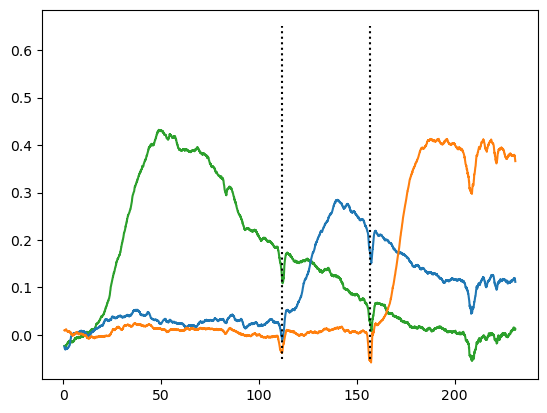

In [1195]:
tvals = (np.arange(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'].shape[1])/cnmf_dicts_invivo_ip[l]['vol_per_min'])[15:-15]
plt.plot(tvals,np.mean(sg.medfilt(new_dff2[cnmf_dicts_invivo_ip[l]['row_clusts_f']==0,...],[1,51]),axis=0)[15:-15],color='#2ca02c')
plt.plot(tvals,np.mean(sg.medfilt(new_dff2[cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],[1,51]),axis=0)[15:-15],color='#1f77b4')
plt.plot(tvals,np.mean(sg.medfilt(new_dff2[cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...],[1,51]),axis=0)[15:-15],color='#ff7f0e')
plt.vlines(x=[cnmf_dicts_invivo_ip[l]['oxt_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min'],cnmf_dicts_invivo_ip[l]['avp_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min']],ymin=-0.05,ymax=0.65,color='black',linestyle='dotted')

In [1201]:
i=0
tvals = (np.arange(cnmf_dicts_invivo_ip[l_vals[i]]['CY_ref_matched_raw'].shape[1])-(ip1_vals[i]*cnmf_dicts_invivo_ip[l_vals[i]]['vol_per_min']-cuts_ip[l_vals[i]]))/cnmf_dicts_invivo_ip[l_vals[i]]['vol_per_min']
new_d3 = sg.medfilt(cnmf_dicts_invivo_ip[l_vals[i]]['CY_ref_matched_raw'],[1,51])
new_d3_sort = np.sort(sg.medfilt(cnmf_dicts_invivo_ip[l_vals[i]]['CY_ref_matched_raw'][...,:tvals[tvals<90].shape[0]],[1,51]),axis=1)
f0d3 = np.mean(new_d3_sort[...,:int(np.ceil(new_d3_sort.shape[1]/15))],axis=1)
new_dff3 = ((new_d3.T-f0d3)/f0d3).T

Text(0, 0.5, '$\\Delta F/F _0$')

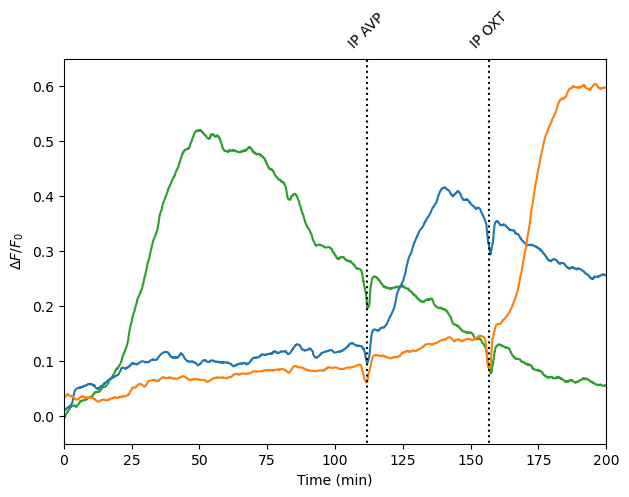

In [1211]:
%matplotlib inline

tvals = (np.arange(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'].shape[1])/cnmf_dicts_invivo_ip[l]['vol_per_min'])[15:-15]
fig, ax = plt.subplots(figsize=(7,5))
ax.plot(tvals,np.mean(sg.medfilt(new_dff3[cnmf_dicts_invivo_ip[l]['row_clusts_f']==0,...],[1,51]),axis=0)[15:-15],color='#2ca02c')
ax.plot(tvals,np.mean(sg.medfilt(new_dff3[cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],[1,51]),axis=0)[15:-15],color='#1f77b4')
ax.plot(tvals,np.mean(sg.medfilt(new_dff3[cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...],[1,51]),axis=0)[15:-15],color='#ff7f0e')
#plt.plot(tvals,np.mean(sg.medfilt(new_dff2[cnmf_dicts_invivo_ip[l]['row_clusts_f']==1,...],[1,51]),axis=0)[15:-15],color='#1f77b4')
#plt.plot(tvals,np.mean(sg.medfilt(new_dff2[cnmf_dicts_invivo_ip[l]['row_clusts_f']==2,...],[1,51]),axis=0)[15:-15],color='#ff7f0e')
ax.vlines(x=[cnmf_dicts_invivo_ip[l]['oxt_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min'],cnmf_dicts_invivo_ip[l]['avp_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min']],ymin=-1,ymax=1,color='black',linestyle='dotted')




ax.set_xticks([cnmf_dicts_invivo_ip[l]['oxt_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min'],cnmf_dicts_invivo_ip[l]['avp_vol_onset']/cnmf_dicts_invivo_ip[l]['vol_per_min']],  ['IP OXT','IP AVP'],rotation=45,minor=True)
ax.tick_params(labeltop=True,bottom=False,labelbottom=False,which='minor')
ax.set_xlim(0,200)
ax.set_ylim(-0.05,0.65)
ax.set_xlabel('Time (min)')
ax.set_ylabel('$\Delta F/F _0$')



In [1261]:
# Fig 5 simple 2p traces
from numpy import genfromtxt
dir_nm = r'H:\from_martas_osler\traces'
gc_5ht_icv = genfromtxt(os.path.join(dir_nm,r'MORSE ChP 2p traces - gcamp 5ht icv.csv'), delimiter=',',dtype='str')
gc_5ht_ip = genfromtxt(os.path.join(dir_nm,r'MORSE ChP 2p traces - gcamp 5ht ip.csv'), delimiter=',',dtype='str')
gr_5ht_icv = genfromtxt(os.path.join(dir_nm,r'MORSE ChP 2p traces - grab 5ht icv.csv'), delimiter=',',dtype='str')
gr_5ht_ip = genfromtxt(os.path.join(dir_nm,r'MORSE ChP 2p traces - grab 5ht ip.csv'), delimiter=',',dtype='str')
gr_avp_ip = genfromtxt(os.path.join(dir_nm,r'MORSE ChP 2p traces - grab avp ip.csv'), delimiter=',',dtype='str')
gr_oxt_ip = genfromtxt(os.path.join(dir_nm,r'MORSE ChP 2p traces - grab oxt ip.csv'), delimiter=',',dtype='str')

In [1359]:
fil_ran = 100/2

['0309-0728-014_200928_001_mean_zproj.tif-113-152' '' ''
 '0309-0721-013_200928_001_mean_zproj.tif-382-111' '' ''
 '118-1206-001_230720_001_mean_zproj.tif-114-184' '' '']
4715.252
1000
1000.0
200.0
7514.721
1200
1200.0
300.0
9960.0
323
333.0
60.0


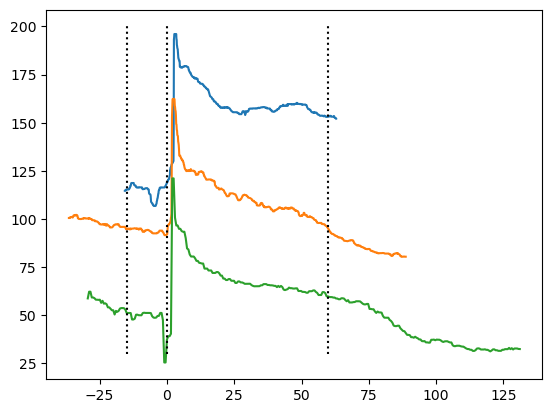

In [1592]:
gc_5ht_icv_t = []
gc_5ht_icv_d = []
print(gc_5ht_icv[0,...])
for i in np.arange(1,gc_5ht_icv.shape[1],3).tolist():
    t_offset = 0
    if i == 4:
        t_offset = 50
    print(gc_5ht_icv[1,i+1].astype(np.float32))
    print(gc_5ht_icv[2:,i-1][gc_5ht_icv[2:,i]!=''].shape[0])
    print(gc_5ht_icv[2,i+1].astype(np.float32))
    print(gc_5ht_icv[3,i+1].astype(np.float32))
    plt.plot((gc_5ht_icv[2:,i-1][gc_5ht_icv[2:,i]!=''].astype(np.float32)-gc_5ht_icv[3,i+1].astype(np.float32)-t_offset)*(gc_5ht_icv[1,i+1].astype(np.float32)/(60*gc_5ht_icv[2,i+1].astype(np.float32))),sg.medfilt(gc_5ht_icv[2:,i][gc_5ht_icv[2:,i]!=''].astype(np.float32),np.floor(fil_ran*gc_5ht_icv[2,i+1].astype(np.float32)/gc_5ht_icv[1,i+1].astype(np.float32)).astype('int')*2+1))
    gc_5ht_icv_t.append((gc_5ht_icv[2:,i-1][gc_5ht_icv[2:,i]!=''].astype(np.float32)-gc_5ht_icv[3,i+1].astype(np.float32)-t_offset)*(gc_5ht_icv[1,i+1].astype(np.float32)/(60*gc_5ht_icv[2,i+1].astype(np.float32))))
    gc_5ht_icv_d.append(sg.medfilt(gc_5ht_icv[2:,i][gc_5ht_icv[2:,i]!=''].astype(np.float32),np.floor(fil_ran*gc_5ht_icv[2,i+1].astype(np.float32)/gc_5ht_icv[1,i+1].astype(np.float32)).astype('int')*2+1))
plt.vlines(x=0,ymin=30,ymax=200,linestyle='dotted',color='black')
plt.vlines(x=-15,ymin=30,ymax=200,linestyle='dotted',color='black')
plt.vlines(x=60,ymin=30,ymax=200,linestyle='dotted',color='black')

['302-1202-001_230824_001_mean_zproj.tif-148-289' '' ''
 '429-907-001_230725_001_mean_zproj.tif-212-124' '' ''
 '922-825-001_230721_001_mean_zproj.tif-257-56' '' ''
 '922-825-001_230822_001_mean_zproj.tif-235-397' '' ''
 '119-1206-001_231115_001_mean_zproj.tif-235-196' '' ''
 '626-914-001_231117_001_mean_zproj.tif-98-250' '' '']
9936.4
2300
2300.0
23
9936.4
2300
2300.0
23
9936.4
2300
2300.0
23
9936.4
2300
2300.0
23
9960
323
333.0
3
9936.4
2300
2300.0
23


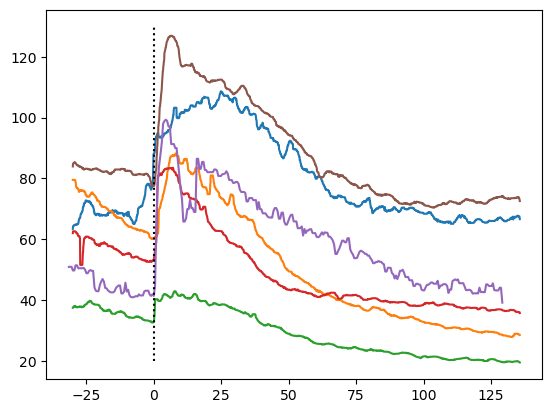

In [1368]:
gc_5ht_ip_t = []
gc_5ht_ip_d = []
print(gc_5ht_ip[0,...])
for i in np.arange(1,gc_5ht_ip.shape[1],3).tolist():
    t_offset = 0
    if i == 13:
        t_offset = 4
    print(gc_5ht_ip[1,i+1])
    print(gc_5ht_ip[2:,i-1][gc_5ht_ip[2:,i]!=''].shape[0])
    print(gc_5ht_ip[2,i+1].astype(np.float32))
    plt.plot((gc_5ht_ip[2:,i-1][gc_5ht_ip[2:,i]!=''].astype(np.float32)-gc_5ht_ip[3,i+1].astype(np.float32)-t_offset)*(gc_5ht_ip[1,i+1].astype(np.float32)/(60*gc_5ht_ip[2,i+1].astype(np.float32))),sg.medfilt(gc_5ht_ip[2:,i][gc_5ht_ip[2:,i]!=''].astype(np.float32),np.floor(fil_ran*gc_5ht_ip[2,i+1].astype(np.float32)/gc_5ht_ip[1,i+1].astype(np.float32)).astype('int')*2+1))
    print(np.floor(fil_ran*gc_5ht_ip[2,i+1].astype(np.float32)/gc_5ht_ip[1,i+1].astype(np.float32)).astype('int')*2+1)
    gc_5ht_ip_t.append((gc_5ht_ip[2:,i-1][gc_5ht_ip[2:,i]!=''].astype(np.float32)-gc_5ht_ip[3,i+1].astype(np.float32)-t_offset)*(gc_5ht_ip[1,i+1].astype(np.float32)/(60*gc_5ht_ip[2,i+1].astype(np.float32))))
    gc_5ht_ip_d.append(sg.medfilt(gc_5ht_ip[2:,i][gc_5ht_ip[2:,i]!=''].astype(np.float32),np.floor(fil_ran*gc_5ht_ip[2,i+1].astype(np.float32)/gc_5ht_ip[1,i+1].astype(np.float32)).astype('int')*2+1))
plt.vlines(x=0,ymin=20,ymax=130,linestyle='dotted',color='black')

['MPK14_230515_001_max_proj 3.tif-20-12' '' ''
 'MPK16_20230516_001_max_proj 3.tif-46-63' '' '']
9940.722
2100
2301.0
9940.722
2300
2301.0


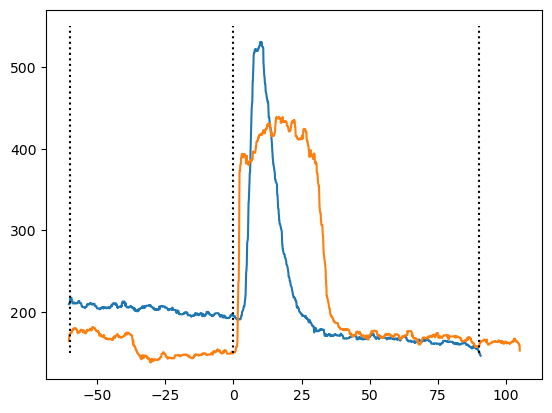

In [1652]:
gr_5ht_icv_t = []
gr_5ht_icv_d = []
print(gr_5ht_icv[0,...])
for i in np.arange(1,gr_5ht_icv.shape[1],3).tolist():
    print(gr_5ht_icv[1,i+1])
    print(gr_5ht_icv[2:,i-1][gr_5ht_icv[2:,i]!=''].shape[0])
    print(gr_5ht_icv[2,i+1].astype(np.float32))
    plt.plot((gr_5ht_icv[2:,i-1][gr_5ht_icv[2:,i]!=''].astype(np.float32)-gr_5ht_icv[3,i+1].astype(np.float32))*(gr_5ht_icv[1,i+1].astype(np.float32)/(60*gr_5ht_icv[2,i+1].astype(np.float32))),sg.medfilt(gr_5ht_icv[2:,i][gr_5ht_icv[2:,i]!=''].astype(np.float32),np.floor(fil_ran*gr_5ht_icv[2,i+1].astype(np.float32)/gr_5ht_icv[1,i+1].astype(np.float32)).astype('int')*2+1))
    gr_5ht_icv_t.append((gr_5ht_icv[2:,i-1][gr_5ht_icv[2:,i]!=''].astype(np.float32)-gr_5ht_icv[3,i+1].astype(np.float32)-t_offset)*(gr_5ht_icv[1,i+1].astype(np.float32)/(60*gr_5ht_icv[2,i+1].astype(np.float32))))
    gr_5ht_icv_d.append(sg.medfilt(gr_5ht_icv[2:,i][gr_5ht_icv[2:,i]!=''].astype(np.float32),np.floor(fil_ran*gr_5ht_icv[2,i+1].astype(np.float32)/gr_5ht_icv[1,i+1].astype(np.float32)).astype('int')*2+1))

plt.vlines(x=0,ymin=150,ymax=550,linestyle='dotted',color='black')
plt.vlines(x=90,ymin=150,ymax=550,linestyle='dotted',color='black')
plt.vlines(x=-60,ymin=150,ymax=550,linestyle='dotted',color='black')

['1106-1026-001_231206_001_mean_zproj.tif-323-52' '' ''
 '1108-1026-001_231205_001_mean_zproj.tif-289-130' '' ''
 'MPK14_230501_001_max_proj 2.tif-14-38' '' ''
 'MPK14_20230510_001_max_proj 2.tif-60-16' '' ''
 'MPK16_230505_001_max_proj 3.tif-71-5' '' '']
9936.4
2300
2300.0
9936.4
2300
2300.0
9071.99
2100
2100.0
9940.722
2100
2301.0
9940.722
2300
2301.0


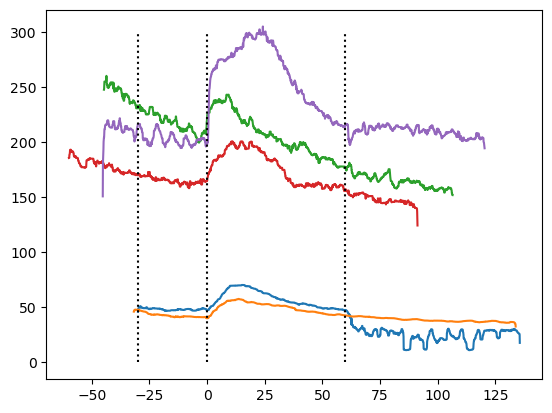

In [1589]:
gr_5ht_ip_t = []
gr_5ht_ip_d = []
print(gr_5ht_ip[0,...])
for i in np.arange(1,gr_5ht_ip.shape[1],3).tolist():
    t_offset = 0
    if i==4:
        t_offset = 25
    print(gr_5ht_ip[1,i+1])
    print(gr_5ht_ip[2:,i-1][gr_5ht_ip[2:,i]!=''].shape[0])
    print(gr_5ht_ip[2,i+1].astype(np.float32))
    plt.plot((gr_5ht_ip[2:,i-1][gr_5ht_ip[2:,i]!=''].astype(np.float32)-gr_5ht_ip[3,i+1].astype(np.float32)-t_offset)*(gr_5ht_ip[1,i+1].astype(np.float32)/(60*gr_5ht_ip[2,i+1].astype(np.float32))),sg.medfilt(gr_5ht_ip[2:,i][gr_5ht_ip[2:,i]!=''].astype(np.float32),np.floor(fil_ran*gr_5ht_ip[2,i+1].astype(np.float32)/gr_5ht_ip[1,i+1].astype(np.float32)).astype('int')*2+1))
    gr_5ht_ip_t.append((gr_5ht_ip[2:,i-1][gr_5ht_ip[2:,i]!=''].astype(np.float32)-gr_5ht_ip[3,i+1].astype(np.float32)-t_offset)*(gr_5ht_ip[1,i+1].astype(np.float32)/(60*gr_5ht_ip[2,i+1].astype(np.float32))))
    gr_5ht_ip_d.append(sg.medfilt(gr_5ht_ip[2:,i][gr_5ht_ip[2:,i]!=''].astype(np.float32),np.floor(fil_ran*gr_5ht_ip[2,i+1].astype(np.float32)/gr_5ht_ip[1,i+1].astype(np.float32)).astype('int')*2+1))
plt.vlines(x=60,ymin=0,ymax=300,linestyle='dotted',color='black')
plt.vlines(x=0,ymin=0,ymax=300,linestyle='dotted',color='black')
plt.vlines(x=-30,ymin=0,ymax=300,linestyle='dotted',color='black')

['MPK21_230502_001_max_proj 1.tif-98-44' '' ''
 'MPK26_230601_001_max_proj 1.tif-61-34' '' ''
 'MPK26_230609_001_max_proj 2.tif-97-23' '' ''
 'MPK35_230615_001_max_proj 1.tif-0-0' '' ''
 'MPK35_20230619_001_max_proj 1.tif-67-30' '' ''
 'MPK35_230622_001_max_proj 1.tif-0-0' '' ''
 '630-619-001_20230720_001_max_proj 6.tif-49-48' '' ''
 '630-619-001_20230726_001_max_proj 2.tif-59-77' '' ''
 '630-619-001_20230809_001_max_proj 2.tif' '' '']
9071.99
2100
2100.0
9940.722
2100
2301.0
9936.4
2100
2300.0
9936.4
2300
2300.0
9936.4
2300
2300.0
9936.4
2300
2300.0
9936.4
2300
2300.0
9936.4
2300
2300.0
9936.4
2300
2300.0


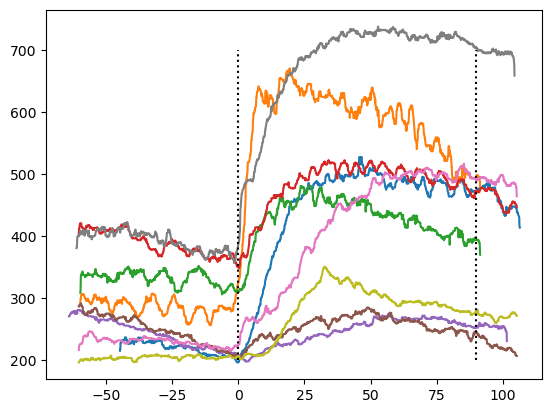

In [1593]:
gr_avp_ip_t = []
gr_avp_ip_d = []
print(gr_avp_ip[0,...])
for i in np.arange(1,gr_avp_ip.shape[1],3).tolist():
    print(gr_avp_ip[1,i+1])
    print(gr_avp_ip[2:,i-1][gr_avp_ip[2:,i]!=''].shape[0])
    print(gr_avp_ip[2,i+1].astype(np.float32))
    plt.plot((gr_avp_ip[2:,i-1][gr_avp_ip[2:,i]!=''].astype(np.float32)-gr_avp_ip[3,i+1].astype(np.float32))*(gr_avp_ip[1,i+1].astype(np.float32)/(60*gr_avp_ip[2,i+1].astype(np.float32))),sg.medfilt(gr_avp_ip[2:,i][gr_avp_ip[2:,i]!=''].astype(np.float32),np.floor(fil_ran*gr_avp_ip[2,i+1].astype(np.float32)/gr_avp_ip[1,i+1].astype(np.float32)).astype('int')*2+1))

    gr_avp_ip_t.append((gr_avp_ip[2:,i-1][gr_avp_ip[2:,i]!=''].astype(np.float32)-gr_avp_ip[3,i+1].astype(np.float32)-t_offset)*(gr_avp_ip[1,i+1].astype(np.float32)/(60*gr_avp_ip[2,i+1].astype(np.float32))))
    gr_avp_ip_d.append(sg.medfilt(gr_avp_ip[2:,i][gr_avp_ip[2:,i]!=''].astype(np.float32),np.floor(fil_ran*gr_avp_ip[2,i+1].astype(np.float32)/gr_avp_ip[1,i+1].astype(np.float32)).astype('int')*2+1))
plt.vlines(x=0,ymin=200,ymax=700,linestyle='dotted',color='black')
plt.vlines(x=90,ymin=200,ymax=700,linestyle='dotted',color='black')

['MPK38_230621_001_max_proj 1.tif-6-14' '' ''
 'MPK40_230614_001_max_proj 3.tif-43-17' '' ''
 'MPK40_230620_001_max_proj 3.tif-0-0' '' '']
9936.4
2300
2300.0
9936.4
2300
2300.0
9936.4
2300
2300.0


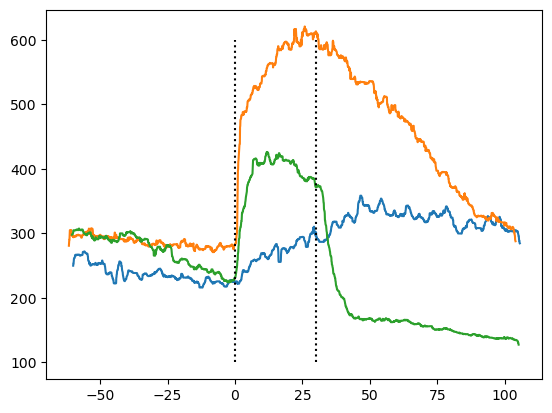

In [1595]:
gr_oxt_ip_t = []
gr_oxt_ip_d = []
print(gr_oxt_ip[0,...])
for i in np.arange(1,gr_oxt_ip.shape[1],3).tolist():
    print(gr_oxt_ip[1,i+1])
    print(gr_oxt_ip[2:,i-1][gr_oxt_ip[2:,i]!=''].shape[0])
    print(gr_oxt_ip[2,i+1].astype(np.float32))
    plt.plot((gr_oxt_ip[2:,i-1][gr_oxt_ip[2:,i]!=''].astype(np.float32)-gr_oxt_ip[3,i+1].astype(np.float32))*(gr_oxt_ip[1,i+1].astype(np.float32)/(60*gr_oxt_ip[2,i+1].astype(np.float32))),sg.medfilt(gr_oxt_ip[2:,i][gr_oxt_ip[2:,i]!=''].astype(np.float32),np.floor(fil_ran*gr_oxt_ip[2,i+1].astype(np.float32)/gr_oxt_ip[1,i+1].astype(np.float32)).astype('int')*2+1))
    gr_oxt_ip_t.append((gr_oxt_ip[2:,i-1][gr_oxt_ip[2:,i]!=''].astype(np.float32)-gr_oxt_ip[3,i+1].astype(np.float32)-t_offset)*(gr_oxt_ip[1,i+1].astype(np.float32)/(60*gr_oxt_ip[2,i+1].astype(np.float32))))
    gr_oxt_ip_d.append(sg.medfilt(gr_oxt_ip[2:,i][gr_oxt_ip[2:,i]!=''].astype(np.float32),np.floor(fil_ran*gr_oxt_ip[2,i+1].astype(np.float32)/gr_oxt_ip[1,i+1].astype(np.float32)).astype('int')*2+1))

plt.vlines(x=0,ymin=100,ymax=600,linestyle='dotted',color='black')
plt.vlines(x=30,ymin=100,ymax=600,linestyle='dotted',color='black')

In [1373]:
d_all = [gc_5ht_icv_d,gc_5ht_ip_d,gr_5ht_icv_d,gr_5ht_ip_d,gr_avp_ip_d,gr_oxt_ip_d]
t_all = [gc_5ht_icv_t,gc_5ht_ip_t,gr_5ht_icv_t,gr_5ht_ip_t,gr_avp_ip_t,gr_oxt_ip_t]

In [1386]:
d_all_clean = []
d_all_bg_clean = []
d_all_params_clean = np.zeros(0,15) # 5 fit parameters plus start/end and blstart/blend1-2-3 plus ligand id plus row

In [1387]:
from scipy.optimize import curve_fit
def func(x, a, b, c, d, e):
    #a=0
    #d=0
    return a * np.exp(-b * (x**c)) + d*x + e

In [1563]:
c=5
r=3
plt.plot(d_all[c][r])
plt.vlines(np.where(t_all[c][r]==0),ymin=np.min(d_all[c][r]),ymax=np.max(d_all[c][r]),colors='r',linestyles='dashed')
#plt.vlines(1250,ymin=np.min(d_all[c][r]),ymax=np.max(d_all[c][r]),colors='r',linestyles='dashed')
print(np.where(t_all[c][r]==0))

IndexError: list index out of range

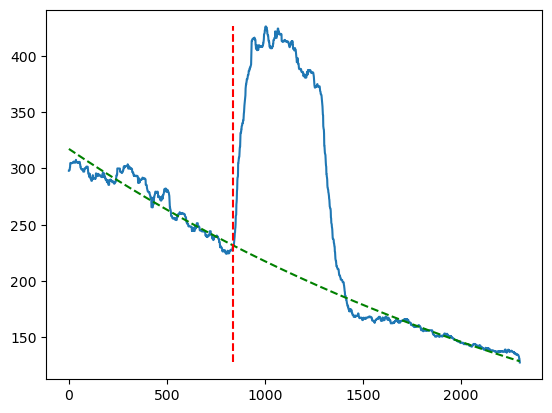

In [1560]:
start = 0
end = d_all[c][r].shape[0]
blstart1 = 830
blend1 = 1500#2620
blstart2 =end#2650
blend2 = end
blstart3 = end
blend3 = end
xdata = np.hstack((np.arange(start,blstart1),np.arange(blend1,blstart2),np.arange(blend2,blstart3),np.arange(blend3,end)))
popt, pcov = curve_fit(func, xdata, d_all[c][r][xdata], bounds=([0,0,0,-np.inf,-np.inf], [np.inf,np.inf,1,0,np.inf]), max_nfev = len(d_all[c][r])*10000)
plt.plot(d_all[c][r])
plt.plot(np.arange(len(d_all[c][r])), func(np.arange(len(d_all[c][r])), *popt), 'g--',
         label='fit: a=%5.3f, b=%5.3f, c=%5.3f, d=%5.3f, e=%5.3f' % tuple(popt))
plt.vlines(np.where(t_all[c][r]==0),ymin=np.min(d_all[c][r]),ymax=np.max(d_all[c][r]),colors='r',linestyles='dashed')
ax = plt.gca()
#ax.set_ylim([np.min(doses_by_ligand[c-1][r,dosestart:doseend].T),np.max(doses_by_ligand[c-1][r,dosestart:doseend].T)])

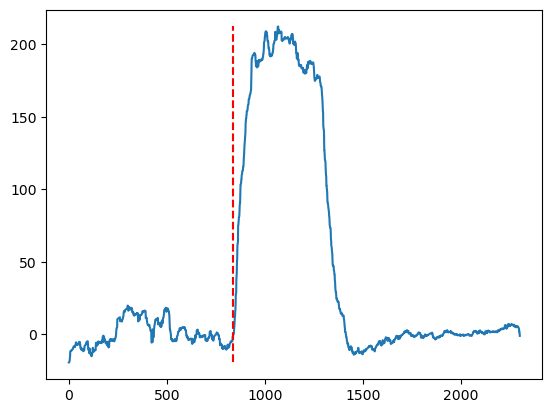

In [1561]:
plt.plot(d_all[c][r]-func(np.arange(len(d_all[c][r])), *popt))
plt.vlines(np.where(t_all[c][r]==0),ymin=np.min(d_all[c][r]-func(np.arange(len(d_all[c][r])), *popt)),ymax=np.max(d_all[c][r]-func(np.arange(len(d_all[c][r])), *popt)),colors='r',linestyles='dashed')
ax = plt.gca()
#ax.set_ylim([np.min((doses_by_ligand[c-1][r,...].T-func(np.arange(doses_by_ligand[c-1].shape[1]), *popt))[dosestart:doseend]),np.max((doses_by_ligand[c-1][r,...].T-func(np.arange(doses_by_ligand[c-1].shape[1]), *popt))[dosestart:doseend])])

In [1562]:
d_all_clean.append(d_all[c][r]-func(np.arange(len(d_all[c][r])), *popt))
d_all_bg_clean.append(func(np.arange(len(d_all[c][r])), *popt))
d_all_params_clean = np.vstack((d_all_params_clean,np.hstack((popt,start,end,blstart1,blend1,blstart2,blend2,blstart3,blend3,c,r))))

In [1575]:
# save all corrected chp traces
save_path_dal = r'H:\CNMFoutputs\peter\mask_matching\d_all.pickle'
save_path_tal = r'H:\CNMFoutputs\peter\mask_matching\t_all.pickle'
save_path_dalc = r'H:\CNMFoutputs\peter\mask_matching\d_all_clean.pickle'
save_path_dalb = r'H:\CNMFoutputs\peter\mask_matching\d_all_bg_clean.pickle'

with open(save_path_dal, 'wb') as f:
    pickle.dump(d_all, f)

with open(save_path_tal, 'wb') as f:
    pickle.dump(t_all, f)
    
with open(save_path_dalc, 'wb') as f:
    pickle.dump(d_all_clean, f)

with open(save_path_dalb, 'wb') as f:
    pickle.dump(d_all_bg_clean, f)
    
np.save(r'H:\CNMFoutputs\peter\mask_matching\d_all_params_clean.npy',d_all_params_clean)

In [ ]:
#d_all = [gc_5ht_icv_d,gc_5ht_ip_d,gr_5ht_icv_d,gr_5ht_ip_d,gr_avp_ip_d,gr_oxt_ip_d]

In [1584]:
len(d_all_clean)

28

In [1588]:
np.where(d_all_params_clean[...,-2]==0)[0].tolist()

[0, 1, 2]

In [1643]:
gc_5ht_icv_d_c = []
gc_5ht_icv_d_t = []
for l in range(len(np.where(d_all_params_clean[...,-2]==0)[0].tolist())):
    tvals = t_all[0][l]
    minbase = 15
    minpost = 60
    f0_range = 15
    ons = np.where(tvals==0)[0][0]
    mb = np.max(np.where(tvals<-minbase)[0])+1
    mp = np.min(np.where(tvals>minpost)[0])
    fr = np.max(np.where(tvals<-f0_range)[0])+1
    data = d_all_clean[np.where(d_all_params_clean[...,-2]==0)[0].tolist()[l]][mb:mp]
    f0 = np.mean(d_all_bg_clean[np.where(d_all_params_clean[...,-2]==0)[0].tolist()[l]][fr:ons])
    gc_5ht_icv_d_c.append(data/f0)
    gc_5ht_icv_d_t.append(tvals[mb:mp])
gc_5ht_icv_d_c_i = []
gc_5ht_icv_d_t_i = gc_5ht_icv_d_t[[len(x) for x in gc_5ht_icv_d_t].index(np.max([len(x) for x in gc_5ht_icv_d_t]))]
for l in range(len(gc_5ht_icv_d_c)):
    gc_5ht_icv_d_c_i.append(np.interp(gc_5ht_icv_d_t_i,gc_5ht_icv_d_t[l],gc_5ht_icv_d_c[l]))

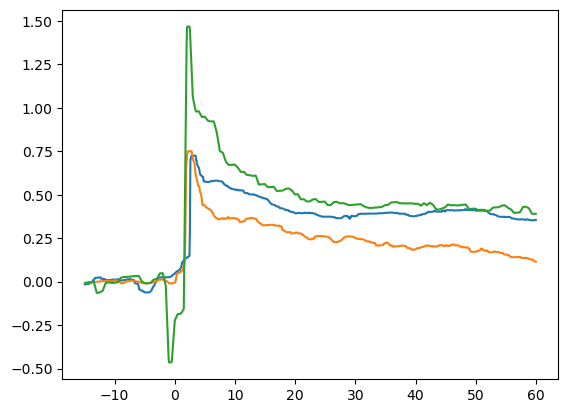

In [1644]:
plt.plot(gc_5ht_icv_d_t_i,np.array(gc_5ht_icv_d_c_i).T)

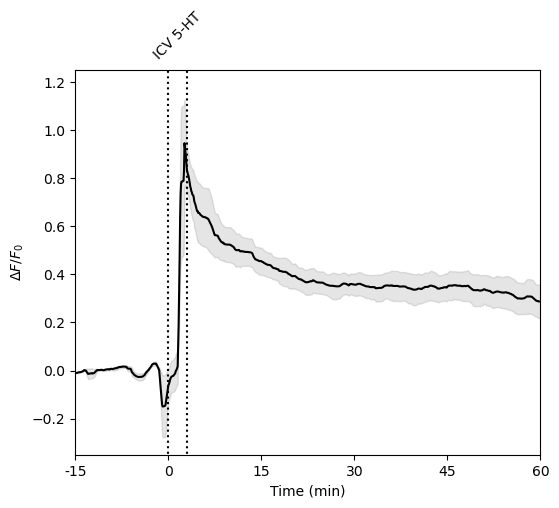

In [1771]:
%matplotlib inline
fig, ax = plt.subplots(figsize=(6,5))

#ax.plot(gc_5ht_icv_d_t_i,np.array(gc_5ht_icv_d_c_i).T,color='#2ca02c',alpha=0.3)
ax.plot(gc_5ht_icv_d_t_i,np.mean(np.array(gc_5ht_icv_d_c_i).T,axis=1),color='black')
ax.vlines(x=0,ymin=-1,ymax=2,color='black',linestyle='dotted')
ax.vlines(x=3,ymin=-1,ymax=2,color='black',linestyle='dotted')
#ax.fill_between(x=[0,3],y1=-1,y2=2,alpha=0.2,color='forestgreen')

ci = np.std(np.array(gc_5ht_icv_d_c_i).T,axis=1)/np.sqrt(np.array(gc_5ht_icv_d_c_i).T.shape[1])
#fig, ax = plt.subplots(figsize=(6,5))
#ax.plot(tvals,np.mean(np.array(data_ip_oxt_oxts_sum).T,axis=1),color='#ff7f0e')
ax.fill_between(gc_5ht_icv_d_t_i,(np.mean(np.array(gc_5ht_icv_d_c_i).T,axis=1)-ci), (np.mean(np.array(gc_5ht_icv_d_c_i).T,axis=1)+ci), color='black', alpha=.1)


ax.set_xlim(-15,60)
ax.set_ylim(-0.35,1.25)
ax.set_xlabel('Time (min)')
ax.set_ylabel('$\Delta F/F _0$')
ax.set_xticks(15*np.arange(6)-15,  15*np.arange(6)-15)
ax.set_xticks([1.5],  ['ICV 5-HT'],rotation=45,minor=True)
ax.tick_params(labeltop=True,bottom=False,labelbottom=False,which='minor')
ax.tick_params(labeltop=False,top=False,bottom=True,labelbottom=True)

In [2297]:
ht5i_vals = np.max(np.array(gc_5ht_icv_d_c_i),axis=1)
ht5i_vals

array([0.7243748 , 0.75062491, 1.46706507])

(0.0, 1.6)

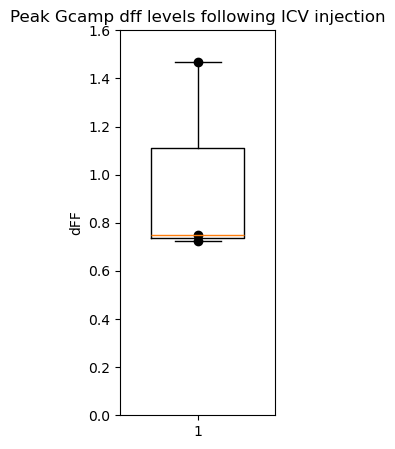

In [2301]:
%matplotlib inline
#'#2ca02c','#8c564b'
fig, ax = plt.subplots(figsize=(2,5))
ax.boxplot([ht5i_vals], widths=0.6)
ax.scatter(np.array([1]*(ht5i_vals).shape[0]),(ht5i_vals),color='black')
#ax.scatter(np.array([2]*(np.array(dt505d)/frf).shape[0]),(np.array(dt505d)/frf),color='#2ca02c')
ax.plot()
#ax.hlines(0,xmin=0.5,xmax=2.5,linestyle='dotted',color='black')
#plt.xticks([1,2],['5-HT','5-HT (deconvolved)'])#['5HT-NE $t _{1/2}$'])
ax.set_ylabel('dFF')
ax.set_title('Peak Gcamp dff levels following ICV injection')
ax.set_ylim(0,1.6)

#for i in range(len(np.vstack((np.array(dt505),np.array(dt505d))).T)):
#    ax.plot([1,2],np.vstack((np.array(dt505)/frf,np.array(dt505d)/frf)).T[i,],marker='none',linestyle='dotted',color='gray')

#print(np.array(dt505)/frf-np.array(dt505d)/frf)
#print(np.mean(np.array(dt505)/frf-np.array(dt505d)/frf)*60)

In [2312]:
ht5i30_vals = np.array(gc_5ht_icv_d_c_i)[:,np.where(gc_5ht_icv_d_t_i>30)[0][0]]
ht5i30_vals

array([0.37742111, 0.25124597, 0.44318618])

(0.0, 1.6)

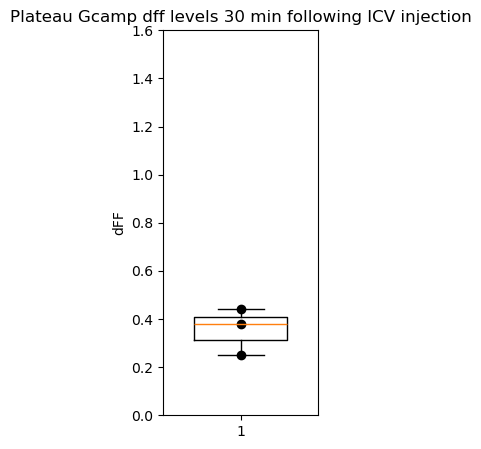

In [2313]:
%matplotlib inline
#'#2ca02c','#8c564b'
fig, ax = plt.subplots(figsize=(2,5))
ax.boxplot([ht5i30_vals], widths=0.6)
ax.scatter(np.array([1]*(ht5i30_vals).shape[0]),(ht5i30_vals),color='black')
#ax.scatter(np.array([2]*(np.array(dt505d)/frf).shape[0]),(np.array(dt505d)/frf),color='#2ca02c')
ax.plot()
#ax.hlines(0,xmin=0.5,xmax=2.5,linestyle='dotted',color='black')
#plt.xticks([1,2],['5-HT','5-HT (deconvolved)'])#['5HT-NE $t _{1/2}$'])
ax.set_ylabel('dFF')
ax.set_title('Plateau Gcamp dff levels 30 min following ICV injection')
ax.set_ylim(0,1.6)

#for i in range(len(np.vstack((np.array(dt505),np.array(dt505d))).T)):
#    ax.plot([1,2],np.vstack((np.array(dt505)/frf,np.array(dt505d)/frf)).T[i,],marker='none',linestyle='dotted',color='gray')

#print(np.array(dt505)/frf-np.array(dt505d)/frf)
#print(np.mean(np.array(dt505)/frf-np.array(dt505d)/frf)*60)

(0.0, 1.6)

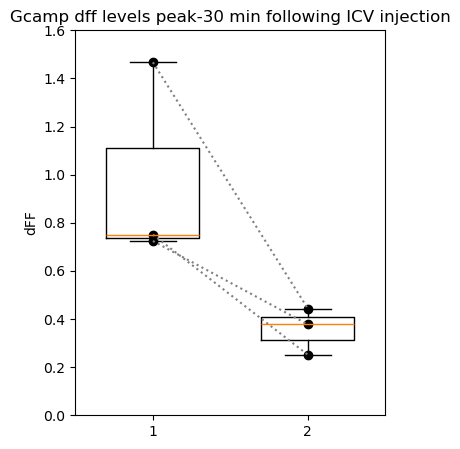

In [2337]:
%matplotlib inline
#'#2ca02c','#8c564b'
fig, ax = plt.subplots(figsize=(4,5))
ax.boxplot([ht5i_vals,ht5i30_vals], widths=0.6)
ax.scatter(np.array([1]*(ht5i_vals).shape[0]),(ht5i_vals),color='black')
ax.scatter(np.array([2]*(ht5i30_vals).shape[0]),(ht5i30_vals),color='black')

for i in range(len(ht5i_vals)):
    ax.plot([1,2],np.vstack((ht5i_vals,ht5i30_vals)).T[i,],marker='none',linestyle='dotted',color='gray')


#ax.scatter(np.array([2]*(np.array(dt505d)/frf).shape[0]),(np.array(dt505d)/frf),color='#2ca02c')
ax.plot()
#ax.hlines(0,xmin=0.5,xmax=2.5,linestyle='dotted',color='black')
#plt.xticks([1,2],['5-HT','5-HT (deconvolved)'])#['5HT-NE $t _{1/2}$'])
ax.set_ylabel('dFF')
ax.set_title('Gcamp dff levels peak-30 min following ICV injection')
ax.set_ylim(0,1.6)

#for i in range(len(np.vstack((np.array(dt505),np.array(dt505d))).T)):
#    ax.plot([1,2],np.vstack((np.array(dt505)/frf,np.array(dt505d)/frf)).T[i,],marker='none',linestyle='dotted',color='gray')

#print(np.array(dt505)/frf-np.array(dt505d)/frf)
#print(np.mean(np.array(dt505)/frf-np.array(dt505d)/frf)*60)

In [2304]:
ht5i_taus = []
for i in range(ht5i_vals.shape[0]):
    ht5i_taus.append(np.min(np.where(np.array(gc_5ht_icv_d_c_i)[i,:]>ht5i_vals[i]*(1-(1/np.e)))[0]))
ht5i_taus

[223, 214, 214]

(0.0, 5.0)

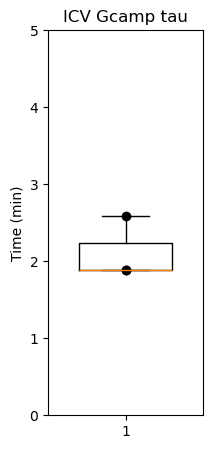

In [2305]:
%matplotlib inline
#'#2ca02c','#8c564b'
fig, ax = plt.subplots(figsize=(2,5))
ax.boxplot([gc_5ht_icv_d_t_i[ht5i_taus]], widths=0.6)
ax.scatter(np.array([1]*(gc_5ht_icv_d_t_i[ht5i_taus]).shape[0]),(gc_5ht_icv_d_t_i[ht5i_taus]),color='black')
#ax.scatter(np.array([2]*(np.array(dt505d)/frf).shape[0]),(np.array(dt505d)/frf),color='#2ca02c')
ax.plot()
#ax.hlines(0,xmin=0.5,xmax=2.5,linestyle='dotted',color='black')
#plt.xticks([1,2],['5-HT','5-HT (deconvolved)'])#['5HT-NE $t _{1/2}$'])
ax.set_ylabel('Time (min)')
ax.set_title('ICV Gcamp tau')
ax.set_ylim(0,5)

#for i in range(len(np.vstack((np.array(dt505),np.array(dt505d))).T)):
#    ax.plot([1,2],np.vstack((np.array(dt505)/frf,np.array(dt505d)/frf)).T[i,],marker='none',linestyle='dotted',color='gray')

#print(np.array(dt505)/frf-np.array(dt505d)/frf)
#print(np.mean(np.array(dt505)/frf-np.array(dt505d)/frf)*60)

In [1704]:
gc_5ht_ip_d_c = []
gc_5ht_ip_d_t = []
for l in range(len(np.where(d_all_params_clean[...,-2]==1)[0].tolist())):
    tvals = t_all[1][l]
    minbase = 25
    minpost = 125
    f0_range = 15
    ons = np.where(tvals==0)[0][0]
    mb = np.max(np.where(tvals<-minbase)[0])+1
    mp = np.min(np.where(tvals>minpost)[0])
    fr = np.max(np.where(tvals<-f0_range)[0])+1
    data = d_all_clean[np.where(d_all_params_clean[...,-2]==1)[0].tolist()[l]][mb:mp]
    f0 = np.mean(d_all_bg_clean[np.where(d_all_params_clean[...,-2]==1)[0].tolist()[l]][fr:ons])
    gc_5ht_ip_d_c.append(data/f0)
    gc_5ht_ip_d_t.append(tvals[mb:mp])
gc_5ht_ip_d_c_i = []
gc_5ht_ip_d_t_i = gc_5ht_ip_d_t[[len(x) for x in gc_5ht_ip_d_t].index(np.max([len(x) for x in gc_5ht_ip_d_t]))]
for l in range(len(gc_5ht_ip_d_c)):
    gc_5ht_ip_d_c_i.append(np.interp(gc_5ht_ip_d_t_i,gc_5ht_ip_d_t[l],gc_5ht_ip_d_c[l]))

In [1760]:
len(gc_5ht_ip_d_t_i)

2084

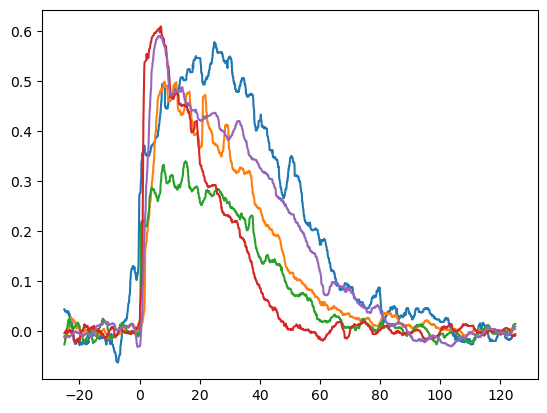

In [1763]:
plt.plot(gc_5ht_ip_d_t_i,np.array([gc_5ht_ip_d_c_i[i] for i in [0,1,2,3,5]]).T)

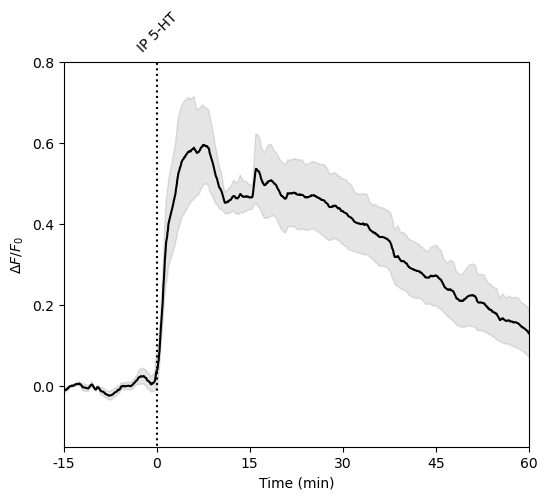

In [1773]:
%matplotlib inline
fig, ax = plt.subplots(figsize=(6,5))

#ax.plot(gc_5ht_icv_d_t_i,np.array(gc_5ht_icv_d_c_i).T,color='#2ca02c',alpha=0.3)
ax.plot(gc_5ht_ip_d_t_i,np.mean(np.array(gc_5ht_ip_d_c_i).T,axis=1),color='black')
ax.vlines(x=0,ymin=-1,ymax=2,color='black',linestyle='dotted')
#ax.vlines(x=3,ymin=-1,ymax=2,color='black',linestyle='dotted')
#ax.fill_between(x=[0,3],y1=-1,y2=2,alpha=0.2,color='forestgreen')

ci = np.std(np.array(gc_5ht_ip_d_c_i).T,axis=1)/np.sqrt(np.array(gc_5ht_ip_d_c_i).T.shape[1])
#fig, ax = plt.subplots(figsize=(6,5))
#ax.plot(tvals,np.mean(np.array(data_ip_oxt_oxts_sum).T,axis=1),color='#ff7f0e')
ax.fill_between(gc_5ht_ip_d_t_i,(np.mean(np.array(gc_5ht_ip_d_c_i).T,axis=1)-ci), (np.mean(np.array(gc_5ht_ip_d_c_i).T,axis=1)+ci), color='black', alpha=.1)


ax.set_xlim(-15,60)
ax.set_ylim(-0.15,0.8)
ax.set_xlabel('Time (min)')
ax.set_ylabel('$\Delta F/F _0$')
ax.set_xticks(15*np.arange(6)-15,  15*np.arange(6)-15)
ax.set_xticks([0.1],  ['IP 5-HT'],rotation=45,minor=True)
ax.tick_params(labeltop=True,bottom=False,labelbottom=False,which='minor')
ax.tick_params(labeltop=False,top=False,bottom=True,labelbottom=True)

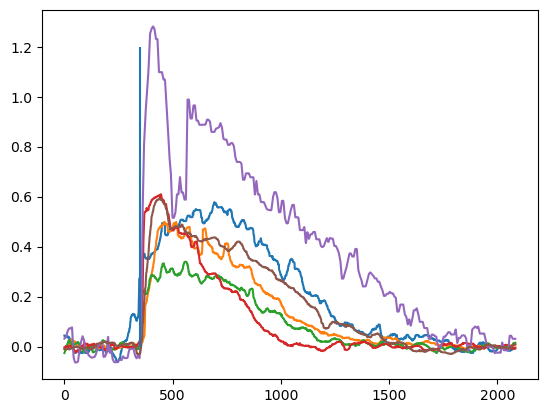

In [2032]:
plt.plot(np.array(gc_5ht_ip_d_c_i).T)
plt.vlines(x=350,ymin=0,ymax=1.2)
#plt.vlines(x=38000,ymin=0,ymax=0.3)

In [1993]:
ht5_vals = np.max(np.array(gc_5ht_ip_d_c_i),axis=1)
ht5_vals

array([0.57797144, 0.49919132, 0.33992814, 0.60930493, 1.28111136,
       0.59064469])

C:\ProgramData\miniconda3\envs\caiman_curation\lib\site-packages\IPython\core\displayhook.py:281: UserWarning: Output cache limit (currently 1000 entries) hit.
Flushing oldest 200 entries.
  warn('Output cache limit (currently {sz} entries) hit.\n'


(0.0, 1.6)

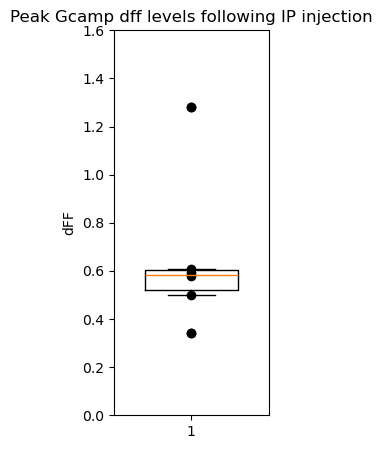

In [2339]:
%matplotlib inline
#'#2ca02c','#8c564b'
fig, ax = plt.subplots(figsize=(2,5))
ax.boxplot([ht5_vals], widths=0.6)
ax.scatter(np.array([1]*(ht5_vals).shape[0]),(ht5_vals),color='black')
#ax.scatter(np.array([2]*(np.array(dt505d)/frf).shape[0]),(np.array(dt505d)/frf),color='#2ca02c')
ax.plot()
#ax.hlines(0,xmin=0.5,xmax=2.5,linestyle='dotted',color='black')
#plt.xticks([1,2],['5-HT','5-HT (deconvolved)'])#['5HT-NE $t _{1/2}$'])
ax.set_ylabel('dFF')
ax.set_title('Peak Gcamp dff levels following IP injection')
ax.set_ylim(0,1.6)

#for i in range(len(np.vstack((np.array(dt505),np.array(dt505d))).T)):
#    ax.plot([1,2],np.vstack((np.array(dt505)/frf,np.array(dt505d)/frf)).T[i,],marker='none',linestyle='dotted',color='gray')

#print(np.array(dt505)/frf-np.array(dt505d)/frf)
#print(np.mean(np.array(dt505)/frf-np.array(dt505d)/frf)*60)

In [1990]:
ht5_taus = []
for i in range(ht5_vals.shape[0]):
    ht5_taus.append(np.min(np.where(np.array(gc_5ht_ip_d_c_i)[i,:]>ht5_vals[i]*(1-(1/np.e)))[0]))
ht5_taus

[366, 408, 355, 365, 369, 389]

In [1991]:
gc_5ht_ip_d_t_i[ht5_taus]

array([1.3680551, 4.392177 , 0.5760232, 1.2960522, 1.5840639, 3.024122 ],
      dtype=float32)

(0.0, 5.0)

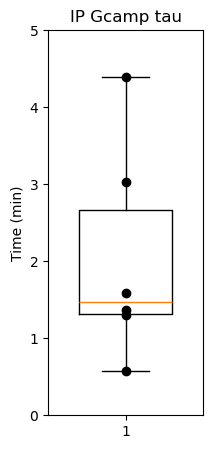

In [2341]:
%matplotlib inline
#'#2ca02c','#8c564b'
fig, ax = plt.subplots(figsize=(2,5))
ax.boxplot([gc_5ht_ip_d_t_i[ht5_taus]], widths=0.6)
ax.scatter(np.array([1]*(gc_5ht_ip_d_t_i[ht5_taus]).shape[0]),(gc_5ht_ip_d_t_i[ht5_taus]),color='black')
#ax.scatter(np.array([2]*(np.array(dt505d)/frf).shape[0]),(np.array(dt505d)/frf),color='#2ca02c')
ax.plot()
#ax.hlines(0,xmin=0.5,xmax=2.5,linestyle='dotted',color='black')
#plt.xticks([1,2],['5-HT','5-HT (deconvolved)'])#['5HT-NE $t _{1/2}$'])
ax.set_ylabel('Time (min)')
ax.set_title('IP Gcamp tau')
ax.set_ylim(0,5)

#for i in range(len(np.vstack((np.array(dt505),np.array(dt505d))).T)):
#    ax.plot([1,2],np.vstack((np.array(dt505)/frf,np.array(dt505d)/frf)).T[i,],marker='none',linestyle='dotted',color='gray')

#print(np.array(dt505)/frf-np.array(dt505d)/frf)
#print(np.mean(np.array(dt505)/frf-np.array(dt505d)/frf)*60)

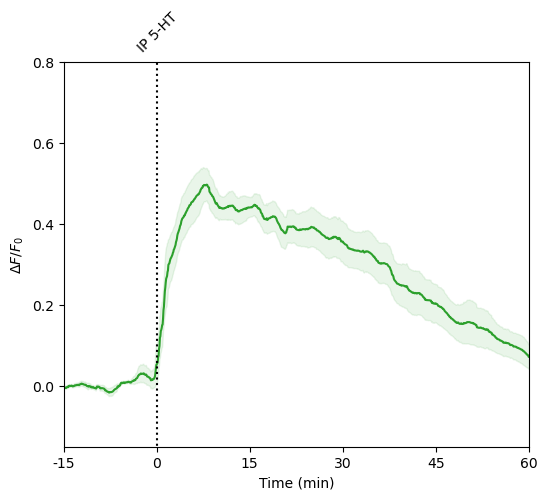

In [1766]:
%matplotlib inline
fig, ax = plt.subplots(figsize=(6,5))

#ax.plot(gc_5ht_icv_d_t_i,np.array(gc_5ht_icv_d_c_i).T,color='#2ca02c',alpha=0.3)
ax.plot(gc_5ht_ip_d_t_i,np.mean(np.array([gc_5ht_ip_d_c_i[i] for i in [0,1,2,3,5]]).T,axis=1),color='#2ca02c')
ax.vlines(x=0,ymin=-1,ymax=2,color='black',linestyle='dotted')
#ax.vlines(x=3,ymin=-1,ymax=2,color='black',linestyle='dotted')
#ax.fill_between(x=[0,3],y1=-1,y2=2,alpha=0.2,color='forestgreen')

ci = np.std(np.array([gc_5ht_ip_d_c_i[i] for i in [0,1,2,3,5]]).T,axis=1)/np.sqrt(np.array([gc_5ht_ip_d_c_i[i] for i in [0,1,2,3,5]]).T.shape[1])
#fig, ax = plt.subplots(figsize=(6,5))
#ax.plot(tvals,np.mean(np.array(data_ip_oxt_oxts_sum).T,axis=1),color='#ff7f0e')
ax.fill_between(gc_5ht_ip_d_t_i,(np.mean(np.array([gc_5ht_ip_d_c_i[i] for i in [0,1,2,3,5]]).T,axis=1)-ci), (np.mean(np.array([gc_5ht_ip_d_c_i[i] for i in [0,1,2,3,5]]).T,axis=1)+ci), color='#2ca02c', alpha=.1)


ax.set_xlim(-15,60)
ax.set_ylim(-0.15,0.8)
ax.set_xlabel('Time (min)')
ax.set_ylabel('$\Delta F/F _0$')
ax.set_xticks(15*np.arange(6)-15,  15*np.arange(6)-15)
ax.set_xticks([0.1],  ['IP 5-HT'],rotation=45,minor=True)
ax.tick_params(labeltop=True,bottom=False,labelbottom=False,which='minor')
ax.tick_params(labeltop=False,top=False,bottom=True,labelbottom=True)

In [1657]:
gr_5ht_icv_d_c = []
gr_5ht_icv_d_t = []
for l in range(len(np.where(d_all_params_clean[...,-2]==2)[0].tolist())):
    tvals = t_all[2][l]
    minbase = 30
    minpost = 90
    f0_range = 15
    ons = np.where(tvals==0)[0][0]
    mb = np.max(np.where(tvals<-minbase)[0])+1
    mp = np.min(np.where(tvals>minpost)[0])
    fr = np.max(np.where(tvals<-f0_range)[0])+1
    data = d_all_clean[np.where(d_all_params_clean[...,-2]==2)[0].tolist()[l]][mb:mp]
    f0 = np.mean(d_all_bg_clean[np.where(d_all_params_clean[...,-2]==2)[0].tolist()[l]][fr:ons])
    gr_5ht_icv_d_c.append(data/f0)
    gr_5ht_icv_d_t.append(tvals[mb:mp])
gr_5ht_icv_d_c_i = []
gr_5ht_icv_d_t_i = gr_5ht_icv_d_t[[len(x) for x in gr_5ht_icv_d_t].index(np.max([len(x) for x in gr_5ht_icv_d_t]))]
for l in range(len(gr_5ht_icv_d_c)):
    gr_5ht_icv_d_c_i.append(np.interp(gr_5ht_icv_d_t_i,gr_5ht_icv_d_t[l],gr_5ht_icv_d_c[l]))

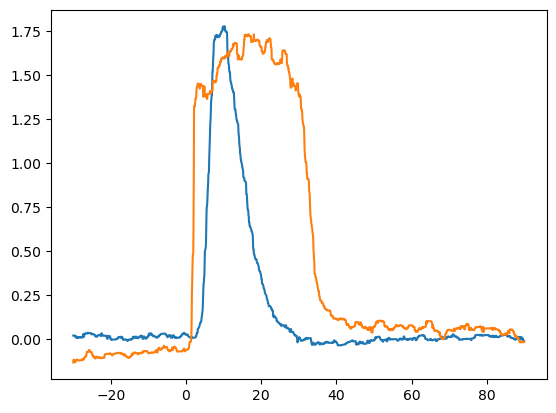

In [1658]:
plt.plot(gr_5ht_icv_d_t_i,np.array(gr_5ht_icv_d_c_i).T)

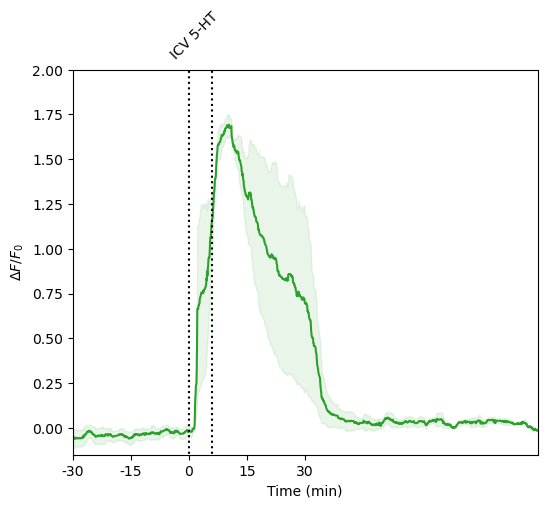

In [1664]:
%matplotlib inline
fig, ax = plt.subplots(figsize=(6,5))

#ax.plot(gc_5ht_icv_d_t_i,np.array(gc_5ht_icv_d_c_i).T,color='#2ca02c',alpha=0.3)
ax.plot(gr_5ht_icv_d_t_i,np.mean(np.array(gr_5ht_icv_d_c_i).T,axis=1),color='#2ca02c')
ax.vlines(x=0,ymin=-1,ymax=2,color='black',linestyle='dotted')
ax.vlines(x=6,ymin=-1,ymax=2,color='black',linestyle='dotted')
#ax.fill_between(x=[0,3],y1=-1,y2=2,alpha=0.2,color='forestgreen')

ci = np.std(np.array(gr_5ht_icv_d_c_i).T,axis=1)/np.sqrt(np.array(gr_5ht_icv_d_c_i).T.shape[1])
#fig, ax = plt.subplots(figsize=(6,5))
#ax.plot(tvals,np.mean(np.array(data_ip_oxt_oxts_sum).T,axis=1),color='#ff7f0e')
ax.fill_between(gr_5ht_icv_d_t_i,(np.mean(np.array(gr_5ht_icv_d_c_i).T,axis=1)-ci), (np.mean(np.array(gr_5ht_icv_d_c_i).T,axis=1)+ci), color='#2ca02c', alpha=.1)


ax.set_xlim(-30,90)
ax.set_ylim(-0.15,2)
ax.set_xlabel('Time (min)')
ax.set_ylabel('$\Delta F/F _0$')
ax.set_xticks(15*np.arange(5)-30,  15*np.arange(5)-30)
ax.set_xticks([1.5],  ['ICV 5-HT'],rotation=45,minor=True)
ax.tick_params(labeltop=True,bottom=False,labelbottom=False,which='minor')
ax.tick_params(labeltop=False,top=False,bottom=True,labelbottom=True)

In [1688]:
gr_5ht_ip_d_c = []
gr_5ht_ip_d_t = []
for l in range(len(np.where(d_all_params_clean[...,-2]==3)[0].tolist())):
    tvals = t_all[3][l]
    minbase = 25
    minpost = 60
    f0_range = 15
    ons = np.where(tvals==0)[0][0]
    mb = np.max(np.where(tvals<-minbase)[0])+1
    mp = np.min(np.where(tvals>minpost)[0])
    fr = np.max(np.where(tvals<-f0_range)[0])+1
    data = d_all_clean[np.where(d_all_params_clean[...,-2]==3)[0].tolist()[l]][mb:mp]
    f0 = np.mean(d_all_bg_clean[np.where(d_all_params_clean[...,-2]==3)[0].tolist()[l]][fr:ons])
    gr_5ht_ip_d_c.append(data/f0)
    gr_5ht_ip_d_t.append(tvals[mb:mp])
gr_5ht_ip_d_c_i = []
gr_5ht_ip_d_t_i = gr_5ht_ip_d_t[[len(x) for x in gr_5ht_ip_d_t].index(np.max([len(x) for x in gr_5ht_ip_d_t]))]
for l in range(len(gr_5ht_ip_d_c)):
    gr_5ht_ip_d_c_i.append(np.interp(gr_5ht_ip_d_t_i,gr_5ht_ip_d_t[l],gr_5ht_ip_d_c[l]))

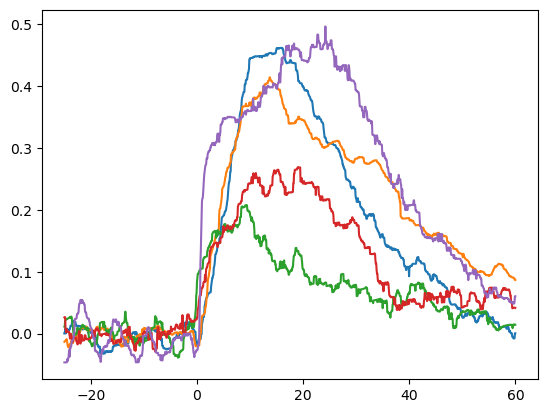

In [1689]:
plt.plot(gr_5ht_ip_d_t_i,np.array(gr_5ht_ip_d_c_i).T)

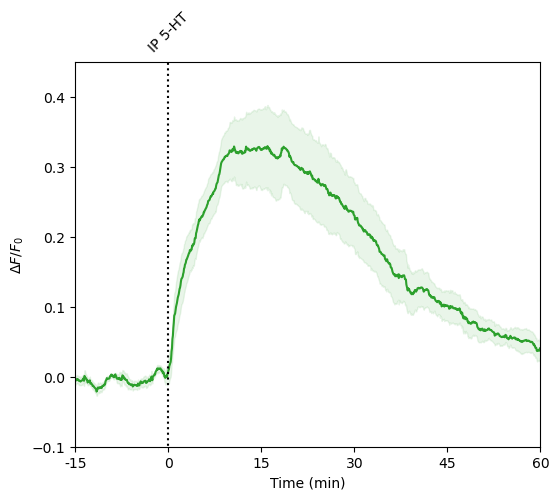

In [1712]:
%matplotlib inline
fig, ax = plt.subplots(figsize=(6,5))

#ax.plot(gc_5ht_icv_d_t_i,np.array(gc_5ht_icv_d_c_i).T,color='#2ca02c',alpha=0.3)
ax.plot(gr_5ht_ip_d_t_i,np.mean(np.array(gr_5ht_ip_d_c_i).T,axis=1),color='#2ca02c')
ax.vlines(x=0,ymin=-1,ymax=2,color='black',linestyle='dotted')
#ax.vlines(x=3,ymin=-1,ymax=2,color='black',linestyle='dotted')
#ax.fill_between(x=[0,3],y1=-1,y2=2,alpha=0.2,color='forestgreen')

ci = np.std(np.array(gr_5ht_ip_d_c_i).T,axis=1)/np.sqrt(np.array(gr_5ht_ip_d_c_i).T.shape[1])
#fig, ax = plt.subplots(figsize=(6,5))
#ax.plot(tvals,np.mean(np.array(data_ip_oxt_oxts_sum).T,axis=1),color='#ff7f0e')
ax.fill_between(gr_5ht_ip_d_t_i,(np.mean(np.array(gr_5ht_ip_d_c_i).T,axis=1)-ci), (np.mean(np.array(gr_5ht_ip_d_c_i).T,axis=1)+ci), color='#2ca02c', alpha=.1)


ax.set_xlim(-15,60)
ax.set_ylim(-0.1,0.45)
ax.set_xlabel('Time (min)')
ax.set_ylabel('$\Delta F/F _0$')
ax.set_xticks(15*np.arange(6)-15,  15*np.arange(6)-15)
ax.set_xticks([0.1],  ['IP 5-HT'],rotation=45,minor=True)
ax.tick_params(labeltop=True,bottom=False,labelbottom=False,which='minor')
ax.tick_params(labeltop=False,top=False,bottom=True,labelbottom=True)

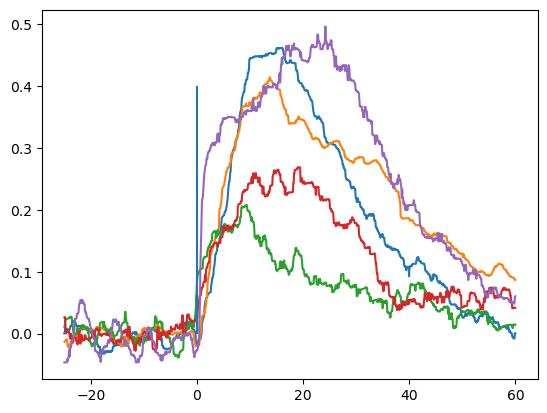

In [1996]:
plt.plot(gr_5ht_ip_d_t_i,np.array(gr_5ht_ip_d_c_i).T)
plt.vlines(x=0,ymin=0,ymax=0.4)
#plt.vlines(x=38000,ymin=0,ymax=0.3)

In [1997]:
ht5_vals_gr = np.max(np.array(gr_5ht_ip_d_c_i),axis=1)
ht5_vals_gr

array([0.46210171, 0.41439083, 0.2080035 , 0.26919211, 0.49675838])

In [2352]:
%matplotlib inline
#'#2ca02c','#8c564b'
fig, ax = plt.subplots(figsize=(1.5,5))
ax.boxplot([ht5_vals_gr], widths=0.8)
ax.scatter(np.array([1]*(ht5_vals_gr).shape[0]),(ht5_vals_gr),color='#2ca02c')
#ax.scatter(np.array([2]*(np.array(dt505d)/frf).shape[0]),(np.array(dt505d)/frf),color='#2ca02c')
ax.plot()
#ax.hlines(0,xmin=0.5,xmax=2.5,linestyle='dotted',color='black')
#plt.xticks([1,2],['5-HT','5-HT (deconvolved)'])#['5HT-NE $t _{1/2}$'])
ax.set_ylabel('dFF')
ax.set_title('In vivo 5HT dff levels following IP injection')
ax.set_ylim(0,0.6)

#for i in range(len(np.vstack((np.array(dt505),np.array(dt505d))).T)):
#    ax.plot([1,2],np.vstack((np.array(dt505)/frf,np.array(dt505d)/frf)).T[i,],marker='none',linestyle='dotted',color='gray')

#print(np.array(dt505)/frf-np.array(dt505d)/frf)
#print(np.mean(np.array(dt505)/frf-np.array(dt505d)/frf)*60)

(0.0, 0.6)

In [2000]:
ht5_taus_gr = []
for i in range(ht5_vals_gr.shape[0]):
    ht5_taus_gr.append(np.min(np.where(np.array(gr_5ht_ip_d_c_i)[i,:]>ht5_vals_gr[i]*(1-(1/np.e)))[0]))
ht5_taus_gr

[441, 424, 374, 416, 400]

In [2001]:
gr_5ht_ip_d_t_i[ht5_taus_gr]

array([6.768273 , 5.5442233, 1.9440783, 4.9682   , 3.8161538],
      dtype=float32)

(0.0, 10.0)

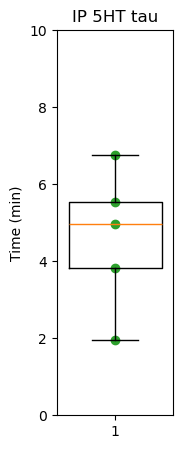

In [2354]:
%matplotlib inline
#'#2ca02c','#8c564b'
fig, ax = plt.subplots(figsize=(1.5,5))
ax.boxplot([gr_5ht_ip_d_t_i[ht5_taus_gr]], widths=0.8)
ax.scatter(np.array([1]*(gr_5ht_ip_d_t_i[ht5_taus_gr]).shape[0]),(gr_5ht_ip_d_t_i[ht5_taus_gr]),color='#2ca02c')
#ax.scatter(np.array([2]*(np.array(dt505d)/frf).shape[0]),(np.array(dt505d)/frf),color='#2ca02c')
ax.plot()
#ax.hlines(0,xmin=0.5,xmax=2.5,linestyle='dotted',color='black')
#plt.xticks([1,2],['5-HT','5-HT (deconvolved)'])#['5HT-NE $t _{1/2}$'])
ax.set_ylabel('Time (min)')
ax.set_title('IP 5HT tau')
ax.set_ylim(0,10)

#for i in range(len(np.vstack((np.array(dt505),np.array(dt505d))).T)):
#    ax.plot([1,2],np.vstack((np.array(dt505)/frf,np.array(dt505d)/frf)).T[i,],marker='none',linestyle='dotted',color='gray')

#print(np.array(dt505)/frf-np.array(dt505d)/frf)
#print(np.mean(np.array(dt505)/frf-np.array(dt505d)/frf)*60)

In [1690]:
gr_avp_ip_d_c = []
gr_avp_ip_d_t = []
for l in range(len(np.where(d_all_params_clean[...,-2]==4)[0].tolist())):
    tvals = t_all[4][l]
    minbase = 15
    minpost = 90
    f0_range = 15
    ons = np.where(tvals==0)[0][0]
    mb = np.max(np.where(tvals<-minbase)[0])+1
    mp = np.min(np.where(tvals>minpost)[0])
    fr = np.max(np.where(tvals<-f0_range)[0])+1
    data = d_all_clean[np.where(d_all_params_clean[...,-2]==4)[0].tolist()[l]][mb:mp]
    f0 = np.mean(d_all_bg_clean[np.where(d_all_params_clean[...,-2]==4)[0].tolist()[l]][fr:ons])
    gr_avp_ip_d_c.append(data/f0)
    gr_avp_ip_d_t.append(tvals[mb:mp])
gr_avp_ip_d_c_i = []
gr_avp_ip_d_t_i = gr_avp_ip_d_t[[len(x) for x in gr_avp_ip_d_t].index(np.max([len(x) for x in gr_avp_ip_d_t]))]
for l in range(len(gr_avp_ip_d_c)):
    gr_avp_ip_d_c_i.append(np.interp(gr_avp_ip_d_t_i,gr_avp_ip_d_t[l],gr_avp_ip_d_c[l]))

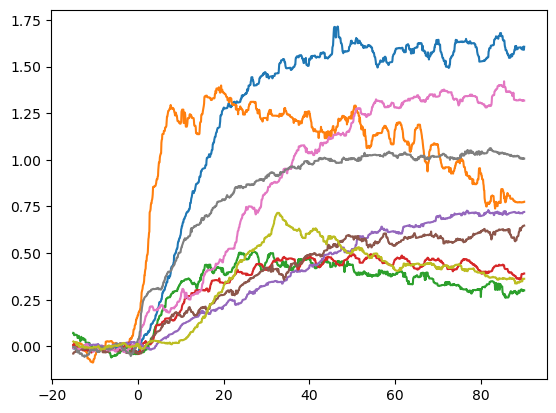

In [1691]:
plt.plot(gr_avp_ip_d_t_i,np.array(gr_avp_ip_d_c_i).T)

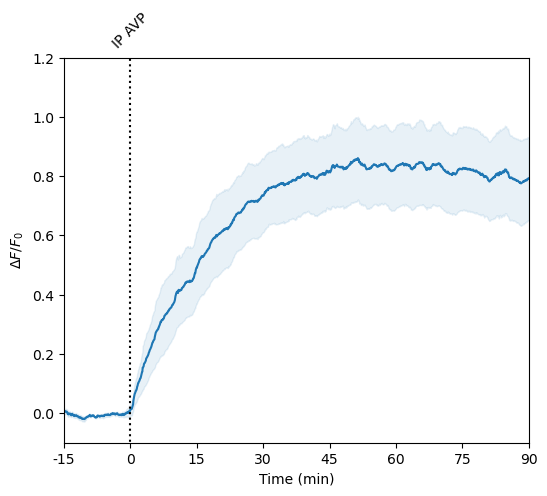

In [1714]:
%matplotlib inline
fig, ax = plt.subplots(figsize=(6,5))

#ax.plot(gc_5ht_icv_d_t_i,np.array(gc_5ht_icv_d_c_i).T,color='#2ca02c',alpha=0.3)
ax.plot(gr_avp_ip_d_t_i,np.mean(np.array(gr_avp_ip_d_c_i).T,axis=1),color='#1f77b4')
ax.vlines(x=0,ymin=-1,ymax=2,color='black',linestyle='dotted')
#ax.vlines(x=3,ymin=-1,ymax=2,color='black',linestyle='dotted')
#ax.fill_between(x=[0,3],y1=-1,y2=2,alpha=0.2,color='forestgreen')

ci = np.std(np.array(gr_avp_ip_d_c_i).T,axis=1)/np.sqrt(np.array(gr_avp_ip_d_c_i).T.shape[1])
#fig, ax = plt.subplots(figsize=(6,5))
#ax.plot(tvals,np.mean(np.array(data_ip_oxt_oxts_sum).T,axis=1),color='#ff7f0e')
ax.fill_between(gr_avp_ip_d_t_i,(np.mean(np.array(gr_avp_ip_d_c_i).T,axis=1)-ci), (np.mean(np.array(gr_avp_ip_d_c_i).T,axis=1)+ci), color='#1f77b4', alpha=.1)


ax.set_xlim(-15,90)
ax.set_ylim(-0.1,1.2)
ax.set_xlabel('Time (min)')
ax.set_ylabel('$\Delta F/F _0$')
ax.set_xticks(15*np.arange(8)-15,  15*np.arange(8)-15)
ax.set_xticks([0.1],  ['IP AVP'],rotation=45,minor=True)
ax.tick_params(labeltop=True,bottom=False,labelbottom=False,which='minor')
ax.tick_params(labeltop=False,top=False,bottom=True,labelbottom=True)

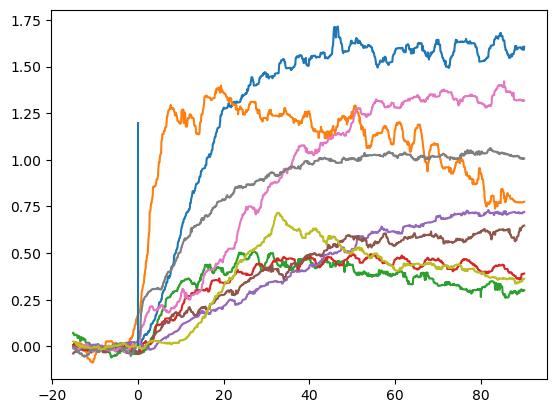

In [2004]:
plt.plot(gr_avp_ip_d_t_i,np.array(gr_avp_ip_d_c_i).T)
plt.vlines(x=0,ymin=0,ymax=1.2)
#plt.vlines(x=38000,ymin=0,ymax=0.3)

In [2005]:
avp_vals_gr = np.max(np.array(gr_avp_ip_d_c_i),axis=1)
avp_vals_gr

array([1.71455631, 1.39834536, 0.50594275, 0.49463478, 0.73114933,
       0.64751285, 1.42062904, 1.06147471, 0.7155067 ])

(0.0, 1.8)

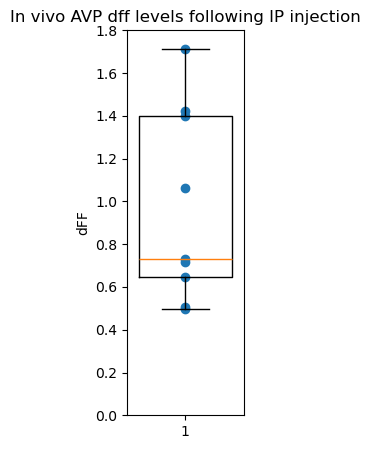

In [2356]:
%matplotlib inline
#'#2ca02c','#8c564b'
fig, ax = plt.subplots(figsize=(1.5,5))
ax.boxplot([avp_vals_gr], widths=0.8)
ax.scatter(np.array([1]*(avp_vals_gr).shape[0]),(avp_vals_gr),color='#1f77b4')
#ax.scatter(np.array([2]*(np.array(dt505d)/frf).shape[0]),(np.array(dt505d)/frf),color='#2ca02c')
ax.plot()
#ax.hlines(0,xmin=0.5,xmax=2.5,linestyle='dotted',color='black')
#plt.xticks([1,2],['5-HT','5-HT (deconvolved)'])#['5HT-NE $t _{1/2}$'])
ax.set_ylabel('dFF')
ax.set_title('In vivo AVP dff levels following IP injection')
ax.set_ylim(0,1.8)

#for i in range(len(np.vstack((np.array(dt505),np.array(dt505d))).T)):
#    ax.plot([1,2],np.vstack((np.array(dt505)/frf,np.array(dt505d)/frf)).T[i,],marker='none',linestyle='dotted',color='gray')

#print(np.array(dt505)/frf-np.array(dt505d)/frf)
#print(np.mean(np.array(dt505)/frf-np.array(dt505d)/frf)*60)

In [2007]:
avp_taus_gr = []
for i in range(avp_vals_gr.shape[0]):
    avp_taus_gr.append(np.min(np.where(np.array(gr_avp_ip_d_c_i)[i,:]>avp_vals_gr[i]*(1-(1/np.e)))[0]))
avp_taus_gr

[452, 269, 341, 443, 804, 615, 668, 413, 538]

In [2008]:
gr_avp_ip_d_t_i[avp_taus_gr]

array([17.567982 ,  4.3919954,  9.57599  , 16.919981 , 42.911953 ,
       29.303968 , 33.119965 , 14.759984 , 23.759974 ], dtype=float32)

(0.0, 45.0)

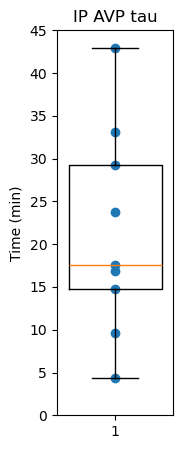

In [2358]:
%matplotlib inline
#'#2ca02c','#8c564b'
fig, ax = plt.subplots(figsize=(1.5,5))
ax.boxplot([gr_avp_ip_d_t_i[avp_taus_gr]], widths=0.8)
ax.scatter(np.array([1]*(gr_avp_ip_d_t_i[avp_taus_gr]).shape[0]),(gr_avp_ip_d_t_i[avp_taus_gr]),color='#1f77b4')
#ax.scatter(np.array([2]*(np.array(dt505d)/frf).shape[0]),(np.array(dt505d)/frf),color='#2ca02c')
ax.plot()
#ax.hlines(0,xmin=0.5,xmax=2.5,linestyle='dotted',color='black')
#plt.xticks([1,2],['5-HT','5-HT (deconvolved)'])#['5HT-NE $t _{1/2}$'])
ax.set_ylabel('Time (min)')
ax.set_title('IP AVP tau')
ax.set_ylim(0,45)

#for i in range(len(np.vstack((np.array(dt505),np.array(dt505d))).T)):
#    ax.plot([1,2],np.vstack((np.array(dt505)/frf,np.array(dt505d)/frf)).T[i,],marker='none',linestyle='dotted',color='gray')

#print(np.array(dt505)/frf-np.array(dt505d)/frf)
#print(np.mean(np.array(dt505)/frf-np.array(dt505d)/frf)*60)

In [1693]:
gr_oxt_ip_d_c = []
gr_oxt_ip_d_t = []
for l in range(len(np.where(d_all_params_clean[...,-2]==5)[0].tolist())):
    tvals = t_all[5][l]
    minbase = 15
    minpost = 90
    f0_range = 15
    ons = np.where(tvals==0)[0][0]
    mb = np.max(np.where(tvals<-minbase)[0])+1
    mp = np.min(np.where(tvals>minpost)[0])
    fr = np.max(np.where(tvals<-f0_range)[0])+1
    data = d_all_clean[np.where(d_all_params_clean[...,-2]==5)[0].tolist()[l]][mb:mp]
    f0 = np.mean(d_all_bg_clean[np.where(d_all_params_clean[...,-2]==5)[0].tolist()[l]][fr:ons])
    gr_oxt_ip_d_c.append(data/f0)
    gr_oxt_ip_d_t.append(tvals[mb:mp])
gr_oxt_ip_d_c_i = []
gr_oxt_ip_d_t_i = gr_oxt_ip_d_t[[len(x) for x in gr_oxt_ip_d_t].index(np.max([len(x) for x in gr_oxt_ip_d_t]))]
for l in range(len(gr_oxt_ip_d_c)):
    gr_oxt_ip_d_c_i.append(np.interp(gr_oxt_ip_d_t_i,gr_oxt_ip_d_t[l],gr_oxt_ip_d_c[l]))

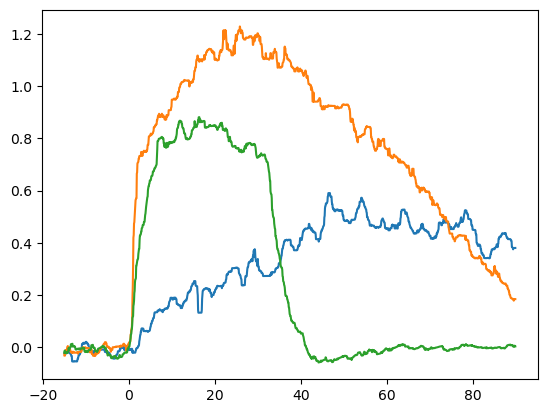

In [1694]:
plt.plot(gr_oxt_ip_d_t_i,np.array(gr_oxt_ip_d_c_i).T)

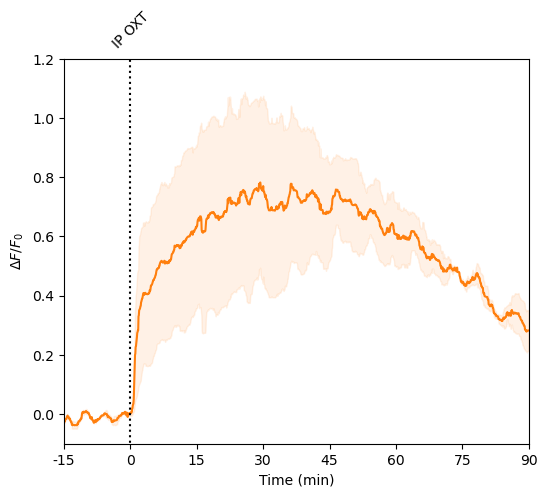

In [1716]:
%matplotlib inline
fig, ax = plt.subplots(figsize=(6,5))

#ax.plot(gc_5ht_icv_d_t_i,np.array(gc_5ht_icv_d_c_i).T,color='#2ca02c',alpha=0.3)
ax.plot(gr_oxt_ip_d_t_i,np.mean(np.array(gr_oxt_ip_d_c_i)[:2,...].T,axis=1),color='#ff7f0e')
ax.vlines(x=0,ymin=-1,ymax=2,color='black',linestyle='dotted')
#ax.vlines(x=3,ymin=-1,ymax=2,color='black',linestyle='dotted')
#ax.fill_between(x=[0,3],y1=-1,y2=2,alpha=0.2,color='forestgreen')

ci = np.std(np.array(gr_oxt_ip_d_c_i)[:2,...].T,axis=1)/np.sqrt(np.array(gr_oxt_ip_d_c_i)[:2,...].T.shape[1])
#fig, ax = plt.subplots(figsize=(6,5))
#ax.plot(tvals,np.mean(np.array(data_ip_oxt_oxts_sum).T,axis=1),color='#ff7f0e')
ax.fill_between(gr_oxt_ip_d_t_i,(np.mean(np.array(gr_oxt_ip_d_c_i)[:2,...].T,axis=1)-ci), (np.mean(np.array(gr_oxt_ip_d_c_i)[:2,...].T,axis=1)+ci), color='#ff7f0e', alpha=.1)


ax.set_xlim(-15,90)
ax.set_ylim(-0.1,1.2)
ax.set_xlabel('Time (min)')
ax.set_ylabel('$\Delta F/F _0$')
ax.set_xticks(15*np.arange(8)-15,  15*np.arange(8)-15)
ax.set_xticks([0.1],  ['IP OXT'],rotation=45,minor=True)
ax.tick_params(labeltop=True,bottom=False,labelbottom=False,which='minor')
ax.tick_params(labeltop=False,top=False,bottom=True,labelbottom=True)

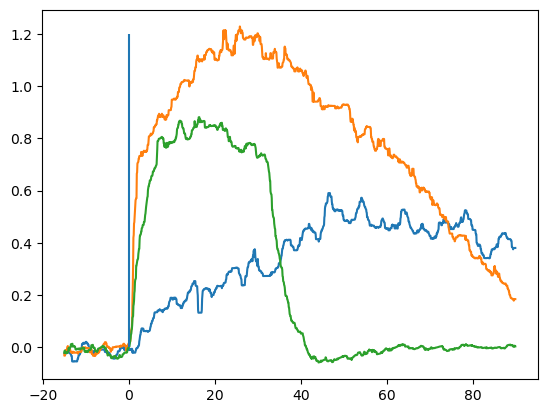

In [2010]:
plt.plot(gr_oxt_ip_d_t_i,np.array(gr_oxt_ip_d_c_i).T)
plt.vlines(x=0,ymin=0,ymax=1.2)
#plt.vlines(x=38000,ymin=0,ymax=0.3)

In [2011]:
oxt_vals_gr = np.max(np.array(gr_oxt_ip_d_c_i),axis=1)
oxt_vals_gr

array([0.59020937, 1.22798371, 0.88101617])

(0.0, 1.8)

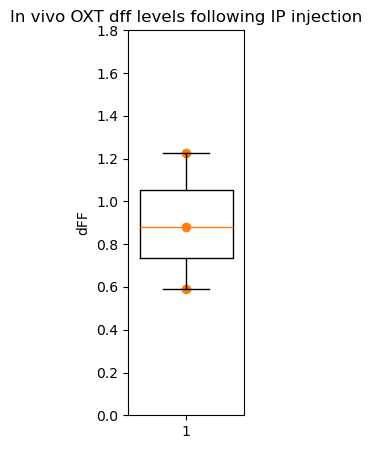

In [2360]:
%matplotlib inline
#'#2ca02c','#8c564b'
fig, ax = plt.subplots(figsize=(1.5,5))
ax.boxplot([oxt_vals_gr], widths=0.8)
ax.scatter(np.array([1]*(oxt_vals_gr).shape[0]),(oxt_vals_gr),color='#ff7f0e')
#ax.scatter(np.array([2]*(np.array(dt505d)/frf).shape[0]),(np.array(dt505d)/frf),color='#2ca02c')
ax.plot()
#ax.hlines(0,xmin=0.5,xmax=2.5,linestyle='dotted',color='black')
#plt.xticks([1,2],['5-HT','5-HT (deconvolved)'])#['5HT-NE $t _{1/2}$'])
ax.set_ylabel('dFF')
ax.set_title('In vivo OXT dff levels following IP injection')
ax.set_ylim(0,1.8)

#for i in range(len(np.vstack((np.array(dt505),np.array(dt505d))).T)):
#    ax.plot([1,2],np.vstack((np.array(dt505)/frf,np.array(dt505d)/frf)).T[i,],marker='none',linestyle='dotted',color='gray')

#print(np.array(dt505)/frf-np.array(dt505d)/frf)
#print(np.mean(np.array(dt505)/frf-np.array(dt505d)/frf)*60)

In [2013]:
oxt_taus_gr = []
for i in range(oxt_vals_gr.shape[0]):
    oxt_taus_gr.append(np.min(np.where(np.array(gr_oxt_ip_d_c_i)[i,:]>oxt_vals_gr[i]*(1-(1/np.e)))[0]))
oxt_taus_gr

[615, 272, 267]

In [2014]:
gr_oxt_ip_d_t_i[oxt_taus_gr]

array([29.305182 ,  4.608186 ,  4.2481713], dtype=float32)

(0.0, 45.0)

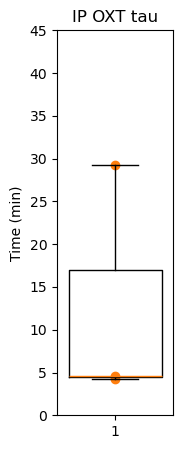

In [2362]:
%matplotlib inline
#'#2ca02c','#8c564b'
fig, ax = plt.subplots(figsize=(1.5,5))
ax.boxplot([gr_oxt_ip_d_t_i[oxt_taus_gr]], widths=0.8)
ax.scatter(np.array([1]*(gr_oxt_ip_d_t_i[oxt_taus_gr]).shape[0]),(gr_oxt_ip_d_t_i[oxt_taus_gr]),color='#ff7f0e')
#ax.scatter(np.array([2]*(np.array(dt505d)/frf).shape[0]),(np.array(dt505d)/frf),color='#2ca02c')
ax.plot()
#ax.hlines(0,xmin=0.5,xmax=2.5,linestyle='dotted',color='black')
#plt.xticks([1,2],['5-HT','5-HT (deconvolved)'])#['5HT-NE $t _{1/2}$'])
ax.set_ylabel('Time (min)')
ax.set_title('IP OXT tau')
ax.set_ylim(0,45)

#for i in range(len(np.vstack((np.array(dt505),np.array(dt505d))).T)):
#    ax.plot([1,2],np.vstack((np.array(dt505)/frf,np.array(dt505d)/frf)).T[i,],marker='none',linestyle='dotted',color='gray')

#print(np.array(dt505)/frf-np.array(dt505d)/frf)
#print(np.mean(np.array(dt505)/frf-np.array(dt505d)/frf)*60)

In [4180]:
# Fig 5 simple 2p traces
from numpy import genfromtxt
dir_nm = r'H:\from_martas_osler'
tr_5ht = genfromtxt(os.path.join(dir_nm,r'5ht_ip.csv'), delimiter=',')
tr_avp = genfromtxt(os.path.join(dir_nm,r'avp_ip.csv'), delimiter=',')
tr_oxt = genfromtxt(os.path.join(dir_nm,r'oxt_ip.csv'), delimiter=',')


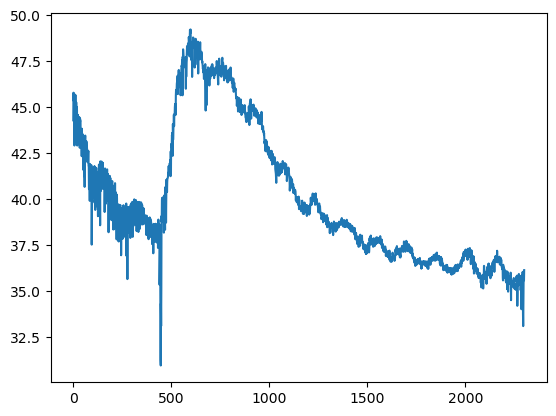

In [4237]:
plt.plot(tr_5ht[...,1])

In [4222]:
data1 = tr_5ht[1:,1]
data2 = tr_avp[1:,1]
data3 = tr_oxt[1:,1]

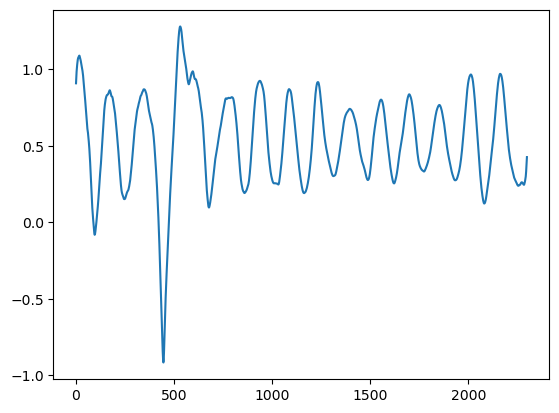

In [4240]:
sample_rate = 15/60
def lowpass(data: np.ndarray, cutoff: float, sample_rate: float, poles: int = 5):
    sos = sg.butter(poles, cutoff, 'lowpass', fs=sample_rate, output='sos')
    filtered_data = scipy.signal.sosfiltfilt(sos, data)
    return filtered_data
def highpass(data: np.ndarray, cutoff: float, sample_rate: float, poles: int = 5):
    sos = sg.butter(poles, cutoff, 'highpass', fs=sample_rate, output='sos')
    filtered_data = scipy.signal.sosfiltfilt(sos, data)
    return filtered_data
def bandpass(data: np.ndarray, cutoff, sample_rate: float, poles: int = 5):
    sos = sg.butter(poles, cutoff, 'bandpass', fs=sample_rate, output='sos')
    filtered_data = scipy.signal.sosfiltfilt(sos, data)
    return filtered_data

times = np.arange(data1.shape[0])/sample_rate #[...,:936]

#filtered = lowpass(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_norm1'][hdbs_invivo.labels_==c,...][...,:2400], 1/600, sample_rate)
#filtered = cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_norm1'][hdbs_invivo.labels_==c,...][...,:2400]-highpass(cnmf_dicts_invivo_ip[l]['CY_mov_matched_raw_corr_norm1'][hdbs_invivo.labels_==c,...][...,:2400], 1/600, sample_rate,1)
filtered = bandpass(data1, [1/900,1/300], sample_rate,1) #[np.argsort(hdbs_invivo.labels_),...]

#from matplotlib import colors
#divnorm=colors.TwoSlopeNorm(vcenter=0)
filtered_sort = np.sort(filtered)
filtered_b10 = np.mean(filtered_sort[:int(np.ceil(filtered_sort.shape[0]/10))]) #[[x for x in np.arange(21).tolist() if x not in oxt_rm],...]
filtered_t10 = np.mean(filtered_sort[-int(np.ceil(filtered_sort.shape[0]/10)):])
filtered_norm1 = ((filtered.T-filtered_b10)/(filtered_t10-filtered_b10)).T
plt.plot(filtered_norm1)#,interpolation='nearest',aspect='auto',cmap='bwr',vmax=1)

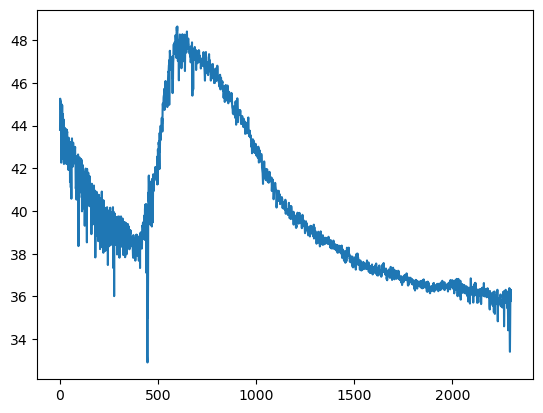

In [4241]:
plt.plot(data1-filtered)

In [4242]:
data1 = data1-filtered
#data2 = data2-filtered
#data3 = data3-filtered

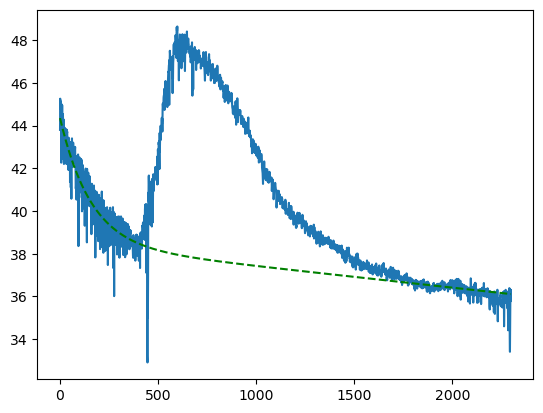

In [4247]:
from scipy.optimize import curve_fit
def func(x, a, b, c, d, e):
    return a * np.exp(-b * (x**c)) + d*x + e

start = 0
end = data2.shape[0]
blstart = 450
blend = 1800
if blstart is not None:
    xdata = np.hstack((np.arange(start,blstart),np.arange(blend,end)))
else:
    xdata = np.arange(start,end)
popt, pcov = curve_fit(func, xdata, data1[xdata], bounds=([0,0,0,-np.inf,-np.inf], [np.inf,np.inf,1,np.inf,np.inf]), max_nfev = data1.shape[0]*10000)
plt.plot(data1.T)
plt.plot(np.arange(data1.shape[0]), func(np.arange(data1.shape[0]), *popt), 'g--',
         label='fit: a=%5.3f, b=%5.3f, c=%5.3f, d=%5.3f, e=%5.3f' % tuple(popt))

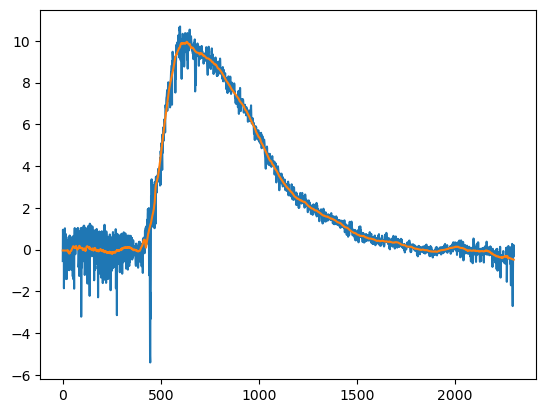

In [4248]:
plt.plot(data1.T-func(np.arange(data1.shape[0]), *popt))
plt.plot(sg.savgol_filter((data1.T-func(np.arange(data1.shape[0]), *popt)),50,1))

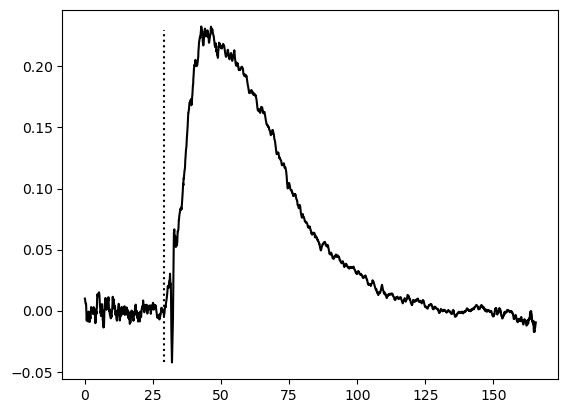

In [4252]:
tvals = (9936.4/(60*2300))*np.arange(data1.shape[0])
plt.plot(tvals,sg.savgol_filter((data1.T-func(np.arange(data1.shape[0]), *popt))/data1[0],10,1),color='black')
plt.vlines(x=29,ymin=np.min(sg.savgol_filter((data1.T-func(np.arange(data1.shape[0]), *popt))/data1[0],10,1)),ymax=np.max(sg.savgol_filter((data1.T-func(np.arange(data1.shape[0]), *popt))/data1[0],20,1)),color='black',linestyle='dotted')

In [4236]:
(9936.4/(60*2300))*450

32.401304347826084

[[-1  0  1  2  3]
 [19  9 23  4 15]]


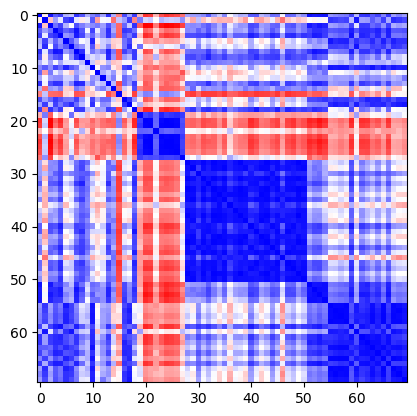

In [1364]:
hdbs_invivo_s = HDBSCAN(min_cluster_size = 3,metric='precomputed')#,cluster_selection_method='leaf')
hdbs_invivo_s.fit(squareform(pdist(f_savs,'correlation'))) #[...,750:4050]
#hdbs.fit(savs_nc)
lcounts_invivo_s = np.array(np.unique(hdbs_invivo_s.labels_, return_counts=True))
print(lcounts_invivo_s)
plt.imshow(squareform(pdist(f_savs[np.argsort(hdbs_invivo_s.labels_),...],'correlation')), interpolation='nearest',cmap='bwr')

In [ ]:
plt.imshow(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_dff'][np.argsort(hdbs_invivo.labels_),...][np.argsort(hdbs_invivo_s.labels_),...], interpolation='nearest', aspect='auto',cmap='bwr',vmin=-0.5,vmax=1)#,vmax=vm) [...,750:4250]

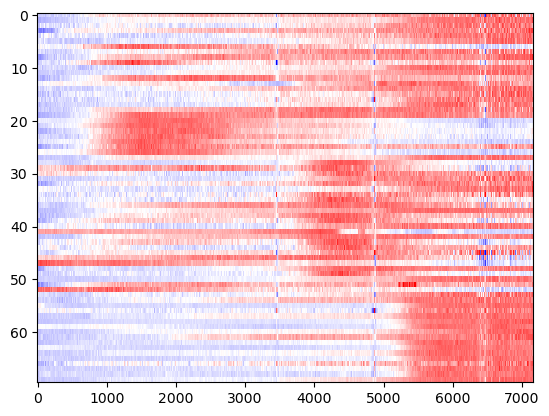

In [1367]:
plt.imshow(cnmf_dicts_invivo_ip[l]['CY_ref_matched_raw_norm1'][np.argsort(hdbs_invivo.labels_),...][np.argsort(hdbs_invivo_s.labels_),...], interpolation='nearest', aspect='auto',cmap='bwr',vmin=-1,vmax=1.5)#,vmax=vm) [...,750:4250]

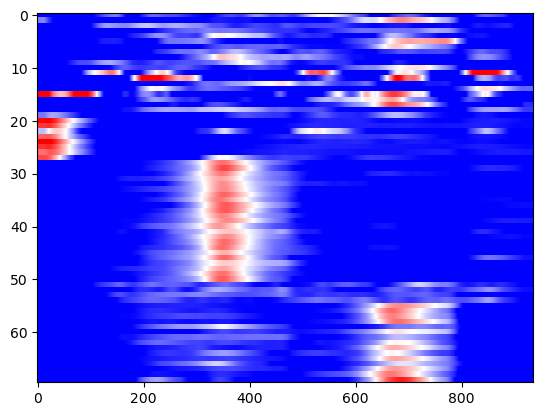

In [1368]:
plt.imshow(f_savs[np.argsort(hdbs_invivo_s.labels_),...],interpolation='nearest',aspect='auto',cmap='bwr',vmin=0,vmax=0.01)

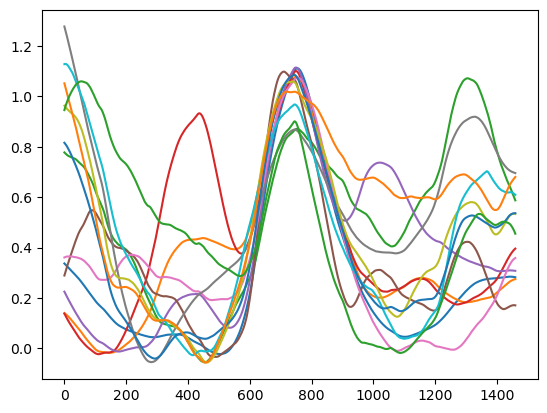

In [1275]:
plt.plot(filtered_norm1.T)

In [4552]:
af

NameError: name 'af' is not defined